In [2]:
%load_ext autoreload
%autoreload 2
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import wandb


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import os
import IPython

# Restart the current kernel
os._exit(00)

: 

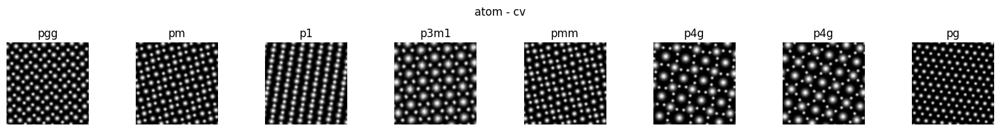

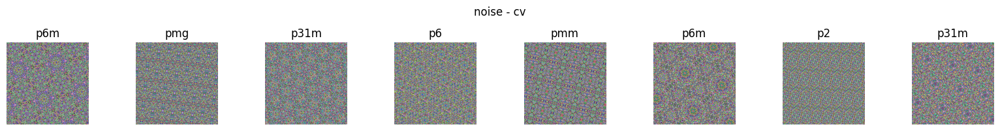

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import wandb

import sys
sys.path.append('../../src/benchmark/')
sys.path.append('../../src/utils/')
from build_model import xcit_small
from utils import split_train_valid, list_to_dict, viz_dataloader, hdf5_dataset
from trainer import Trainer, accuracy

symmetry_classes = ['p1', 'p2', 'pm', 'pg', 'cm', 'pmm', 'pmg', 'pgg', 'cmm', 'p4', 'p4m', 'p4g', 'p3', 'p3m1', 'p31m', 'p6', 'p6m']
label_converter = list_to_dict(symmetry_classes)
bs = 860
n_cpus = 12

# # atom
atom_ds = hdf5_dataset('../../datasets/atom_v5_rot_200k.h5', folder='test', transform=transforms.ToTensor())
atom_dl = DataLoader(atom_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(atom_dl, label_converter=label_converter, title='atom - cv')

# # noise
noise_ds = hdf5_dataset('../../datasets/imagenet_atom_noise_v4_rot_10m_100k_subset.h5', folder='noise', transform=transforms.ToTensor())
noise_dl = DataLoader(noise_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(noise_dl, label_converter=label_converter, title='noise - cv')

### 1K training dataset size 

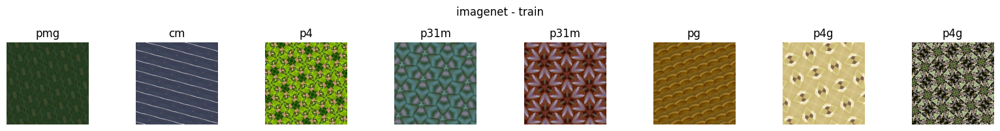

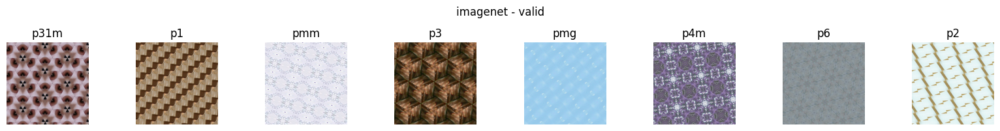

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.9999, seed=42)
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [6]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[0,1,5,6,8,9])
device = torch.device('cuda:0')
# model

torch.Size([2, 17])


In [4]:
config = {'dataset': '1k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09232024-XCiT-dataset_v5_size-1k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [7]:
lr = 1e-3
per_epoch = 800
epoch_start = 0
epochs = 8000
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/8000


100%|██████████| 1/1 [00:10<00:00, 10.55s/it]


train_loss: 3.0243, train_accuracy: 7.23%
Epoch 2/8000


100%|██████████| 1/1 [00:05<00:00,  5.21s/it]


train_loss: 2.8375, train_accuracy: 8.17%
Epoch 3/8000


100%|██████████| 1/1 [00:04<00:00,  4.84s/it]


train_loss: 2.7729, train_accuracy: 10.85%
Epoch 4/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.7387, train_accuracy: 13.30%
Epoch 5/8000


100%|██████████| 1/1 [00:04<00:00,  4.79s/it]


train_loss: 2.7112, train_accuracy: 12.84%
Epoch 6/8000


100%|██████████| 1/1 [00:04<00:00,  4.85s/it]


train_loss: 2.6828, train_accuracy: 14.12%
Epoch 7/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.6578, train_accuracy: 14.82%
Epoch 8/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 2.6398, train_accuracy: 14.59%
Epoch 9/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 2.6220, train_accuracy: 16.22%
Epoch 10/8000


100%|██████████| 1/1 [00:04<00:00,  4.59s/it]


train_loss: 2.6136, train_accuracy: 15.17%
Epoch 11/8000


100%|██████████| 1/1 [00:04<00:00,  4.56s/it]


train_loss: 2.5893, train_accuracy: 16.45%
Epoch 12/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.5786, train_accuracy: 17.39%
Epoch 13/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.5617, train_accuracy: 19.37%
Epoch 14/8000


100%|██████████| 1/1 [00:04<00:00,  4.82s/it]


train_loss: 2.5389, train_accuracy: 20.30%
Epoch 15/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.5301, train_accuracy: 20.77%
Epoch 16/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.5174, train_accuracy: 21.59%
Epoch 17/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 2.4967, train_accuracy: 22.40%
Epoch 18/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.4725, train_accuracy: 22.87%
Epoch 19/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.4622, train_accuracy: 23.10%
Epoch 20/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.4402, train_accuracy: 23.80%
Epoch 21/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 2.4136, train_accuracy: 24.27%
Epoch 22/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 2.4008, train_accuracy: 26.14%
Epoch 23/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.3744, train_accuracy: 26.72%
Epoch 24/8000


100%|██████████| 1/1 [00:04<00:00,  4.83s/it]


train_loss: 2.3587, train_accuracy: 26.72%
Epoch 25/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.3320, train_accuracy: 28.00%
Epoch 26/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.3030, train_accuracy: 27.42%
Epoch 27/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.2777, train_accuracy: 29.99%
Epoch 28/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.2541, train_accuracy: 31.39%
Epoch 29/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.2163, train_accuracy: 31.51%
Epoch 30/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 2.2062, train_accuracy: 32.91%
Epoch 31/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.1674, train_accuracy: 35.47%
Epoch 32/8000


100%|██████████| 1/1 [00:04<00:00,  4.86s/it]


train_loss: 2.1355, train_accuracy: 35.12%
Epoch 33/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 2.1065, train_accuracy: 35.71%
Epoch 34/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.0581, train_accuracy: 38.62%
Epoch 35/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 2.0336, train_accuracy: 39.44%
Epoch 36/8000


100%|██████████| 1/1 [00:04<00:00,  4.70s/it]


train_loss: 2.0029, train_accuracy: 41.07%
Epoch 37/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.9681, train_accuracy: 42.01%
Epoch 38/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 1.9448, train_accuracy: 44.81%
Epoch 39/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.9050, train_accuracy: 45.27%
Epoch 40/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.8472, train_accuracy: 46.56%
Epoch 41/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.8104, train_accuracy: 47.49%
Epoch 42/8000


100%|██████████| 1/1 [00:04<00:00,  4.88s/it]


train_loss: 1.7982, train_accuracy: 46.09%
Epoch 43/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.7327, train_accuracy: 50.41%
Epoch 44/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.7334, train_accuracy: 48.19%
Epoch 45/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.6788, train_accuracy: 52.16%
Epoch 46/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.6405, train_accuracy: 53.79%
Epoch 47/8000


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


train_loss: 1.5624, train_accuracy: 57.06%
Epoch 48/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.5223, train_accuracy: 58.58%
Epoch 49/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.4919, train_accuracy: 60.21%
Epoch 50/8000


100%|██████████| 1/1 [00:04<00:00,  4.84s/it]


train_loss: 1.4507, train_accuracy: 60.68%
Epoch 51/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.4226, train_accuracy: 62.89%
Epoch 52/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.3428, train_accuracy: 64.88%
Epoch 53/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.3603, train_accuracy: 63.48%
Epoch 54/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.2806, train_accuracy: 64.99%
Epoch 55/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 1.2315, train_accuracy: 67.91%
Epoch 56/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.1830, train_accuracy: 70.36%
Epoch 57/8000


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


train_loss: 1.1923, train_accuracy: 68.84%
Epoch 58/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 1.1032, train_accuracy: 74.56%
Epoch 59/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 1.1282, train_accuracy: 71.53%
Epoch 60/8000


100%|██████████| 1/1 [00:04<00:00,  4.88s/it]


train_loss: 1.0233, train_accuracy: 75.61%
Epoch 61/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.0153, train_accuracy: 74.68%
Epoch 62/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.9623, train_accuracy: 76.55%
Epoch 63/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.9211, train_accuracy: 79.70%
Epoch 64/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.9272, train_accuracy: 77.71%
Epoch 65/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 0.8546, train_accuracy: 78.53%
Epoch 66/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 0.8289, train_accuracy: 81.33%
Epoch 67/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.8047, train_accuracy: 80.86%
Epoch 68/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.7462, train_accuracy: 83.78%
Epoch 69/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.7226, train_accuracy: 84.36%
Epoch 70/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7185, train_accuracy: 83.90%
Epoch 71/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.6492, train_accuracy: 87.75%
Epoch 72/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.6381, train_accuracy: 87.40%
Epoch 73/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 0.6085, train_accuracy: 87.98%
Epoch 74/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 0.6091, train_accuracy: 87.16%
Epoch 75/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.5416, train_accuracy: 89.03%
Epoch 76/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5571, train_accuracy: 87.98%
Epoch 77/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.5118, train_accuracy: 89.15%
Epoch 78/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.5156, train_accuracy: 89.50%
Epoch 79/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.4902, train_accuracy: 89.96%
Epoch 80/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5018, train_accuracy: 90.08%
Epoch 81/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5057, train_accuracy: 89.50%
Epoch 82/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.4439, train_accuracy: 91.83%
Epoch 83/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4364, train_accuracy: 91.13%
Epoch 84/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4110, train_accuracy: 92.65%
Epoch 85/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3877, train_accuracy: 91.60%
Epoch 86/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3656, train_accuracy: 93.35%
Epoch 87/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.3727, train_accuracy: 92.65%
Epoch 88/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3491, train_accuracy: 93.35%
Epoch 89/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3269, train_accuracy: 93.35%
Epoch 90/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.2927, train_accuracy: 94.17%
Epoch 91/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.3220, train_accuracy: 93.58%
Epoch 92/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2932, train_accuracy: 93.70%
Epoch 93/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2585, train_accuracy: 95.57%
Epoch 94/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2609, train_accuracy: 95.10%
Epoch 95/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2734, train_accuracy: 94.52%
Epoch 96/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.2645, train_accuracy: 94.87%
Epoch 97/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2419, train_accuracy: 94.28%
Epoch 98/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2601, train_accuracy: 94.63%
Epoch 99/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2447, train_accuracy: 95.45%
Epoch 100/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2353, train_accuracy: 94.98%
Epoch 101/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2272, train_accuracy: 95.68%
Epoch 102/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.2345, train_accuracy: 94.28%
Epoch 103/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2112, train_accuracy: 95.45%
Epoch 104/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1836, train_accuracy: 96.38%
Epoch 105/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.1838, train_accuracy: 96.73%
Epoch 106/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1862, train_accuracy: 96.27%
Epoch 107/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.2014, train_accuracy: 95.45%
Epoch 108/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.1820, train_accuracy: 96.03%
Epoch 109/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1757, train_accuracy: 96.62%
Epoch 110/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1820, train_accuracy: 95.45%
Epoch 111/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1676, train_accuracy: 96.15%
Epoch 112/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1742, train_accuracy: 96.15%
Epoch 113/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1817, train_accuracy: 95.57%
Epoch 114/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.1385, train_accuracy: 97.32%
Epoch 115/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1442, train_accuracy: 96.85%
Epoch 116/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1471, train_accuracy: 96.73%
Epoch 117/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.1539, train_accuracy: 96.15%
Epoch 118/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1560, train_accuracy: 96.62%
Epoch 119/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1399, train_accuracy: 96.73%
Epoch 120/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1287, train_accuracy: 97.08%
Epoch 121/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1523, train_accuracy: 96.73%
Epoch 122/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.1407, train_accuracy: 97.32%
Epoch 123/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1216, train_accuracy: 97.20%
Epoch 124/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1256, train_accuracy: 97.08%
Epoch 125/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1654, train_accuracy: 96.38%
Epoch 126/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1449, train_accuracy: 96.85%
Epoch 127/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1686, train_accuracy: 95.22%
Epoch 128/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1242, train_accuracy: 97.08%
Epoch 129/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1479, train_accuracy: 95.92%
Epoch 130/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1355, train_accuracy: 96.50%
Epoch 131/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1082, train_accuracy: 97.20%
Epoch 132/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1182, train_accuracy: 97.32%
Epoch 133/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1112, train_accuracy: 97.20%
Epoch 134/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1200, train_accuracy: 96.62%
Epoch 135/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1076, train_accuracy: 97.43%
Epoch 136/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1270, train_accuracy: 96.50%
Epoch 137/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1238, train_accuracy: 97.08%
Epoch 138/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1000, train_accuracy: 97.67%
Epoch 139/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0940, train_accuracy: 97.78%
Epoch 140/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.1042, train_accuracy: 97.55%
Epoch 141/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1038, train_accuracy: 97.32%
Epoch 142/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0872, train_accuracy: 98.37%
Epoch 143/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1131, train_accuracy: 96.85%
Epoch 144/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1018, train_accuracy: 97.32%
Epoch 145/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0933, train_accuracy: 97.67%
Epoch 146/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0913, train_accuracy: 97.55%
Epoch 147/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0878, train_accuracy: 97.78%
Epoch 148/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1129, train_accuracy: 96.97%
Epoch 149/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0838, train_accuracy: 97.55%
Epoch 150/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0827, train_accuracy: 97.55%
Epoch 151/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0964, train_accuracy: 97.67%
Epoch 152/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0987, train_accuracy: 97.08%
Epoch 153/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0979, train_accuracy: 97.08%
Epoch 154/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0816, train_accuracy: 98.02%
Epoch 155/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0743, train_accuracy: 98.25%
Epoch 156/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0827, train_accuracy: 98.02%
Epoch 157/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0927, train_accuracy: 97.43%
Epoch 158/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0846, train_accuracy: 97.90%
Epoch 159/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0802, train_accuracy: 97.67%
Epoch 160/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0842, train_accuracy: 98.02%
Epoch 161/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0702, train_accuracy: 98.25%
Epoch 162/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0754, train_accuracy: 98.13%
Epoch 163/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0963, train_accuracy: 97.43%
Epoch 164/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0706, train_accuracy: 98.13%
Epoch 165/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0677, train_accuracy: 98.25%
Epoch 166/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0691, train_accuracy: 98.48%
Epoch 167/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0700, train_accuracy: 98.13%
Epoch 168/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0660, train_accuracy: 98.37%
Epoch 169/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0761, train_accuracy: 97.43%
Epoch 170/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0654, train_accuracy: 98.25%
Epoch 171/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0686, train_accuracy: 97.67%
Epoch 172/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0692, train_accuracy: 98.02%
Epoch 173/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0728, train_accuracy: 97.78%
Epoch 174/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0804, train_accuracy: 98.25%
Epoch 175/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.1000, train_accuracy: 97.32%
Epoch 176/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0758, train_accuracy: 97.78%
Epoch 177/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0719, train_accuracy: 97.90%
Epoch 178/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0657, train_accuracy: 98.25%
Epoch 179/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0855, train_accuracy: 97.67%
Epoch 180/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0652, train_accuracy: 98.02%
Epoch 181/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0726, train_accuracy: 97.55%
Epoch 182/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0642, train_accuracy: 98.13%
Epoch 183/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0624, train_accuracy: 98.37%
Epoch 184/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0651, train_accuracy: 98.02%
Epoch 185/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0639, train_accuracy: 98.48%
Epoch 186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0631, train_accuracy: 98.02%
Epoch 187/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0820, train_accuracy: 97.43%
Epoch 188/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0630, train_accuracy: 98.13%
Epoch 189/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0627, train_accuracy: 97.78%
Epoch 190/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0769, train_accuracy: 97.90%
Epoch 191/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0765, train_accuracy: 97.55%
Epoch 192/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0694, train_accuracy: 98.25%
Epoch 193/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0622, train_accuracy: 98.37%
Epoch 194/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.0569, train_accuracy: 98.48%
Epoch 195/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0541, train_accuracy: 98.48%
Epoch 196/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0543, train_accuracy: 98.48%
Epoch 197/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0625, train_accuracy: 98.25%
Epoch 198/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0587, train_accuracy: 98.48%
Epoch 199/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0608, train_accuracy: 98.48%
Epoch 200/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0546, train_accuracy: 98.25%
Epoch 201/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0845, train_accuracy: 97.32%
Epoch 202/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0512, train_accuracy: 98.37%
Epoch 203/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0678, train_accuracy: 98.02%
Epoch 204/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0541, train_accuracy: 98.37%
Epoch 205/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0644, train_accuracy: 98.25%
Epoch 206/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0681, train_accuracy: 98.25%
Epoch 207/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0549, train_accuracy: 98.48%
Epoch 208/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0517, train_accuracy: 98.25%
Epoch 209/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0551, train_accuracy: 98.37%
Epoch 210/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0560, train_accuracy: 98.48%
Epoch 211/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0517, train_accuracy: 98.60%
Epoch 212/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0587, train_accuracy: 98.37%
Epoch 213/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0584, train_accuracy: 98.02%
Epoch 214/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0522, train_accuracy: 98.48%
Epoch 215/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0530, train_accuracy: 98.60%
Epoch 216/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0545, train_accuracy: 98.37%
Epoch 217/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0613, train_accuracy: 98.48%
Epoch 218/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0575, train_accuracy: 98.60%
Epoch 219/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0452, train_accuracy: 98.25%
Epoch 220/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0530, train_accuracy: 98.02%
Epoch 221/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0654, train_accuracy: 98.02%
Epoch 222/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0485, train_accuracy: 98.37%
Epoch 223/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0510, train_accuracy: 98.60%
Epoch 224/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0551, train_accuracy: 98.48%
Epoch 225/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0508, train_accuracy: 98.72%
Epoch 226/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0495, train_accuracy: 98.48%
Epoch 227/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0419, train_accuracy: 98.60%
Epoch 228/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0525, train_accuracy: 98.37%
Epoch 229/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0457, train_accuracy: 98.72%
Epoch 230/8000


100%|██████████| 1/1 [00:04<00:00,  4.59s/it]


train_loss: 0.0527, train_accuracy: 98.37%
Epoch 231/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0437, train_accuracy: 98.48%
Epoch 232/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0632, train_accuracy: 98.37%
Epoch 233/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0401, train_accuracy: 98.72%
Epoch 234/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0523, train_accuracy: 98.37%
Epoch 235/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0440, train_accuracy: 98.72%
Epoch 236/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0551, train_accuracy: 98.48%
Epoch 237/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0404, train_accuracy: 99.07%
Epoch 238/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0445, train_accuracy: 98.72%
Epoch 239/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0558, train_accuracy: 98.25%
Epoch 240/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0467, train_accuracy: 98.48%
Epoch 241/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0348, train_accuracy: 99.07%
Epoch 242/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0440, train_accuracy: 98.48%
Epoch 243/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0381, train_accuracy: 98.83%
Epoch 244/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0390, train_accuracy: 98.72%
Epoch 245/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0392, train_accuracy: 98.60%
Epoch 246/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0493, train_accuracy: 98.37%
Epoch 247/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0509, train_accuracy: 98.37%
Epoch 248/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0442, train_accuracy: 98.95%
Epoch 249/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0542, train_accuracy: 98.72%
Epoch 250/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0455, train_accuracy: 98.95%
Epoch 251/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0423, train_accuracy: 98.95%
Epoch 252/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0414, train_accuracy: 98.60%
Epoch 253/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0350, train_accuracy: 99.18%
Epoch 254/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0409, train_accuracy: 98.60%
Epoch 255/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0338, train_accuracy: 99.07%
Epoch 256/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0327, train_accuracy: 99.18%
Epoch 257/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0362, train_accuracy: 98.83%
Epoch 258/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0354, train_accuracy: 98.95%
Epoch 259/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0415, train_accuracy: 98.83%
Epoch 260/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0298, train_accuracy: 99.42%
Epoch 261/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0371, train_accuracy: 98.95%
Epoch 262/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0388, train_accuracy: 98.83%
Epoch 263/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0301, train_accuracy: 99.07%
Epoch 264/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0298, train_accuracy: 98.83%
Epoch 265/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0317, train_accuracy: 99.18%
Epoch 266/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0316, train_accuracy: 99.30%
Epoch 267/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0385, train_accuracy: 99.07%
Epoch 268/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0392, train_accuracy: 98.72%
Epoch 269/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0323, train_accuracy: 98.83%
Epoch 270/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0258, train_accuracy: 99.30%
Epoch 271/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0286, train_accuracy: 99.42%
Epoch 272/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0353, train_accuracy: 98.60%
Epoch 273/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0378, train_accuracy: 98.83%
Epoch 274/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0329, train_accuracy: 98.72%
Epoch 275/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0383, train_accuracy: 99.30%
Epoch 276/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0391, train_accuracy: 98.83%
Epoch 277/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0373, train_accuracy: 98.95%
Epoch 278/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0276, train_accuracy: 99.18%
Epoch 279/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0295, train_accuracy: 99.07%
Epoch 280/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0306, train_accuracy: 99.18%
Epoch 281/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0268, train_accuracy: 99.07%
Epoch 282/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0312, train_accuracy: 99.07%
Epoch 283/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0276, train_accuracy: 99.30%
Epoch 284/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0309, train_accuracy: 99.30%
Epoch 285/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0293, train_accuracy: 99.18%
Epoch 286/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0324, train_accuracy: 99.30%
Epoch 287/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0333, train_accuracy: 99.07%
Epoch 288/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0367, train_accuracy: 98.48%
Epoch 289/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0218, train_accuracy: 99.30%
Epoch 290/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0292, train_accuracy: 98.95%
Epoch 291/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0256, train_accuracy: 99.18%
Epoch 292/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0276, train_accuracy: 99.30%
Epoch 293/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0197, train_accuracy: 99.42%
Epoch 294/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0401, train_accuracy: 98.72%
Epoch 295/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0195, train_accuracy: 99.42%
Epoch 296/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0332, train_accuracy: 99.07%
Epoch 297/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0214, train_accuracy: 99.53%
Epoch 298/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0288, train_accuracy: 99.18%
Epoch 299/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0236, train_accuracy: 99.07%
Epoch 300/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0262, train_accuracy: 99.42%
Epoch 301/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0231, train_accuracy: 99.53%
Epoch 302/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0193, train_accuracy: 99.53%
Epoch 303/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0222, train_accuracy: 99.42%
Epoch 304/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 305/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0236, train_accuracy: 99.30%
Epoch 306/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0235, train_accuracy: 99.42%
Epoch 307/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0174, train_accuracy: 99.53%
Epoch 308/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0205, train_accuracy: 99.30%
Epoch 309/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 310/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0229, train_accuracy: 99.53%
Epoch 311/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0259, train_accuracy: 99.30%
Epoch 312/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0119, train_accuracy: 99.65%
Epoch 313/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 314/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0187, train_accuracy: 99.30%
Epoch 315/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0181, train_accuracy: 99.65%
Epoch 316/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0210, train_accuracy: 99.53%
Epoch 317/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0191, train_accuracy: 99.30%
Epoch 318/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 319/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0178, train_accuracy: 99.42%
Epoch 320/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 321/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0167, train_accuracy: 99.53%
Epoch 322/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0149, train_accuracy: 99.53%
Epoch 323/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0150, train_accuracy: 99.53%
Epoch 324/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0213, train_accuracy: 99.42%
Epoch 325/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0178, train_accuracy: 99.53%
Epoch 326/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0162, train_accuracy: 99.30%
Epoch 327/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0132, train_accuracy: 99.65%
Epoch 328/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0181, train_accuracy: 99.42%
Epoch 329/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 330/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0182, train_accuracy: 99.53%
Epoch 331/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0133, train_accuracy: 99.53%
Epoch 332/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 333/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 334/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 0.0138, train_accuracy: 99.53%
Epoch 335/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 336/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0129, train_accuracy: 99.88%
Epoch 337/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 338/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 339/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 340/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 341/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0160, train_accuracy: 99.65%
Epoch 342/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 343/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0176, train_accuracy: 99.53%
Epoch 344/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 345/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0122, train_accuracy: 99.65%
Epoch 346/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 347/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 348/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0187, train_accuracy: 99.53%
Epoch 349/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 350/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0118, train_accuracy: 99.65%
Epoch 351/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0119, train_accuracy: 99.53%
Epoch 352/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0097, train_accuracy: 99.77%
Epoch 353/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0149, train_accuracy: 99.53%
Epoch 354/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0138, train_accuracy: 99.65%
Epoch 355/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 356/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0113, train_accuracy: 99.65%
Epoch 357/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 358/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 359/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 360/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 361/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 362/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 363/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 364/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 365/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 366/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 367/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0106, train_accuracy: 99.65%
Epoch 368/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 369/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 370/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0080, train_accuracy: 99.65%
Epoch 371/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 372/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 373/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 374/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0081, train_accuracy: 99.65%
Epoch 375/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0068, train_accuracy: 99.65%
Epoch 376/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0080, train_accuracy: 99.77%
Epoch 377/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 378/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0068, train_accuracy: 99.65%
Epoch 379/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 380/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0093, train_accuracy: 99.65%
Epoch 381/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 382/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 383/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 384/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 385/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 386/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 387/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0047, train_accuracy: 99.77%
Epoch 388/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 389/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 390/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 391/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0052, train_accuracy: 99.77%
Epoch 392/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 393/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 394/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 395/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 396/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 397/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 398/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 399/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0086, train_accuracy: 99.65%
Epoch 400/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0046, train_accuracy: 99.77%
Epoch 401/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 402/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0089, train_accuracy: 99.65%
Epoch 403/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 404/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 405/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 406/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 407/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0051, train_accuracy: 99.77%
Epoch 408/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 409/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 410/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 411/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 412/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0054, train_accuracy: 99.77%
Epoch 413/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 414/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 415/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0040, train_accuracy: 99.77%
Epoch 416/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 417/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 418/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 419/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 420/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 421/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 422/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 423/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0077, train_accuracy: 99.65%
Epoch 424/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 425/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 426/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0057, train_accuracy: 99.77%
Epoch 427/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 428/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 429/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0086, train_accuracy: 99.65%
Epoch 430/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 431/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 432/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0117, train_accuracy: 99.77%
Epoch 433/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 434/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 435/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 436/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 437/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 438/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0074, train_accuracy: 99.77%
Epoch 439/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 440/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0055, train_accuracy: 99.77%
Epoch 441/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 442/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0058, train_accuracy: 99.77%
Epoch 443/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0108, train_accuracy: 99.65%
Epoch 444/8000


100%|██████████| 1/1 [00:04<00:00,  4.58s/it]


train_loss: 0.0033, train_accuracy: 99.77%
Epoch 445/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 446/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0056, train_accuracy: 99.77%
Epoch 447/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 448/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 449/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 450/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 451/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 452/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 453/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 454/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 455/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 456/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0057, train_accuracy: 99.77%
Epoch 457/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0084, train_accuracy: 99.65%
Epoch 458/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0049, train_accuracy: 99.77%
Epoch 459/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 460/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 461/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0058, train_accuracy: 99.77%
Epoch 462/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0059, train_accuracy: 99.65%
Epoch 463/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0051, train_accuracy: 99.77%
Epoch 464/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 465/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 466/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 467/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 468/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0053, train_accuracy: 99.77%
Epoch 469/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 470/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 471/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 472/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 473/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 474/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 475/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 476/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 477/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0072, train_accuracy: 99.77%
Epoch 478/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 479/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 480/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 481/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 482/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 483/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0126, train_accuracy: 99.77%
Epoch 484/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 485/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 486/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 487/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 488/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 489/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 490/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0089, train_accuracy: 99.88%
Epoch 491/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 492/8000


100%|██████████| 1/1 [00:04<00:00,  4.81s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 493/8000


100%|██████████| 1/1 [00:04<00:00,  4.57s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 494/8000


100%|██████████| 1/1 [00:04<00:00,  4.83s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 495/8000


100%|██████████| 1/1 [00:04<00:00,  4.50s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 496/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 497/8000


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 498/8000


100%|██████████| 1/1 [00:04<00:00,  4.56s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 499/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 500/8000


100%|██████████| 1/1 [00:04<00:00,  4.80s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 501/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 502/8000


100%|██████████| 1/1 [00:04<00:00,  4.88s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 503/8000


100%|██████████| 1/1 [00:04<00:00,  4.33s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 504/8000


100%|██████████| 1/1 [00:04<00:00,  4.72s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 505/8000


100%|██████████| 1/1 [00:05<00:00,  5.29s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 506/8000


100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 507/8000


100%|██████████| 1/1 [00:04<00:00,  4.84s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 508/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 509/8000


100%|██████████| 1/1 [00:04<00:00,  4.53s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 510/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 511/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 512/8000


100%|██████████| 1/1 [00:04<00:00,  4.53s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 513/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 514/8000


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 515/8000


100%|██████████| 1/1 [00:04<00:00,  4.77s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 516/8000


100%|██████████| 1/1 [00:05<00:00,  5.02s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 517/8000


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 518/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 519/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 520/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 521/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 522/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 523/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 524/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 525/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 526/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 527/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 528/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 529/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 530/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 531/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 532/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 533/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 534/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 535/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 536/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 537/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 538/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 539/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 540/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 541/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 542/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 543/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 544/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 545/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 546/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 547/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 548/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 549/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 550/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 551/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 552/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 553/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 555/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 556/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 557/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 558/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 559/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 560/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 561/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 562/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 563/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 564/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 565/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 566/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 567/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 568/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 569/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 570/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 571/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 572/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 573/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 574/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 575/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 576/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 577/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 578/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 579/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 580/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 581/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 582/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 583/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 584/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 585/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 586/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 587/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 588/8000


100%|██████████| 1/1 [00:04<00:00,  4.58s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 589/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 590/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0131, train_accuracy: 99.77%
Epoch 591/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 592/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 593/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 594/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 99.77%
Epoch 595/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 596/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 597/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 598/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 599/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 600/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 601/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 602/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0063, train_accuracy: 99.88%
Epoch 603/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 604/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 605/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 606/8000


100%|██████████| 1/1 [00:04<00:00,  4.57s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 607/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 608/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 609/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 610/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0179, train_accuracy: 99.65%
Epoch 611/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 612/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 613/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 614/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 615/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 616/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 617/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 618/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 619/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 620/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 621/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 622/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 623/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 624/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 625/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 626/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0047, train_accuracy: 99.77%
Epoch 627/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0096, train_accuracy: 99.88%
Epoch 628/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 629/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 630/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 631/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 632/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 633/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 634/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0091, train_accuracy: 99.88%
Epoch 635/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 636/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 637/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 638/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 639/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 640/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0040, train_accuracy: 99.77%
Epoch 641/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 642/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 643/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 644/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 645/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 646/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 647/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 648/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 649/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 650/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 651/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 652/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 653/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 654/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.5517e-04, train_accuracy: 100.00%
Epoch 655/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.6457e-04, train_accuracy: 100.00%
Epoch 656/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 657/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 9.4109e-04, train_accuracy: 100.00%
Epoch 658/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 659/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.8456e-04, train_accuracy: 100.00%
Epoch 660/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.5185e-04, train_accuracy: 100.00%
Epoch 661/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 662/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 663/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 664/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 665/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 666/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 6.3651e-04, train_accuracy: 100.00%
Epoch 667/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 668/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 669/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 670/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.6133e-04, train_accuracy: 100.00%
Epoch 671/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.3800e-04, train_accuracy: 100.00%
Epoch 672/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 99.77%
Epoch 673/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 675/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 676/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 677/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 678/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 679/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.1211e-04, train_accuracy: 100.00%
Epoch 680/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 681/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 682/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 683/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0620, train_accuracy: 98.48%
Epoch 684/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1109, train_accuracy: 96.62%
Epoch 685/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.4477, train_accuracy: 88.45%
Epoch 686/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.9832, train_accuracy: 81.45%
Epoch 687/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7481, train_accuracy: 89.03%
Epoch 688/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.7272, train_accuracy: 86.46%
Epoch 689/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.4092, train_accuracy: 93.00%
Epoch 690/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2101, train_accuracy: 94.75%
Epoch 691/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1251, train_accuracy: 97.32%
Epoch 692/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1120, train_accuracy: 97.90%
Epoch 693/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0950, train_accuracy: 98.02%
Epoch 694/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0920, train_accuracy: 97.90%
Epoch 695/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0613, train_accuracy: 99.42%
Epoch 696/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0699, train_accuracy: 98.72%
Epoch 697/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0524, train_accuracy: 99.42%
Epoch 698/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0656, train_accuracy: 98.95%
Epoch 699/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0376, train_accuracy: 99.53%
Epoch 700/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0395, train_accuracy: 99.30%
Epoch 701/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0365, train_accuracy: 99.30%
Epoch 702/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0385, train_accuracy: 99.07%
Epoch 703/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0211, train_accuracy: 99.88%
Epoch 704/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0334, train_accuracy: 99.53%
Epoch 705/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0204, train_accuracy: 99.88%
Epoch 706/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0172, train_accuracy: 100.00%
Epoch 707/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0277, train_accuracy: 99.42%
Epoch 708/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0289, train_accuracy: 99.42%
Epoch 709/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 710/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0208, train_accuracy: 99.77%
Epoch 711/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 712/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0117, train_accuracy: 99.88%
Epoch 713/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.0090, train_accuracy: 100.00%
Epoch 714/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 715/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0115, train_accuracy: 100.00%
Epoch 716/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 717/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0140, train_accuracy: 99.77%
Epoch 718/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 719/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 720/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 721/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 722/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 723/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 724/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 725/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 726/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0108, train_accuracy: 99.88%
Epoch 727/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 728/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 729/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0084, train_accuracy: 99.77%
Epoch 730/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 731/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 732/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 733/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 734/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 735/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 736/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 737/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 738/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 739/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 740/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 741/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 742/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 743/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 744/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 745/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 746/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 747/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 748/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 749/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 750/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 751/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 752/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 753/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 754/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 755/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 756/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 757/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 758/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 759/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 760/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 761/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 762/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 763/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 764/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 765/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 766/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 767/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 768/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 769/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 770/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 771/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 772/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 773/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 774/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 775/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 776/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 777/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 778/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 779/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2095e-04, train_accuracy: 100.00%
Epoch 780/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 781/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 782/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 783/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 784/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 785/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.6463e-04, train_accuracy: 100.00%
Epoch 786/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 787/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0078, train_accuracy: 99.65%
Epoch 788/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0125, train_accuracy: 99.65%
Epoch 789/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 790/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 791/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 792/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 793/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 794/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 795/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 796/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 797/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 798/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 799/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 800/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


valid_loss: 6.5802, valid_accuracy: 9.30%


100%|██████████| 238/238 [03:17<00:00,  1.20it/s]


valid_atom_loss: 7.0136, valid_atom_accuracy: 5.58%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 6.8459, valid_noise_accuracy: 5.94%
Model saved at epoch 800
Epoch 801/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 802/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 803/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 804/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 805/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 806/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 807/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 808/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 809/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 810/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 811/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 812/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 813/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 814/8000


100%|██████████| 1/1 [00:04<00:00,  4.69s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 815/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 816/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 817/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 9.4339e-04, train_accuracy: 100.00%
Epoch 818/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.3207e-04, train_accuracy: 100.00%
Epoch 819/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 820/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9830e-04, train_accuracy: 100.00%
Epoch 821/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 822/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 823/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 824/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 825/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 826/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.4639e-04, train_accuracy: 100.00%
Epoch 827/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0248e-04, train_accuracy: 100.00%
Epoch 828/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 829/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 830/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.5002e-04, train_accuracy: 100.00%
Epoch 831/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.8876e-04, train_accuracy: 100.00%
Epoch 832/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 833/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.7013e-04, train_accuracy: 100.00%
Epoch 834/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9082e-04, train_accuracy: 100.00%
Epoch 835/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 7.2155e-04, train_accuracy: 100.00%
Epoch 836/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 5.5086e-04, train_accuracy: 100.00%
Epoch 837/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.9577e-04, train_accuracy: 100.00%
Epoch 838/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7477e-04, train_accuracy: 100.00%
Epoch 839/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.4423e-04, train_accuracy: 100.00%
Epoch 840/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 841/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 6.2438e-04, train_accuracy: 100.00%
Epoch 842/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5565e-04, train_accuracy: 100.00%
Epoch 843/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.8488e-04, train_accuracy: 100.00%
Epoch 844/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 845/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2473e-04, train_accuracy: 100.00%
Epoch 846/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 847/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6087e-04, train_accuracy: 100.00%
Epoch 848/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 849/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0081, train_accuracy: 99.88%
Epoch 850/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 851/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 852/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6358e-04, train_accuracy: 100.00%
Epoch 853/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 854/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.3400e-04, train_accuracy: 100.00%
Epoch 855/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.5106e-04, train_accuracy: 100.00%
Epoch 856/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.8017e-04, train_accuracy: 100.00%
Epoch 857/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 7.2877e-04, train_accuracy: 100.00%
Epoch 858/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7251e-04, train_accuracy: 100.00%
Epoch 859/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 860/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0183, train_accuracy: 99.65%
Epoch 861/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0337, train_accuracy: 99.42%
Epoch 862/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0194, train_accuracy: 99.53%
Epoch 863/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0117, train_accuracy: 99.53%
Epoch 864/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0294, train_accuracy: 99.30%
Epoch 865/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 866/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 867/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0220, train_accuracy: 99.30%
Epoch 868/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0266, train_accuracy: 99.42%
Epoch 869/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0223, train_accuracy: 99.30%
Epoch 870/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0200, train_accuracy: 99.42%
Epoch 871/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0252, train_accuracy: 99.18%
Epoch 872/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 873/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0302, train_accuracy: 98.83%
Epoch 874/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0222, train_accuracy: 99.53%
Epoch 875/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0407, train_accuracy: 98.83%
Epoch 876/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0381, train_accuracy: 99.07%
Epoch 877/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0371, train_accuracy: 98.95%
Epoch 878/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0351, train_accuracy: 99.30%
Epoch 879/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0532, train_accuracy: 98.13%
Epoch 880/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0512, train_accuracy: 98.25%
Epoch 881/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0663, train_accuracy: 97.78%
Epoch 882/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0653, train_accuracy: 98.13%
Epoch 883/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0794, train_accuracy: 97.67%
Epoch 884/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0847, train_accuracy: 96.85%
Epoch 885/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0619, train_accuracy: 98.25%
Epoch 886/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.1193, train_accuracy: 96.15%
Epoch 887/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1000, train_accuracy: 96.97%
Epoch 888/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1107, train_accuracy: 97.08%
Epoch 889/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0761, train_accuracy: 97.90%
Epoch 890/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1051, train_accuracy: 96.38%
Epoch 891/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0564, train_accuracy: 98.72%
Epoch 892/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1229, train_accuracy: 96.38%
Epoch 893/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0864, train_accuracy: 97.08%
Epoch 894/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1346, train_accuracy: 96.50%
Epoch 895/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0991, train_accuracy: 96.73%
Epoch 896/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0994, train_accuracy: 97.20%
Epoch 897/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0877, train_accuracy: 97.43%
Epoch 898/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0654, train_accuracy: 98.37%
Epoch 899/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1031, train_accuracy: 96.73%
Epoch 900/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0725, train_accuracy: 98.13%
Epoch 901/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1240, train_accuracy: 95.80%
Epoch 902/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0968, train_accuracy: 97.43%
Epoch 903/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 0.1285, train_accuracy: 96.62%
Epoch 904/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1348, train_accuracy: 96.03%
Epoch 905/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0804, train_accuracy: 97.67%
Epoch 906/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0958, train_accuracy: 97.32%
Epoch 907/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0562, train_accuracy: 98.72%
Epoch 908/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0564, train_accuracy: 98.48%
Epoch 909/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0766, train_accuracy: 98.13%
Epoch 910/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0761, train_accuracy: 97.32%
Epoch 911/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0700, train_accuracy: 98.60%
Epoch 912/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0828, train_accuracy: 98.02%
Epoch 913/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0625, train_accuracy: 98.25%
Epoch 914/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0734, train_accuracy: 97.90%
Epoch 915/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0919, train_accuracy: 96.73%
Epoch 916/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0780, train_accuracy: 97.78%
Epoch 917/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0493, train_accuracy: 98.60%
Epoch 918/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0618, train_accuracy: 98.13%
Epoch 919/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0769, train_accuracy: 98.25%
Epoch 920/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0547, train_accuracy: 98.25%
Epoch 921/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0534, train_accuracy: 98.72%
Epoch 922/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0250, train_accuracy: 99.42%
Epoch 923/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0299, train_accuracy: 99.53%
Epoch 924/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0357, train_accuracy: 99.07%
Epoch 925/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0322, train_accuracy: 99.53%
Epoch 926/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0371, train_accuracy: 99.30%
Epoch 927/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0176, train_accuracy: 99.77%
Epoch 928/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0127, train_accuracy: 99.65%
Epoch 929/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0199, train_accuracy: 99.53%
Epoch 930/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0316, train_accuracy: 99.30%
Epoch 931/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0294, train_accuracy: 99.07%
Epoch 932/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0242, train_accuracy: 99.18%
Epoch 933/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 934/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0211, train_accuracy: 99.65%
Epoch 935/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0222, train_accuracy: 99.42%
Epoch 936/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0639, train_accuracy: 98.02%
Epoch 937/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0184, train_accuracy: 99.53%
Epoch 938/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0137, train_accuracy: 99.88%
Epoch 939/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0217, train_accuracy: 99.65%
Epoch 940/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 941/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0201, train_accuracy: 99.53%
Epoch 942/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 943/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0166, train_accuracy: 99.88%
Epoch 944/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 945/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 946/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 947/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 948/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 949/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 950/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 951/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 952/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 953/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 954/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 955/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 956/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 957/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 958/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 959/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 960/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 961/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 962/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 963/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 964/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 965/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 966/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 967/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8224e-04, train_accuracy: 100.00%
Epoch 968/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.8802e-04, train_accuracy: 100.00%
Epoch 969/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4497e-04, train_accuracy: 100.00%
Epoch 970/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4807e-04, train_accuracy: 100.00%
Epoch 971/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.5412e-04, train_accuracy: 100.00%
Epoch 972/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.7565e-04, train_accuracy: 100.00%
Epoch 973/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.8152e-04, train_accuracy: 100.00%
Epoch 974/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 4.5358e-04, train_accuracy: 100.00%
Epoch 975/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.1777e-04, train_accuracy: 100.00%
Epoch 976/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7067e-04, train_accuracy: 100.00%
Epoch 977/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0537e-04, train_accuracy: 100.00%
Epoch 978/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.5282e-04, train_accuracy: 100.00%
Epoch 979/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.7771e-04, train_accuracy: 100.00%
Epoch 980/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.4981e-04, train_accuracy: 100.00%
Epoch 981/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6415e-04, train_accuracy: 100.00%
Epoch 982/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 983/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 3.8699e-04, train_accuracy: 100.00%
Epoch 984/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 985/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.1488e-04, train_accuracy: 100.00%
Epoch 986/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 987/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8861e-04, train_accuracy: 100.00%
Epoch 988/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 4.1019e-04, train_accuracy: 100.00%
Epoch 989/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.1175e-04, train_accuracy: 100.00%
Epoch 990/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 991/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 6.8681e-04, train_accuracy: 100.00%
Epoch 992/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.1984e-04, train_accuracy: 100.00%
Epoch 993/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.7302e-04, train_accuracy: 100.00%
Epoch 994/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.8631e-04, train_accuracy: 100.00%
Epoch 995/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.5534e-04, train_accuracy: 100.00%
Epoch 996/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.1534e-04, train_accuracy: 100.00%
Epoch 997/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.9657e-04, train_accuracy: 100.00%
Epoch 998/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 4.4757e-04, train_accuracy: 100.00%
Epoch 999/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5698e-04, train_accuracy: 100.00%
Epoch 1000/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 3.9876e-04, train_accuracy: 100.00%
Epoch 1001/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.3105e-04, train_accuracy: 100.00%
Epoch 1002/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.5173e-04, train_accuracy: 100.00%
Epoch 1003/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.4418e-04, train_accuracy: 100.00%
Epoch 1004/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.5029e-04, train_accuracy: 100.00%
Epoch 1005/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.9586e-04, train_accuracy: 100.00%
Epoch 1006/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.5972e-04, train_accuracy: 100.00%
Epoch 1007/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6240e-04, train_accuracy: 100.00%
Epoch 1008/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4509e-04, train_accuracy: 100.00%
Epoch 1009/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.2751e-04, train_accuracy: 100.00%
Epoch 1010/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9560e-04, train_accuracy: 100.00%
Epoch 1011/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.0250e-04, train_accuracy: 100.00%
Epoch 1012/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.4918e-04, train_accuracy: 100.00%
Epoch 1013/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.0969e-04, train_accuracy: 100.00%
Epoch 1014/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3206e-04, train_accuracy: 100.00%
Epoch 1015/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9253e-04, train_accuracy: 100.00%
Epoch 1016/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5685e-04, train_accuracy: 100.00%
Epoch 1017/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8674e-04, train_accuracy: 100.00%
Epoch 1018/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.0098e-04, train_accuracy: 100.00%
Epoch 1019/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7863e-04, train_accuracy: 100.00%
Epoch 1020/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7642e-04, train_accuracy: 100.00%
Epoch 1021/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0606e-04, train_accuracy: 100.00%
Epoch 1022/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.5161e-04, train_accuracy: 100.00%
Epoch 1023/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7314e-04, train_accuracy: 100.00%
Epoch 1024/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.6476e-04, train_accuracy: 100.00%
Epoch 1025/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.6851e-04, train_accuracy: 100.00%
Epoch 1026/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.0638e-04, train_accuracy: 100.00%
Epoch 1027/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.4497e-04, train_accuracy: 100.00%
Epoch 1028/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4197e-04, train_accuracy: 100.00%
Epoch 1029/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4004e-04, train_accuracy: 100.00%
Epoch 1030/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4787e-04, train_accuracy: 100.00%
Epoch 1031/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3787e-04, train_accuracy: 100.00%
Epoch 1032/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.6376e-04, train_accuracy: 100.00%
Epoch 1033/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3378e-04, train_accuracy: 100.00%
Epoch 1034/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3554e-04, train_accuracy: 100.00%
Epoch 1035/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.3879e-04, train_accuracy: 100.00%
Epoch 1036/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7195e-04, train_accuracy: 100.00%
Epoch 1037/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4290e-04, train_accuracy: 100.00%
Epoch 1038/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2316e-04, train_accuracy: 100.00%
Epoch 1039/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 1.6991e-04, train_accuracy: 100.00%
Epoch 1040/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1596e-04, train_accuracy: 100.00%
Epoch 1041/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2181e-04, train_accuracy: 100.00%
Epoch 1042/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1473e-04, train_accuracy: 100.00%
Epoch 1043/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.8113e-04, train_accuracy: 100.00%
Epoch 1044/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0537e-04, train_accuracy: 100.00%
Epoch 1045/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1234e-04, train_accuracy: 100.00%
Epoch 1046/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.6077e-04, train_accuracy: 100.00%
Epoch 1047/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4982e-04, train_accuracy: 100.00%
Epoch 1048/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2650e-04, train_accuracy: 100.00%
Epoch 1049/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3055e-04, train_accuracy: 100.00%
Epoch 1050/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0553e-04, train_accuracy: 100.00%
Epoch 1051/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0480e-04, train_accuracy: 100.00%
Epoch 1052/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.5869e-04, train_accuracy: 100.00%
Epoch 1053/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2201e-04, train_accuracy: 100.00%
Epoch 1054/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1118e-04, train_accuracy: 100.00%
Epoch 1055/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1153e-04, train_accuracy: 100.00%
Epoch 1056/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1860e-04, train_accuracy: 100.00%
Epoch 1057/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3388e-04, train_accuracy: 100.00%
Epoch 1058/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.1207e-04, train_accuracy: 100.00%
Epoch 1059/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1748e-04, train_accuracy: 100.00%
Epoch 1060/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1208e-04, train_accuracy: 100.00%
Epoch 1061/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 9.9184e-05, train_accuracy: 100.00%
Epoch 1062/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0916e-04, train_accuracy: 100.00%
Epoch 1063/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0889e-04, train_accuracy: 100.00%
Epoch 1064/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0706e-04, train_accuracy: 100.00%
Epoch 1065/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 9.5837e-05, train_accuracy: 100.00%
Epoch 1066/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9782e-05, train_accuracy: 100.00%
Epoch 1067/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9875e-05, train_accuracy: 100.00%
Epoch 1068/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0234e-04, train_accuracy: 100.00%
Epoch 1069/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1200e-04, train_accuracy: 100.00%
Epoch 1070/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 1071/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.0420e-05, train_accuracy: 100.00%
Epoch 1072/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0252e-04, train_accuracy: 100.00%
Epoch 1073/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0053e-04, train_accuracy: 100.00%
Epoch 1074/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 1075/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0087, train_accuracy: 99.88%
Epoch 1076/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.6089e-05, train_accuracy: 100.00%
Epoch 1077/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.9759e-05, train_accuracy: 100.00%
Epoch 1078/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0160e-04, train_accuracy: 100.00%
Epoch 1079/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 1080/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6587e-04, train_accuracy: 100.00%
Epoch 1081/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1954e-04, train_accuracy: 100.00%
Epoch 1082/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3732e-04, train_accuracy: 100.00%
Epoch 1083/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3416e-04, train_accuracy: 100.00%
Epoch 1084/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1096e-04, train_accuracy: 100.00%
Epoch 1085/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2350e-04, train_accuracy: 100.00%
Epoch 1086/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2438e-04, train_accuracy: 100.00%
Epoch 1087/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1808e-04, train_accuracy: 100.00%
Epoch 1088/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0721e-04, train_accuracy: 100.00%
Epoch 1089/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2982e-04, train_accuracy: 100.00%
Epoch 1090/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2612e-04, train_accuracy: 100.00%
Epoch 1091/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2472e-04, train_accuracy: 100.00%
Epoch 1092/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 1.0485e-04, train_accuracy: 100.00%
Epoch 1093/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1293e-04, train_accuracy: 100.00%
Epoch 1094/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2123e-04, train_accuracy: 100.00%
Epoch 1095/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0908e-04, train_accuracy: 100.00%
Epoch 1096/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2898e-04, train_accuracy: 100.00%
Epoch 1097/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.1088e-04, train_accuracy: 100.00%
Epoch 1098/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2035e-04, train_accuracy: 100.00%
Epoch 1099/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4907e-04, train_accuracy: 100.00%
Epoch 1100/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2404e-04, train_accuracy: 100.00%
Epoch 1101/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.7462e-05, train_accuracy: 100.00%
Epoch 1102/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1562e-04, train_accuracy: 100.00%
Epoch 1103/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1289e-04, train_accuracy: 100.00%
Epoch 1104/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.7698e-05, train_accuracy: 100.00%
Epoch 1105/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5326e-05, train_accuracy: 100.00%
Epoch 1106/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0335e-04, train_accuracy: 100.00%
Epoch 1107/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2433e-04, train_accuracy: 100.00%
Epoch 1108/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0630e-04, train_accuracy: 100.00%
Epoch 1109/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1685e-04, train_accuracy: 100.00%
Epoch 1110/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.0277e-05, train_accuracy: 100.00%
Epoch 1111/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1042e-04, train_accuracy: 100.00%
Epoch 1112/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.5023e-05, train_accuracy: 100.00%
Epoch 1113/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.0722e-05, train_accuracy: 100.00%
Epoch 1114/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.6743e-05, train_accuracy: 100.00%
Epoch 1115/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.3385e-05, train_accuracy: 100.00%
Epoch 1116/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 9.1214e-05, train_accuracy: 100.00%
Epoch 1117/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 9.1522e-05, train_accuracy: 100.00%
Epoch 1118/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0426e-04, train_accuracy: 100.00%
Epoch 1119/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.0315e-05, train_accuracy: 100.00%
Epoch 1120/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9521e-05, train_accuracy: 100.00%
Epoch 1121/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2225e-04, train_accuracy: 100.00%
Epoch 1122/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6901e-05, train_accuracy: 100.00%
Epoch 1123/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.8569e-05, train_accuracy: 100.00%
Epoch 1124/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8768e-05, train_accuracy: 100.00%
Epoch 1125/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 8.5720e-05, train_accuracy: 100.00%
Epoch 1126/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.4356e-05, train_accuracy: 100.00%
Epoch 1127/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.3238e-05, train_accuracy: 100.00%
Epoch 1128/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.4231e-05, train_accuracy: 100.00%
Epoch 1129/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.3601e-05, train_accuracy: 100.00%
Epoch 1130/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.6689e-05, train_accuracy: 100.00%
Epoch 1131/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.6603e-05, train_accuracy: 100.00%
Epoch 1132/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1956e-04, train_accuracy: 100.00%
Epoch 1133/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.7942e-05, train_accuracy: 100.00%
Epoch 1134/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 7.8293e-05, train_accuracy: 100.00%
Epoch 1135/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.7899e-05, train_accuracy: 100.00%
Epoch 1136/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6549e-05, train_accuracy: 100.00%
Epoch 1137/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9457e-05, train_accuracy: 100.00%
Epoch 1138/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.3709e-05, train_accuracy: 100.00%
Epoch 1139/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.1353e-05, train_accuracy: 100.00%
Epoch 1140/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.9833e-05, train_accuracy: 100.00%
Epoch 1141/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0236e-05, train_accuracy: 100.00%
Epoch 1142/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 7.4435e-05, train_accuracy: 100.00%
Epoch 1143/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1910e-05, train_accuracy: 100.00%
Epoch 1144/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.9659e-05, train_accuracy: 100.00%
Epoch 1145/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.5471e-05, train_accuracy: 100.00%
Epoch 1146/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1959e-04, train_accuracy: 100.00%
Epoch 1147/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.3836e-05, train_accuracy: 100.00%
Epoch 1148/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.8227e-05, train_accuracy: 100.00%
Epoch 1149/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.5257e-05, train_accuracy: 100.00%
Epoch 1150/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2530e-05, train_accuracy: 100.00%
Epoch 1151/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6369e-05, train_accuracy: 100.00%
Epoch 1152/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 7.4034e-05, train_accuracy: 100.00%
Epoch 1153/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6869e-05, train_accuracy: 100.00%
Epoch 1154/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.2434e-05, train_accuracy: 100.00%
Epoch 1155/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5759e-05, train_accuracy: 100.00%
Epoch 1156/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.8685e-05, train_accuracy: 100.00%
Epoch 1157/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.0437e-05, train_accuracy: 100.00%
Epoch 1158/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8706e-05, train_accuracy: 100.00%
Epoch 1159/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.7299e-05, train_accuracy: 100.00%
Epoch 1160/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8090e-05, train_accuracy: 100.00%
Epoch 1161/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 6.8739e-05, train_accuracy: 100.00%
Epoch 1162/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.5224e-05, train_accuracy: 100.00%
Epoch 1163/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8735e-05, train_accuracy: 100.00%
Epoch 1164/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1536e-05, train_accuracy: 100.00%
Epoch 1165/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.3532e-05, train_accuracy: 100.00%
Epoch 1166/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.4563e-05, train_accuracy: 100.00%
Epoch 1167/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.7901e-05, train_accuracy: 100.00%
Epoch 1168/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.2935e-05, train_accuracy: 100.00%
Epoch 1169/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0289e-05, train_accuracy: 100.00%
Epoch 1170/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.3836e-05, train_accuracy: 100.00%
Epoch 1171/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5521e-05, train_accuracy: 100.00%
Epoch 1172/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.7688e-05, train_accuracy: 100.00%
Epoch 1173/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.1137e-05, train_accuracy: 100.00%
Epoch 1174/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1618e-05, train_accuracy: 100.00%
Epoch 1175/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.3276e-05, train_accuracy: 100.00%
Epoch 1176/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0042e-05, train_accuracy: 100.00%
Epoch 1177/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.5355e-05, train_accuracy: 100.00%
Epoch 1178/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 7.4951e-05, train_accuracy: 100.00%
Epoch 1179/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.7531e-05, train_accuracy: 100.00%
Epoch 1180/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.5675e-05, train_accuracy: 100.00%
Epoch 1181/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3368e-05, train_accuracy: 100.00%
Epoch 1182/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3985e-05, train_accuracy: 100.00%
Epoch 1183/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3414e-05, train_accuracy: 100.00%
Epoch 1184/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.6541e-05, train_accuracy: 100.00%
Epoch 1185/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8061e-05, train_accuracy: 100.00%
Epoch 1186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3133e-05, train_accuracy: 100.00%
Epoch 1187/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1166e-05, train_accuracy: 100.00%
Epoch 1188/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5224e-05, train_accuracy: 100.00%
Epoch 1189/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5434e-05, train_accuracy: 100.00%
Epoch 1190/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3427e-05, train_accuracy: 100.00%
Epoch 1191/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.3221e-05, train_accuracy: 100.00%
Epoch 1192/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7145e-05, train_accuracy: 100.00%
Epoch 1193/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8851e-05, train_accuracy: 100.00%
Epoch 1194/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1713e-05, train_accuracy: 100.00%
Epoch 1195/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.4062e-05, train_accuracy: 100.00%
Epoch 1196/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.6401e-05, train_accuracy: 100.00%
Epoch 1197/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2680e-05, train_accuracy: 100.00%
Epoch 1198/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3470e-05, train_accuracy: 100.00%
Epoch 1199/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.4838e-05, train_accuracy: 100.00%
Epoch 1200/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.0623e-05, train_accuracy: 100.00%
Epoch 1201/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2386e-05, train_accuracy: 100.00%
Epoch 1202/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5361e-05, train_accuracy: 100.00%
Epoch 1203/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.2048e-05, train_accuracy: 100.00%
Epoch 1204/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.2211e-05, train_accuracy: 100.00%
Epoch 1205/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.7449e-05, train_accuracy: 100.00%
Epoch 1206/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.3155e-05, train_accuracy: 100.00%
Epoch 1207/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3707e-05, train_accuracy: 100.00%
Epoch 1208/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3323e-05, train_accuracy: 100.00%
Epoch 1209/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.0701e-05, train_accuracy: 100.00%
Epoch 1210/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.3935e-05, train_accuracy: 100.00%
Epoch 1211/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.2005e-05, train_accuracy: 100.00%
Epoch 1212/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7805e-05, train_accuracy: 100.00%
Epoch 1213/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.0930e-05, train_accuracy: 100.00%
Epoch 1214/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 5.8310e-05, train_accuracy: 100.00%
Epoch 1215/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 5.9227e-05, train_accuracy: 100.00%
Epoch 1216/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5314e-05, train_accuracy: 100.00%
Epoch 1217/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.4460e-05, train_accuracy: 100.00%
Epoch 1218/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0626e-05, train_accuracy: 100.00%
Epoch 1219/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.0075e-05, train_accuracy: 100.00%
Epoch 1220/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7325e-05, train_accuracy: 100.00%
Epoch 1221/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1334e-05, train_accuracy: 100.00%
Epoch 1222/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8059e-05, train_accuracy: 100.00%
Epoch 1223/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 6.1245e-05, train_accuracy: 100.00%
Epoch 1224/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.0699e-05, train_accuracy: 100.00%
Epoch 1225/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0212e-05, train_accuracy: 100.00%
Epoch 1226/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.1784e-05, train_accuracy: 100.00%
Epoch 1227/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.4210e-05, train_accuracy: 100.00%
Epoch 1228/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3022e-05, train_accuracy: 100.00%
Epoch 1229/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.1172e-05, train_accuracy: 100.00%
Epoch 1230/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.9383e-05, train_accuracy: 100.00%
Epoch 1231/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.4005e-05, train_accuracy: 100.00%
Epoch 1232/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.4592e-05, train_accuracy: 100.00%
Epoch 1233/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 5.6741e-05, train_accuracy: 100.00%
Epoch 1234/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.6695e-05, train_accuracy: 100.00%
Epoch 1235/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.7070e-05, train_accuracy: 100.00%
Epoch 1236/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7484e-05, train_accuracy: 100.00%
Epoch 1237/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.7226e-05, train_accuracy: 100.00%
Epoch 1238/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.9742e-05, train_accuracy: 100.00%
Epoch 1239/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.9990e-05, train_accuracy: 100.00%
Epoch 1240/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.8112e-05, train_accuracy: 100.00%
Epoch 1241/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 5.7796e-05, train_accuracy: 100.00%
Epoch 1242/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3054e-05, train_accuracy: 100.00%
Epoch 1243/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5376e-05, train_accuracy: 100.00%
Epoch 1244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.0209e-05, train_accuracy: 100.00%
Epoch 1245/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.4978e-05, train_accuracy: 100.00%
Epoch 1246/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.4081e-05, train_accuracy: 100.00%
Epoch 1247/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.4926e-05, train_accuracy: 100.00%
Epoch 1248/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.3200e-05, train_accuracy: 100.00%
Epoch 1249/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7751e-05, train_accuracy: 100.00%
Epoch 1250/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 5.5336e-05, train_accuracy: 100.00%
Epoch 1251/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.6106e-05, train_accuracy: 100.00%
Epoch 1252/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.8323e-05, train_accuracy: 100.00%
Epoch 1253/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.2603e-05, train_accuracy: 100.00%
Epoch 1254/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.1127e-05, train_accuracy: 100.00%
Epoch 1255/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.4122e-05, train_accuracy: 100.00%
Epoch 1256/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.3766e-05, train_accuracy: 100.00%
Epoch 1257/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.5019e-05, train_accuracy: 100.00%
Epoch 1258/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.3180e-05, train_accuracy: 100.00%
Epoch 1259/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 5.5292e-05, train_accuracy: 100.00%
Epoch 1260/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1538e-05, train_accuracy: 100.00%
Epoch 1261/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.5793e-05, train_accuracy: 100.00%
Epoch 1262/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2230e-05, train_accuracy: 100.00%
Epoch 1263/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 5.4593e-05, train_accuracy: 100.00%
Epoch 1264/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 6.6434e-05, train_accuracy: 100.00%
Epoch 1265/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.5104e-05, train_accuracy: 100.00%
Epoch 1266/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.9916e-05, train_accuracy: 100.00%
Epoch 1267/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.4226e-05, train_accuracy: 100.00%
Epoch 1268/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.5944e-05, train_accuracy: 100.00%
Epoch 1269/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 7.6311e-05, train_accuracy: 100.00%
Epoch 1270/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.3796e-05, train_accuracy: 100.00%
Epoch 1271/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.6957e-05, train_accuracy: 100.00%
Epoch 1272/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.3609e-05, train_accuracy: 100.00%
Epoch 1273/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2163e-05, train_accuracy: 100.00%
Epoch 1274/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.4432e-05, train_accuracy: 100.00%
Epoch 1275/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.6510e-05, train_accuracy: 100.00%
Epoch 1276/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 4.8705e-05, train_accuracy: 100.00%
Epoch 1277/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 6.1005e-05, train_accuracy: 100.00%
Epoch 1278/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.1899e-05, train_accuracy: 100.00%
Epoch 1279/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.1100e-05, train_accuracy: 100.00%
Epoch 1280/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.7636e-05, train_accuracy: 100.00%
Epoch 1281/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2147e-04, train_accuracy: 99.88%
Epoch 1282/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0125, train_accuracy: 99.88%
Epoch 1283/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 1284/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 1285/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4242e-04, train_accuracy: 100.00%
Epoch 1286/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 7.0349e-04, train_accuracy: 100.00%
Epoch 1287/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3677e-04, train_accuracy: 100.00%
Epoch 1288/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 1289/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.6057e-04, train_accuracy: 100.00%
Epoch 1290/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0211, train_accuracy: 99.65%
Epoch 1291/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 1292/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0610, train_accuracy: 98.95%
Epoch 1293/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0058, train_accuracy: 99.77%
Epoch 1294/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0547, train_accuracy: 98.13%
Epoch 1295/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0500, train_accuracy: 99.07%
Epoch 1296/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0985, train_accuracy: 97.43%
Epoch 1297/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2932, train_accuracy: 92.18%
Epoch 1298/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1841, train_accuracy: 73.63%
Epoch 1299/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6430, train_accuracy: 71.41%
Epoch 1300/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.7083, train_accuracy: 12.72%
Epoch 1301/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.3059, train_accuracy: 17.74%
Epoch 1302/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.3636, train_accuracy: 12.84%
Epoch 1303/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.7388, train_accuracy: 7.93%
Epoch 1304/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 5.7324, train_accuracy: 5.02%
Epoch 1305/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.8525, train_accuracy: 5.25%
Epoch 1306/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.4334, train_accuracy: 6.88%
Epoch 1307/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.1284, train_accuracy: 5.13%
Epoch 1308/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.8796, train_accuracy: 5.13%
Epoch 1309/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.6680, train_accuracy: 5.72%
Epoch 1310/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6665, train_accuracy: 6.77%
Epoch 1311/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.5720, train_accuracy: 6.77%
Epoch 1312/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 3.4094, train_accuracy: 6.77%
Epoch 1313/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.2814, train_accuracy: 6.07%
Epoch 1314/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.2267, train_accuracy: 5.72%
Epoch 1315/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.1909, train_accuracy: 5.72%
Epoch 1316/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.1253, train_accuracy: 5.72%
Epoch 1317/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.0570, train_accuracy: 7.23%
Epoch 1318/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.0118, train_accuracy: 7.23%
Epoch 1319/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.9826, train_accuracy: 7.23%
Epoch 1320/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9606, train_accuracy: 6.77%
Epoch 1321/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9489, train_accuracy: 6.77%
Epoch 1322/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.9520, train_accuracy: 5.83%
Epoch 1323/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.9582, train_accuracy: 5.83%
Epoch 1324/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.9497, train_accuracy: 5.83%
Epoch 1325/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.9280, train_accuracy: 5.83%
Epoch 1326/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9059, train_accuracy: 5.83%
Epoch 1327/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8906, train_accuracy: 6.77%
Epoch 1328/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8810, train_accuracy: 6.77%
Epoch 1329/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8733, train_accuracy: 6.77%
Epoch 1330/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 2.8653, train_accuracy: 6.77%
Epoch 1331/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8579, train_accuracy: 6.77%
Epoch 1332/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8537, train_accuracy: 6.77%
Epoch 1333/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8537, train_accuracy: 7.23%
Epoch 1334/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8564, train_accuracy: 7.23%
Epoch 1335/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8596, train_accuracy: 7.23%
Epoch 1336/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8610, train_accuracy: 6.77%
Epoch 1337/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8589, train_accuracy: 6.77%
Epoch 1338/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8531, train_accuracy: 6.77%
Epoch 1339/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8448, train_accuracy: 6.77%
Epoch 1340/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8363, train_accuracy: 6.77%
Epoch 1341/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8295, train_accuracy: 7.82%
Epoch 1342/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8289, train_accuracy: 6.65%
Epoch 1343/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8285, train_accuracy: 6.88%
Epoch 1344/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8301, train_accuracy: 6.88%
Epoch 1345/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8321, train_accuracy: 5.83%
Epoch 1346/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8338, train_accuracy: 5.83%
Epoch 1347/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8343, train_accuracy: 5.83%
Epoch 1348/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8335, train_accuracy: 5.83%
Epoch 1349/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8316, train_accuracy: 5.83%
Epoch 1350/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8294, train_accuracy: 6.77%
Epoch 1351/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8273, train_accuracy: 6.77%
Epoch 1352/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8260, train_accuracy: 7.23%
Epoch 1353/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8255, train_accuracy: 7.12%
Epoch 1354/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8255, train_accuracy: 7.12%
Epoch 1355/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8258, train_accuracy: 7.35%
Epoch 1356/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8262, train_accuracy: 7.23%
Epoch 1357/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.8263, train_accuracy: 7.23%
Epoch 1358/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8262, train_accuracy: 7.23%
Epoch 1359/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8260, train_accuracy: 7.23%
Epoch 1360/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8256, train_accuracy: 7.23%
Epoch 1361/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8252, train_accuracy: 7.23%
Epoch 1362/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8248, train_accuracy: 7.23%
Epoch 1363/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8246, train_accuracy: 7.23%
Epoch 1364/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8244, train_accuracy: 7.23%
Epoch 1365/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8243, train_accuracy: 7.35%
Epoch 1366/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8241, train_accuracy: 6.77%
Epoch 1367/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8241, train_accuracy: 6.77%
Epoch 1368/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8241, train_accuracy: 6.77%
Epoch 1369/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8241, train_accuracy: 7.23%
Epoch 1370/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8240, train_accuracy: 7.23%
Epoch 1371/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8241, train_accuracy: 7.23%
Epoch 1372/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8240, train_accuracy: 7.23%
Epoch 1373/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8239, train_accuracy: 7.23%
Epoch 1374/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8239, train_accuracy: 7.23%
Epoch 1375/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8238, train_accuracy: 7.23%
Epoch 1376/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8237, train_accuracy: 7.23%
Epoch 1377/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1378/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1379/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1380/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1381/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1382/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1383/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1384/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1385/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8236, train_accuracy: 7.23%
Epoch 1386/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1387/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1388/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1389/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1390/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1391/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1392/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1393/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1394/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1395/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1396/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1397/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1398/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1399/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1400/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1401/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1402/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1403/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1404/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1405/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1406/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1407/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1408/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1409/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1410/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1411/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1412/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8235, train_accuracy: 7.23%
Epoch 1413/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1414/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1415/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1416/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1417/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1418/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1419/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1420/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1421/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1422/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1423/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8234, train_accuracy: 7.23%
Epoch 1424/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1425/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1426/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1427/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1428/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1429/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1430/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1431/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1432/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1433/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1434/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1435/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1436/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1437/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1438/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1439/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1440/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1441/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1442/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1443/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1444/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1445/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1446/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1447/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1448/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1449/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1450/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1451/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1452/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1453/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1454/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1455/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1456/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1457/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1458/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1459/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1460/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1461/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1462/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1463/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1464/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1465/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1466/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1467/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1468/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1469/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1470/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1471/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1472/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1473/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1474/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1475/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1476/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1477/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1478/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1479/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1480/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1481/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1482/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8233, train_accuracy: 7.23%
Epoch 1483/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1484/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8232, train_accuracy: 7.23%
Epoch 1485/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1486/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1487/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1488/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1489/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1490/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1491/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1492/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1493/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1494/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1495/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1496/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1497/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1498/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1499/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8231, train_accuracy: 7.23%
Epoch 1500/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1501/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 2.8230, train_accuracy: 7.23%
Epoch 1502/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1503/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1504/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1505/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1506/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1507/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1508/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1509/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1510/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1511/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1512/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1513/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1514/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1515/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1516/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1517/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1518/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1519/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1520/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1521/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1522/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1523/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1524/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1525/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1526/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8228, train_accuracy: 7.23%
Epoch 1527/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.8229, train_accuracy: 7.23%
Epoch 1528/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8227, train_accuracy: 7.23%
Epoch 1529/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.8225, train_accuracy: 7.23%
Epoch 1530/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1531/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8225, train_accuracy: 7.23%
Epoch 1532/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8226, train_accuracy: 7.23%
Epoch 1533/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8224, train_accuracy: 7.23%
Epoch 1534/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8223, train_accuracy: 7.23%
Epoch 1535/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8224, train_accuracy: 7.23%
Epoch 1536/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8224, train_accuracy: 7.23%
Epoch 1537/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8221, train_accuracy: 7.23%
Epoch 1538/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8222, train_accuracy: 7.47%
Epoch 1539/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8222, train_accuracy: 7.82%
Epoch 1540/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8223, train_accuracy: 7.58%
Epoch 1541/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8221, train_accuracy: 7.70%
Epoch 1542/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8223, train_accuracy: 7.82%
Epoch 1543/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8223, train_accuracy: 8.05%
Epoch 1544/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8221, train_accuracy: 7.93%
Epoch 1545/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8221, train_accuracy: 8.17%
Epoch 1546/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8218, train_accuracy: 8.28%
Epoch 1547/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8223, train_accuracy: 7.93%
Epoch 1548/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8222, train_accuracy: 7.93%
Epoch 1549/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8222, train_accuracy: 8.05%
Epoch 1550/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8224, train_accuracy: 7.82%
Epoch 1551/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8222, train_accuracy: 7.93%
Epoch 1552/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8222, train_accuracy: 7.82%
Epoch 1553/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.8221, train_accuracy: 8.05%
Epoch 1554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8223, train_accuracy: 7.82%
Epoch 1555/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8225, train_accuracy: 7.70%
Epoch 1556/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8217, train_accuracy: 8.28%
Epoch 1557/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8221, train_accuracy: 8.17%
Epoch 1558/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8221, train_accuracy: 8.05%
Epoch 1559/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8219, train_accuracy: 7.93%
Epoch 1560/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8222, train_accuracy: 8.17%
Epoch 1561/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8219, train_accuracy: 8.28%
Epoch 1562/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8221, train_accuracy: 8.28%
Epoch 1563/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8215, train_accuracy: 8.40%
Epoch 1564/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.8211, train_accuracy: 8.17%
Epoch 1565/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8216, train_accuracy: 8.28%
Epoch 1566/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8211, train_accuracy: 8.40%
Epoch 1567/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8214, train_accuracy: 8.17%
Epoch 1568/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8212, train_accuracy: 7.93%
Epoch 1569/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8211, train_accuracy: 8.28%
Epoch 1570/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8212, train_accuracy: 7.58%
Epoch 1571/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8214, train_accuracy: 7.70%
Epoch 1572/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8215, train_accuracy: 8.17%
Epoch 1573/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8212, train_accuracy: 7.82%
Epoch 1574/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8204, train_accuracy: 8.52%
Epoch 1575/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8211, train_accuracy: 8.28%
Epoch 1576/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8213, train_accuracy: 8.28%
Epoch 1577/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8217, train_accuracy: 8.17%
Epoch 1578/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8218, train_accuracy: 8.28%
Epoch 1579/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8219, train_accuracy: 8.52%
Epoch 1580/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8223, train_accuracy: 8.17%
Epoch 1581/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8212, train_accuracy: 9.10%
Epoch 1582/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8217, train_accuracy: 8.40%
Epoch 1583/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8214, train_accuracy: 8.63%
Epoch 1584/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8220, train_accuracy: 8.52%
Epoch 1585/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8216, train_accuracy: 8.28%
Epoch 1586/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8220, train_accuracy: 8.17%
Epoch 1587/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8219, train_accuracy: 7.93%
Epoch 1588/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8219, train_accuracy: 7.93%
Epoch 1589/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8218, train_accuracy: 8.28%
Epoch 1590/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8215, train_accuracy: 8.05%
Epoch 1591/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8217, train_accuracy: 8.17%
Epoch 1592/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8217, train_accuracy: 8.05%
Epoch 1593/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8209, train_accuracy: 8.40%
Epoch 1594/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8216, train_accuracy: 7.93%
Epoch 1595/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8209, train_accuracy: 8.28%
Epoch 1596/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8208, train_accuracy: 8.40%
Epoch 1597/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8200, train_accuracy: 8.63%
Epoch 1598/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8213, train_accuracy: 7.93%
Epoch 1599/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8206, train_accuracy: 8.28%
Epoch 1600/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8197, train_accuracy: 8.40%


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


valid_loss: 2.8399, valid_accuracy: 7.44%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 2.8531, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 2.8427, valid_noise_accuracy: 5.88%
Model saved at epoch 1600
Epoch 1601/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8205, train_accuracy: 8.05%
Epoch 1602/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 2.8202, train_accuracy: 8.17%
Epoch 1603/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 2.8212, train_accuracy: 8.28%
Epoch 1604/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 2.8208, train_accuracy: 7.70%
Epoch 1605/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 2.8201, train_accuracy: 7.93%
Epoch 1606/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 2.8202, train_accuracy: 8.28%
Epoch 1607/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 2.8204, train_accuracy: 8.28%
Epoch 1608/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 2.8190, train_accuracy: 8.52%
Epoch 1609/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 2.8195, train_accuracy: 8.63%
Epoch 1610/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.8196, train_accuracy: 8.75%
Epoch 1611/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8195, train_accuracy: 8.63%
Epoch 1612/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8199, train_accuracy: 8.40%
Epoch 1613/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8195, train_accuracy: 8.28%
Epoch 1614/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8185, train_accuracy: 8.40%
Epoch 1615/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8188, train_accuracy: 8.63%
Epoch 1616/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8163, train_accuracy: 8.75%
Epoch 1617/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8167, train_accuracy: 8.87%
Epoch 1618/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8166, train_accuracy: 8.52%
Epoch 1619/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.8160, train_accuracy: 8.28%
Epoch 1620/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8147, train_accuracy: 8.75%
Epoch 1621/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8156, train_accuracy: 8.75%
Epoch 1622/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8145, train_accuracy: 8.75%
Epoch 1623/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8140, train_accuracy: 8.52%
Epoch 1624/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8131, train_accuracy: 8.75%
Epoch 1625/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8135, train_accuracy: 8.52%
Epoch 1626/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8108, train_accuracy: 8.87%
Epoch 1627/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8100, train_accuracy: 8.75%
Epoch 1628/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8102, train_accuracy: 8.98%
Epoch 1629/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 2.8061, train_accuracy: 8.98%
Epoch 1630/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8093, train_accuracy: 8.75%
Epoch 1631/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8055, train_accuracy: 8.87%
Epoch 1632/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8017, train_accuracy: 9.10%
Epoch 1633/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8027, train_accuracy: 8.87%
Epoch 1634/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8033, train_accuracy: 8.75%
Epoch 1635/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7977, train_accuracy: 9.10%
Epoch 1636/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8046, train_accuracy: 9.10%
Epoch 1637/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7997, train_accuracy: 9.10%
Epoch 1638/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7963, train_accuracy: 8.87%
Epoch 1639/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7922, train_accuracy: 8.98%
Epoch 1640/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8313, train_accuracy: 8.52%
Epoch 1641/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8060, train_accuracy: 9.33%
Epoch 1642/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8205, train_accuracy: 8.17%
Epoch 1643/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8442, train_accuracy: 7.47%
Epoch 1644/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8518, train_accuracy: 7.23%
Epoch 1645/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8301, train_accuracy: 7.93%
Epoch 1646/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8201, train_accuracy: 8.87%
Epoch 1647/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8148, train_accuracy: 8.40%
Epoch 1648/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 2.8159, train_accuracy: 8.75%
Epoch 1649/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8184, train_accuracy: 8.52%
Epoch 1650/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8166, train_accuracy: 8.75%
Epoch 1651/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8136, train_accuracy: 9.10%
Epoch 1652/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8145, train_accuracy: 8.75%
Epoch 1653/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8115, train_accuracy: 9.10%
Epoch 1654/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8123, train_accuracy: 8.75%
Epoch 1655/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8106, train_accuracy: 8.40%
Epoch 1656/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 2.8074, train_accuracy: 8.28%
Epoch 1657/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8130, train_accuracy: 8.40%
Epoch 1658/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8194, train_accuracy: 8.75%
Epoch 1659/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8249, train_accuracy: 8.63%
Epoch 1660/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8292, train_accuracy: 8.98%
Epoch 1661/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8274, train_accuracy: 9.10%
Epoch 1662/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8226, train_accuracy: 8.87%
Epoch 1663/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8251, train_accuracy: 8.52%
Epoch 1664/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8342, train_accuracy: 8.17%
Epoch 1665/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8501, train_accuracy: 7.70%
Epoch 1666/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.8356, train_accuracy: 6.88%
Epoch 1667/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8266, train_accuracy: 7.23%
Epoch 1668/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8271, train_accuracy: 7.70%
Epoch 1669/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8310, train_accuracy: 7.12%
Epoch 1670/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8299, train_accuracy: 7.47%
Epoch 1671/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8267, train_accuracy: 7.47%
Epoch 1672/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8242, train_accuracy: 6.42%
Epoch 1673/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8247, train_accuracy: 6.42%
Epoch 1674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8230, train_accuracy: 7.58%
Epoch 1675/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8205, train_accuracy: 7.23%
Epoch 1676/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8199, train_accuracy: 7.23%
Epoch 1677/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8180, train_accuracy: 8.17%
Epoch 1678/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8174, train_accuracy: 7.93%
Epoch 1679/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8190, train_accuracy: 7.82%
Epoch 1680/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8136, train_accuracy: 8.17%
Epoch 1681/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8119, train_accuracy: 8.05%
Epoch 1682/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.8128, train_accuracy: 8.05%
Epoch 1683/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8157, train_accuracy: 7.93%
Epoch 1684/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8147, train_accuracy: 8.40%
Epoch 1685/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8203, train_accuracy: 7.23%
Epoch 1686/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8187, train_accuracy: 7.12%
Epoch 1687/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8178, train_accuracy: 7.58%
Epoch 1688/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8149, train_accuracy: 8.28%
Epoch 1689/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8154, train_accuracy: 8.05%
Epoch 1690/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8159, train_accuracy: 8.05%
Epoch 1691/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8147, train_accuracy: 8.17%
Epoch 1692/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8194, train_accuracy: 7.93%
Epoch 1693/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.8205, train_accuracy: 8.52%
Epoch 1694/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8202, train_accuracy: 7.93%
Epoch 1695/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8215, train_accuracy: 7.47%
Epoch 1696/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8218, train_accuracy: 7.35%
Epoch 1697/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8215, train_accuracy: 8.05%
Epoch 1698/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8236, train_accuracy: 7.58%
Epoch 1699/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8205, train_accuracy: 7.58%
Epoch 1700/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8210, train_accuracy: 7.23%
Epoch 1701/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8204, train_accuracy: 7.82%
Epoch 1702/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8203, train_accuracy: 7.00%
Epoch 1703/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8197, train_accuracy: 7.82%
Epoch 1704/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8194, train_accuracy: 7.82%
Epoch 1705/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8190, train_accuracy: 7.47%
Epoch 1706/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8195, train_accuracy: 7.70%
Epoch 1707/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8176, train_accuracy: 7.82%
Epoch 1708/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8179, train_accuracy: 8.17%
Epoch 1709/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8176, train_accuracy: 7.58%
Epoch 1710/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8174, train_accuracy: 7.47%
Epoch 1711/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8159, train_accuracy: 7.58%
Epoch 1712/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8146, train_accuracy: 7.93%
Epoch 1713/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8160, train_accuracy: 7.82%
Epoch 1714/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8159, train_accuracy: 7.93%
Epoch 1715/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8167, train_accuracy: 7.93%
Epoch 1716/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8160, train_accuracy: 7.70%
Epoch 1717/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8163, train_accuracy: 7.82%
Epoch 1718/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8147, train_accuracy: 7.82%
Epoch 1719/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8139, train_accuracy: 7.93%
Epoch 1720/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8164, train_accuracy: 8.28%
Epoch 1721/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.8146, train_accuracy: 7.93%
Epoch 1722/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8134, train_accuracy: 7.93%
Epoch 1723/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8121, train_accuracy: 8.17%
Epoch 1724/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8128, train_accuracy: 7.23%
Epoch 1725/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8123, train_accuracy: 8.17%
Epoch 1726/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8126, train_accuracy: 7.35%
Epoch 1727/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8100, train_accuracy: 8.28%
Epoch 1728/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8135, train_accuracy: 6.88%
Epoch 1729/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8089, train_accuracy: 8.17%
Epoch 1730/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8110, train_accuracy: 7.82%
Epoch 1731/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8131, train_accuracy: 7.47%
Epoch 1732/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8135, train_accuracy: 7.12%
Epoch 1733/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8114, train_accuracy: 7.47%
Epoch 1734/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8114, train_accuracy: 7.35%
Epoch 1735/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8098, train_accuracy: 6.88%
Epoch 1736/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8115, train_accuracy: 7.35%
Epoch 1737/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 2.8134, train_accuracy: 7.47%
Epoch 1738/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8101, train_accuracy: 7.00%
Epoch 1739/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8129, train_accuracy: 7.12%
Epoch 1740/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8118, train_accuracy: 7.58%
Epoch 1741/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8151, train_accuracy: 7.23%
Epoch 1742/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8118, train_accuracy: 6.77%
Epoch 1743/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8133, train_accuracy: 7.00%
Epoch 1744/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8106, train_accuracy: 7.23%
Epoch 1745/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8104, train_accuracy: 7.47%
Epoch 1746/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 2.8130, train_accuracy: 7.23%
Epoch 1747/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8113, train_accuracy: 6.88%
Epoch 1748/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8100, train_accuracy: 8.17%
Epoch 1749/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8103, train_accuracy: 8.17%
Epoch 1750/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8117, train_accuracy: 7.47%
Epoch 1751/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8085, train_accuracy: 7.47%
Epoch 1752/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8084, train_accuracy: 7.58%
Epoch 1753/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8073, train_accuracy: 7.35%
Epoch 1754/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.8078, train_accuracy: 7.23%
Epoch 1755/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8051, train_accuracy: 7.82%
Epoch 1756/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8077, train_accuracy: 7.47%
Epoch 1757/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8094, train_accuracy: 7.93%
Epoch 1758/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8036, train_accuracy: 7.00%
Epoch 1759/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8018, train_accuracy: 7.82%
Epoch 1760/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7992, train_accuracy: 7.35%
Epoch 1761/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8020, train_accuracy: 8.05%
Epoch 1762/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8007, train_accuracy: 8.63%
Epoch 1763/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8048, train_accuracy: 8.17%
Epoch 1764/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8001, train_accuracy: 7.93%
Epoch 1765/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7975, train_accuracy: 8.63%
Epoch 1766/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8002, train_accuracy: 8.28%
Epoch 1767/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8012, train_accuracy: 8.75%
Epoch 1768/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7968, train_accuracy: 7.82%
Epoch 1769/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7972, train_accuracy: 8.75%
Epoch 1770/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7955, train_accuracy: 9.33%
Epoch 1771/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7960, train_accuracy: 8.17%
Epoch 1772/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7962, train_accuracy: 8.75%
Epoch 1773/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7974, train_accuracy: 8.75%
Epoch 1774/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7963, train_accuracy: 8.52%
Epoch 1775/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7944, train_accuracy: 9.10%
Epoch 1776/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7974, train_accuracy: 8.75%
Epoch 1777/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7960, train_accuracy: 8.28%
Epoch 1778/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8020, train_accuracy: 8.75%
Epoch 1779/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8021, train_accuracy: 8.63%
Epoch 1780/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8015, train_accuracy: 9.10%
Epoch 1781/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7969, train_accuracy: 10.15%
Epoch 1782/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7946, train_accuracy: 9.57%
Epoch 1783/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7904, train_accuracy: 8.75%
Epoch 1784/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7874, train_accuracy: 8.75%
Epoch 1785/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7847, train_accuracy: 8.98%
Epoch 1786/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7890, train_accuracy: 8.52%
Epoch 1787/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7920, train_accuracy: 9.68%
Epoch 1788/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7830, train_accuracy: 9.45%
Epoch 1789/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7869, train_accuracy: 10.85%
Epoch 1790/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.7819, train_accuracy: 11.44%
Epoch 1791/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7848, train_accuracy: 9.45%
Epoch 1792/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7795, train_accuracy: 10.04%
Epoch 1793/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7826, train_accuracy: 10.27%
Epoch 1794/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7809, train_accuracy: 9.68%
Epoch 1795/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7896, train_accuracy: 9.45%
Epoch 1796/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7825, train_accuracy: 9.45%
Epoch 1797/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7900, train_accuracy: 10.27%
Epoch 1798/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7859, train_accuracy: 9.68%
Epoch 1799/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7761, train_accuracy: 9.22%
Epoch 1800/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7830, train_accuracy: 9.57%
Epoch 1801/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7902, train_accuracy: 8.87%
Epoch 1802/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7982, train_accuracy: 8.28%
Epoch 1803/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7929, train_accuracy: 8.63%
Epoch 1804/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7926, train_accuracy: 8.17%
Epoch 1805/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7967, train_accuracy: 8.98%
Epoch 1806/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7901, train_accuracy: 9.33%
Epoch 1807/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7942, train_accuracy: 8.98%
Epoch 1808/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7891, train_accuracy: 8.28%
Epoch 1809/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7928, train_accuracy: 8.17%
Epoch 1810/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7829, train_accuracy: 9.68%
Epoch 1811/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7868, train_accuracy: 9.22%
Epoch 1812/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7807, train_accuracy: 9.22%
Epoch 1813/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7841, train_accuracy: 9.22%
Epoch 1814/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7856, train_accuracy: 9.10%
Epoch 1815/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7882, train_accuracy: 9.80%
Epoch 1816/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7897, train_accuracy: 9.33%
Epoch 1817/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8115, train_accuracy: 7.93%
Epoch 1818/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8089, train_accuracy: 7.47%
Epoch 1819/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8143, train_accuracy: 6.65%
Epoch 1820/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8317, train_accuracy: 7.35%
Epoch 1821/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8184, train_accuracy: 7.58%
Epoch 1822/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8198, train_accuracy: 7.47%
Epoch 1823/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8129, train_accuracy: 8.17%
Epoch 1824/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8180, train_accuracy: 7.70%
Epoch 1825/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.8096, train_accuracy: 7.00%
Epoch 1826/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8105, train_accuracy: 8.40%
Epoch 1827/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8061, train_accuracy: 8.28%
Epoch 1828/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8042, train_accuracy: 7.82%
Epoch 1829/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8027, train_accuracy: 7.82%
Epoch 1830/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7973, train_accuracy: 8.40%
Epoch 1831/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7966, train_accuracy: 7.82%
Epoch 1832/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7939, train_accuracy: 8.87%
Epoch 1833/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7891, train_accuracy: 9.22%
Epoch 1834/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7883, train_accuracy: 9.10%
Epoch 1835/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7893, train_accuracy: 8.28%
Epoch 1836/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7827, train_accuracy: 8.98%
Epoch 1837/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7790, train_accuracy: 9.57%
Epoch 1838/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7832, train_accuracy: 8.52%
Epoch 1839/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7809, train_accuracy: 8.63%
Epoch 1840/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7748, train_accuracy: 8.40%
Epoch 1841/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7847, train_accuracy: 9.92%
Epoch 1842/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7875, train_accuracy: 8.63%
Epoch 1843/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.7727, train_accuracy: 8.28%
Epoch 1844/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7750, train_accuracy: 8.98%
Epoch 1845/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7803, train_accuracy: 8.05%
Epoch 1846/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.7766, train_accuracy: 8.28%
Epoch 1847/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7764, train_accuracy: 8.63%
Epoch 1848/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7805, train_accuracy: 8.98%
Epoch 1849/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7854, train_accuracy: 8.98%
Epoch 1850/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7832, train_accuracy: 8.98%
Epoch 1851/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7805, train_accuracy: 8.63%
Epoch 1852/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7818, train_accuracy: 9.10%
Epoch 1853/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.7821, train_accuracy: 9.33%
Epoch 1854/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7712, train_accuracy: 8.98%
Epoch 1855/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7739, train_accuracy: 8.40%
Epoch 1856/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7734, train_accuracy: 8.17%
Epoch 1857/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.7738, train_accuracy: 10.04%
Epoch 1858/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7705, train_accuracy: 9.68%
Epoch 1859/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7671, train_accuracy: 9.45%
Epoch 1860/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7653, train_accuracy: 8.98%
Epoch 1861/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7651, train_accuracy: 8.63%
Epoch 1862/8000


100%|██████████| 1/1 [00:04<00:00,  4.59s/it]


train_loss: 2.7650, train_accuracy: 9.68%
Epoch 1863/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7608, train_accuracy: 9.33%
Epoch 1864/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7545, train_accuracy: 9.33%
Epoch 1865/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7525, train_accuracy: 9.45%
Epoch 1866/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.7602, train_accuracy: 9.92%
Epoch 1867/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7662, train_accuracy: 10.74%
Epoch 1868/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7713, train_accuracy: 9.33%
Epoch 1869/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7785, train_accuracy: 9.22%
Epoch 1870/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7747, train_accuracy: 9.57%
Epoch 1871/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7535, train_accuracy: 10.04%
Epoch 1872/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7578, train_accuracy: 9.45%
Epoch 1873/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7521, train_accuracy: 7.93%
Epoch 1874/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7473, train_accuracy: 10.50%
Epoch 1875/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7461, train_accuracy: 11.09%
Epoch 1876/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7509, train_accuracy: 8.87%
Epoch 1877/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.7482, train_accuracy: 9.80%
Epoch 1878/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7456, train_accuracy: 11.55%
Epoch 1879/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7458, train_accuracy: 10.74%
Epoch 1880/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7461, train_accuracy: 9.10%
Epoch 1881/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7499, train_accuracy: 9.45%
Epoch 1882/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7409, train_accuracy: 10.27%
Epoch 1883/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7358, train_accuracy: 10.04%
Epoch 1884/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7512, train_accuracy: 10.62%
Epoch 1885/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7566, train_accuracy: 9.33%
Epoch 1886/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7385, train_accuracy: 9.57%
Epoch 1887/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7439, train_accuracy: 11.20%
Epoch 1888/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7347, train_accuracy: 11.20%
Epoch 1889/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 2.7376, train_accuracy: 10.39%
Epoch 1890/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7509, train_accuracy: 9.10%
Epoch 1891/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7544, train_accuracy: 10.62%
Epoch 1892/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7381, train_accuracy: 10.04%
Epoch 1893/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7280, train_accuracy: 9.33%
Epoch 1894/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7443, train_accuracy: 9.68%
Epoch 1895/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7436, train_accuracy: 9.22%
Epoch 1896/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7340, train_accuracy: 11.09%
Epoch 1897/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7402, train_accuracy: 10.85%
Epoch 1898/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7413, train_accuracy: 9.92%
Epoch 1899/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7166, train_accuracy: 9.68%
Epoch 1900/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7244, train_accuracy: 10.74%
Epoch 1901/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7692, train_accuracy: 9.45%
Epoch 1902/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7562, train_accuracy: 9.10%
Epoch 1903/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7419, train_accuracy: 9.33%
Epoch 1904/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7419, train_accuracy: 8.28%
Epoch 1905/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7518, train_accuracy: 9.33%
Epoch 1906/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7467, train_accuracy: 9.45%
Epoch 1907/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7313, train_accuracy: 10.85%
Epoch 1908/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7301, train_accuracy: 9.92%
Epoch 1909/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7345, train_accuracy: 10.85%
Epoch 1910/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7203, train_accuracy: 10.97%
Epoch 1911/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7211, train_accuracy: 10.15%
Epoch 1912/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7287, train_accuracy: 10.85%
Epoch 1913/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7311, train_accuracy: 11.55%
Epoch 1914/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7727, train_accuracy: 8.87%
Epoch 1915/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7656, train_accuracy: 12.02%
Epoch 1916/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7493, train_accuracy: 11.32%
Epoch 1917/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7462, train_accuracy: 10.04%
Epoch 1918/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7477, train_accuracy: 9.92%
Epoch 1919/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7308, train_accuracy: 10.74%
Epoch 1920/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7440, train_accuracy: 10.04%
Epoch 1921/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7311, train_accuracy: 10.27%
Epoch 1922/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7331, train_accuracy: 9.33%
Epoch 1923/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7330, train_accuracy: 10.27%
Epoch 1924/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7271, train_accuracy: 9.92%
Epoch 1925/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7176, train_accuracy: 11.55%
Epoch 1926/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7146, train_accuracy: 11.79%
Epoch 1927/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7090, train_accuracy: 10.39%
Epoch 1928/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7069, train_accuracy: 11.32%
Epoch 1929/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7180, train_accuracy: 11.90%
Epoch 1930/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7121, train_accuracy: 11.32%
Epoch 1931/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7150, train_accuracy: 12.49%
Epoch 1932/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7558, train_accuracy: 10.39%
Epoch 1933/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 2.8218, train_accuracy: 8.17%
Epoch 1934/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7515, train_accuracy: 10.04%
Epoch 1935/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7362, train_accuracy: 9.45%
Epoch 1936/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7419, train_accuracy: 10.97%
Epoch 1937/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7660, train_accuracy: 10.62%
Epoch 1938/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7157, train_accuracy: 11.90%
Epoch 1939/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7376, train_accuracy: 10.50%
Epoch 1940/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7156, train_accuracy: 10.15%
Epoch 1941/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7013, train_accuracy: 11.55%
Epoch 1942/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7008, train_accuracy: 12.25%
Epoch 1943/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 2.6889, train_accuracy: 11.55%
Epoch 1944/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7022, train_accuracy: 11.55%
Epoch 1945/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7086, train_accuracy: 11.67%
Epoch 1946/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6961, train_accuracy: 12.37%
Epoch 1947/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6969, train_accuracy: 11.55%
Epoch 1948/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6851, train_accuracy: 12.49%
Epoch 1949/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7128, train_accuracy: 12.14%
Epoch 1950/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6865, train_accuracy: 12.60%
Epoch 1951/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.6917, train_accuracy: 10.97%
Epoch 1952/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6934, train_accuracy: 12.14%
Epoch 1953/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7068, train_accuracy: 12.25%
Epoch 1954/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7559, train_accuracy: 10.04%
Epoch 1955/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7210, train_accuracy: 11.09%
Epoch 1956/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7013, train_accuracy: 12.25%
Epoch 1957/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7190, train_accuracy: 9.80%
Epoch 1958/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6858, train_accuracy: 11.44%
Epoch 1959/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7016, train_accuracy: 10.97%
Epoch 1960/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6880, train_accuracy: 11.55%
Epoch 1961/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.6766, train_accuracy: 11.32%
Epoch 1962/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6753, train_accuracy: 12.95%
Epoch 1963/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6890, train_accuracy: 11.55%
Epoch 1964/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6675, train_accuracy: 12.72%
Epoch 1965/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6604, train_accuracy: 13.65%
Epoch 1966/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6421, train_accuracy: 13.54%
Epoch 1967/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6514, train_accuracy: 14.12%
Epoch 1968/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.6560, train_accuracy: 13.54%
Epoch 1969/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.6348, train_accuracy: 15.52%
Epoch 1970/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.6849, train_accuracy: 11.90%
Epoch 1971/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.9166, train_accuracy: 8.75%
Epoch 1972/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.9805, train_accuracy: 7.47%
Epoch 1973/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.9384, train_accuracy: 6.77%
Epoch 1974/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8466, train_accuracy: 7.23%
Epoch 1975/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8415, train_accuracy: 7.23%
Epoch 1976/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8892, train_accuracy: 6.42%
Epoch 1977/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8530, train_accuracy: 7.70%
Epoch 1978/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.8247, train_accuracy: 8.28%
Epoch 1979/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8214, train_accuracy: 7.47%
Epoch 1980/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8201, train_accuracy: 8.63%
Epoch 1981/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8155, train_accuracy: 7.23%
Epoch 1982/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8139, train_accuracy: 8.17%
Epoch 1983/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8147, train_accuracy: 8.05%
Epoch 1984/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8126, train_accuracy: 7.23%
Epoch 1985/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8042, train_accuracy: 7.93%
Epoch 1986/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7987, train_accuracy: 9.10%
Epoch 1987/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 2.7969, train_accuracy: 7.58%
Epoch 1988/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7961, train_accuracy: 7.12%
Epoch 1989/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7944, train_accuracy: 8.75%
Epoch 1990/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7887, train_accuracy: 9.33%
Epoch 1991/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7885, train_accuracy: 8.63%
Epoch 1992/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7838, train_accuracy: 8.87%
Epoch 1993/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7843, train_accuracy: 8.87%
Epoch 1994/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7796, train_accuracy: 8.75%
Epoch 1995/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7774, train_accuracy: 7.70%
Epoch 1996/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 2.7803, train_accuracy: 7.58%
Epoch 1997/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7782, train_accuracy: 7.58%
Epoch 1998/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7744, train_accuracy: 9.68%
Epoch 1999/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7685, train_accuracy: 10.85%
Epoch 2000/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7696, train_accuracy: 10.39%
Epoch 2001/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7667, train_accuracy: 9.80%
Epoch 2002/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7639, train_accuracy: 8.52%
Epoch 2003/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7690, train_accuracy: 8.05%
Epoch 2004/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7692, train_accuracy: 7.47%
Epoch 2005/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.7664, train_accuracy: 8.05%
Epoch 2006/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7626, train_accuracy: 8.63%
Epoch 2007/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7613, train_accuracy: 9.22%
Epoch 2008/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7583, train_accuracy: 9.22%
Epoch 2009/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7543, train_accuracy: 10.50%
Epoch 2010/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7539, train_accuracy: 9.68%
Epoch 2011/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.7546, train_accuracy: 8.28%
Epoch 2012/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7524, train_accuracy: 8.75%
Epoch 2013/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7489, train_accuracy: 9.80%
Epoch 2014/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7412, train_accuracy: 9.68%
Epoch 2015/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7422, train_accuracy: 10.85%
Epoch 2016/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7424, train_accuracy: 11.09%
Epoch 2017/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7414, train_accuracy: 9.22%
Epoch 2018/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7339, train_accuracy: 10.39%
Epoch 2019/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7363, train_accuracy: 10.39%
Epoch 2020/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7338, train_accuracy: 10.74%
Epoch 2021/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7380, train_accuracy: 10.74%
Epoch 2022/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 2.7506, train_accuracy: 10.27%
Epoch 2023/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7423, train_accuracy: 10.04%
Epoch 2024/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7460, train_accuracy: 10.39%
Epoch 2025/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7589, train_accuracy: 10.85%
Epoch 2026/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7405, train_accuracy: 10.39%
Epoch 2027/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7474, train_accuracy: 9.10%
Epoch 2028/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7417, train_accuracy: 11.32%
Epoch 2029/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.7367, train_accuracy: 11.20%
Epoch 2030/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7390, train_accuracy: 11.79%
Epoch 2031/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7394, train_accuracy: 10.15%
Epoch 2032/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.7321, train_accuracy: 9.92%
Epoch 2033/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7298, train_accuracy: 10.27%
Epoch 2034/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7324, train_accuracy: 10.74%
Epoch 2035/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7222, train_accuracy: 10.62%
Epoch 2036/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7296, train_accuracy: 9.92%
Epoch 2037/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7242, train_accuracy: 9.92%
Epoch 2038/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7170, train_accuracy: 9.57%
Epoch 2039/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7176, train_accuracy: 10.39%
Epoch 2040/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 2.7091, train_accuracy: 11.20%
Epoch 2041/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7058, train_accuracy: 11.09%
Epoch 2042/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7149, train_accuracy: 11.09%
Epoch 2043/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7172, train_accuracy: 10.39%
Epoch 2044/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7265, train_accuracy: 10.04%
Epoch 2045/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7185, train_accuracy: 10.74%
Epoch 2046/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7186, train_accuracy: 10.85%
Epoch 2047/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7101, train_accuracy: 11.20%
Epoch 2048/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7155, train_accuracy: 11.90%
Epoch 2049/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6994, train_accuracy: 10.39%
Epoch 2050/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7126, train_accuracy: 11.44%
Epoch 2051/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7009, train_accuracy: 10.50%
Epoch 2052/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6960, train_accuracy: 11.09%
Epoch 2053/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6961, train_accuracy: 11.55%
Epoch 2054/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6992, train_accuracy: 10.39%
Epoch 2055/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6976, train_accuracy: 11.67%
Epoch 2056/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6977, train_accuracy: 11.55%
Epoch 2057/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6905, train_accuracy: 12.02%
Epoch 2058/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.6926, train_accuracy: 12.37%
Epoch 2059/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7103, train_accuracy: 12.95%
Epoch 2060/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7918, train_accuracy: 9.33%
Epoch 2061/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7863, train_accuracy: 9.22%
Epoch 2062/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7402, train_accuracy: 12.72%
Epoch 2063/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7524, train_accuracy: 9.33%
Epoch 2064/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7515, train_accuracy: 10.85%
Epoch 2065/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7566, train_accuracy: 9.68%
Epoch 2066/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7502, train_accuracy: 9.80%
Epoch 2067/8000


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


train_loss: 2.7273, train_accuracy: 10.39%
Epoch 2068/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7446, train_accuracy: 9.33%
Epoch 2069/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7344, train_accuracy: 10.27%
Epoch 2070/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7211, train_accuracy: 11.79%
Epoch 2071/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7189, train_accuracy: 10.50%
Epoch 2072/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7148, train_accuracy: 12.37%
Epoch 2073/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7199, train_accuracy: 11.79%
Epoch 2074/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7220, train_accuracy: 12.37%
Epoch 2075/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7188, train_accuracy: 11.55%
Epoch 2076/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.7141, train_accuracy: 12.72%
Epoch 2077/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7115, train_accuracy: 13.07%
Epoch 2078/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7121, train_accuracy: 11.32%
Epoch 2079/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7058, train_accuracy: 11.32%
Epoch 2080/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7069, train_accuracy: 11.67%
Epoch 2081/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.6886, train_accuracy: 12.60%
Epoch 2082/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6891, train_accuracy: 12.37%
Epoch 2083/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6858, train_accuracy: 12.02%
Epoch 2084/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6770, train_accuracy: 12.84%
Epoch 2085/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.6760, train_accuracy: 12.72%
Epoch 2086/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6801, train_accuracy: 13.30%
Epoch 2087/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.6689, train_accuracy: 13.30%
Epoch 2088/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6900, train_accuracy: 14.00%
Epoch 2089/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6609, train_accuracy: 14.82%
Epoch 2090/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6907, train_accuracy: 13.42%
Epoch 2091/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6710, train_accuracy: 13.19%
Epoch 2092/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6971, train_accuracy: 13.07%
Epoch 2093/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.6772, train_accuracy: 12.84%
Epoch 2094/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 2.6396, train_accuracy: 14.12%
Epoch 2095/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6679, train_accuracy: 12.49%
Epoch 2096/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.6597, train_accuracy: 14.00%
Epoch 2097/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6672, train_accuracy: 13.65%
Epoch 2098/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6434, train_accuracy: 14.12%
Epoch 2099/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6471, train_accuracy: 13.30%
Epoch 2100/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6455, train_accuracy: 13.65%
Epoch 2101/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6964, train_accuracy: 13.42%
Epoch 2102/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7158, train_accuracy: 10.62%
Epoch 2103/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6671, train_accuracy: 14.00%
Epoch 2104/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6464, train_accuracy: 12.72%
Epoch 2105/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6479, train_accuracy: 12.37%
Epoch 2106/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6342, train_accuracy: 14.00%
Epoch 2107/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7133, train_accuracy: 13.30%
Epoch 2108/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6272, train_accuracy: 14.47%
Epoch 2109/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6385, train_accuracy: 14.70%
Epoch 2110/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6268, train_accuracy: 15.64%
Epoch 2111/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 2.6314, train_accuracy: 13.77%
Epoch 2112/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6472, train_accuracy: 12.72%
Epoch 2113/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6117, train_accuracy: 14.47%
Epoch 2114/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.6152, train_accuracy: 14.24%
Epoch 2115/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6542, train_accuracy: 14.35%
Epoch 2116/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5950, train_accuracy: 16.69%
Epoch 2117/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5870, train_accuracy: 15.64%
Epoch 2118/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5748, train_accuracy: 17.15%
Epoch 2119/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5880, train_accuracy: 17.50%
Epoch 2120/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.5803, train_accuracy: 14.82%
Epoch 2121/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5638, train_accuracy: 17.15%
Epoch 2122/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5938, train_accuracy: 14.82%
Epoch 2123/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7709, train_accuracy: 12.02%
Epoch 2124/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6877, train_accuracy: 13.07%
Epoch 2125/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6806, train_accuracy: 11.55%
Epoch 2126/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6921, train_accuracy: 11.55%
Epoch 2127/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7333, train_accuracy: 11.09%
Epoch 2128/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6966, train_accuracy: 12.72%
Epoch 2129/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.7280, train_accuracy: 13.19%
Epoch 2130/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.6941, train_accuracy: 13.77%
Epoch 2131/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.6981, train_accuracy: 13.07%
Epoch 2132/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6989, train_accuracy: 12.37%
Epoch 2133/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6690, train_accuracy: 13.19%
Epoch 2134/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6723, train_accuracy: 12.25%
Epoch 2135/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6470, train_accuracy: 13.54%
Epoch 2136/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6302, train_accuracy: 13.19%
Epoch 2137/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.6030, train_accuracy: 15.05%
Epoch 2138/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.6035, train_accuracy: 13.07%
Epoch 2139/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5884, train_accuracy: 14.24%
Epoch 2140/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5817, train_accuracy: 15.29%
Epoch 2141/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6066, train_accuracy: 15.64%
Epoch 2142/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6250, train_accuracy: 14.24%
Epoch 2143/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5980, train_accuracy: 15.17%
Epoch 2144/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6127, train_accuracy: 13.89%
Epoch 2145/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6198, train_accuracy: 14.35%
Epoch 2146/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6072, train_accuracy: 15.29%
Epoch 2147/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5714, train_accuracy: 15.52%
Epoch 2148/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.5513, train_accuracy: 18.09%
Epoch 2149/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5440, train_accuracy: 15.64%
Epoch 2150/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5217, train_accuracy: 16.92%
Epoch 2151/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5519, train_accuracy: 17.50%
Epoch 2152/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5313, train_accuracy: 15.05%
Epoch 2153/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5467, train_accuracy: 14.24%
Epoch 2154/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5093, train_accuracy: 17.85%
Epoch 2155/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5953, train_accuracy: 15.99%
Epoch 2156/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.5732, train_accuracy: 17.50%
Epoch 2157/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6196, train_accuracy: 13.89%
Epoch 2158/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6669, train_accuracy: 14.35%
Epoch 2159/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6026, train_accuracy: 14.47%
Epoch 2160/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6066, train_accuracy: 15.87%
Epoch 2161/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5909, train_accuracy: 14.12%
Epoch 2162/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5713, train_accuracy: 16.69%
Epoch 2163/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6053, train_accuracy: 15.17%
Epoch 2164/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5964, train_accuracy: 15.17%
Epoch 2165/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5477, train_accuracy: 16.57%
Epoch 2166/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.4951, train_accuracy: 17.39%
Epoch 2167/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5577, train_accuracy: 14.24%
Epoch 2168/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.5002, train_accuracy: 17.39%
Epoch 2169/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5513, train_accuracy: 16.10%
Epoch 2170/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4939, train_accuracy: 18.32%
Epoch 2171/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5182, train_accuracy: 19.02%
Epoch 2172/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6289, train_accuracy: 15.29%
Epoch 2173/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4902, train_accuracy: 18.79%
Epoch 2174/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.6315, train_accuracy: 13.54%
Epoch 2175/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6499, train_accuracy: 12.60%
Epoch 2176/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5565, train_accuracy: 15.75%
Epoch 2177/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6084, train_accuracy: 15.05%
Epoch 2178/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6077, train_accuracy: 14.70%
Epoch 2179/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6001, train_accuracy: 15.99%
Epoch 2180/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6197, train_accuracy: 14.00%
Epoch 2181/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5992, train_accuracy: 14.59%
Epoch 2182/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5519, train_accuracy: 16.80%
Epoch 2183/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.5668, train_accuracy: 16.69%
Epoch 2184/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5670, train_accuracy: 15.99%
Epoch 2185/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5504, train_accuracy: 16.22%
Epoch 2186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5368, train_accuracy: 17.74%
Epoch 2187/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5012, train_accuracy: 18.09%
Epoch 2188/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4848, train_accuracy: 19.25%
Epoch 2189/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4906, train_accuracy: 18.44%
Epoch 2190/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4694, train_accuracy: 19.49%
Epoch 2191/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.4669, train_accuracy: 20.54%
Epoch 2192/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4563, train_accuracy: 19.14%
Epoch 2193/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5054, train_accuracy: 18.44%
Epoch 2194/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.4644, train_accuracy: 18.90%
Epoch 2195/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4461, train_accuracy: 19.14%
Epoch 2196/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.5056, train_accuracy: 18.44%
Epoch 2197/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5246, train_accuracy: 16.34%
Epoch 2198/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5103, train_accuracy: 17.97%
Epoch 2199/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7580, train_accuracy: 14.47%
Epoch 2200/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.9559, train_accuracy: 9.45%
Epoch 2201/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8529, train_accuracy: 9.92%
Epoch 2202/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7350, train_accuracy: 10.39%
Epoch 2203/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7813, train_accuracy: 10.04%
Epoch 2204/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8530, train_accuracy: 9.92%
Epoch 2205/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8403, train_accuracy: 6.88%
Epoch 2206/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8432, train_accuracy: 6.88%
Epoch 2207/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8203, train_accuracy: 6.42%
Epoch 2208/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8201, train_accuracy: 8.87%
Epoch 2209/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.8212, train_accuracy: 8.17%
Epoch 2210/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8132, train_accuracy: 7.47%
Epoch 2211/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.7920, train_accuracy: 8.28%
Epoch 2212/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7753, train_accuracy: 10.15%
Epoch 2213/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7627, train_accuracy: 10.15%
Epoch 2214/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7599, train_accuracy: 9.57%
Epoch 2215/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7554, train_accuracy: 10.39%
Epoch 2216/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7421, train_accuracy: 12.02%
Epoch 2217/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7323, train_accuracy: 10.97%
Epoch 2218/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 2.7158, train_accuracy: 11.20%
Epoch 2219/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7190, train_accuracy: 9.33%
Epoch 2220/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7031, train_accuracy: 11.20%
Epoch 2221/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6967, train_accuracy: 10.85%
Epoch 2222/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6972, train_accuracy: 12.14%
Epoch 2223/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6884, train_accuracy: 11.79%
Epoch 2224/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.6868, train_accuracy: 11.90%
Epoch 2225/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6826, train_accuracy: 11.90%
Epoch 2226/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7134, train_accuracy: 10.62%
Epoch 2227/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 2.7507, train_accuracy: 9.45%
Epoch 2228/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7251, train_accuracy: 9.92%
Epoch 2229/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7022, train_accuracy: 10.50%
Epoch 2230/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7160, train_accuracy: 12.02%
Epoch 2231/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7050, train_accuracy: 10.39%
Epoch 2232/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6812, train_accuracy: 12.60%
Epoch 2233/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6662, train_accuracy: 13.42%
Epoch 2234/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6532, train_accuracy: 14.00%
Epoch 2235/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6453, train_accuracy: 13.30%
Epoch 2236/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 2.6440, train_accuracy: 13.77%
Epoch 2237/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6314, train_accuracy: 13.65%
Epoch 2238/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6253, train_accuracy: 13.89%
Epoch 2239/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6013, train_accuracy: 15.05%
Epoch 2240/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5895, train_accuracy: 14.47%
Epoch 2241/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5963, train_accuracy: 14.47%
Epoch 2242/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5741, train_accuracy: 15.75%
Epoch 2243/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5871, train_accuracy: 15.29%
Epoch 2244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5660, train_accuracy: 15.75%
Epoch 2245/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.5555, train_accuracy: 15.64%
Epoch 2246/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.5584, train_accuracy: 15.05%
Epoch 2247/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5291, train_accuracy: 17.50%
Epoch 2248/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5222, train_accuracy: 17.27%
Epoch 2249/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5280, train_accuracy: 16.57%
Epoch 2250/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5394, train_accuracy: 17.39%
Epoch 2251/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5199, train_accuracy: 15.87%
Epoch 2252/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.5600, train_accuracy: 16.57%
Epoch 2253/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6364, train_accuracy: 12.95%
Epoch 2254/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.6898, train_accuracy: 13.77%
Epoch 2255/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5746, train_accuracy: 16.34%
Epoch 2256/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5969, train_accuracy: 14.47%
Epoch 2257/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5659, train_accuracy: 15.99%
Epoch 2258/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5329, train_accuracy: 15.05%
Epoch 2259/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5402, train_accuracy: 16.57%
Epoch 2260/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5898, train_accuracy: 15.17%
Epoch 2261/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5400, train_accuracy: 16.34%
Epoch 2262/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.7127, train_accuracy: 13.30%
Epoch 2263/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7249, train_accuracy: 11.79%
Epoch 2264/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6620, train_accuracy: 13.30%
Epoch 2265/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6508, train_accuracy: 13.77%
Epoch 2266/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6512, train_accuracy: 12.37%
Epoch 2267/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6954, train_accuracy: 12.37%
Epoch 2268/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6486, train_accuracy: 14.70%
Epoch 2269/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6662, train_accuracy: 13.54%
Epoch 2270/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6513, train_accuracy: 14.24%
Epoch 2271/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6305, train_accuracy: 13.89%
Epoch 2272/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5944, train_accuracy: 16.10%
Epoch 2273/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5896, train_accuracy: 16.22%
Epoch 2274/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5744, train_accuracy: 16.10%
Epoch 2275/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5767, train_accuracy: 15.87%
Epoch 2276/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5754, train_accuracy: 15.99%
Epoch 2277/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5884, train_accuracy: 15.52%
Epoch 2278/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5473, train_accuracy: 17.04%
Epoch 2279/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5403, train_accuracy: 17.62%
Epoch 2280/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 2.5318, train_accuracy: 17.04%
Epoch 2281/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5157, train_accuracy: 16.45%
Epoch 2282/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5189, train_accuracy: 16.80%
Epoch 2283/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.4877, train_accuracy: 17.15%
Epoch 2284/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5067, train_accuracy: 16.69%
Epoch 2285/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4942, train_accuracy: 16.80%
Epoch 2286/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4897, train_accuracy: 17.85%
Epoch 2287/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4766, train_accuracy: 17.15%
Epoch 2288/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4538, train_accuracy: 17.97%
Epoch 2289/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.4558, train_accuracy: 19.72%
Epoch 2290/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4811, train_accuracy: 18.90%
Epoch 2291/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5183, train_accuracy: 16.34%
Epoch 2292/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5229, train_accuracy: 17.50%
Epoch 2293/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5411, train_accuracy: 16.92%
Epoch 2294/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4793, train_accuracy: 17.85%
Epoch 2295/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4412, train_accuracy: 21.94%
Epoch 2296/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4427, train_accuracy: 20.30%
Epoch 2297/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4489, train_accuracy: 19.95%
Epoch 2298/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 2.4199, train_accuracy: 20.65%
Epoch 2299/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3948, train_accuracy: 21.94%
Epoch 2300/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4254, train_accuracy: 19.25%
Epoch 2301/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3947, train_accuracy: 18.90%
Epoch 2302/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4076, train_accuracy: 19.95%
Epoch 2303/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4231, train_accuracy: 20.19%
Epoch 2304/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3619, train_accuracy: 21.82%
Epoch 2305/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4442, train_accuracy: 19.37%
Epoch 2306/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5818, train_accuracy: 15.17%
Epoch 2307/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5682, train_accuracy: 17.50%
Epoch 2308/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5012, train_accuracy: 16.10%
Epoch 2309/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5060, train_accuracy: 16.45%
Epoch 2310/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4689, train_accuracy: 20.65%
Epoch 2311/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5021, train_accuracy: 18.32%
Epoch 2312/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.4895, train_accuracy: 17.15%
Epoch 2313/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4990, train_accuracy: 17.39%
Epoch 2314/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4110, train_accuracy: 21.24%
Epoch 2315/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.4945, train_accuracy: 18.20%
Epoch 2316/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3881, train_accuracy: 21.59%
Epoch 2317/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4598, train_accuracy: 19.60%
Epoch 2318/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4249, train_accuracy: 19.60%
Epoch 2319/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3949, train_accuracy: 22.40%
Epoch 2320/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4471, train_accuracy: 21.12%
Epoch 2321/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3879, train_accuracy: 21.59%
Epoch 2322/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3634, train_accuracy: 21.59%
Epoch 2323/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3484, train_accuracy: 23.34%
Epoch 2324/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.3120, train_accuracy: 24.39%
Epoch 2325/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3210, train_accuracy: 24.39%
Epoch 2326/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3361, train_accuracy: 24.39%
Epoch 2327/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3958, train_accuracy: 20.19%
Epoch 2328/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4620, train_accuracy: 19.84%
Epoch 2329/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5664, train_accuracy: 14.59%
Epoch 2330/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3988, train_accuracy: 18.79%
Epoch 2331/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4533, train_accuracy: 19.14%
Epoch 2332/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3888, train_accuracy: 20.77%
Epoch 2333/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 2.4138, train_accuracy: 19.84%
Epoch 2334/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.3494, train_accuracy: 21.12%
Epoch 2335/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.3885, train_accuracy: 19.95%
Epoch 2336/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3086, train_accuracy: 22.40%
Epoch 2337/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3351, train_accuracy: 23.45%
Epoch 2338/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3792, train_accuracy: 21.94%
Epoch 2339/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3223, train_accuracy: 23.57%
Epoch 2340/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3209, train_accuracy: 22.05%
Epoch 2341/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2968, train_accuracy: 25.44%
Epoch 2342/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2619, train_accuracy: 23.69%
Epoch 2343/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2678, train_accuracy: 23.34%
Epoch 2344/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2366, train_accuracy: 25.09%
Epoch 2345/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2172, train_accuracy: 26.25%
Epoch 2346/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2233, train_accuracy: 26.14%
Epoch 2347/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2418, train_accuracy: 24.50%
Epoch 2348/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2066, train_accuracy: 27.07%
Epoch 2349/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1685, train_accuracy: 26.84%
Epoch 2350/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.1589, train_accuracy: 26.95%
Epoch 2351/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0750, train_accuracy: 31.97%
Epoch 2352/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1390, train_accuracy: 30.22%
Epoch 2353/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3611, train_accuracy: 22.75%
Epoch 2354/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4617, train_accuracy: 19.49%
Epoch 2355/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2160, train_accuracy: 26.49%
Epoch 2356/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2465, train_accuracy: 25.79%
Epoch 2357/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2533, train_accuracy: 25.55%
Epoch 2358/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2807, train_accuracy: 24.97%
Epoch 2359/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1854, train_accuracy: 24.62%
Epoch 2360/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2139, train_accuracy: 27.07%
Epoch 2361/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2080, train_accuracy: 26.02%
Epoch 2362/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2175, train_accuracy: 28.12%
Epoch 2363/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2350, train_accuracy: 26.95%
Epoch 2364/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2091, train_accuracy: 27.07%
Epoch 2365/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1662, train_accuracy: 27.07%
Epoch 2366/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1755, train_accuracy: 27.65%
Epoch 2367/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2219, train_accuracy: 27.54%
Epoch 2368/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.3194, train_accuracy: 24.74%
Epoch 2369/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.3170, train_accuracy: 21.94%
Epoch 2370/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2803, train_accuracy: 22.75%
Epoch 2371/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3010, train_accuracy: 22.99%
Epoch 2372/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2508, train_accuracy: 24.74%
Epoch 2373/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2195, train_accuracy: 25.90%
Epoch 2374/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2955, train_accuracy: 22.52%
Epoch 2375/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2804, train_accuracy: 23.10%
Epoch 2376/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2412, train_accuracy: 24.39%
Epoch 2377/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2132, train_accuracy: 27.07%
Epoch 2378/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1540, train_accuracy: 28.94%
Epoch 2379/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1511, train_accuracy: 29.52%
Epoch 2380/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1051, train_accuracy: 32.56%
Epoch 2381/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.0689, train_accuracy: 33.37%
Epoch 2382/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0202, train_accuracy: 33.02%
Epoch 2383/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0288, train_accuracy: 33.26%
Epoch 2384/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0430, train_accuracy: 33.49%
Epoch 2385/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0070, train_accuracy: 33.02%
Epoch 2386/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.0143, train_accuracy: 31.62%
Epoch 2387/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0234, train_accuracy: 33.26%
Epoch 2388/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3100, train_accuracy: 25.44%
Epoch 2389/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2025, train_accuracy: 29.05%
Epoch 2390/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2048, train_accuracy: 26.02%
Epoch 2391/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1225, train_accuracy: 27.89%
Epoch 2392/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0765, train_accuracy: 29.40%
Epoch 2393/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1964, train_accuracy: 26.14%
Epoch 2394/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1107, train_accuracy: 27.42%
Epoch 2395/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1272, train_accuracy: 26.84%
Epoch 2396/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0767, train_accuracy: 29.29%
Epoch 2397/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0985, train_accuracy: 29.29%
Epoch 2398/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2803, train_accuracy: 22.87%
Epoch 2399/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.3020, train_accuracy: 24.39%
Epoch 2400/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4158, train_accuracy: 22.17%


100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


valid_loss: 3.4536, valid_accuracy: 6.98%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 4.3886, valid_atom_accuracy: 10.33%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 3.4891, valid_noise_accuracy: 5.13%
Model saved at epoch 2400
Epoch 2401/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2941, train_accuracy: 24.15%
Epoch 2402/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2949, train_accuracy: 24.04%
Epoch 2403/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.2799, train_accuracy: 23.22%
Epoch 2404/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2531, train_accuracy: 23.34%
Epoch 2405/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 2.2444, train_accuracy: 23.80%
Epoch 2406/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3363, train_accuracy: 24.85%
Epoch 2407/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4453, train_accuracy: 20.07%
Epoch 2408/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4806, train_accuracy: 18.32%
Epoch 2409/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5305, train_accuracy: 17.27%
Epoch 2410/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.5079, train_accuracy: 19.49%
Epoch 2411/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5129, train_accuracy: 19.02%
Epoch 2412/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7676, train_accuracy: 13.19%
Epoch 2413/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6492, train_accuracy: 15.17%
Epoch 2414/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5510, train_accuracy: 15.99%
Epoch 2415/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5798, train_accuracy: 16.10%
Epoch 2416/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 2.5162, train_accuracy: 17.97%
Epoch 2417/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5405, train_accuracy: 18.67%
Epoch 2418/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4915, train_accuracy: 19.84%
Epoch 2419/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4759, train_accuracy: 19.02%
Epoch 2420/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.4775, train_accuracy: 19.84%
Epoch 2421/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4371, train_accuracy: 18.55%
Epoch 2422/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4287, train_accuracy: 19.14%
Epoch 2423/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3865, train_accuracy: 22.40%
Epoch 2424/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3653, train_accuracy: 23.34%
Epoch 2425/8000


100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


train_loss: 2.3217, train_accuracy: 24.62%
Epoch 2426/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3132, train_accuracy: 24.85%
Epoch 2427/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2940, train_accuracy: 21.70%
Epoch 2428/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2386, train_accuracy: 25.67%
Epoch 2429/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2961, train_accuracy: 23.57%
Epoch 2430/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3749, train_accuracy: 21.94%
Epoch 2431/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.9609, train_accuracy: 14.12%
Epoch 2432/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7805, train_accuracy: 14.12%
Epoch 2433/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.7634, train_accuracy: 12.14%
Epoch 2434/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.7200, train_accuracy: 13.65%
Epoch 2435/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6833, train_accuracy: 13.54%
Epoch 2436/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6270, train_accuracy: 13.65%
Epoch 2437/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6460, train_accuracy: 12.49%
Epoch 2438/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.5829, train_accuracy: 14.70%
Epoch 2439/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5893, train_accuracy: 14.12%
Epoch 2440/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5828, train_accuracy: 15.17%
Epoch 2441/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5687, train_accuracy: 15.17%
Epoch 2442/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5197, train_accuracy: 16.10%
Epoch 2443/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.5030, train_accuracy: 17.39%
Epoch 2444/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4811, train_accuracy: 19.02%
Epoch 2445/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4518, train_accuracy: 18.32%
Epoch 2446/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4672, train_accuracy: 15.87%
Epoch 2447/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.4676, train_accuracy: 20.54%
Epoch 2448/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.3982, train_accuracy: 21.59%
Epoch 2449/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3604, train_accuracy: 23.69%
Epoch 2450/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3594, train_accuracy: 23.34%
Epoch 2451/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3573, train_accuracy: 21.35%
Epoch 2452/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.3365, train_accuracy: 23.34%
Epoch 2453/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2877, train_accuracy: 22.52%
Epoch 2454/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2985, train_accuracy: 24.85%
Epoch 2455/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2747, train_accuracy: 22.05%
Epoch 2456/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2760, train_accuracy: 24.74%
Epoch 2457/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2651, train_accuracy: 23.45%
Epoch 2458/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3547, train_accuracy: 21.94%
Epoch 2459/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3105, train_accuracy: 22.87%
Epoch 2460/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3548, train_accuracy: 23.22%
Epoch 2461/8000


100%|██████████| 1/1 [00:04<00:00,  4.29s/it]


train_loss: 2.2321, train_accuracy: 26.02%
Epoch 2462/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3118, train_accuracy: 24.15%
Epoch 2463/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.1929, train_accuracy: 28.47%
Epoch 2464/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2621, train_accuracy: 26.37%
Epoch 2465/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2142, train_accuracy: 26.37%
Epoch 2466/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1987, train_accuracy: 26.72%
Epoch 2467/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.2202, train_accuracy: 25.32%
Epoch 2468/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1175, train_accuracy: 29.52%
Epoch 2469/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1298, train_accuracy: 28.24%
Epoch 2470/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.1477, train_accuracy: 28.82%
Epoch 2471/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0848, train_accuracy: 29.64%
Epoch 2472/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1500, train_accuracy: 27.07%
Epoch 2473/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0917, train_accuracy: 29.29%
Epoch 2474/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0865, train_accuracy: 31.62%
Epoch 2475/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1352, train_accuracy: 29.17%
Epoch 2476/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1521, train_accuracy: 28.24%
Epoch 2477/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0238, train_accuracy: 32.09%
Epoch 2478/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0353, train_accuracy: 32.79%
Epoch 2479/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0403, train_accuracy: 32.56%
Epoch 2480/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0605, train_accuracy: 32.32%
Epoch 2481/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0307, train_accuracy: 31.39%
Epoch 2482/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0378, train_accuracy: 31.27%
Epoch 2483/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0826, train_accuracy: 30.69%
Epoch 2484/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1954, train_accuracy: 28.70%
Epoch 2485/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0222, train_accuracy: 30.46%
Epoch 2486/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9880, train_accuracy: 33.37%
Epoch 2487/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0632, train_accuracy: 30.57%
Epoch 2488/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.9900, train_accuracy: 32.67%
Epoch 2489/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9450, train_accuracy: 34.31%
Epoch 2490/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0293, train_accuracy: 32.32%
Epoch 2491/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2444, train_accuracy: 24.85%
Epoch 2492/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0135, train_accuracy: 33.14%
Epoch 2493/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0472, train_accuracy: 31.39%
Epoch 2494/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1062, train_accuracy: 30.57%
Epoch 2495/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0293, train_accuracy: 31.27%
Epoch 2496/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2199, train_accuracy: 27.30%
Epoch 2497/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1522, train_accuracy: 27.54%
Epoch 2498/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.0057, train_accuracy: 31.86%
Epoch 2499/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0767, train_accuracy: 31.16%
Epoch 2500/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0660, train_accuracy: 32.91%
Epoch 2501/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.1926, train_accuracy: 28.35%
Epoch 2502/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0993, train_accuracy: 31.51%
Epoch 2503/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0241, train_accuracy: 32.44%
Epoch 2504/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9272, train_accuracy: 37.11%
Epoch 2505/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.9247, train_accuracy: 35.47%
Epoch 2506/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.9653, train_accuracy: 34.19%
Epoch 2507/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0023, train_accuracy: 32.32%
Epoch 2508/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1672, train_accuracy: 28.94%
Epoch 2509/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9052, train_accuracy: 35.47%
Epoch 2510/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1595, train_accuracy: 27.77%
Epoch 2511/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0573, train_accuracy: 31.16%
Epoch 2512/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0116, train_accuracy: 31.62%
Epoch 2513/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1553, train_accuracy: 29.52%
Epoch 2514/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0744, train_accuracy: 29.17%
Epoch 2515/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.9972, train_accuracy: 32.79%
Epoch 2516/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.8826, train_accuracy: 34.54%
Epoch 2517/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9597, train_accuracy: 35.71%
Epoch 2518/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.8835, train_accuracy: 36.64%
Epoch 2519/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8787, train_accuracy: 37.92%
Epoch 2520/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8315, train_accuracy: 38.27%
Epoch 2521/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8417, train_accuracy: 38.16%
Epoch 2522/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7553, train_accuracy: 42.59%
Epoch 2523/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7057, train_accuracy: 41.77%
Epoch 2524/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.6946, train_accuracy: 41.42%
Epoch 2525/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6775, train_accuracy: 42.59%
Epoch 2526/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6800, train_accuracy: 42.94%
Epoch 2527/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5972, train_accuracy: 46.21%
Epoch 2528/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6300, train_accuracy: 43.87%
Epoch 2529/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5978, train_accuracy: 45.86%
Epoch 2530/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6305, train_accuracy: 42.82%
Epoch 2531/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7877, train_accuracy: 39.09%
Epoch 2532/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.9013, train_accuracy: 37.81%
Epoch 2533/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.0426, train_accuracy: 34.89%
Epoch 2534/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9792, train_accuracy: 35.47%
Epoch 2535/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7960, train_accuracy: 38.51%
Epoch 2536/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8305, train_accuracy: 35.94%
Epoch 2537/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8055, train_accuracy: 39.32%
Epoch 2538/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8128, train_accuracy: 40.61%
Epoch 2539/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7356, train_accuracy: 40.96%
Epoch 2540/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6882, train_accuracy: 40.96%
Epoch 2541/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6665, train_accuracy: 42.71%
Epoch 2542/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6531, train_accuracy: 42.24%
Epoch 2543/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 1.6420, train_accuracy: 44.22%
Epoch 2544/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6370, train_accuracy: 44.46%
Epoch 2545/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.6265, train_accuracy: 43.29%
Epoch 2546/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6293, train_accuracy: 45.27%
Epoch 2547/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5833, train_accuracy: 45.62%
Epoch 2548/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5384, train_accuracy: 48.54%
Epoch 2549/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5647, train_accuracy: 47.37%
Epoch 2550/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5062, train_accuracy: 48.54%
Epoch 2551/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.6560, train_accuracy: 44.46%
Epoch 2552/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7853, train_accuracy: 39.67%
Epoch 2553/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.7804, train_accuracy: 40.61%
Epoch 2554/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6020, train_accuracy: 43.76%
Epoch 2555/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8071, train_accuracy: 40.72%
Epoch 2556/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5348, train_accuracy: 48.66%
Epoch 2557/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5995, train_accuracy: 45.27%
Epoch 2558/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5884, train_accuracy: 43.41%
Epoch 2559/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6354, train_accuracy: 43.41%
Epoch 2560/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 1.6839, train_accuracy: 43.64%
Epoch 2561/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8210, train_accuracy: 37.11%
Epoch 2562/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9462, train_accuracy: 34.42%
Epoch 2563/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.8523, train_accuracy: 40.37%
Epoch 2564/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8945, train_accuracy: 37.11%
Epoch 2565/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8351, train_accuracy: 39.21%
Epoch 2566/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9456, train_accuracy: 34.77%
Epoch 2567/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9921, train_accuracy: 32.56%
Epoch 2568/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9336, train_accuracy: 34.66%
Epoch 2569/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8998, train_accuracy: 35.36%
Epoch 2570/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8671, train_accuracy: 38.86%
Epoch 2571/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8630, train_accuracy: 37.46%
Epoch 2572/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7934, train_accuracy: 39.56%
Epoch 2573/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7449, train_accuracy: 41.42%
Epoch 2574/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7239, train_accuracy: 42.82%
Epoch 2575/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6494, train_accuracy: 45.27%
Epoch 2576/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6206, train_accuracy: 48.42%
Epoch 2577/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.5863, train_accuracy: 47.37%
Epoch 2578/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5699, train_accuracy: 47.96%
Epoch 2579/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5572, train_accuracy: 46.79%
Epoch 2580/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5301, train_accuracy: 47.14%
Epoch 2581/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5392, train_accuracy: 47.14%
Epoch 2582/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.4657, train_accuracy: 48.89%
Epoch 2583/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6204, train_accuracy: 45.04%
Epoch 2584/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.8180, train_accuracy: 39.44%
Epoch 2585/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.2308, train_accuracy: 33.02%
Epoch 2586/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6567, train_accuracy: 43.52%
Epoch 2587/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1066, train_accuracy: 31.51%
Epoch 2588/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5498, train_accuracy: 48.77%
Epoch 2589/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7051, train_accuracy: 38.97%
Epoch 2590/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7044, train_accuracy: 42.71%
Epoch 2591/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5952, train_accuracy: 45.62%
Epoch 2592/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5365, train_accuracy: 48.07%
Epoch 2593/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4760, train_accuracy: 50.18%
Epoch 2594/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5872, train_accuracy: 47.49%
Epoch 2595/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.5013, train_accuracy: 50.29%
Epoch 2596/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.5971, train_accuracy: 45.04%
Epoch 2597/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4571, train_accuracy: 49.82%
Epoch 2598/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4533, train_accuracy: 49.71%
Epoch 2599/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4339, train_accuracy: 51.81%
Epoch 2600/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3848, train_accuracy: 53.21%
Epoch 2601/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3591, train_accuracy: 53.44%
Epoch 2602/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3430, train_accuracy: 55.89%
Epoch 2603/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3275, train_accuracy: 54.03%
Epoch 2604/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.2841, train_accuracy: 56.71%
Epoch 2605/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2992, train_accuracy: 54.61%
Epoch 2606/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2490, train_accuracy: 56.83%
Epoch 2607/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2783, train_accuracy: 55.19%
Epoch 2608/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 1.3910, train_accuracy: 52.51%
Epoch 2609/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3098, train_accuracy: 55.66%
Epoch 2610/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3001, train_accuracy: 54.84%
Epoch 2611/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2560, train_accuracy: 57.06%
Epoch 2612/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3724, train_accuracy: 50.06%
Epoch 2613/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2883, train_accuracy: 55.31%
Epoch 2614/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.3622, train_accuracy: 53.56%
Epoch 2615/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1815, train_accuracy: 59.39%
Epoch 2616/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2654, train_accuracy: 56.71%
Epoch 2617/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3100, train_accuracy: 54.96%
Epoch 2618/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1741, train_accuracy: 59.63%
Epoch 2619/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2105, train_accuracy: 60.79%
Epoch 2620/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1993, train_accuracy: 59.98%
Epoch 2621/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1629, train_accuracy: 62.43%
Epoch 2622/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1881, train_accuracy: 60.21%
Epoch 2623/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 1.1575, train_accuracy: 61.73%
Epoch 2624/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1156, train_accuracy: 61.96%
Epoch 2625/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3635, train_accuracy: 53.79%
Epoch 2626/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3429, train_accuracy: 53.91%
Epoch 2627/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.4596, train_accuracy: 52.98%
Epoch 2628/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8262, train_accuracy: 42.59%
Epoch 2629/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8265, train_accuracy: 41.07%
Epoch 2630/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3321, train_accuracy: 53.68%
Epoch 2631/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3795, train_accuracy: 51.46%
Epoch 2632/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.2412, train_accuracy: 57.64%
Epoch 2633/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2542, train_accuracy: 56.71%
Epoch 2634/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3093, train_accuracy: 55.78%
Epoch 2635/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3352, train_accuracy: 53.56%
Epoch 2636/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1686, train_accuracy: 59.04%
Epoch 2637/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1690, train_accuracy: 59.86%
Epoch 2638/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1419, train_accuracy: 61.14%
Epoch 2639/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0743, train_accuracy: 62.66%
Epoch 2640/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0945, train_accuracy: 63.59%
Epoch 2641/8000


100%|██████████| 1/1 [00:04<00:00,  4.59s/it]


train_loss: 1.0447, train_accuracy: 62.78%
Epoch 2642/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0131, train_accuracy: 63.94%
Epoch 2643/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0162, train_accuracy: 65.11%
Epoch 2644/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0575, train_accuracy: 63.24%
Epoch 2645/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1110, train_accuracy: 61.14%
Epoch 2646/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1162, train_accuracy: 60.33%
Epoch 2647/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0348, train_accuracy: 63.59%
Epoch 2648/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.1131, train_accuracy: 60.91%
Epoch 2649/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1906, train_accuracy: 60.56%
Epoch 2650/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2352, train_accuracy: 57.53%
Epoch 2651/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1856, train_accuracy: 59.04%
Epoch 2652/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1386, train_accuracy: 61.38%
Epoch 2653/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1493, train_accuracy: 60.79%
Epoch 2654/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0166, train_accuracy: 62.43%
Epoch 2655/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0905, train_accuracy: 60.91%
Epoch 2656/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2543, train_accuracy: 57.29%
Epoch 2657/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2866, train_accuracy: 56.36%
Epoch 2658/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.1098, train_accuracy: 63.01%
Epoch 2659/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0585, train_accuracy: 63.48%
Epoch 2660/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1035, train_accuracy: 61.61%
Epoch 2661/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0090, train_accuracy: 65.46%
Epoch 2662/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0405, train_accuracy: 66.86%
Epoch 2663/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0289, train_accuracy: 64.53%
Epoch 2664/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9831, train_accuracy: 67.21%
Epoch 2665/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 0.9790, train_accuracy: 65.11%
Epoch 2666/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.9789, train_accuracy: 65.46%
Epoch 2667/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.9922, train_accuracy: 65.11%
Epoch 2668/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9170, train_accuracy: 70.13%
Epoch 2669/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9112, train_accuracy: 67.44%
Epoch 2670/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.8154, train_accuracy: 71.88%
Epoch 2671/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.8174, train_accuracy: 73.28%
Epoch 2672/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.8502, train_accuracy: 70.71%
Epoch 2673/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.8028, train_accuracy: 74.33%
Epoch 2674/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7164, train_accuracy: 76.31%
Epoch 2675/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.7608, train_accuracy: 73.28%
Epoch 2676/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0006, train_accuracy: 66.28%
Epoch 2677/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9707, train_accuracy: 66.63%
Epoch 2678/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.9914, train_accuracy: 66.39%
Epoch 2679/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.9891, train_accuracy: 65.58%
Epoch 2680/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0767, train_accuracy: 63.94%
Epoch 2681/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2810, train_accuracy: 54.49%
Epoch 2682/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0683, train_accuracy: 64.88%
Epoch 2683/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1850, train_accuracy: 60.09%
Epoch 2684/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0644, train_accuracy: 63.83%
Epoch 2685/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0026, train_accuracy: 65.34%
Epoch 2686/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0809, train_accuracy: 64.64%
Epoch 2687/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.9158, train_accuracy: 67.09%
Epoch 2688/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9972, train_accuracy: 65.58%
Epoch 2689/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0109, train_accuracy: 64.99%
Epoch 2690/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.9994, train_accuracy: 67.33%
Epoch 2691/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0181, train_accuracy: 64.76%
Epoch 2692/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.9589, train_accuracy: 65.93%
Epoch 2693/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.8348, train_accuracy: 71.76%
Epoch 2694/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.8806, train_accuracy: 68.38%
Epoch 2695/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.8667, train_accuracy: 69.08%
Epoch 2696/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.8779, train_accuracy: 69.78%
Epoch 2697/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7838, train_accuracy: 73.51%
Epoch 2698/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.8127, train_accuracy: 72.70%
Epoch 2699/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.8556, train_accuracy: 70.25%
Epoch 2700/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.7397, train_accuracy: 73.98%
Epoch 2701/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.7056, train_accuracy: 75.96%
Epoch 2702/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7031, train_accuracy: 77.13%
Epoch 2703/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7008, train_accuracy: 76.43%
Epoch 2704/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6360, train_accuracy: 78.88%
Epoch 2705/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6627, train_accuracy: 76.20%
Epoch 2706/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6974, train_accuracy: 75.38%
Epoch 2707/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7724, train_accuracy: 73.75%
Epoch 2708/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7778, train_accuracy: 72.35%
Epoch 2709/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.7239, train_accuracy: 75.38%
Epoch 2710/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.7351, train_accuracy: 73.98%
Epoch 2711/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.7557, train_accuracy: 73.51%
Epoch 2712/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.9870, train_accuracy: 65.69%
Epoch 2713/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.0428, train_accuracy: 66.63%
Epoch 2714/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.8821, train_accuracy: 71.30%
Epoch 2715/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9529, train_accuracy: 66.16%
Epoch 2716/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.9651, train_accuracy: 67.21%
Epoch 2717/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.8780, train_accuracy: 70.60%
Epoch 2718/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0592, train_accuracy: 63.24%
Epoch 2719/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.8868, train_accuracy: 69.43%
Epoch 2720/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.8177, train_accuracy: 71.53%
Epoch 2721/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.8025, train_accuracy: 73.40%
Epoch 2722/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.7571, train_accuracy: 73.16%
Epoch 2723/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.7328, train_accuracy: 75.85%
Epoch 2724/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.7130, train_accuracy: 74.80%
Epoch 2725/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.8601, train_accuracy: 72.93%
Epoch 2726/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.6353, train_accuracy: 77.95%
Epoch 2727/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.6669, train_accuracy: 77.71%
Epoch 2728/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6644, train_accuracy: 77.48%
Epoch 2729/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.5831, train_accuracy: 81.21%
Epoch 2730/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.6990, train_accuracy: 77.36%
Epoch 2731/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.7083, train_accuracy: 77.71%
Epoch 2732/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6168, train_accuracy: 80.05%
Epoch 2733/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6732, train_accuracy: 76.55%
Epoch 2734/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.6726, train_accuracy: 76.55%
Epoch 2735/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.5835, train_accuracy: 81.10%
Epoch 2736/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.6136, train_accuracy: 79.81%
Epoch 2737/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6173, train_accuracy: 79.70%
Epoch 2738/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.5345, train_accuracy: 82.73%
Epoch 2739/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.4839, train_accuracy: 83.20%
Epoch 2740/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.5612, train_accuracy: 79.93%
Epoch 2741/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.5499, train_accuracy: 81.68%
Epoch 2742/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4816, train_accuracy: 84.83%
Epoch 2743/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5153, train_accuracy: 82.61%
Epoch 2744/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4072, train_accuracy: 86.93%
Epoch 2745/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.4867, train_accuracy: 83.66%
Epoch 2746/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.5005, train_accuracy: 82.96%
Epoch 2747/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5359, train_accuracy: 83.08%
Epoch 2748/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4208, train_accuracy: 86.81%
Epoch 2749/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4389, train_accuracy: 85.76%
Epoch 2750/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4478, train_accuracy: 84.83%
Epoch 2751/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.4456, train_accuracy: 85.30%
Epoch 2752/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.3892, train_accuracy: 87.63%
Epoch 2753/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4133, train_accuracy: 87.16%
Epoch 2754/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3861, train_accuracy: 87.40%
Epoch 2755/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3623, train_accuracy: 89.26%
Epoch 2756/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4291, train_accuracy: 84.48%
Epoch 2757/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3964, train_accuracy: 86.70%
Epoch 2758/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3686, train_accuracy: 87.51%
Epoch 2759/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4026, train_accuracy: 86.81%
Epoch 2760/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4878, train_accuracy: 83.78%
Epoch 2761/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4915, train_accuracy: 82.96%
Epoch 2762/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4130, train_accuracy: 86.81%
Epoch 2763/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.4236, train_accuracy: 85.06%
Epoch 2764/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4673, train_accuracy: 83.31%
Epoch 2765/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4988, train_accuracy: 82.96%
Epoch 2766/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4620, train_accuracy: 84.95%
Epoch 2767/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4052, train_accuracy: 86.58%
Epoch 2768/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4191, train_accuracy: 85.06%
Epoch 2769/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4657, train_accuracy: 83.31%
Epoch 2770/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4235, train_accuracy: 86.00%
Epoch 2771/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4796, train_accuracy: 84.60%
Epoch 2772/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.4330, train_accuracy: 84.13%
Epoch 2773/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4475, train_accuracy: 84.48%
Epoch 2774/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3943, train_accuracy: 87.16%
Epoch 2775/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3615, train_accuracy: 87.05%
Epoch 2776/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3519, train_accuracy: 87.86%
Epoch 2777/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3580, train_accuracy: 88.80%
Epoch 2778/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3165, train_accuracy: 90.78%
Epoch 2779/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3307, train_accuracy: 89.03%
Epoch 2780/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3478, train_accuracy: 88.91%
Epoch 2781/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.3383, train_accuracy: 88.10%
Epoch 2782/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3446, train_accuracy: 89.38%
Epoch 2783/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3253, train_accuracy: 89.61%
Epoch 2784/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.3334, train_accuracy: 89.03%
Epoch 2785/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.3885, train_accuracy: 86.93%
Epoch 2786/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3176, train_accuracy: 88.56%
Epoch 2787/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.3456, train_accuracy: 88.33%
Epoch 2788/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3790, train_accuracy: 87.40%
Epoch 2789/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.5094, train_accuracy: 83.20%
Epoch 2790/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.3936, train_accuracy: 87.28%
Epoch 2791/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4707, train_accuracy: 84.25%
Epoch 2792/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.9584, train_accuracy: 70.36%
Epoch 2793/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.9816, train_accuracy: 43.64%
Epoch 2794/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.2927, train_accuracy: 35.59%
Epoch 2795/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.3903, train_accuracy: 45.16%
Epoch 2796/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.8996, train_accuracy: 30.46%
Epoch 2797/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6366, train_accuracy: 29.17%
Epoch 2798/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 3.3153, train_accuracy: 26.25%
Epoch 2799/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.6256, train_accuracy: 25.09%
Epoch 2800/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.1221, train_accuracy: 24.50%
Epoch 2801/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.9916, train_accuracy: 17.97%
Epoch 2802/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8908, train_accuracy: 16.57%
Epoch 2803/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7672, train_accuracy: 17.85%
Epoch 2804/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6440, train_accuracy: 20.89%
Epoch 2805/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.5943, train_accuracy: 16.34%
Epoch 2806/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5790, train_accuracy: 16.69%
Epoch 2807/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5442, train_accuracy: 17.15%
Epoch 2808/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5090, train_accuracy: 17.74%
Epoch 2809/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4606, train_accuracy: 20.65%
Epoch 2810/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4426, train_accuracy: 22.99%
Epoch 2811/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.4199, train_accuracy: 23.80%
Epoch 2812/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.3609, train_accuracy: 25.09%
Epoch 2813/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3130, train_accuracy: 25.55%
Epoch 2814/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2576, train_accuracy: 30.11%
Epoch 2815/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2355, train_accuracy: 29.29%
Epoch 2816/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.1830, train_accuracy: 30.69%
Epoch 2817/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1801, train_accuracy: 30.69%
Epoch 2818/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1289, train_accuracy: 33.49%
Epoch 2819/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1142, train_accuracy: 32.79%
Epoch 2820/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0559, train_accuracy: 33.49%
Epoch 2821/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.9978, train_accuracy: 36.17%
Epoch 2822/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9757, train_accuracy: 36.06%
Epoch 2823/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9442, train_accuracy: 37.22%
Epoch 2824/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9263, train_accuracy: 38.39%
Epoch 2825/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.9033, train_accuracy: 39.32%
Epoch 2826/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8376, train_accuracy: 40.72%
Epoch 2827/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7898, train_accuracy: 43.17%
Epoch 2828/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7645, train_accuracy: 44.46%
Epoch 2829/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.7526, train_accuracy: 42.24%
Epoch 2830/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.7110, train_accuracy: 43.76%
Epoch 2831/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6802, train_accuracy: 45.04%
Epoch 2832/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6263, train_accuracy: 48.07%
Epoch 2833/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.5784, train_accuracy: 48.66%
Epoch 2834/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.5632, train_accuracy: 49.12%
Epoch 2835/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5898, train_accuracy: 47.14%
Epoch 2836/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4707, train_accuracy: 51.81%
Epoch 2837/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4883, train_accuracy: 51.11%
Epoch 2838/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4145, train_accuracy: 53.44%
Epoch 2839/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3776, train_accuracy: 54.49%
Epoch 2840/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.3543, train_accuracy: 54.61%
Epoch 2841/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3063, train_accuracy: 57.53%
Epoch 2842/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3022, train_accuracy: 56.01%
Epoch 2843/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2637, train_accuracy: 57.64%
Epoch 2844/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2253, train_accuracy: 59.28%
Epoch 2845/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1480, train_accuracy: 61.96%
Epoch 2846/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1750, train_accuracy: 60.44%
Epoch 2847/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2040, train_accuracy: 59.74%
Epoch 2848/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1931, train_accuracy: 61.26%
Epoch 2849/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0504, train_accuracy: 64.76%
Epoch 2850/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0555, train_accuracy: 65.81%
Epoch 2851/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0211, train_accuracy: 66.86%
Epoch 2852/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.9871, train_accuracy: 68.38%
Epoch 2853/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1237, train_accuracy: 63.01%
Epoch 2854/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0703, train_accuracy: 64.41%
Epoch 2855/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0188, train_accuracy: 66.51%
Epoch 2856/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9916, train_accuracy: 68.03%
Epoch 2857/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1282, train_accuracy: 62.19%
Epoch 2858/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9233, train_accuracy: 70.01%
Epoch 2859/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.9164, train_accuracy: 69.19%
Epoch 2860/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.8495, train_accuracy: 72.46%
Epoch 2861/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9517, train_accuracy: 66.63%
Epoch 2862/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.8398, train_accuracy: 71.76%
Epoch 2863/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.9564, train_accuracy: 65.81%
Epoch 2864/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0310, train_accuracy: 64.29%
Epoch 2865/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.9672, train_accuracy: 68.61%
Epoch 2866/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9784, train_accuracy: 67.79%
Epoch 2867/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0278, train_accuracy: 64.88%
Epoch 2868/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.9279, train_accuracy: 69.78%
Epoch 2869/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.9807, train_accuracy: 66.16%
Epoch 2870/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 0.9606, train_accuracy: 66.74%
Epoch 2871/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.8055, train_accuracy: 73.75%
Epoch 2872/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.8645, train_accuracy: 70.60%
Epoch 2873/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.8133, train_accuracy: 72.11%
Epoch 2874/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.7965, train_accuracy: 73.75%
Epoch 2875/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7286, train_accuracy: 76.31%
Epoch 2876/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7033, train_accuracy: 76.90%
Epoch 2877/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.7184, train_accuracy: 75.73%
Epoch 2878/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6742, train_accuracy: 78.76%
Epoch 2879/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.6238, train_accuracy: 81.21%
Epoch 2880/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.7181, train_accuracy: 75.50%
Epoch 2881/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.6371, train_accuracy: 78.53%
Epoch 2882/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6630, train_accuracy: 77.95%
Epoch 2883/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.6739, train_accuracy: 79.46%
Epoch 2884/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.7208, train_accuracy: 77.48%
Epoch 2885/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.7107, train_accuracy: 76.08%
Epoch 2886/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.6681, train_accuracy: 77.48%
Epoch 2887/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.6944, train_accuracy: 77.71%
Epoch 2888/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.7935, train_accuracy: 74.21%
Epoch 2889/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.6499, train_accuracy: 78.30%
Epoch 2890/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.6682, train_accuracy: 78.18%
Epoch 2891/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.5547, train_accuracy: 81.45%
Epoch 2892/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.7553, train_accuracy: 75.50%
Epoch 2893/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.5732, train_accuracy: 81.68%
Epoch 2894/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.5565, train_accuracy: 82.38%
Epoch 2895/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.5195, train_accuracy: 82.96%
Epoch 2896/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.5391, train_accuracy: 80.75%
Epoch 2897/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4712, train_accuracy: 85.53%
Epoch 2898/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4939, train_accuracy: 83.66%
Epoch 2899/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.5312, train_accuracy: 81.80%
Epoch 2900/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.5370, train_accuracy: 81.80%
Epoch 2901/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.4538, train_accuracy: 84.71%
Epoch 2902/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.4293, train_accuracy: 85.76%
Epoch 2903/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.4130, train_accuracy: 87.40%
Epoch 2904/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4363, train_accuracy: 85.88%
Epoch 2905/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.3760, train_accuracy: 87.86%
Epoch 2906/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.4157, train_accuracy: 86.93%
Epoch 2907/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3848, train_accuracy: 87.86%
Epoch 2908/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3723, train_accuracy: 89.26%
Epoch 2909/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.4087, train_accuracy: 86.35%
Epoch 2910/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4492, train_accuracy: 86.11%
Epoch 2911/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4144, train_accuracy: 87.16%
Epoch 2912/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4175, train_accuracy: 85.41%
Epoch 2913/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.4875, train_accuracy: 84.13%
Epoch 2914/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.4565, train_accuracy: 85.41%
Epoch 2915/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.3665, train_accuracy: 88.68%
Epoch 2916/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3541, train_accuracy: 88.80%
Epoch 2917/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3517, train_accuracy: 88.80%
Epoch 2918/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.4632, train_accuracy: 85.30%
Epoch 2919/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3201, train_accuracy: 89.50%
Epoch 2920/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3749, train_accuracy: 87.40%
Epoch 2921/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3419, train_accuracy: 89.15%
Epoch 2922/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3257, train_accuracy: 88.56%
Epoch 2923/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.3384, train_accuracy: 88.80%
Epoch 2924/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3355, train_accuracy: 89.15%
Epoch 2925/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3780, train_accuracy: 87.05%
Epoch 2926/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3176, train_accuracy: 90.08%
Epoch 2927/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3818, train_accuracy: 86.81%
Epoch 2928/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4587, train_accuracy: 86.11%
Epoch 2929/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2686, train_accuracy: 91.13%
Epoch 2930/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2839, train_accuracy: 92.18%
Epoch 2931/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3495, train_accuracy: 89.61%
Epoch 2932/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.3033, train_accuracy: 90.90%
Epoch 2933/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2669, train_accuracy: 91.13%
Epoch 2934/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2456, train_accuracy: 92.42%
Epoch 2935/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3201, train_accuracy: 89.03%
Epoch 2936/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2683, train_accuracy: 90.67%
Epoch 2937/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3116, train_accuracy: 89.50%
Epoch 2938/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.2891, train_accuracy: 91.72%
Epoch 2939/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3584, train_accuracy: 87.51%
Epoch 2940/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2973, train_accuracy: 90.78%
Epoch 2941/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.3542, train_accuracy: 88.10%
Epoch 2942/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3771, train_accuracy: 87.16%
Epoch 2943/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4089, train_accuracy: 85.06%
Epoch 2944/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.5546, train_accuracy: 80.98%
Epoch 2945/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.6947, train_accuracy: 78.30%
Epoch 2946/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6459, train_accuracy: 80.16%
Epoch 2947/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4660, train_accuracy: 85.53%
Epoch 2948/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.6055, train_accuracy: 77.13%
Epoch 2949/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.6663, train_accuracy: 77.48%
Epoch 2950/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.7952, train_accuracy: 73.63%
Epoch 2951/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.5035, train_accuracy: 81.80%
Epoch 2952/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.6997, train_accuracy: 76.20%
Epoch 2953/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.4792, train_accuracy: 83.78%
Epoch 2954/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.5625, train_accuracy: 80.05%
Epoch 2955/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.4610, train_accuracy: 84.83%
Epoch 2956/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.5253, train_accuracy: 82.15%
Epoch 2957/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4843, train_accuracy: 83.78%
Epoch 2958/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3831, train_accuracy: 87.63%
Epoch 2959/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.4522, train_accuracy: 84.60%
Epoch 2960/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4443, train_accuracy: 85.53%
Epoch 2961/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3475, train_accuracy: 89.38%
Epoch 2962/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3234, train_accuracy: 88.80%
Epoch 2963/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3571, train_accuracy: 88.33%
Epoch 2964/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3413, train_accuracy: 89.38%
Epoch 2965/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.3656, train_accuracy: 88.21%
Epoch 2966/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3005, train_accuracy: 90.67%
Epoch 2967/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2667, train_accuracy: 91.83%
Epoch 2968/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3887, train_accuracy: 87.28%
Epoch 2969/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.3354, train_accuracy: 88.56%
Epoch 2970/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3881, train_accuracy: 86.70%
Epoch 2971/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3369, train_accuracy: 89.50%
Epoch 2972/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2955, train_accuracy: 90.90%
Epoch 2973/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3563, train_accuracy: 88.33%
Epoch 2974/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4311, train_accuracy: 87.75%
Epoch 2975/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3453, train_accuracy: 89.85%
Epoch 2976/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4681, train_accuracy: 84.71%
Epoch 2977/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.4895, train_accuracy: 85.18%
Epoch 2978/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4225, train_accuracy: 84.83%
Epoch 2979/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4325, train_accuracy: 86.35%
Epoch 2980/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.4038, train_accuracy: 87.16%
Epoch 2981/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.3987, train_accuracy: 86.23%
Epoch 2982/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4584, train_accuracy: 84.25%
Epoch 2983/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3994, train_accuracy: 86.35%
Epoch 2984/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.4374, train_accuracy: 83.90%
Epoch 2985/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3628, train_accuracy: 87.75%
Epoch 2986/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.4503, train_accuracy: 85.65%
Epoch 2987/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3040, train_accuracy: 90.43%
Epoch 2988/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4220, train_accuracy: 86.23%
Epoch 2989/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2948, train_accuracy: 90.55%
Epoch 2990/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2967, train_accuracy: 91.25%
Epoch 2991/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2411, train_accuracy: 92.53%
Epoch 2992/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2708, train_accuracy: 91.48%
Epoch 2993/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3715, train_accuracy: 87.51%
Epoch 2994/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2466, train_accuracy: 92.53%
Epoch 2995/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.2555, train_accuracy: 90.43%
Epoch 2996/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2856, train_accuracy: 90.90%
Epoch 2997/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2600, train_accuracy: 91.25%
Epoch 2998/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3653, train_accuracy: 88.45%
Epoch 2999/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.2149, train_accuracy: 92.88%
Epoch 3000/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2759, train_accuracy: 91.37%
Epoch 3001/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2683, train_accuracy: 91.95%
Epoch 3002/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2839, train_accuracy: 91.37%
Epoch 3003/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2804, train_accuracy: 90.55%
Epoch 3004/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.2719, train_accuracy: 92.18%
Epoch 3005/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2283, train_accuracy: 92.77%
Epoch 3006/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2441, train_accuracy: 91.95%
Epoch 3007/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2064, train_accuracy: 93.70%
Epoch 3008/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2755, train_accuracy: 91.37%
Epoch 3009/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2368, train_accuracy: 92.07%
Epoch 3010/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3085, train_accuracy: 89.26%
Epoch 3011/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.3308, train_accuracy: 89.96%
Epoch 3012/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2665, train_accuracy: 91.13%
Epoch 3013/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.3261, train_accuracy: 89.73%
Epoch 3014/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2285, train_accuracy: 92.42%
Epoch 3015/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.4377, train_accuracy: 86.81%
Epoch 3016/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2695, train_accuracy: 89.73%
Epoch 3017/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2421, train_accuracy: 91.95%
Epoch 3018/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.2797, train_accuracy: 91.72%
Epoch 3019/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2921, train_accuracy: 90.08%
Epoch 3020/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2467, train_accuracy: 92.53%
Epoch 3021/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2505, train_accuracy: 92.30%
Epoch 3022/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2700, train_accuracy: 90.78%
Epoch 3023/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.3309, train_accuracy: 88.91%
Epoch 3024/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3270, train_accuracy: 89.03%
Epoch 3025/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2551, train_accuracy: 91.48%
Epoch 3026/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3662, train_accuracy: 88.68%
Epoch 3027/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2401, train_accuracy: 91.48%
Epoch 3028/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2725, train_accuracy: 89.61%
Epoch 3029/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2555, train_accuracy: 91.95%
Epoch 3030/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.2549, train_accuracy: 92.18%
Epoch 3031/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2187, train_accuracy: 93.00%
Epoch 3032/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1965, train_accuracy: 93.00%
Epoch 3033/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.2318, train_accuracy: 92.88%
Epoch 3034/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1962, train_accuracy: 94.05%
Epoch 3035/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2322, train_accuracy: 93.12%
Epoch 3036/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1844, train_accuracy: 94.05%
Epoch 3037/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1773, train_accuracy: 94.75%
Epoch 3038/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2270, train_accuracy: 92.42%
Epoch 3039/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1506, train_accuracy: 95.33%
Epoch 3040/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1640, train_accuracy: 94.52%
Epoch 3041/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1431, train_accuracy: 95.22%
Epoch 3042/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1644, train_accuracy: 95.33%
Epoch 3043/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1931, train_accuracy: 94.40%
Epoch 3044/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1699, train_accuracy: 94.40%
Epoch 3045/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2111, train_accuracy: 93.12%
Epoch 3046/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2658, train_accuracy: 91.72%
Epoch 3047/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1959, train_accuracy: 93.70%
Epoch 3048/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.1815, train_accuracy: 94.87%
Epoch 3049/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1767, train_accuracy: 94.87%
Epoch 3050/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1971, train_accuracy: 93.93%
Epoch 3051/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1962, train_accuracy: 94.52%
Epoch 3052/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1437, train_accuracy: 95.92%
Epoch 3053/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1456, train_accuracy: 96.27%
Epoch 3054/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1641, train_accuracy: 95.22%
Epoch 3055/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.1469, train_accuracy: 95.45%
Epoch 3056/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1573, train_accuracy: 95.57%
Epoch 3057/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.1156, train_accuracy: 96.50%
Epoch 3058/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1201, train_accuracy: 96.62%
Epoch 3059/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1500, train_accuracy: 95.45%
Epoch 3060/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1484, train_accuracy: 95.45%
Epoch 3061/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1381, train_accuracy: 96.38%
Epoch 3062/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1613, train_accuracy: 94.87%
Epoch 3063/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1652, train_accuracy: 94.52%
Epoch 3064/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1030, train_accuracy: 96.97%
Epoch 3065/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1878, train_accuracy: 93.23%
Epoch 3066/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.1803, train_accuracy: 93.82%
Epoch 3067/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1504, train_accuracy: 95.68%
Epoch 3068/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0957, train_accuracy: 97.08%
Epoch 3069/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1092, train_accuracy: 96.73%
Epoch 3070/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1713, train_accuracy: 94.63%
Epoch 3071/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0886, train_accuracy: 97.67%
Epoch 3072/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0974, train_accuracy: 96.97%
Epoch 3073/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0786, train_accuracy: 98.02%
Epoch 3074/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1344, train_accuracy: 96.03%
Epoch 3075/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0820, train_accuracy: 97.55%
Epoch 3076/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1038, train_accuracy: 96.73%
Epoch 3077/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1039, train_accuracy: 97.55%
Epoch 3078/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1779, train_accuracy: 94.75%
Epoch 3079/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0911, train_accuracy: 97.08%
Epoch 3080/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0790, train_accuracy: 98.02%
Epoch 3081/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0929, train_accuracy: 96.62%
Epoch 3082/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1252, train_accuracy: 95.68%
Epoch 3083/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0834, train_accuracy: 97.67%
Epoch 3084/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0995, train_accuracy: 97.20%
Epoch 3085/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0920, train_accuracy: 97.67%
Epoch 3086/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1122, train_accuracy: 96.03%
Epoch 3087/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1510, train_accuracy: 95.22%
Epoch 3088/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0954, train_accuracy: 96.85%
Epoch 3089/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1291, train_accuracy: 96.27%
Epoch 3090/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1073, train_accuracy: 96.50%
Epoch 3091/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1566, train_accuracy: 94.98%
Epoch 3092/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1652, train_accuracy: 94.87%
Epoch 3093/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.3539, train_accuracy: 90.67%
Epoch 3094/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4032, train_accuracy: 89.50%
Epoch 3095/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.3347, train_accuracy: 90.43%
Epoch 3096/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2999, train_accuracy: 90.67%
Epoch 3097/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3275, train_accuracy: 90.20%
Epoch 3098/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2710, train_accuracy: 91.83%
Epoch 3099/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3088, train_accuracy: 90.55%
Epoch 3100/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1902, train_accuracy: 94.52%
Epoch 3101/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1832, train_accuracy: 94.40%
Epoch 3102/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.2574, train_accuracy: 92.18%
Epoch 3103/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2422, train_accuracy: 91.95%
Epoch 3104/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1765, train_accuracy: 94.40%
Epoch 3105/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2032, train_accuracy: 93.35%
Epoch 3106/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1247, train_accuracy: 96.15%
Epoch 3107/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.2342, train_accuracy: 93.00%
Epoch 3108/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1656, train_accuracy: 94.63%
Epoch 3109/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1443, train_accuracy: 95.57%
Epoch 3110/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1577, train_accuracy: 94.52%
Epoch 3111/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.1567, train_accuracy: 94.63%
Epoch 3112/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1692, train_accuracy: 94.05%
Epoch 3113/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1952, train_accuracy: 93.23%
Epoch 3114/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1535, train_accuracy: 94.63%
Epoch 3115/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1553, train_accuracy: 94.28%
Epoch 3116/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1468, train_accuracy: 95.22%
Epoch 3117/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1357, train_accuracy: 94.98%
Epoch 3118/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1612, train_accuracy: 94.52%
Epoch 3119/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1637, train_accuracy: 94.75%
Epoch 3120/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1231, train_accuracy: 96.50%
Epoch 3121/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 0.1610, train_accuracy: 95.45%
Epoch 3122/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1119, train_accuracy: 96.38%
Epoch 3123/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0952, train_accuracy: 96.50%
Epoch 3124/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0982, train_accuracy: 97.08%
Epoch 3125/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0835, train_accuracy: 97.55%
Epoch 3126/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0634, train_accuracy: 98.02%
Epoch 3127/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0909, train_accuracy: 97.20%
Epoch 3128/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0618, train_accuracy: 98.02%
Epoch 3129/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0701, train_accuracy: 98.02%
Epoch 3130/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0657, train_accuracy: 98.02%
Epoch 3131/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0907, train_accuracy: 96.97%
Epoch 3132/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0935, train_accuracy: 97.08%
Epoch 3133/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0662, train_accuracy: 98.48%
Epoch 3134/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0561, train_accuracy: 98.48%
Epoch 3135/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0608, train_accuracy: 98.37%
Epoch 3136/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0709, train_accuracy: 97.43%
Epoch 3137/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0631, train_accuracy: 98.02%
Epoch 3138/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0470, train_accuracy: 99.07%
Epoch 3139/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0480, train_accuracy: 98.60%
Epoch 3140/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0448, train_accuracy: 98.95%
Epoch 3141/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0415, train_accuracy: 98.83%
Epoch 3142/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0574, train_accuracy: 98.60%
Epoch 3143/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0489, train_accuracy: 98.48%
Epoch 3144/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0428, train_accuracy: 99.07%
Epoch 3145/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0433, train_accuracy: 98.83%
Epoch 3146/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0428, train_accuracy: 98.95%
Epoch 3147/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0394, train_accuracy: 99.07%
Epoch 3148/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0423, train_accuracy: 98.72%
Epoch 3149/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0402, train_accuracy: 98.83%
Epoch 3150/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0546, train_accuracy: 98.48%
Epoch 3151/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0927, train_accuracy: 97.67%
Epoch 3152/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0479, train_accuracy: 98.48%
Epoch 3153/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0456, train_accuracy: 98.37%
Epoch 3154/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0581, train_accuracy: 98.13%
Epoch 3155/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0506, train_accuracy: 98.72%
Epoch 3156/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0451, train_accuracy: 98.60%
Epoch 3157/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0773, train_accuracy: 96.97%
Epoch 3158/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0958, train_accuracy: 96.97%
Epoch 3159/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0586, train_accuracy: 98.37%
Epoch 3160/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0859, train_accuracy: 97.20%
Epoch 3161/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0451, train_accuracy: 98.60%
Epoch 3162/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0949, train_accuracy: 97.43%
Epoch 3163/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0577, train_accuracy: 98.60%
Epoch 3164/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0902, train_accuracy: 96.62%
Epoch 3165/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0658, train_accuracy: 97.43%
Epoch 3166/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0657, train_accuracy: 97.90%
Epoch 3167/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0562, train_accuracy: 98.02%
Epoch 3168/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0915, train_accuracy: 97.20%
Epoch 3169/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0785, train_accuracy: 97.90%
Epoch 3170/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0763, train_accuracy: 97.43%
Epoch 3171/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0698, train_accuracy: 97.90%
Epoch 3172/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0494, train_accuracy: 98.37%
Epoch 3173/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0781, train_accuracy: 97.55%
Epoch 3174/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0556, train_accuracy: 98.48%
Epoch 3175/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0508, train_accuracy: 98.72%
Epoch 3176/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0421, train_accuracy: 98.95%
Epoch 3177/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0531, train_accuracy: 98.13%
Epoch 3178/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0606, train_accuracy: 97.67%
Epoch 3179/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0525, train_accuracy: 98.37%
Epoch 3180/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0407, train_accuracy: 98.72%
Epoch 3181/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0484, train_accuracy: 98.48%
Epoch 3182/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0422, train_accuracy: 98.72%
Epoch 3183/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0392, train_accuracy: 98.95%
Epoch 3184/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0389, train_accuracy: 98.72%
Epoch 3185/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0497, train_accuracy: 98.60%
Epoch 3186/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0992, train_accuracy: 97.08%
Epoch 3187/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0489, train_accuracy: 98.95%
Epoch 3188/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0448, train_accuracy: 98.72%
Epoch 3189/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0930, train_accuracy: 96.97%
Epoch 3190/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0702, train_accuracy: 98.37%
Epoch 3191/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0713, train_accuracy: 98.13%
Epoch 3192/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0361, train_accuracy: 98.72%
Epoch 3193/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0529, train_accuracy: 98.37%
Epoch 3194/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0486, train_accuracy: 98.60%
Epoch 3195/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0352, train_accuracy: 99.07%
Epoch 3196/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0565, train_accuracy: 98.25%
Epoch 3197/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0413, train_accuracy: 98.60%
Epoch 3198/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0610, train_accuracy: 98.37%
Epoch 3199/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0369, train_accuracy: 98.95%
Epoch 3200/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0410, train_accuracy: 98.95%


100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


valid_loss: 10.5709, valid_accuracy: 9.77%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 10.0155, valid_atom_accuracy: 9.43%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 12.1240, valid_noise_accuracy: 5.65%
Model saved at epoch 3200
Epoch 3201/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 0.0526, train_accuracy: 98.25%
Epoch 3202/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0399, train_accuracy: 98.95%
Epoch 3203/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0359, train_accuracy: 98.60%
Epoch 3204/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0401, train_accuracy: 98.83%
Epoch 3205/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0404, train_accuracy: 98.83%
Epoch 3206/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0615, train_accuracy: 97.90%
Epoch 3207/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0374, train_accuracy: 98.72%
Epoch 3208/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0632, train_accuracy: 97.78%
Epoch 3209/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0598, train_accuracy: 98.02%
Epoch 3210/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0500, train_accuracy: 98.60%
Epoch 3211/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.0418, train_accuracy: 98.83%
Epoch 3212/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0604, train_accuracy: 97.67%
Epoch 3213/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1329, train_accuracy: 96.03%
Epoch 3214/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0699, train_accuracy: 98.13%
Epoch 3215/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0535, train_accuracy: 97.90%
Epoch 3216/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0433, train_accuracy: 98.72%
Epoch 3217/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0799, train_accuracy: 97.55%
Epoch 3218/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0447, train_accuracy: 98.48%
Epoch 3219/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0554, train_accuracy: 98.13%
Epoch 3220/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0898, train_accuracy: 96.85%
Epoch 3221/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1043, train_accuracy: 96.62%
Epoch 3222/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1451, train_accuracy: 95.10%
Epoch 3223/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1008, train_accuracy: 96.85%
Epoch 3224/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1118, train_accuracy: 96.97%
Epoch 3225/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1052, train_accuracy: 96.73%
Epoch 3226/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0976, train_accuracy: 96.85%
Epoch 3227/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0984, train_accuracy: 96.27%
Epoch 3228/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0702, train_accuracy: 97.67%
Epoch 3229/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.1047, train_accuracy: 97.08%
Epoch 3230/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1051, train_accuracy: 96.73%
Epoch 3231/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1419, train_accuracy: 94.87%
Epoch 3232/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0859, train_accuracy: 97.67%
Epoch 3233/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0955, train_accuracy: 96.50%
Epoch 3234/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1028, train_accuracy: 97.08%
Epoch 3235/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0939, train_accuracy: 97.43%
Epoch 3236/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0767, train_accuracy: 97.90%
Epoch 3237/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0680, train_accuracy: 98.13%
Epoch 3238/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0639, train_accuracy: 98.13%
Epoch 3239/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0765, train_accuracy: 97.90%
Epoch 3240/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0650, train_accuracy: 98.25%
Epoch 3241/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0581, train_accuracy: 98.25%
Epoch 3242/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0760, train_accuracy: 97.55%
Epoch 3243/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1728, train_accuracy: 95.22%
Epoch 3244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1081, train_accuracy: 96.38%
Epoch 3245/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1523, train_accuracy: 95.22%
Epoch 3246/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1542, train_accuracy: 96.03%
Epoch 3247/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1206, train_accuracy: 95.68%
Epoch 3248/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1117, train_accuracy: 96.27%
Epoch 3249/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0945, train_accuracy: 96.73%
Epoch 3250/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1637, train_accuracy: 94.87%
Epoch 3251/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1352, train_accuracy: 95.68%
Epoch 3252/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1941, train_accuracy: 93.70%
Epoch 3253/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1813, train_accuracy: 94.63%
Epoch 3254/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1272, train_accuracy: 96.38%
Epoch 3255/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.1355, train_accuracy: 95.80%
Epoch 3256/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2208, train_accuracy: 92.88%
Epoch 3257/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2024, train_accuracy: 93.47%
Epoch 3258/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1559, train_accuracy: 95.10%
Epoch 3259/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2291, train_accuracy: 92.42%
Epoch 3260/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1340, train_accuracy: 94.98%
Epoch 3261/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2039, train_accuracy: 93.70%
Epoch 3262/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1680, train_accuracy: 94.52%
Epoch 3263/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2010, train_accuracy: 93.00%
Epoch 3264/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 0.1665, train_accuracy: 94.52%
Epoch 3265/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1471, train_accuracy: 95.22%
Epoch 3266/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1709, train_accuracy: 94.28%
Epoch 3267/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1215, train_accuracy: 95.68%
Epoch 3268/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.1786, train_accuracy: 93.93%
Epoch 3269/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0961, train_accuracy: 97.32%
Epoch 3270/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1798, train_accuracy: 94.40%
Epoch 3271/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1337, train_accuracy: 96.03%
Epoch 3272/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1734, train_accuracy: 93.70%
Epoch 3273/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1112, train_accuracy: 96.97%
Epoch 3274/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.1545, train_accuracy: 94.05%
Epoch 3275/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1757, train_accuracy: 94.75%
Epoch 3276/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1263, train_accuracy: 95.80%
Epoch 3277/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1391, train_accuracy: 94.75%
Epoch 3278/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0929, train_accuracy: 97.20%
Epoch 3279/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1377, train_accuracy: 95.92%
Epoch 3280/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1344, train_accuracy: 95.92%
Epoch 3281/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1469, train_accuracy: 95.45%
Epoch 3282/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.1285, train_accuracy: 95.92%
Epoch 3283/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2352, train_accuracy: 92.53%
Epoch 3284/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1709, train_accuracy: 94.63%
Epoch 3285/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1331, train_accuracy: 95.10%
Epoch 3286/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1031, train_accuracy: 96.62%
Epoch 3287/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0862, train_accuracy: 97.08%
Epoch 3288/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0980, train_accuracy: 96.85%
Epoch 3289/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1079, train_accuracy: 96.27%
Epoch 3290/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0978, train_accuracy: 96.85%
Epoch 3291/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0631, train_accuracy: 98.37%
Epoch 3292/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0559, train_accuracy: 98.83%
Epoch 3293/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0831, train_accuracy: 97.32%
Epoch 3294/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0939, train_accuracy: 97.08%
Epoch 3295/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0770, train_accuracy: 98.13%
Epoch 3296/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0639, train_accuracy: 97.90%
Epoch 3297/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0714, train_accuracy: 97.08%
Epoch 3298/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0880, train_accuracy: 97.43%
Epoch 3299/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0660, train_accuracy: 98.25%
Epoch 3300/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0470, train_accuracy: 98.95%
Epoch 3301/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0526, train_accuracy: 98.48%
Epoch 3302/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0416, train_accuracy: 99.07%
Epoch 3303/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0631, train_accuracy: 98.13%
Epoch 3304/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0794, train_accuracy: 97.90%
Epoch 3305/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0457, train_accuracy: 98.37%
Epoch 3306/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0430, train_accuracy: 98.60%
Epoch 3307/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0498, train_accuracy: 97.90%
Epoch 3308/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.0326, train_accuracy: 98.83%
Epoch 3309/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0314, train_accuracy: 98.95%
Epoch 3310/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0391, train_accuracy: 98.95%
Epoch 3311/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0572, train_accuracy: 98.37%
Epoch 3312/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0326, train_accuracy: 99.07%
Epoch 3313/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0392, train_accuracy: 98.95%
Epoch 3314/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0288, train_accuracy: 98.95%
Epoch 3315/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0357, train_accuracy: 99.30%
Epoch 3316/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0250, train_accuracy: 99.18%
Epoch 3317/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0267, train_accuracy: 99.30%
Epoch 3318/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0389, train_accuracy: 99.07%
Epoch 3319/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0309, train_accuracy: 99.18%
Epoch 3320/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0341, train_accuracy: 98.83%
Epoch 3321/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0338, train_accuracy: 98.95%
Epoch 3322/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0389, train_accuracy: 98.72%
Epoch 3323/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0224, train_accuracy: 99.42%
Epoch 3324/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0230, train_accuracy: 99.42%
Epoch 3325/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0228, train_accuracy: 99.53%
Epoch 3326/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0305, train_accuracy: 99.18%
Epoch 3327/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0283, train_accuracy: 98.95%
Epoch 3328/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0583, train_accuracy: 97.90%
Epoch 3329/8000


100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


train_loss: 0.0286, train_accuracy: 98.95%
Epoch 3330/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0241, train_accuracy: 99.18%
Epoch 3331/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0265, train_accuracy: 99.30%
Epoch 3332/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0264, train_accuracy: 99.42%
Epoch 3333/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0365, train_accuracy: 98.83%
Epoch 3334/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 0.0262, train_accuracy: 99.18%
Epoch 3335/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0323, train_accuracy: 99.07%
Epoch 3336/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0246, train_accuracy: 99.18%
Epoch 3337/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0725, train_accuracy: 98.02%
Epoch 3338/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0268, train_accuracy: 98.95%
Epoch 3339/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0305, train_accuracy: 98.83%
Epoch 3340/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0554, train_accuracy: 98.25%
Epoch 3341/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0342, train_accuracy: 99.07%
Epoch 3342/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0282, train_accuracy: 98.95%
Epoch 3343/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0351, train_accuracy: 99.07%
Epoch 3344/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0343, train_accuracy: 99.18%
Epoch 3345/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0340, train_accuracy: 98.83%
Epoch 3346/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0327, train_accuracy: 98.72%
Epoch 3347/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0323, train_accuracy: 99.07%
Epoch 3348/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0262, train_accuracy: 99.07%
Epoch 3349/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0458, train_accuracy: 98.37%
Epoch 3350/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0801, train_accuracy: 97.78%
Epoch 3351/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0675, train_accuracy: 98.25%
Epoch 3352/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0669, train_accuracy: 97.90%
Epoch 3353/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0619, train_accuracy: 97.67%
Epoch 3354/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0504, train_accuracy: 98.48%
Epoch 3355/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0778, train_accuracy: 97.78%
Epoch 3356/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0596, train_accuracy: 98.13%
Epoch 3357/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0808, train_accuracy: 97.08%
Epoch 3358/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0723, train_accuracy: 97.55%
Epoch 3359/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0839, train_accuracy: 96.97%
Epoch 3360/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0426, train_accuracy: 98.48%
Epoch 3361/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0760, train_accuracy: 98.02%
Epoch 3362/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0488, train_accuracy: 98.60%
Epoch 3363/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0602, train_accuracy: 98.02%
Epoch 3364/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0562, train_accuracy: 98.02%
Epoch 3365/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0497, train_accuracy: 98.25%
Epoch 3366/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0558, train_accuracy: 98.37%
Epoch 3367/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0884, train_accuracy: 97.32%
Epoch 3368/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0618, train_accuracy: 98.13%
Epoch 3369/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0545, train_accuracy: 98.37%
Epoch 3370/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0720, train_accuracy: 97.32%
Epoch 3371/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0478, train_accuracy: 98.25%
Epoch 3372/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0935, train_accuracy: 96.73%
Epoch 3373/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0498, train_accuracy: 98.25%
Epoch 3374/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0697, train_accuracy: 97.32%
Epoch 3375/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0440, train_accuracy: 98.48%
Epoch 3376/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0591, train_accuracy: 97.90%
Epoch 3377/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0890, train_accuracy: 96.85%
Epoch 3378/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0418, train_accuracy: 98.83%
Epoch 3379/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0372, train_accuracy: 98.60%
Epoch 3380/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0614, train_accuracy: 97.90%
Epoch 3381/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0509, train_accuracy: 98.60%
Epoch 3382/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0600, train_accuracy: 98.48%
Epoch 3383/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0445, train_accuracy: 98.72%
Epoch 3384/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0477, train_accuracy: 98.25%
Epoch 3385/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0442, train_accuracy: 98.48%
Epoch 3386/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0372, train_accuracy: 98.95%
Epoch 3387/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0690, train_accuracy: 97.67%
Epoch 3388/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0406, train_accuracy: 98.48%
Epoch 3389/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0360, train_accuracy: 98.95%
Epoch 3390/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0563, train_accuracy: 97.78%
Epoch 3391/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0485, train_accuracy: 98.25%
Epoch 3392/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0393, train_accuracy: 98.60%
Epoch 3393/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0378, train_accuracy: 98.48%
Epoch 3394/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0377, train_accuracy: 98.72%
Epoch 3395/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0507, train_accuracy: 98.13%
Epoch 3396/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0277, train_accuracy: 99.18%
Epoch 3397/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0283, train_accuracy: 99.18%
Epoch 3398/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0602, train_accuracy: 98.02%
Epoch 3399/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0568, train_accuracy: 98.02%
Epoch 3400/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0413, train_accuracy: 98.72%
Epoch 3401/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0308, train_accuracy: 99.07%
Epoch 3402/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0310, train_accuracy: 99.18%
Epoch 3403/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0303, train_accuracy: 99.30%
Epoch 3404/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0379, train_accuracy: 98.72%
Epoch 3405/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0344, train_accuracy: 98.72%
Epoch 3406/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.0252, train_accuracy: 99.30%
Epoch 3407/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0359, train_accuracy: 98.72%
Epoch 3408/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0812, train_accuracy: 97.67%
Epoch 3409/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0226, train_accuracy: 99.30%
Epoch 3410/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0339, train_accuracy: 98.95%
Epoch 3411/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0368, train_accuracy: 98.37%
Epoch 3412/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0238, train_accuracy: 99.42%
Epoch 3413/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0333, train_accuracy: 98.83%
Epoch 3414/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0281, train_accuracy: 99.18%
Epoch 3415/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0245, train_accuracy: 99.42%
Epoch 3416/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0336, train_accuracy: 98.72%
Epoch 3417/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0185, train_accuracy: 99.30%
Epoch 3418/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0235, train_accuracy: 99.30%
Epoch 3419/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0294, train_accuracy: 98.83%
Epoch 3420/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0235, train_accuracy: 99.42%
Epoch 3421/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0270, train_accuracy: 99.30%
Epoch 3422/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0220, train_accuracy: 99.42%
Epoch 3423/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0212, train_accuracy: 99.30%
Epoch 3424/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0202, train_accuracy: 99.42%
Epoch 3425/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0236, train_accuracy: 99.07%
Epoch 3426/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0176, train_accuracy: 99.42%
Epoch 3427/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0398, train_accuracy: 99.07%
Epoch 3428/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 3429/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 3430/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 3431/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0236, train_accuracy: 99.07%
Epoch 3432/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 3433/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0293, train_accuracy: 99.18%
Epoch 3434/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 3435/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0202, train_accuracy: 99.30%
Epoch 3436/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0239, train_accuracy: 99.30%
Epoch 3437/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0231, train_accuracy: 99.18%
Epoch 3438/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0250, train_accuracy: 99.07%
Epoch 3439/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0208, train_accuracy: 99.18%
Epoch 3440/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0150, train_accuracy: 99.42%
Epoch 3441/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0213, train_accuracy: 98.95%
Epoch 3442/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0133, train_accuracy: 99.65%
Epoch 3443/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0215, train_accuracy: 99.42%
Epoch 3444/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0215, train_accuracy: 99.07%
Epoch 3445/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 3446/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0161, train_accuracy: 99.42%
Epoch 3447/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0136, train_accuracy: 99.53%
Epoch 3448/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0171, train_accuracy: 99.30%
Epoch 3449/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0412, train_accuracy: 98.95%
Epoch 3450/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 3451/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 3452/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 3453/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0162, train_accuracy: 99.42%
Epoch 3454/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0192, train_accuracy: 99.30%
Epoch 3455/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0204, train_accuracy: 99.42%
Epoch 3456/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0214, train_accuracy: 99.18%
Epoch 3457/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0182, train_accuracy: 99.42%
Epoch 3458/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 3459/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0138, train_accuracy: 99.42%
Epoch 3460/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 3461/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0150, train_accuracy: 99.42%
Epoch 3462/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0090, train_accuracy: 100.00%
Epoch 3463/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 3464/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0212, train_accuracy: 99.18%
Epoch 3465/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0132, train_accuracy: 99.53%
Epoch 3466/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 3467/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0174, train_accuracy: 99.18%
Epoch 3468/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0201, train_accuracy: 99.18%
Epoch 3469/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0247, train_accuracy: 99.07%
Epoch 3470/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 3471/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0280, train_accuracy: 98.83%
Epoch 3472/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 3473/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0232, train_accuracy: 99.30%
Epoch 3474/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 3475/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 3476/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0304, train_accuracy: 98.72%
Epoch 3477/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 3478/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0305, train_accuracy: 98.95%
Epoch 3479/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0240, train_accuracy: 99.42%
Epoch 3480/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0256, train_accuracy: 99.18%
Epoch 3481/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0274, train_accuracy: 99.07%
Epoch 3482/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0296, train_accuracy: 99.30%
Epoch 3483/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0234, train_accuracy: 99.07%
Epoch 3484/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0303, train_accuracy: 99.18%
Epoch 3485/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0220, train_accuracy: 99.42%
Epoch 3486/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0191, train_accuracy: 99.30%
Epoch 3487/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0360, train_accuracy: 98.72%
Epoch 3488/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0290, train_accuracy: 98.95%
Epoch 3489/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0296, train_accuracy: 98.83%
Epoch 3490/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0177, train_accuracy: 99.30%
Epoch 3491/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0201, train_accuracy: 99.42%
Epoch 3492/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0288, train_accuracy: 99.18%
Epoch 3493/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 3494/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0478, train_accuracy: 98.37%
Epoch 3495/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0436, train_accuracy: 98.72%
Epoch 3496/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0229, train_accuracy: 99.42%
Epoch 3497/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0228, train_accuracy: 99.18%
Epoch 3498/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0268, train_accuracy: 98.83%
Epoch 3499/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0277, train_accuracy: 99.30%
Epoch 3500/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0178, train_accuracy: 99.42%
Epoch 3501/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0337, train_accuracy: 98.83%
Epoch 3502/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0179, train_accuracy: 99.53%
Epoch 3503/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0248, train_accuracy: 99.18%
Epoch 3504/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0269, train_accuracy: 98.72%
Epoch 3505/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0178, train_accuracy: 99.42%
Epoch 3506/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0194, train_accuracy: 99.65%
Epoch 3507/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0191, train_accuracy: 99.30%
Epoch 3508/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0245, train_accuracy: 99.18%
Epoch 3509/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0140, train_accuracy: 99.88%
Epoch 3510/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0160, train_accuracy: 99.30%
Epoch 3511/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0205, train_accuracy: 99.42%
Epoch 3512/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 3513/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0301, train_accuracy: 98.83%
Epoch 3514/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0256, train_accuracy: 99.07%
Epoch 3515/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0169, train_accuracy: 99.42%
Epoch 3516/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0220, train_accuracy: 99.30%
Epoch 3517/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0244, train_accuracy: 99.18%
Epoch 3518/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0138, train_accuracy: 99.53%
Epoch 3519/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0118, train_accuracy: 99.65%
Epoch 3520/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0167, train_accuracy: 99.18%
Epoch 3521/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0173, train_accuracy: 99.65%
Epoch 3522/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0167, train_accuracy: 99.53%
Epoch 3523/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 3524/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 3525/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0133, train_accuracy: 99.77%
Epoch 3526/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0112, train_accuracy: 99.65%
Epoch 3527/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 3528/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0235, train_accuracy: 99.07%
Epoch 3529/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 3530/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0119, train_accuracy: 99.77%
Epoch 3531/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0154, train_accuracy: 99.42%
Epoch 3532/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 3533/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0150, train_accuracy: 99.65%
Epoch 3534/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0226, train_accuracy: 99.07%
Epoch 3535/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0144, train_accuracy: 99.53%
Epoch 3536/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 3537/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0133, train_accuracy: 99.42%
Epoch 3538/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0197, train_accuracy: 99.30%
Epoch 3539/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0378, train_accuracy: 99.18%
Epoch 3540/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 3541/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0241, train_accuracy: 99.30%
Epoch 3542/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0211, train_accuracy: 99.07%
Epoch 3543/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0159, train_accuracy: 99.42%
Epoch 3544/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0170, train_accuracy: 99.53%
Epoch 3545/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0152, train_accuracy: 99.53%
Epoch 3546/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0256, train_accuracy: 99.18%
Epoch 3547/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0209, train_accuracy: 99.53%
Epoch 3548/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0741, train_accuracy: 97.78%
Epoch 3549/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0366, train_accuracy: 98.95%
Epoch 3550/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0707, train_accuracy: 98.25%
Epoch 3551/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0533, train_accuracy: 98.25%
Epoch 3552/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0525, train_accuracy: 98.25%
Epoch 3553/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0523, train_accuracy: 98.25%
Epoch 3554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0358, train_accuracy: 98.72%
Epoch 3555/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0327, train_accuracy: 98.72%
Epoch 3556/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0408, train_accuracy: 98.60%
Epoch 3557/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 0.0432, train_accuracy: 98.60%
Epoch 3558/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0430, train_accuracy: 98.60%
Epoch 3559/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0436, train_accuracy: 99.07%
Epoch 3560/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0389, train_accuracy: 98.72%
Epoch 3561/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0328, train_accuracy: 98.95%
Epoch 3562/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0581, train_accuracy: 98.37%
Epoch 3563/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0562, train_accuracy: 98.60%
Epoch 3564/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0659, train_accuracy: 98.37%
Epoch 3565/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0562, train_accuracy: 98.48%
Epoch 3566/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0496, train_accuracy: 98.48%
Epoch 3567/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0477, train_accuracy: 98.25%
Epoch 3568/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0464, train_accuracy: 99.07%
Epoch 3569/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0416, train_accuracy: 98.60%
Epoch 3570/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0267, train_accuracy: 99.42%
Epoch 3571/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0450, train_accuracy: 98.48%
Epoch 3572/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0240, train_accuracy: 99.30%
Epoch 3573/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0197, train_accuracy: 99.65%
Epoch 3574/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0359, train_accuracy: 99.30%
Epoch 3575/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0264, train_accuracy: 99.18%
Epoch 3576/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1028, train_accuracy: 97.20%
Epoch 3577/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 3578/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0230, train_accuracy: 99.30%
Epoch 3579/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0501, train_accuracy: 98.02%
Epoch 3580/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0304, train_accuracy: 99.18%
Epoch 3581/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0243, train_accuracy: 99.30%
Epoch 3582/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0225, train_accuracy: 99.30%
Epoch 3583/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0207, train_accuracy: 99.42%
Epoch 3584/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0246, train_accuracy: 99.30%
Epoch 3585/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0214, train_accuracy: 99.42%
Epoch 3586/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0234, train_accuracy: 99.18%
Epoch 3587/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0342, train_accuracy: 99.07%
Epoch 3588/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0480, train_accuracy: 98.37%
Epoch 3589/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0170, train_accuracy: 99.30%
Epoch 3590/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0252, train_accuracy: 99.42%
Epoch 3591/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0406, train_accuracy: 98.60%
Epoch 3592/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0268, train_accuracy: 99.30%
Epoch 3593/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0208, train_accuracy: 99.30%
Epoch 3594/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0263, train_accuracy: 99.07%
Epoch 3595/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 3596/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0409, train_accuracy: 98.60%
Epoch 3597/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0270, train_accuracy: 99.07%
Epoch 3598/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0131, train_accuracy: 99.53%
Epoch 3599/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0164, train_accuracy: 99.42%
Epoch 3600/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0206, train_accuracy: 99.07%
Epoch 3601/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0234, train_accuracy: 99.30%
Epoch 3602/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0274, train_accuracy: 99.30%
Epoch 3603/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0418, train_accuracy: 99.07%
Epoch 3604/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0429, train_accuracy: 98.95%
Epoch 3605/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0515, train_accuracy: 98.60%
Epoch 3606/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0338, train_accuracy: 99.07%
Epoch 3607/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0518, train_accuracy: 98.37%
Epoch 3608/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0501, train_accuracy: 97.90%
Epoch 3609/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0359, train_accuracy: 98.83%
Epoch 3610/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0328, train_accuracy: 98.95%
Epoch 3611/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1115, train_accuracy: 97.20%
Epoch 3612/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0424, train_accuracy: 99.07%
Epoch 3613/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0537, train_accuracy: 98.13%
Epoch 3614/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0242, train_accuracy: 99.07%
Epoch 3615/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0220, train_accuracy: 99.30%
Epoch 3616/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0433, train_accuracy: 98.37%
Epoch 3617/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0320, train_accuracy: 98.72%
Epoch 3618/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0383, train_accuracy: 98.95%
Epoch 3619/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0391, train_accuracy: 98.83%
Epoch 3620/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0244, train_accuracy: 99.18%
Epoch 3621/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 3622/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0274, train_accuracy: 99.07%
Epoch 3623/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0252, train_accuracy: 99.18%
Epoch 3624/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0277, train_accuracy: 99.30%
Epoch 3625/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0234, train_accuracy: 99.18%
Epoch 3626/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0304, train_accuracy: 98.95%
Epoch 3627/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0346, train_accuracy: 99.07%
Epoch 3628/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0712, train_accuracy: 98.48%
Epoch 3629/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0691, train_accuracy: 97.90%
Epoch 3630/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1092, train_accuracy: 97.55%
Epoch 3631/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1264, train_accuracy: 96.97%
Epoch 3632/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1228, train_accuracy: 96.85%
Epoch 3633/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1760, train_accuracy: 95.33%
Epoch 3634/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1058, train_accuracy: 96.97%
Epoch 3635/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0900, train_accuracy: 97.32%
Epoch 3636/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1124, train_accuracy: 96.50%
Epoch 3637/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1026, train_accuracy: 96.85%
Epoch 3638/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1348, train_accuracy: 96.27%
Epoch 3639/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1580, train_accuracy: 95.33%
Epoch 3640/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.1291, train_accuracy: 96.62%
Epoch 3641/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1333, train_accuracy: 96.27%
Epoch 3642/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1704, train_accuracy: 95.22%
Epoch 3643/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1115, train_accuracy: 96.50%
Epoch 3644/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1920, train_accuracy: 93.47%
Epoch 3645/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.1499, train_accuracy: 95.80%
Epoch 3646/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1743, train_accuracy: 94.28%
Epoch 3647/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1551, train_accuracy: 95.22%
Epoch 3648/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1957, train_accuracy: 94.05%
Epoch 3649/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1374, train_accuracy: 95.68%
Epoch 3650/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1936, train_accuracy: 94.75%
Epoch 3651/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1925, train_accuracy: 94.40%
Epoch 3652/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1025, train_accuracy: 96.85%
Epoch 3653/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.1028, train_accuracy: 96.38%
Epoch 3654/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0707, train_accuracy: 96.97%
Epoch 3655/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0850, train_accuracy: 96.62%
Epoch 3656/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0668, train_accuracy: 97.78%
Epoch 3657/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0797, train_accuracy: 97.67%
Epoch 3658/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0627, train_accuracy: 97.90%
Epoch 3659/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0624, train_accuracy: 97.32%
Epoch 3660/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0612, train_accuracy: 98.25%
Epoch 3661/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1169, train_accuracy: 96.27%
Epoch 3662/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0653, train_accuracy: 97.43%
Epoch 3663/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0856, train_accuracy: 97.08%
Epoch 3664/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0517, train_accuracy: 98.60%
Epoch 3665/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0858, train_accuracy: 97.20%
Epoch 3666/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0524, train_accuracy: 98.48%
Epoch 3667/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0899, train_accuracy: 97.08%
Epoch 3668/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0680, train_accuracy: 97.90%
Epoch 3669/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0572, train_accuracy: 98.37%
Epoch 3670/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0690, train_accuracy: 97.67%
Epoch 3671/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0529, train_accuracy: 98.37%
Epoch 3672/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0783, train_accuracy: 97.67%
Epoch 3673/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0560, train_accuracy: 98.83%
Epoch 3674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0688, train_accuracy: 98.37%
Epoch 3675/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0658, train_accuracy: 98.13%
Epoch 3676/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0425, train_accuracy: 99.18%
Epoch 3677/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0316, train_accuracy: 99.42%
Epoch 3678/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0501, train_accuracy: 98.13%
Epoch 3679/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0581, train_accuracy: 98.48%
Epoch 3680/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0394, train_accuracy: 98.95%
Epoch 3681/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0438, train_accuracy: 98.48%
Epoch 3682/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0407, train_accuracy: 98.72%
Epoch 3683/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0221, train_accuracy: 99.53%
Epoch 3684/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0231, train_accuracy: 99.53%
Epoch 3685/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0402, train_accuracy: 99.07%
Epoch 3686/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0299, train_accuracy: 99.07%
Epoch 3687/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0217, train_accuracy: 99.30%
Epoch 3688/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0249, train_accuracy: 99.30%
Epoch 3689/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0278, train_accuracy: 99.18%
Epoch 3690/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0194, train_accuracy: 99.42%
Epoch 3691/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.0318, train_accuracy: 98.83%
Epoch 3692/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 3693/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0214, train_accuracy: 99.18%
Epoch 3694/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0180, train_accuracy: 99.53%
Epoch 3695/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0243, train_accuracy: 99.30%
Epoch 3696/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0303, train_accuracy: 99.07%
Epoch 3697/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0212, train_accuracy: 99.65%
Epoch 3698/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0493, train_accuracy: 98.48%
Epoch 3699/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0180, train_accuracy: 99.53%
Epoch 3700/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0112, train_accuracy: 99.53%
Epoch 3701/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0134, train_accuracy: 99.88%
Epoch 3702/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 3703/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0168, train_accuracy: 99.77%
Epoch 3704/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0148, train_accuracy: 99.53%
Epoch 3705/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0439, train_accuracy: 98.72%
Epoch 3706/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0309, train_accuracy: 99.30%
Epoch 3707/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0237, train_accuracy: 99.42%
Epoch 3708/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0302, train_accuracy: 99.30%
Epoch 3709/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 3710/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0179, train_accuracy: 99.53%
Epoch 3711/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0319, train_accuracy: 99.53%
Epoch 3712/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0369, train_accuracy: 98.48%
Epoch 3713/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0243, train_accuracy: 99.07%
Epoch 3714/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0288, train_accuracy: 98.95%
Epoch 3715/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0131, train_accuracy: 99.65%
Epoch 3716/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0250, train_accuracy: 99.18%
Epoch 3717/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0249, train_accuracy: 98.95%
Epoch 3718/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0135, train_accuracy: 99.65%
Epoch 3719/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 3720/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0492, train_accuracy: 98.48%
Epoch 3721/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0398, train_accuracy: 98.72%
Epoch 3722/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0261, train_accuracy: 99.42%
Epoch 3723/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 3724/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0170, train_accuracy: 99.42%
Epoch 3725/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0133, train_accuracy: 99.65%
Epoch 3726/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 3727/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0275, train_accuracy: 99.30%
Epoch 3728/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0293, train_accuracy: 99.30%
Epoch 3729/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0236, train_accuracy: 99.42%
Epoch 3730/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0181, train_accuracy: 99.42%
Epoch 3731/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0129, train_accuracy: 99.77%
Epoch 3732/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0186, train_accuracy: 99.42%
Epoch 3733/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 3734/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0126, train_accuracy: 99.88%
Epoch 3735/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 3736/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0144, train_accuracy: 99.53%
Epoch 3737/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0121, train_accuracy: 99.77%
Epoch 3738/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 3739/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0189, train_accuracy: 99.53%
Epoch 3740/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0113, train_accuracy: 99.53%
Epoch 3741/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0130, train_accuracy: 99.53%
Epoch 3742/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0152, train_accuracy: 99.42%
Epoch 3743/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0161, train_accuracy: 99.53%
Epoch 3744/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 3745/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0121, train_accuracy: 99.42%
Epoch 3746/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 3747/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 3748/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0231, train_accuracy: 99.07%
Epoch 3749/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 3750/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0262, train_accuracy: 99.07%
Epoch 3751/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0143, train_accuracy: 99.30%
Epoch 3752/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0339, train_accuracy: 98.95%
Epoch 3753/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0147, train_accuracy: 99.42%
Epoch 3754/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0284, train_accuracy: 98.83%
Epoch 3755/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0165, train_accuracy: 99.53%
Epoch 3756/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0149, train_accuracy: 99.42%
Epoch 3757/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0266, train_accuracy: 99.18%
Epoch 3758/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0157, train_accuracy: 99.42%
Epoch 3759/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0442, train_accuracy: 98.95%
Epoch 3760/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0284, train_accuracy: 99.07%
Epoch 3761/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0301, train_accuracy: 99.42%
Epoch 3762/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0562, train_accuracy: 98.25%
Epoch 3763/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0257, train_accuracy: 99.53%
Epoch 3764/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0440, train_accuracy: 98.95%
Epoch 3765/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0445, train_accuracy: 98.83%
Epoch 3766/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0562, train_accuracy: 98.02%
Epoch 3767/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0234, train_accuracy: 99.18%
Epoch 3768/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0653, train_accuracy: 98.25%
Epoch 3769/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0266, train_accuracy: 99.07%
Epoch 3770/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0249, train_accuracy: 99.07%
Epoch 3771/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0313, train_accuracy: 98.95%
Epoch 3772/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0240, train_accuracy: 99.42%
Epoch 3773/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0257, train_accuracy: 99.53%
Epoch 3774/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0216, train_accuracy: 99.30%
Epoch 3775/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0300, train_accuracy: 98.83%
Epoch 3776/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 3777/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0178, train_accuracy: 99.65%
Epoch 3778/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0306, train_accuracy: 99.30%
Epoch 3779/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0143, train_accuracy: 99.53%
Epoch 3780/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0313, train_accuracy: 99.07%
Epoch 3781/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0329, train_accuracy: 99.30%
Epoch 3782/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0430, train_accuracy: 98.95%
Epoch 3783/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0269, train_accuracy: 99.07%
Epoch 3784/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0202, train_accuracy: 99.42%
Epoch 3785/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0179, train_accuracy: 99.07%
Epoch 3786/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0152, train_accuracy: 99.42%
Epoch 3787/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0211, train_accuracy: 99.18%
Epoch 3788/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0246, train_accuracy: 99.30%
Epoch 3789/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0679, train_accuracy: 97.67%
Epoch 3790/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0364, train_accuracy: 98.48%
Epoch 3791/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0238, train_accuracy: 98.83%
Epoch 3792/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0214, train_accuracy: 99.18%
Epoch 3793/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0384, train_accuracy: 98.83%
Epoch 3794/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0148, train_accuracy: 99.77%
Epoch 3795/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0224, train_accuracy: 99.42%
Epoch 3796/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0168, train_accuracy: 99.77%
Epoch 3797/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0122, train_accuracy: 99.88%
Epoch 3798/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0129, train_accuracy: 99.65%
Epoch 3799/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0230, train_accuracy: 99.65%
Epoch 3800/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0130, train_accuracy: 99.42%
Epoch 3801/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 3802/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 3803/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0106, train_accuracy: 99.65%
Epoch 3804/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 3805/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 3806/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0115, train_accuracy: 99.77%
Epoch 3807/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 3808/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0313, train_accuracy: 99.07%
Epoch 3809/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 3810/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0459, train_accuracy: 98.60%
Epoch 3811/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0265, train_accuracy: 99.30%
Epoch 3812/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0380, train_accuracy: 98.72%
Epoch 3813/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 3814/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0208, train_accuracy: 99.53%
Epoch 3815/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.1032, train_accuracy: 96.73%
Epoch 3816/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0227, train_accuracy: 99.18%
Epoch 3817/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0129, train_accuracy: 99.88%
Epoch 3818/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0572, train_accuracy: 98.25%
Epoch 3819/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0280, train_accuracy: 99.07%
Epoch 3820/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0145, train_accuracy: 99.53%
Epoch 3821/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0198, train_accuracy: 99.53%
Epoch 3822/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0543, train_accuracy: 98.37%
Epoch 3823/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0492, train_accuracy: 98.60%
Epoch 3824/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0246, train_accuracy: 99.30%
Epoch 3825/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0288, train_accuracy: 99.42%
Epoch 3826/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0508, train_accuracy: 98.48%
Epoch 3827/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0510, train_accuracy: 98.37%
Epoch 3828/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0472, train_accuracy: 98.13%
Epoch 3829/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0659, train_accuracy: 97.55%
Epoch 3830/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0211, train_accuracy: 99.53%
Epoch 3831/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0514, train_accuracy: 98.60%
Epoch 3832/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0519, train_accuracy: 98.02%
Epoch 3833/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0230, train_accuracy: 99.18%
Epoch 3834/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0725, train_accuracy: 97.67%
Epoch 3835/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0205, train_accuracy: 99.30%
Epoch 3836/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0399, train_accuracy: 98.72%
Epoch 3837/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0374, train_accuracy: 98.72%
Epoch 3838/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0354, train_accuracy: 99.07%
Epoch 3839/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0402, train_accuracy: 98.60%
Epoch 3840/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0331, train_accuracy: 98.83%
Epoch 3841/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0637, train_accuracy: 98.72%
Epoch 3842/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0576, train_accuracy: 98.48%
Epoch 3843/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0573, train_accuracy: 98.72%
Epoch 3844/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0732, train_accuracy: 97.67%
Epoch 3845/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1578, train_accuracy: 95.33%
Epoch 3846/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2339, train_accuracy: 95.10%
Epoch 3847/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1629, train_accuracy: 95.68%
Epoch 3848/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1814, train_accuracy: 94.87%
Epoch 3849/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1701, train_accuracy: 94.63%
Epoch 3850/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.2360, train_accuracy: 93.47%
Epoch 3851/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.2098, train_accuracy: 94.63%
Epoch 3852/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2226, train_accuracy: 93.82%
Epoch 3853/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3241, train_accuracy: 90.20%
Epoch 3854/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2199, train_accuracy: 94.17%
Epoch 3855/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2786, train_accuracy: 91.60%
Epoch 3856/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1592, train_accuracy: 94.75%
Epoch 3857/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.3021, train_accuracy: 90.67%
Epoch 3858/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3255, train_accuracy: 90.32%
Epoch 3859/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4120, train_accuracy: 87.28%
Epoch 3860/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.2589, train_accuracy: 91.13%
Epoch 3861/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.3269, train_accuracy: 90.32%
Epoch 3862/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.2179, train_accuracy: 93.23%
Epoch 3863/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2723, train_accuracy: 90.90%
Epoch 3864/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.3664, train_accuracy: 89.15%
Epoch 3865/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.2737, train_accuracy: 91.48%
Epoch 3866/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2122, train_accuracy: 92.77%
Epoch 3867/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1810, train_accuracy: 93.82%
Epoch 3868/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1778, train_accuracy: 94.05%
Epoch 3869/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.1978, train_accuracy: 94.40%
Epoch 3870/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1938, train_accuracy: 93.58%
Epoch 3871/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1399, train_accuracy: 95.22%
Epoch 3872/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.1604, train_accuracy: 94.40%
Epoch 3873/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1384, train_accuracy: 96.15%
Epoch 3874/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1159, train_accuracy: 96.38%
Epoch 3875/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0848, train_accuracy: 97.43%
Epoch 3876/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1400, train_accuracy: 95.80%
Epoch 3877/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0878, train_accuracy: 97.20%
Epoch 3878/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 0.0632, train_accuracy: 98.60%
Epoch 3879/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0695, train_accuracy: 97.67%
Epoch 3880/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1067, train_accuracy: 96.38%
Epoch 3881/8000


100%|██████████| 1/1 [00:04<00:00,  4.10s/it]


train_loss: 0.0983, train_accuracy: 96.85%
Epoch 3882/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0758, train_accuracy: 97.55%
Epoch 3883/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1324, train_accuracy: 95.57%
Epoch 3884/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0723, train_accuracy: 97.67%
Epoch 3885/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0778, train_accuracy: 97.90%
Epoch 3886/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1086, train_accuracy: 96.97%
Epoch 3887/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0653, train_accuracy: 98.02%
Epoch 3888/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0902, train_accuracy: 96.50%
Epoch 3889/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0883, train_accuracy: 97.55%
Epoch 3890/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1050, train_accuracy: 97.20%
Epoch 3891/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0650, train_accuracy: 98.02%
Epoch 3892/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0549, train_accuracy: 98.95%
Epoch 3893/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0375, train_accuracy: 98.95%
Epoch 3894/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0459, train_accuracy: 98.83%
Epoch 3895/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0427, train_accuracy: 98.37%
Epoch 3896/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0519, train_accuracy: 98.13%
Epoch 3897/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0313, train_accuracy: 99.42%
Epoch 3898/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0609, train_accuracy: 98.83%
Epoch 3899/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0371, train_accuracy: 99.07%
Epoch 3900/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0324, train_accuracy: 99.53%
Epoch 3901/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0449, train_accuracy: 98.72%
Epoch 3902/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0392, train_accuracy: 98.95%
Epoch 3903/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0379, train_accuracy: 98.95%
Epoch 3904/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0345, train_accuracy: 99.30%
Epoch 3905/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0341, train_accuracy: 99.18%
Epoch 3906/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0574, train_accuracy: 98.37%
Epoch 3907/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0623, train_accuracy: 98.02%
Epoch 3908/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0370, train_accuracy: 98.95%
Epoch 3909/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0325, train_accuracy: 98.95%
Epoch 3910/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0266, train_accuracy: 99.42%
Epoch 3911/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0380, train_accuracy: 99.07%
Epoch 3912/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0257, train_accuracy: 99.07%
Epoch 3913/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0225, train_accuracy: 99.53%
Epoch 3914/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0255, train_accuracy: 99.18%
Epoch 3915/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0351, train_accuracy: 98.83%
Epoch 3916/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0478, train_accuracy: 98.60%
Epoch 3917/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0151, train_accuracy: 99.77%
Epoch 3918/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0225, train_accuracy: 99.30%
Epoch 3919/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0533, train_accuracy: 98.02%
Epoch 3920/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0678, train_accuracy: 98.02%
Epoch 3921/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0398, train_accuracy: 98.72%
Epoch 3922/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0294, train_accuracy: 99.30%
Epoch 3923/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.0392, train_accuracy: 98.48%
Epoch 3924/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0286, train_accuracy: 99.07%
Epoch 3925/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0336, train_accuracy: 98.83%
Epoch 3926/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 3927/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0413, train_accuracy: 99.07%
Epoch 3928/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0284, train_accuracy: 98.95%
Epoch 3929/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0601, train_accuracy: 98.02%
Epoch 3930/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0247, train_accuracy: 99.30%
Epoch 3931/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0172, train_accuracy: 99.53%
Epoch 3932/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0344, train_accuracy: 99.07%
Epoch 3933/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0318, train_accuracy: 98.95%
Epoch 3934/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0183, train_accuracy: 99.53%
Epoch 3935/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 3936/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0219, train_accuracy: 99.30%
Epoch 3937/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0222, train_accuracy: 99.30%
Epoch 3938/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0257, train_accuracy: 99.42%
Epoch 3939/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0127, train_accuracy: 99.77%
Epoch 3940/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0248, train_accuracy: 99.30%
Epoch 3941/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 3942/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 3943/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 3944/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0280, train_accuracy: 99.18%
Epoch 3945/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0186, train_accuracy: 99.30%
Epoch 3946/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 3947/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 3948/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0130, train_accuracy: 99.65%
Epoch 3949/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0274, train_accuracy: 99.07%
Epoch 3950/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0560, train_accuracy: 98.25%
Epoch 3951/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0235, train_accuracy: 99.53%
Epoch 3952/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0441, train_accuracy: 98.48%
Epoch 3953/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0425, train_accuracy: 98.48%
Epoch 3954/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0445, train_accuracy: 98.37%
Epoch 3955/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0200, train_accuracy: 99.18%
Epoch 3956/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0138, train_accuracy: 99.42%
Epoch 3957/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0242, train_accuracy: 99.18%
Epoch 3958/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0230, train_accuracy: 99.18%
Epoch 3959/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 3960/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 3961/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 3962/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0130, train_accuracy: 99.65%
Epoch 3963/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 3964/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 3965/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0118, train_accuracy: 99.53%
Epoch 3966/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0122, train_accuracy: 99.53%
Epoch 3967/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 3968/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0134, train_accuracy: 99.65%
Epoch 3969/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0128, train_accuracy: 99.53%
Epoch 3970/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 3971/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 3972/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 3973/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 3974/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 3975/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0083, train_accuracy: 99.65%
Epoch 3976/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 3977/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0105, train_accuracy: 99.65%
Epoch 3978/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0165, train_accuracy: 99.42%
Epoch 3979/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 3980/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0243, train_accuracy: 99.18%
Epoch 3981/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0189, train_accuracy: 99.30%
Epoch 3982/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0287, train_accuracy: 98.83%
Epoch 3983/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0214, train_accuracy: 99.53%
Epoch 3984/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0157, train_accuracy: 99.65%
Epoch 3985/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 3986/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0189, train_accuracy: 99.53%
Epoch 3987/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0116, train_accuracy: 99.65%
Epoch 3988/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0116, train_accuracy: 99.53%
Epoch 3989/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0322, train_accuracy: 99.07%
Epoch 3990/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0137, train_accuracy: 99.42%
Epoch 3991/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0103, train_accuracy: 99.77%
Epoch 3992/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0158, train_accuracy: 99.53%
Epoch 3993/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0236, train_accuracy: 98.95%
Epoch 3994/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0174, train_accuracy: 99.53%
Epoch 3995/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0146, train_accuracy: 99.42%
Epoch 3996/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 3997/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 3998/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 3999/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0098, train_accuracy: 99.65%
Epoch 4000/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0236, train_accuracy: 99.18%


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]


valid_loss: 12.8147, valid_accuracy: 6.51%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 12.0054, valid_atom_accuracy: 6.72%


100%|██████████| 119/119 [01:41<00:00,  1.18it/s]


valid_noise_loss: 13.0987, valid_noise_accuracy: 5.62%
Model saved at epoch 4000
Epoch 4001/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 4002/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0170, train_accuracy: 99.42%
Epoch 4003/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 4004/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0147, train_accuracy: 99.30%
Epoch 4005/8000


100%|██████████| 1/1 [00:04<00:00,  4.48s/it]


train_loss: 0.0231, train_accuracy: 99.07%
Epoch 4006/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 4007/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0268, train_accuracy: 99.18%
Epoch 4008/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 4009/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0149, train_accuracy: 99.53%
Epoch 4010/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0102, train_accuracy: 99.65%
Epoch 4011/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 4012/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 4013/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0116, train_accuracy: 99.77%
Epoch 4014/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0077, train_accuracy: 99.65%
Epoch 4015/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0059, train_accuracy: 100.00%
Epoch 4016/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 4017/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4018/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0176, train_accuracy: 99.30%
Epoch 4019/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0142, train_accuracy: 99.77%
Epoch 4020/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0081, train_accuracy: 99.65%
Epoch 4021/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 4022/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 4023/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0089, train_accuracy: 99.65%
Epoch 4024/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0057, train_accuracy: 99.77%
Epoch 4025/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0580, train_accuracy: 98.02%
Epoch 4026/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0061, train_accuracy: 99.88%
Epoch 4027/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0145, train_accuracy: 99.53%
Epoch 4028/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 4029/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 4030/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 4031/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0114, train_accuracy: 99.77%
Epoch 4032/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 4033/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4034/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 4035/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 4036/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0105, train_accuracy: 99.77%
Epoch 4037/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0079, train_accuracy: 99.65%
Epoch 4038/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 4039/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 4040/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 4041/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 4042/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 4043/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0539, train_accuracy: 98.83%
Epoch 4044/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 4045/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4046/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 4047/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4048/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 4049/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0256, train_accuracy: 99.42%
Epoch 4050/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0107, train_accuracy: 99.77%
Epoch 4051/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4052/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0103, train_accuracy: 99.53%
Epoch 4053/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 4054/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 4055/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 4056/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 4057/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 4058/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0094, train_accuracy: 99.65%
Epoch 4059/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0159, train_accuracy: 99.77%
Epoch 4060/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4061/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 4062/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0073, train_accuracy: 99.53%
Epoch 4063/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 4064/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0128, train_accuracy: 99.77%
Epoch 4065/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 4066/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0058, train_accuracy: 99.77%
Epoch 4067/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 4068/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 4069/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4070/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0050, train_accuracy: 99.77%
Epoch 4071/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 4072/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4073/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0050, train_accuracy: 99.77%
Epoch 4074/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 4075/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0148, train_accuracy: 99.30%
Epoch 4076/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4077/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 4078/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0174, train_accuracy: 99.53%
Epoch 4079/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 4080/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0077, train_accuracy: 99.65%
Epoch 4081/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0057, train_accuracy: 99.88%
Epoch 4082/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4083/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0118, train_accuracy: 99.65%
Epoch 4084/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 4085/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4086/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4087/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0100, train_accuracy: 99.53%
Epoch 4088/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 4089/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 4090/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4091/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 4092/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4093/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 4094/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0262, train_accuracy: 99.30%
Epoch 4095/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 4096/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0074, train_accuracy: 99.77%
Epoch 4097/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 4098/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0097, train_accuracy: 99.65%
Epoch 4099/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 4100/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4101/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 4102/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0059, train_accuracy: 99.77%
Epoch 4103/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 4104/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4105/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 4106/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0081, train_accuracy: 99.65%
Epoch 4107/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 4108/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0129, train_accuracy: 99.53%
Epoch 4109/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0049, train_accuracy: 100.00%
Epoch 4110/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0059, train_accuracy: 99.65%
Epoch 4111/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0213, train_accuracy: 99.30%
Epoch 4112/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 4113/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0080, train_accuracy: 99.65%
Epoch 4114/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 4115/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 4116/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 4117/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0124, train_accuracy: 99.42%
Epoch 4118/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0125, train_accuracy: 99.53%
Epoch 4119/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 4120/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 4121/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0111, train_accuracy: 99.77%
Epoch 4122/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0131, train_accuracy: 99.88%
Epoch 4123/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 4124/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0123, train_accuracy: 99.77%
Epoch 4125/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 4126/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4127/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0286, train_accuracy: 99.18%
Epoch 4128/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 4129/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 4130/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 4131/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 4132/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0075, train_accuracy: 99.77%
Epoch 4133/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 4134/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 4135/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4136/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 4137/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4138/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4139/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0068, train_accuracy: 99.65%
Epoch 4140/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 4141/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 4142/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0295, train_accuracy: 98.95%
Epoch 4143/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0200, train_accuracy: 99.42%
Epoch 4144/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4145/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0114, train_accuracy: 99.53%
Epoch 4146/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0153, train_accuracy: 99.65%
Epoch 4147/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0269, train_accuracy: 99.07%
Epoch 4148/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 4149/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 4150/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0201, train_accuracy: 99.42%
Epoch 4151/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 4152/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4153/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0169, train_accuracy: 99.42%
Epoch 4154/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0121, train_accuracy: 99.53%
Epoch 4155/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0282, train_accuracy: 99.42%
Epoch 4156/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0163, train_accuracy: 99.65%
Epoch 4157/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0230, train_accuracy: 99.07%
Epoch 4158/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0549, train_accuracy: 98.48%
Epoch 4159/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4160/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0080, train_accuracy: 99.77%
Epoch 4161/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0237, train_accuracy: 99.07%
Epoch 4162/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0411, train_accuracy: 98.25%
Epoch 4163/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 4164/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0494, train_accuracy: 98.02%
Epoch 4165/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0206, train_accuracy: 99.53%
Epoch 4166/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0154, train_accuracy: 99.42%
Epoch 4167/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0294, train_accuracy: 98.95%
Epoch 4168/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0076, train_accuracy: 99.65%
Epoch 4169/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0089, train_accuracy: 99.65%
Epoch 4170/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0072, train_accuracy: 99.65%
Epoch 4171/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 4172/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0097, train_accuracy: 99.65%
Epoch 4173/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 4174/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0087, train_accuracy: 99.65%
Epoch 4175/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4176/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4177/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 4178/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 4179/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 4180/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4181/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 4182/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 4183/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4184/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4185/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0058, train_accuracy: 99.88%
Epoch 4186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0144, train_accuracy: 99.77%
Epoch 4187/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4188/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0044, train_accuracy: 99.77%
Epoch 4189/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4190/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4191/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0119, train_accuracy: 99.65%
Epoch 4192/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 4193/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 4194/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 4195/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 4196/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 4197/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 4198/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 4199/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4200/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0093, train_accuracy: 99.65%
Epoch 4201/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 4202/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 4203/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 4204/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4205/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 4206/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 4207/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 4208/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 4209/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 4210/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 4211/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4212/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 4213/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 4214/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4215/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4216/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4217/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4218/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 4219/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0300, train_accuracy: 99.77%
Epoch 4220/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4221/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0155, train_accuracy: 99.42%
Epoch 4222/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4223/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 4224/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 4225/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 4226/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0056, train_accuracy: 99.77%
Epoch 4227/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4228/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 4229/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0260, train_accuracy: 98.95%
Epoch 4230/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4231/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0038, train_accuracy: 99.77%
Epoch 4232/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 4233/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 4234/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0108, train_accuracy: 99.53%
Epoch 4235/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0099, train_accuracy: 99.53%
Epoch 4236/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 4237/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0042, train_accuracy: 99.77%
Epoch 4238/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 4239/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 4240/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 4241/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 99.77%
Epoch 4242/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 4243/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4245/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 4246/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4247/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4248/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 4249/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4250/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4251/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4252/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0036, train_accuracy: 99.77%
Epoch 4253/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4254/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 4255/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 4256/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4257/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4258/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4259/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4260/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4261/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4262/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4263/8000


100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4264/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7521e-04, train_accuracy: 100.00%
Epoch 4265/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4266/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4267/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4268/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3331e-04, train_accuracy: 100.00%
Epoch 4269/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4270/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4271/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4272/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4273/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2960e-04, train_accuracy: 100.00%
Epoch 4274/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6775e-04, train_accuracy: 100.00%
Epoch 4275/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4276/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 4277/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.5148e-04, train_accuracy: 100.00%
Epoch 4278/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.0985e-04, train_accuracy: 100.00%
Epoch 4279/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4280/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0333, train_accuracy: 98.83%
Epoch 4281/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 4282/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3037e-04, train_accuracy: 100.00%
Epoch 4283/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 4284/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 4285/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 4286/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0204, train_accuracy: 99.42%
Epoch 4287/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4288/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 4289/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 4290/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 4291/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 4292/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 4293/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 4294/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4295/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0112, train_accuracy: 99.65%
Epoch 4296/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4297/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4298/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 4299/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4300/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 4301/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4302/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4303/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4304/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4305/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4306/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4307/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3185e-04, train_accuracy: 100.00%
Epoch 4308/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 4309/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4993e-04, train_accuracy: 100.00%
Epoch 4310/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 4311/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 4312/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0040, train_accuracy: 99.77%
Epoch 4313/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 4314/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4315/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4316/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4317/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.5718e-04, train_accuracy: 100.00%
Epoch 4318/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.9197e-04, train_accuracy: 100.00%
Epoch 4319/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4320/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4321/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4322/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 4323/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.5628e-04, train_accuracy: 100.00%
Epoch 4324/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4325/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 7.8652e-04, train_accuracy: 100.00%
Epoch 4326/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.5289e-04, train_accuracy: 100.00%
Epoch 4327/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4328/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0120, train_accuracy: 99.53%
Epoch 4329/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4330/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 4331/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.5076e-04, train_accuracy: 100.00%
Epoch 4332/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 4333/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4334/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4335/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 8.7588e-04, train_accuracy: 100.00%
Epoch 4336/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4337/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 4338/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4339/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.9915e-04, train_accuracy: 100.00%
Epoch 4340/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4341/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.1999e-04, train_accuracy: 100.00%
Epoch 4342/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.7519e-04, train_accuracy: 100.00%
Epoch 4343/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.2007e-04, train_accuracy: 100.00%
Epoch 4344/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.0286e-04, train_accuracy: 100.00%
Epoch 4345/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.9363e-04, train_accuracy: 100.00%
Epoch 4346/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4347/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 4348/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.1448e-04, train_accuracy: 100.00%
Epoch 4349/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4350/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4351/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.7711e-04, train_accuracy: 100.00%
Epoch 4352/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2431e-04, train_accuracy: 100.00%
Epoch 4353/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4354/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0471e-04, train_accuracy: 100.00%
Epoch 4355/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.2687e-04, train_accuracy: 100.00%
Epoch 4356/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 4357/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 4358/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 4359/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.8083e-04, train_accuracy: 100.00%
Epoch 4360/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.2545e-04, train_accuracy: 100.00%
Epoch 4361/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.8963e-04, train_accuracy: 100.00%
Epoch 4362/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4363/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3187e-04, train_accuracy: 100.00%
Epoch 4364/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.7588e-04, train_accuracy: 100.00%
Epoch 4365/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4366/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.3697e-04, train_accuracy: 100.00%
Epoch 4367/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4368/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.4418e-04, train_accuracy: 100.00%
Epoch 4369/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4370/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4371/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 3.6364e-04, train_accuracy: 100.00%
Epoch 4372/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 4373/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 5.1787e-04, train_accuracy: 100.00%
Epoch 4374/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.8053e-04, train_accuracy: 100.00%
Epoch 4375/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.8406e-04, train_accuracy: 100.00%
Epoch 4376/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 7.8362e-04, train_accuracy: 100.00%
Epoch 4377/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.0363e-04, train_accuracy: 100.00%
Epoch 4378/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.7317e-04, train_accuracy: 100.00%
Epoch 4379/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.5889e-04, train_accuracy: 100.00%
Epoch 4380/8000


100%|██████████| 1/1 [00:04<00:00,  4.29s/it]


train_loss: 5.3567e-04, train_accuracy: 100.00%
Epoch 4381/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0933e-04, train_accuracy: 100.00%
Epoch 4382/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8997e-04, train_accuracy: 100.00%
Epoch 4383/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 4384/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7766e-04, train_accuracy: 100.00%
Epoch 4385/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 4386/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1110e-04, train_accuracy: 100.00%
Epoch 4387/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.2958e-04, train_accuracy: 100.00%
Epoch 4388/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 6.8371e-04, train_accuracy: 100.00%
Epoch 4389/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.9827e-04, train_accuracy: 100.00%
Epoch 4390/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.3371e-04, train_accuracy: 100.00%
Epoch 4391/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4392/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.0013e-04, train_accuracy: 100.00%
Epoch 4393/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.9316e-04, train_accuracy: 100.00%
Epoch 4394/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.2931e-04, train_accuracy: 100.00%
Epoch 4395/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.6065e-04, train_accuracy: 100.00%
Epoch 4396/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.1229e-04, train_accuracy: 100.00%
Epoch 4397/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.4996e-04, train_accuracy: 100.00%
Epoch 4398/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 3.8728e-04, train_accuracy: 100.00%
Epoch 4399/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 3.9387e-04, train_accuracy: 100.00%
Epoch 4400/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.2050e-04, train_accuracy: 100.00%
Epoch 4401/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.7482e-04, train_accuracy: 100.00%
Epoch 4402/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.2661e-04, train_accuracy: 100.00%
Epoch 4403/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6331e-04, train_accuracy: 100.00%
Epoch 4404/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.4490e-04, train_accuracy: 100.00%
Epoch 4405/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 4406/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 3.5828e-04, train_accuracy: 100.00%
Epoch 4407/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8368e-04, train_accuracy: 100.00%
Epoch 4408/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.3040e-04, train_accuracy: 100.00%
Epoch 4409/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 4410/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.5912e-04, train_accuracy: 100.00%
Epoch 4411/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4412/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 4413/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.7867e-04, train_accuracy: 100.00%
Epoch 4414/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0049, train_accuracy: 99.77%
Epoch 4415/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 5.3392e-04, train_accuracy: 100.00%
Epoch 4416/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 4417/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 4418/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9314e-04, train_accuracy: 100.00%
Epoch 4419/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 4420/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 4421/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 4422/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4423/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7389e-04, train_accuracy: 100.00%
Epoch 4424/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0097, train_accuracy: 99.65%
Epoch 4425/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0122, train_accuracy: 99.77%
Epoch 4426/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4427/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4428/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 4429/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0220, train_accuracy: 99.42%
Epoch 4430/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4431/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0084, train_accuracy: 99.88%
Epoch 4432/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 4433/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 4434/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 4435/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 4436/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4437/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4438/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4439/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.7859e-04, train_accuracy: 100.00%
Epoch 4440/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 4441/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4442/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4443/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 4444/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4445/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4446/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 4447/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 4448/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 4449/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.7031e-04, train_accuracy: 100.00%
Epoch 4450/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4451/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4452/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 4453/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.8900e-04, train_accuracy: 100.00%
Epoch 4454/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.2799e-04, train_accuracy: 100.00%
Epoch 4455/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4456/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 4457/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.4659e-04, train_accuracy: 100.00%
Epoch 4458/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4459/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4460/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4461/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4462/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4463/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 4464/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4465/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 4466/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2031e-04, train_accuracy: 100.00%
Epoch 4467/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.3708e-04, train_accuracy: 100.00%
Epoch 4468/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6364e-04, train_accuracy: 100.00%
Epoch 4469/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 4470/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.4633e-04, train_accuracy: 100.00%
Epoch 4471/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8992e-04, train_accuracy: 100.00%
Epoch 4472/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.3470e-04, train_accuracy: 100.00%
Epoch 4473/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2039e-04, train_accuracy: 100.00%
Epoch 4474/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4475/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.2176e-04, train_accuracy: 100.00%
Epoch 4476/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7519e-04, train_accuracy: 100.00%
Epoch 4477/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.7429e-04, train_accuracy: 100.00%
Epoch 4478/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 5.8331e-04, train_accuracy: 100.00%
Epoch 4479/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3895e-04, train_accuracy: 100.00%
Epoch 4480/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4481/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6782e-04, train_accuracy: 100.00%
Epoch 4482/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4483/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.7579e-04, train_accuracy: 100.00%
Epoch 4484/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.9623e-04, train_accuracy: 100.00%
Epoch 4485/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8438e-04, train_accuracy: 100.00%
Epoch 4486/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 4487/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4488/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 4489/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0117, train_accuracy: 99.88%
Epoch 4490/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0147, train_accuracy: 99.88%
Epoch 4491/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 4492/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0083, train_accuracy: 99.88%
Epoch 4493/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0133, train_accuracy: 99.42%
Epoch 4494/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4495/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0054, train_accuracy: 99.77%
Epoch 4496/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0643, train_accuracy: 98.60%
Epoch 4497/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0050, train_accuracy: 100.00%
Epoch 4498/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0198, train_accuracy: 99.42%
Epoch 4499/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 4500/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 4501/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0133, train_accuracy: 99.53%
Epoch 4502/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0460, train_accuracy: 98.72%
Epoch 4503/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0106, train_accuracy: 99.65%
Epoch 4504/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0304, train_accuracy: 98.95%
Epoch 4505/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0360, train_accuracy: 98.83%
Epoch 4506/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0924, train_accuracy: 96.85%
Epoch 4507/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0355, train_accuracy: 98.83%
Epoch 4508/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0708, train_accuracy: 97.78%
Epoch 4509/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0700, train_accuracy: 98.02%
Epoch 4510/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0354, train_accuracy: 98.60%
Epoch 4511/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0639, train_accuracy: 97.78%
Epoch 4512/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1069, train_accuracy: 96.97%
Epoch 4513/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 0.0530, train_accuracy: 98.25%
Epoch 4514/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0316, train_accuracy: 99.07%
Epoch 4515/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0538, train_accuracy: 97.90%
Epoch 4516/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0634, train_accuracy: 97.67%
Epoch 4517/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0829, train_accuracy: 97.43%
Epoch 4518/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0884, train_accuracy: 97.32%
Epoch 4519/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0928, train_accuracy: 97.20%
Epoch 4520/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0647, train_accuracy: 98.37%
Epoch 4521/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0773, train_accuracy: 97.67%
Epoch 4522/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0591, train_accuracy: 98.37%
Epoch 4523/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0856, train_accuracy: 97.43%
Epoch 4524/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1098, train_accuracy: 96.50%
Epoch 4525/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0710, train_accuracy: 98.13%
Epoch 4526/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1143, train_accuracy: 96.27%
Epoch 4527/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1338, train_accuracy: 96.03%
Epoch 4528/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0829, train_accuracy: 97.08%
Epoch 4529/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0790, train_accuracy: 97.43%
Epoch 4530/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0697, train_accuracy: 97.55%
Epoch 4531/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0962, train_accuracy: 97.08%
Epoch 4532/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1425, train_accuracy: 95.68%
Epoch 4533/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.1479, train_accuracy: 94.75%
Epoch 4534/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.3952, train_accuracy: 88.68%
Epoch 4535/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2951, train_accuracy: 92.65%
Epoch 4536/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2379, train_accuracy: 93.23%
Epoch 4537/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.2701, train_accuracy: 92.30%
Epoch 4538/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2524, train_accuracy: 91.37%
Epoch 4539/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.1804, train_accuracy: 94.63%
Epoch 4540/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3820, train_accuracy: 89.26%
Epoch 4541/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.4817, train_accuracy: 87.63%
Epoch 4542/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.4318, train_accuracy: 86.81%
Epoch 4543/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.3643, train_accuracy: 90.43%
Epoch 4544/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2437, train_accuracy: 92.42%
Epoch 4545/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2573, train_accuracy: 91.95%
Epoch 4546/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2155, train_accuracy: 93.70%
Epoch 4547/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2347, train_accuracy: 91.72%
Epoch 4548/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.2746, train_accuracy: 93.00%
Epoch 4549/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.3134, train_accuracy: 90.20%
Epoch 4550/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2112, train_accuracy: 93.70%
Epoch 4551/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.2746, train_accuracy: 91.95%
Epoch 4552/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.1299, train_accuracy: 94.17%
Epoch 4553/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1508, train_accuracy: 94.52%
Epoch 4554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1731, train_accuracy: 94.52%
Epoch 4555/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1603, train_accuracy: 95.45%
Epoch 4556/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1325, train_accuracy: 95.57%
Epoch 4557/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.1129, train_accuracy: 96.15%
Epoch 4558/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.2494, train_accuracy: 93.00%
Epoch 4559/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1232, train_accuracy: 96.27%
Epoch 4560/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1202, train_accuracy: 96.38%
Epoch 4561/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1076, train_accuracy: 96.85%
Epoch 4562/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1656, train_accuracy: 95.45%
Epoch 4563/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0752, train_accuracy: 97.55%
Epoch 4564/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0601, train_accuracy: 98.37%
Epoch 4565/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0781, train_accuracy: 97.20%
Epoch 4566/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0539, train_accuracy: 98.60%
Epoch 4567/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0500, train_accuracy: 98.13%
Epoch 4568/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0342, train_accuracy: 99.30%
Epoch 4569/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0474, train_accuracy: 98.48%
Epoch 4570/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0382, train_accuracy: 98.95%
Epoch 4571/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0474, train_accuracy: 98.37%
Epoch 4572/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0221, train_accuracy: 100.00%
Epoch 4573/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0653, train_accuracy: 98.37%
Epoch 4574/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0160, train_accuracy: 99.65%
Epoch 4575/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0392, train_accuracy: 99.30%
Epoch 4576/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0360, train_accuracy: 99.18%
Epoch 4577/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0225, train_accuracy: 99.42%
Epoch 4578/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0248, train_accuracy: 99.18%
Epoch 4579/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 4580/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 4581/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0239, train_accuracy: 99.42%
Epoch 4582/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0165, train_accuracy: 99.65%
Epoch 4583/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0159, train_accuracy: 99.65%
Epoch 4584/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0314, train_accuracy: 99.65%
Epoch 4585/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0207, train_accuracy: 99.65%
Epoch 4586/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0411, train_accuracy: 98.83%
Epoch 4587/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0245, train_accuracy: 99.30%
Epoch 4588/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0142, train_accuracy: 99.53%
Epoch 4589/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0153, train_accuracy: 99.77%
Epoch 4590/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0416, train_accuracy: 98.72%
Epoch 4591/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 4592/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0192, train_accuracy: 99.53%
Epoch 4593/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0387, train_accuracy: 98.95%
Epoch 4594/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0466, train_accuracy: 98.95%
Epoch 4595/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0270, train_accuracy: 99.07%
Epoch 4596/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0109, train_accuracy: 99.77%
Epoch 4597/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0190, train_accuracy: 99.53%
Epoch 4598/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0432, train_accuracy: 98.83%
Epoch 4599/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0105, train_accuracy: 99.88%
Epoch 4600/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0177, train_accuracy: 99.53%
Epoch 4601/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0143, train_accuracy: 99.65%
Epoch 4602/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0094, train_accuracy: 99.77%
Epoch 4603/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0125, train_accuracy: 99.65%
Epoch 4604/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0210, train_accuracy: 99.18%
Epoch 4605/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4606/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0088, train_accuracy: 100.00%
Epoch 4607/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0093, train_accuracy: 99.65%
Epoch 4608/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0058, train_accuracy: 100.00%
Epoch 4609/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0076, train_accuracy: 99.88%
Epoch 4610/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 4611/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 4612/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4613/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0195, train_accuracy: 99.65%
Epoch 4614/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 4615/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 4616/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0164, train_accuracy: 99.65%
Epoch 4617/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0165, train_accuracy: 99.53%
Epoch 4618/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0052, train_accuracy: 99.88%
Epoch 4619/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 4620/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 4621/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4622/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0101, train_accuracy: 99.65%
Epoch 4623/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0083, train_accuracy: 99.77%
Epoch 4624/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 4625/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 4626/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0108, train_accuracy: 99.65%
Epoch 4627/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0124, train_accuracy: 99.53%
Epoch 4628/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4629/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0515, train_accuracy: 98.02%
Epoch 4630/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0342, train_accuracy: 99.07%
Epoch 4631/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0328, train_accuracy: 99.07%
Epoch 4632/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 0.0197, train_accuracy: 99.65%
Epoch 4633/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0574, train_accuracy: 98.25%
Epoch 4634/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0309, train_accuracy: 98.95%
Epoch 4635/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0367, train_accuracy: 98.72%
Epoch 4636/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0191, train_accuracy: 99.53%
Epoch 4637/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0328, train_accuracy: 98.83%
Epoch 4638/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0256, train_accuracy: 99.30%
Epoch 4639/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0228, train_accuracy: 99.53%
Epoch 4640/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0215, train_accuracy: 99.18%
Epoch 4641/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0276, train_accuracy: 99.07%
Epoch 4642/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0182, train_accuracy: 99.30%
Epoch 4643/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0612, train_accuracy: 98.60%
Epoch 4644/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0149, train_accuracy: 99.65%
Epoch 4645/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4646/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0584, train_accuracy: 98.72%
Epoch 4647/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 4648/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0237, train_accuracy: 99.30%
Epoch 4649/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0465, train_accuracy: 98.37%
Epoch 4650/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0140, train_accuracy: 99.65%
Epoch 4651/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0205, train_accuracy: 99.53%
Epoch 4652/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0100, train_accuracy: 99.65%
Epoch 4653/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 4654/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0120, train_accuracy: 99.65%
Epoch 4655/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0718, train_accuracy: 97.90%
Epoch 4656/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 4657/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0256, train_accuracy: 99.30%
Epoch 4658/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0113, train_accuracy: 99.88%
Epoch 4659/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0088, train_accuracy: 99.88%
Epoch 4660/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0070, train_accuracy: 100.00%
Epoch 4661/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0224, train_accuracy: 99.30%
Epoch 4662/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0194, train_accuracy: 99.53%
Epoch 4663/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 4664/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0141, train_accuracy: 99.53%
Epoch 4665/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0157, train_accuracy: 99.53%
Epoch 4666/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0268, train_accuracy: 98.95%
Epoch 4667/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0165, train_accuracy: 99.30%
Epoch 4668/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 4669/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 4670/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0155, train_accuracy: 99.65%
Epoch 4671/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 4672/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 4673/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 4674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4675/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0231, train_accuracy: 99.42%
Epoch 4676/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 4677/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0186, train_accuracy: 99.42%
Epoch 4678/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0102, train_accuracy: 99.77%
Epoch 4679/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0059, train_accuracy: 99.88%
Epoch 4680/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 4681/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4682/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0044, train_accuracy: 100.00%
Epoch 4683/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4684/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0057, train_accuracy: 100.00%
Epoch 4685/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0094, train_accuracy: 99.65%
Epoch 4686/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 4687/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 4688/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 4689/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 4690/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4691/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4692/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 4693/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4694/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0031, train_accuracy: 100.00%
Epoch 4695/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 4696/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0106, train_accuracy: 99.77%
Epoch 4697/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 4698/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0037, train_accuracy: 100.00%
Epoch 4699/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 4700/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0072, train_accuracy: 99.77%
Epoch 4701/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 4702/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4703/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 4704/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 4705/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0244, train_accuracy: 99.53%
Epoch 4706/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4707/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 4708/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 4709/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4710/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 4711/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4712/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4713/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0107, train_accuracy: 99.53%
Epoch 4714/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 4715/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0074, train_accuracy: 99.77%
Epoch 4716/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4717/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0153, train_accuracy: 99.42%
Epoch 4718/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 4719/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0147, train_accuracy: 99.53%
Epoch 4720/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0190, train_accuracy: 99.30%
Epoch 4721/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0147, train_accuracy: 99.77%
Epoch 4722/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0163, train_accuracy: 99.30%
Epoch 4723/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0105, train_accuracy: 99.65%
Epoch 4724/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0372, train_accuracy: 98.83%
Epoch 4725/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0149, train_accuracy: 99.30%
Epoch 4726/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0056, train_accuracy: 100.00%
Epoch 4727/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0129, train_accuracy: 99.65%
Epoch 4728/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0131, train_accuracy: 99.53%
Epoch 4729/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4730/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0075, train_accuracy: 99.88%
Epoch 4731/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0120, train_accuracy: 99.53%
Epoch 4732/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4733/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0066, train_accuracy: 100.00%
Epoch 4734/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0115, train_accuracy: 99.88%
Epoch 4735/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0043, train_accuracy: 100.00%
Epoch 4736/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0102, train_accuracy: 99.65%
Epoch 4737/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 4738/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0080, train_accuracy: 99.77%
Epoch 4739/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 4740/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 4741/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0156, train_accuracy: 99.53%
Epoch 4742/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 4743/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4744/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0132, train_accuracy: 99.77%
Epoch 4745/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4746/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0185, train_accuracy: 99.30%
Epoch 4747/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0262, train_accuracy: 99.42%
Epoch 4748/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 4749/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 4750/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 4751/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0165, train_accuracy: 99.53%
Epoch 4752/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0155, train_accuracy: 99.42%
Epoch 4753/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 4754/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 4755/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0220, train_accuracy: 99.65%
Epoch 4756/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0240, train_accuracy: 99.18%
Epoch 4757/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0101, train_accuracy: 99.88%
Epoch 4758/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 4759/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 4760/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0048, train_accuracy: 100.00%
Epoch 4761/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0092, train_accuracy: 99.88%
Epoch 4762/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0125, train_accuracy: 99.77%
Epoch 4763/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0109, train_accuracy: 99.65%
Epoch 4764/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0141, train_accuracy: 99.77%
Epoch 4765/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0088, train_accuracy: 99.65%
Epoch 4766/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0140, train_accuracy: 99.53%
Epoch 4767/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0165, train_accuracy: 99.42%
Epoch 4768/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0172, train_accuracy: 99.53%
Epoch 4769/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0079, train_accuracy: 99.88%
Epoch 4770/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0194, train_accuracy: 99.53%
Epoch 4771/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0381, train_accuracy: 99.07%
Epoch 4772/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0992, train_accuracy: 97.90%
Epoch 4773/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0629, train_accuracy: 98.72%
Epoch 4774/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0476, train_accuracy: 98.25%
Epoch 4775/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0888, train_accuracy: 98.37%
Epoch 4776/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0386, train_accuracy: 99.07%
Epoch 4777/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0591, train_accuracy: 98.48%
Epoch 4778/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0520, train_accuracy: 98.60%
Epoch 4779/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0321, train_accuracy: 98.95%
Epoch 4780/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0276, train_accuracy: 98.95%
Epoch 4781/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0270, train_accuracy: 99.30%
Epoch 4782/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0483, train_accuracy: 98.60%
Epoch 4783/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0385, train_accuracy: 98.83%
Epoch 4784/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0437, train_accuracy: 98.72%
Epoch 4785/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0370, train_accuracy: 98.95%
Epoch 4786/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0235, train_accuracy: 99.53%
Epoch 4787/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0347, train_accuracy: 98.72%
Epoch 4788/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0162, train_accuracy: 99.53%
Epoch 4789/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0155, train_accuracy: 99.77%
Epoch 4790/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0538, train_accuracy: 98.37%
Epoch 4791/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0202, train_accuracy: 98.95%
Epoch 4792/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0846, train_accuracy: 97.43%
Epoch 4793/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.1432, train_accuracy: 96.15%
Epoch 4794/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1525, train_accuracy: 96.27%
Epoch 4795/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.1211, train_accuracy: 96.62%
Epoch 4796/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1857, train_accuracy: 95.10%
Epoch 4797/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1159, train_accuracy: 96.38%
Epoch 4798/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.1027, train_accuracy: 96.97%
Epoch 4799/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0799, train_accuracy: 97.08%
Epoch 4800/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0836, train_accuracy: 97.32%


100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


valid_loss: 12.9398, valid_accuracy: 6.51%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 14.0351, valid_atom_accuracy: 7.78%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 13.6152, valid_noise_accuracy: 5.61%
Model saved at epoch 4800
Epoch 4801/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0717, train_accuracy: 97.55%
Epoch 4802/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0713, train_accuracy: 97.90%
Epoch 4803/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1123, train_accuracy: 96.38%
Epoch 4804/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 0.0706, train_accuracy: 97.78%
Epoch 4805/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1477, train_accuracy: 96.03%
Epoch 4806/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.2077, train_accuracy: 95.33%
Epoch 4807/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.2570, train_accuracy: 94.17%
Epoch 4808/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.2065, train_accuracy: 94.52%
Epoch 4809/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.1670, train_accuracy: 95.10%
Epoch 4810/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1401, train_accuracy: 96.50%
Epoch 4811/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.1298, train_accuracy: 95.92%
Epoch 4812/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.1668, train_accuracy: 94.40%
Epoch 4813/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0876, train_accuracy: 97.55%
Epoch 4814/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1309, train_accuracy: 96.27%
Epoch 4815/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.1157, train_accuracy: 95.80%
Epoch 4816/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1174, train_accuracy: 96.38%
Epoch 4817/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0795, train_accuracy: 97.08%
Epoch 4818/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.1065, train_accuracy: 96.03%
Epoch 4819/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0511, train_accuracy: 98.25%
Epoch 4820/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0660, train_accuracy: 98.25%
Epoch 4821/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0451, train_accuracy: 98.72%
Epoch 4822/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0458, train_accuracy: 98.60%
Epoch 4823/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0746, train_accuracy: 96.85%
Epoch 4824/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0594, train_accuracy: 97.55%
Epoch 4825/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0397, train_accuracy: 98.95%
Epoch 4826/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0591, train_accuracy: 98.25%
Epoch 4827/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0519, train_accuracy: 97.90%
Epoch 4828/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0249, train_accuracy: 99.30%
Epoch 4829/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0338, train_accuracy: 99.30%
Epoch 4830/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0558, train_accuracy: 98.37%
Epoch 4831/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0537, train_accuracy: 98.02%
Epoch 4832/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0306, train_accuracy: 98.95%
Epoch 4833/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0260, train_accuracy: 99.42%
Epoch 4834/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0351, train_accuracy: 98.83%
Epoch 4835/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0362, train_accuracy: 99.07%
Epoch 4836/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0362, train_accuracy: 98.83%
Epoch 4837/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0395, train_accuracy: 98.60%
Epoch 4838/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0191, train_accuracy: 99.77%
Epoch 4839/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0312, train_accuracy: 98.48%
Epoch 4840/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0201, train_accuracy: 99.53%
Epoch 4841/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0161, train_accuracy: 99.65%
Epoch 4842/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0167, train_accuracy: 99.65%
Epoch 4843/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0556, train_accuracy: 98.25%
Epoch 4844/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0203, train_accuracy: 99.53%
Epoch 4845/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 4846/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0175, train_accuracy: 99.53%
Epoch 4847/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0219, train_accuracy: 99.65%
Epoch 4848/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 4849/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0086, train_accuracy: 99.88%
Epoch 4850/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0287, train_accuracy: 99.18%
Epoch 4851/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4852/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0322, train_accuracy: 99.42%
Epoch 4853/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0352, train_accuracy: 99.07%
Epoch 4854/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4855/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.0154, train_accuracy: 99.65%
Epoch 4856/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0090, train_accuracy: 99.88%
Epoch 4857/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0263, train_accuracy: 99.18%
Epoch 4858/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0593, train_accuracy: 97.78%
Epoch 4859/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0391, train_accuracy: 98.95%
Epoch 4860/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0403, train_accuracy: 98.72%
Epoch 4861/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0655, train_accuracy: 97.78%
Epoch 4862/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0597, train_accuracy: 98.37%
Epoch 4863/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0273, train_accuracy: 99.42%
Epoch 4864/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0338, train_accuracy: 99.18%
Epoch 4865/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0473, train_accuracy: 98.83%
Epoch 4866/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0554, train_accuracy: 98.83%
Epoch 4867/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0266, train_accuracy: 98.95%
Epoch 4868/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0503, train_accuracy: 98.25%
Epoch 4869/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0207, train_accuracy: 99.53%
Epoch 4870/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0193, train_accuracy: 99.77%
Epoch 4871/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0153, train_accuracy: 99.42%
Epoch 4872/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0106, train_accuracy: 99.88%
Epoch 4873/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0144, train_accuracy: 99.88%
Epoch 4874/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0394, train_accuracy: 98.60%
Epoch 4875/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 4876/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0171, train_accuracy: 99.30%
Epoch 4877/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0126, train_accuracy: 99.65%
Epoch 4878/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0120, train_accuracy: 99.88%
Epoch 4879/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0085, train_accuracy: 99.88%
Epoch 4880/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0102, train_accuracy: 99.53%
Epoch 4881/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0129, train_accuracy: 99.65%
Epoch 4882/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0168, train_accuracy: 99.65%
Epoch 4883/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0132, train_accuracy: 99.42%
Epoch 4884/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4885/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0096, train_accuracy: 99.77%
Epoch 4886/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 4887/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4888/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0099, train_accuracy: 99.65%
Epoch 4889/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0053, train_accuracy: 100.00%
Epoch 4890/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4891/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 4892/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 4893/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 4894/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0101, train_accuracy: 99.53%
Epoch 4895/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0175, train_accuracy: 99.65%
Epoch 4896/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0047, train_accuracy: 100.00%
Epoch 4897/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 4898/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0125, train_accuracy: 99.65%
Epoch 4899/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 4900/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0107, train_accuracy: 99.53%
Epoch 4901/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0152, train_accuracy: 99.65%
Epoch 4902/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 4903/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0033, train_accuracy: 100.00%
Epoch 4904/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 4905/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 4906/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 4907/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0052, train_accuracy: 100.00%
Epoch 4908/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0751, train_accuracy: 98.37%
Epoch 4909/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 4910/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 4911/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0221, train_accuracy: 99.18%
Epoch 4912/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0113, train_accuracy: 99.42%
Epoch 4913/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 4914/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0086, train_accuracy: 100.00%
Epoch 4915/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0072, train_accuracy: 99.65%
Epoch 4916/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 4917/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0061, train_accuracy: 100.00%
Epoch 4918/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0069, train_accuracy: 99.88%
Epoch 4919/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 4920/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 4921/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0067, train_accuracy: 99.88%
Epoch 4922/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 4923/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 4924/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0062, train_accuracy: 99.77%
Epoch 4925/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 4926/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4927/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4928/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0073, train_accuracy: 99.88%
Epoch 4929/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 4930/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0129, train_accuracy: 99.53%
Epoch 4931/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0053, train_accuracy: 99.77%
Epoch 4932/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 4933/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0251, train_accuracy: 99.18%
Epoch 4934/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 4935/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 4936/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 4937/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0161, train_accuracy: 99.42%
Epoch 4938/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0090, train_accuracy: 99.65%
Epoch 4939/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 4940/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0051, train_accuracy: 100.00%
Epoch 4941/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0052, train_accuracy: 99.77%
Epoch 4942/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0045, train_accuracy: 100.00%
Epoch 4943/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 4944/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0041, train_accuracy: 100.00%
Epoch 4945/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 4946/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 4947/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 4948/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 4949/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0044, train_accuracy: 99.88%
Epoch 4950/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 4951/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 4952/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 4953/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0098, train_accuracy: 99.65%
Epoch 4954/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0076, train_accuracy: 99.53%
Epoch 4955/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 4956/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4957/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4958/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0057, train_accuracy: 99.65%
Epoch 4959/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4960/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 4961/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 4962/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 4963/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 4964/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 4965/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 4966/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 4967/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0036, train_accuracy: 99.77%
Epoch 4968/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 4969/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 4970/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 4971/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4972/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 4973/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4974/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 4975/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4976/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3556e-04, train_accuracy: 100.00%
Epoch 4977/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 4978/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 4979/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 4980/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 4981/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.1393e-04, train_accuracy: 100.00%
Epoch 4982/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4983/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 4984/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 4985/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1914e-04, train_accuracy: 100.00%
Epoch 4986/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.7529e-04, train_accuracy: 100.00%
Epoch 4987/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.5002e-04, train_accuracy: 100.00%
Epoch 4988/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 4989/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4027e-04, train_accuracy: 100.00%
Epoch 4990/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4991/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.7682e-04, train_accuracy: 100.00%
Epoch 4992/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 4993/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.0162e-04, train_accuracy: 100.00%
Epoch 4994/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 4995/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 4996/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.3548e-04, train_accuracy: 100.00%
Epoch 4997/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 4998/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.4624e-04, train_accuracy: 100.00%
Epoch 4999/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1669e-04, train_accuracy: 100.00%
Epoch 5000/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5001/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 5002/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.5216e-04, train_accuracy: 100.00%
Epoch 5003/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.7868e-04, train_accuracy: 100.00%
Epoch 5004/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5005/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5006/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9404e-04, train_accuracy: 100.00%
Epoch 5007/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5008/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5009/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5010/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5011/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5012/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5013/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5014/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5015/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 5016/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5017/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.9322e-04, train_accuracy: 100.00%
Epoch 5018/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5019/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 5020/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5021/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5022/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5023/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 5.1409e-04, train_accuracy: 100.00%
Epoch 5024/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.0155e-04, train_accuracy: 100.00%
Epoch 5025/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5026/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0047, train_accuracy: 99.77%
Epoch 5027/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5028/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3229e-04, train_accuracy: 100.00%
Epoch 5029/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.4904e-04, train_accuracy: 100.00%
Epoch 5030/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.1882e-04, train_accuracy: 100.00%
Epoch 5031/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5032/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5033/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5034/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5035/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5036/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.6601e-04, train_accuracy: 100.00%
Epoch 5037/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5038/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5357e-04, train_accuracy: 100.00%
Epoch 5039/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5040/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5041/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5042/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 5043/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9975e-04, train_accuracy: 100.00%
Epoch 5044/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5045/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5046/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5047/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5048/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5049/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5050/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5051/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0177, train_accuracy: 99.77%
Epoch 5052/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5053/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.7804e-04, train_accuracy: 100.00%
Epoch 5054/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5055/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.7924e-04, train_accuracy: 100.00%
Epoch 5056/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5057/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9944e-04, train_accuracy: 100.00%
Epoch 5058/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5059/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5060/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5061/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.2949e-04, train_accuracy: 100.00%
Epoch 5062/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5063/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.4637e-04, train_accuracy: 100.00%
Epoch 5064/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1397e-04, train_accuracy: 100.00%
Epoch 5065/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5066/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.5343e-04, train_accuracy: 100.00%
Epoch 5067/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 9.6401e-04, train_accuracy: 100.00%
Epoch 5068/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.3463e-04, train_accuracy: 100.00%
Epoch 5069/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.3683e-04, train_accuracy: 100.00%
Epoch 5070/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2723e-04, train_accuracy: 100.00%
Epoch 5071/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5072/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.2604e-04, train_accuracy: 100.00%
Epoch 5073/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5074/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.9725e-04, train_accuracy: 100.00%
Epoch 5075/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.4735e-04, train_accuracy: 100.00%
Epoch 5076/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5077/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.2426e-04, train_accuracy: 100.00%
Epoch 5078/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.4283e-04, train_accuracy: 100.00%
Epoch 5079/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.1077e-04, train_accuracy: 100.00%
Epoch 5080/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5081/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5082/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.4190e-04, train_accuracy: 100.00%
Epoch 5083/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 5084/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 5085/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5086/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5087/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.2449e-04, train_accuracy: 100.00%
Epoch 5088/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9558e-04, train_accuracy: 100.00%
Epoch 5089/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5090/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5091/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5092/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0638e-04, train_accuracy: 100.00%
Epoch 5093/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.4330e-04, train_accuracy: 100.00%
Epoch 5094/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5095/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8838e-04, train_accuracy: 100.00%
Epoch 5096/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.0455e-04, train_accuracy: 100.00%
Epoch 5097/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.4908e-04, train_accuracy: 100.00%
Epoch 5098/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.7726e-04, train_accuracy: 100.00%
Epoch 5099/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5100/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.5113e-04, train_accuracy: 100.00%
Epoch 5101/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.3202e-04, train_accuracy: 100.00%
Epoch 5102/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.3392e-04, train_accuracy: 100.00%
Epoch 5103/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.4789e-04, train_accuracy: 100.00%
Epoch 5104/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 6.9505e-04, train_accuracy: 100.00%
Epoch 5105/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.9574e-04, train_accuracy: 100.00%
Epoch 5106/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.6415e-04, train_accuracy: 100.00%
Epoch 5107/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5108/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.2637e-04, train_accuracy: 100.00%
Epoch 5109/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5110/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 4.4398e-04, train_accuracy: 100.00%
Epoch 5111/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.7572e-04, train_accuracy: 100.00%
Epoch 5112/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 5.5673e-04, train_accuracy: 100.00%
Epoch 5113/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.9708e-04, train_accuracy: 100.00%
Epoch 5114/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.4232e-04, train_accuracy: 100.00%
Epoch 5115/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.9171e-04, train_accuracy: 100.00%
Epoch 5116/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5525e-04, train_accuracy: 100.00%
Epoch 5117/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.0015e-04, train_accuracy: 100.00%
Epoch 5118/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.4413e-04, train_accuracy: 100.00%
Epoch 5119/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8863e-04, train_accuracy: 100.00%
Epoch 5120/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.7023e-04, train_accuracy: 100.00%
Epoch 5121/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 4.4921e-04, train_accuracy: 100.00%
Epoch 5122/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 5123/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.5146e-04, train_accuracy: 100.00%
Epoch 5124/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 5125/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7348e-04, train_accuracy: 100.00%
Epoch 5126/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.7883e-04, train_accuracy: 100.00%
Epoch 5127/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.5143e-04, train_accuracy: 100.00%
Epoch 5128/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.2510e-04, train_accuracy: 100.00%
Epoch 5129/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.7336e-04, train_accuracy: 100.00%
Epoch 5130/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 7.5142e-04, train_accuracy: 100.00%
Epoch 5131/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.6410e-04, train_accuracy: 100.00%
Epoch 5132/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.4327e-04, train_accuracy: 100.00%
Epoch 5133/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5134/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2330e-04, train_accuracy: 100.00%
Epoch 5135/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 5136/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 5137/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5138/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.7994e-04, train_accuracy: 100.00%
Epoch 5139/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.5796e-04, train_accuracy: 100.00%
Epoch 5140/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5206e-04, train_accuracy: 100.00%
Epoch 5141/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5142/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5143/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5144/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.1575e-04, train_accuracy: 100.00%
Epoch 5145/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.7427e-04, train_accuracy: 100.00%
Epoch 5146/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5174e-04, train_accuracy: 100.00%
Epoch 5147/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5148/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5149/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5150/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5151/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.9606e-04, train_accuracy: 100.00%
Epoch 5152/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.9090e-04, train_accuracy: 100.00%
Epoch 5153/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.0666e-04, train_accuracy: 100.00%
Epoch 5154/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.8324e-04, train_accuracy: 100.00%
Epoch 5155/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0347, train_accuracy: 98.95%
Epoch 5156/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5157/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0071, train_accuracy: 99.88%
Epoch 5158/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0098, train_accuracy: 99.77%
Epoch 5159/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0181, train_accuracy: 99.53%
Epoch 5160/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0074, train_accuracy: 99.88%
Epoch 5161/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9621e-04, train_accuracy: 100.00%
Epoch 5162/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.8201e-04, train_accuracy: 100.00%
Epoch 5163/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5164/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5165/8000


100%|██████████| 1/1 [00:04<00:00,  4.29s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5166/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 5167/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0176, train_accuracy: 99.65%
Epoch 5168/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.0823e-04, train_accuracy: 100.00%
Epoch 5169/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5170/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 100.00%
Epoch 5171/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 5172/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5173/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0061, train_accuracy: 99.65%
Epoch 5174/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5175/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5176/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5177/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5178/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5179/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5180/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5181/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5182/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5183/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 5184/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.1509e-04, train_accuracy: 100.00%
Epoch 5185/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6671e-04, train_accuracy: 100.00%
Epoch 5186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5187/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.8270e-04, train_accuracy: 100.00%
Epoch 5188/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.9666e-04, train_accuracy: 100.00%
Epoch 5189/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.8870e-04, train_accuracy: 100.00%
Epoch 5190/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0255e-04, train_accuracy: 100.00%
Epoch 5191/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0064, train_accuracy: 99.88%
Epoch 5192/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5193/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.5701e-04, train_accuracy: 100.00%
Epoch 5194/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7537e-04, train_accuracy: 100.00%
Epoch 5195/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.7397e-04, train_accuracy: 100.00%
Epoch 5196/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5197/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5198/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5199/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.4981e-04, train_accuracy: 100.00%
Epoch 5200/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.0148e-04, train_accuracy: 100.00%
Epoch 5201/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.9534e-04, train_accuracy: 100.00%
Epoch 5202/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5203/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5204/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.1649e-04, train_accuracy: 100.00%
Epoch 5205/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0133, train_accuracy: 99.53%
Epoch 5206/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8247e-04, train_accuracy: 100.00%
Epoch 5207/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.7036e-04, train_accuracy: 100.00%
Epoch 5208/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5422e-04, train_accuracy: 100.00%
Epoch 5209/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5210/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5211/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5212/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5213/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5214/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5215/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.7498e-04, train_accuracy: 100.00%
Epoch 5216/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5217/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5218/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.6711e-04, train_accuracy: 100.00%
Epoch 5219/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5220/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5221/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5222/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5223/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 5224/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2348e-04, train_accuracy: 100.00%
Epoch 5225/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.6246e-04, train_accuracy: 100.00%
Epoch 5226/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.3773e-04, train_accuracy: 100.00%
Epoch 5227/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0137, train_accuracy: 99.77%
Epoch 5228/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5229/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6480e-04, train_accuracy: 100.00%
Epoch 5230/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5231/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.8977e-04, train_accuracy: 100.00%
Epoch 5232/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5233/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5234/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.4108e-04, train_accuracy: 100.00%
Epoch 5235/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5236/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5237/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 5.9461e-04, train_accuracy: 100.00%
Epoch 5238/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.5274e-04, train_accuracy: 100.00%
Epoch 5239/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0636e-04, train_accuracy: 100.00%
Epoch 5240/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 5241/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0837e-04, train_accuracy: 100.00%
Epoch 5242/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5243/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6339e-04, train_accuracy: 100.00%
Epoch 5244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5245/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5246/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5247/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 5248/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.6018e-04, train_accuracy: 100.00%
Epoch 5249/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.4658e-04, train_accuracy: 100.00%
Epoch 5250/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.2818e-04, train_accuracy: 100.00%
Epoch 5251/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.3998e-04, train_accuracy: 100.00%
Epoch 5252/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7394e-04, train_accuracy: 100.00%
Epoch 5253/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.8221e-04, train_accuracy: 100.00%
Epoch 5254/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.9874e-04, train_accuracy: 100.00%
Epoch 5255/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3771e-04, train_accuracy: 100.00%
Epoch 5256/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5257/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5258/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5259/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.5098e-04, train_accuracy: 100.00%
Epoch 5260/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3640e-04, train_accuracy: 100.00%
Epoch 5261/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 4.4823e-04, train_accuracy: 100.00%
Epoch 5262/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.7163e-04, train_accuracy: 100.00%
Epoch 5263/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2289e-04, train_accuracy: 100.00%
Epoch 5264/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0226, train_accuracy: 99.18%
Epoch 5265/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.9871e-04, train_accuracy: 100.00%
Epoch 5266/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.7879e-04, train_accuracy: 100.00%
Epoch 5267/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5268/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0055, train_accuracy: 99.88%
Epoch 5269/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0049, train_accuracy: 99.77%
Epoch 5270/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5271/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0115, train_accuracy: 99.65%
Epoch 5272/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.4142e-04, train_accuracy: 100.00%
Epoch 5273/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5274/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5275/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5276/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0045, train_accuracy: 99.77%
Epoch 5277/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5278/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5279/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5280/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5281/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5282/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 5283/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5284/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5285/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5286/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5287/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5288/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5289/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5290/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5291/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.5063e-04, train_accuracy: 100.00%
Epoch 5292/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5293/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.7356e-04, train_accuracy: 100.00%
Epoch 5294/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.6975e-04, train_accuracy: 100.00%
Epoch 5295/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5296/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5992e-04, train_accuracy: 100.00%
Epoch 5297/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.6534e-04, train_accuracy: 100.00%
Epoch 5298/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5299/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5300/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5301/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.5635e-04, train_accuracy: 100.00%
Epoch 5302/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6847e-04, train_accuracy: 100.00%
Epoch 5303/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5304/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 5305/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0510e-04, train_accuracy: 100.00%
Epoch 5306/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.1812e-04, train_accuracy: 100.00%
Epoch 5307/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2384e-04, train_accuracy: 100.00%
Epoch 5308/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5309/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.3355e-04, train_accuracy: 100.00%
Epoch 5310/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0803e-04, train_accuracy: 100.00%
Epoch 5311/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5312/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0093, train_accuracy: 99.88%
Epoch 5313/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.7067e-04, train_accuracy: 100.00%
Epoch 5314/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5315/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5316/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0421e-04, train_accuracy: 100.00%
Epoch 5317/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5318/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5319/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1688e-04, train_accuracy: 100.00%
Epoch 5320/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3261e-04, train_accuracy: 100.00%
Epoch 5321/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5322/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0297e-04, train_accuracy: 100.00%
Epoch 5323/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5324/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5325/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.4364e-04, train_accuracy: 100.00%
Epoch 5326/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.0986e-04, train_accuracy: 100.00%
Epoch 5327/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5328/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5329/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0319, train_accuracy: 98.95%
Epoch 5330/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0295, train_accuracy: 99.30%
Epoch 5331/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0207, train_accuracy: 99.30%
Epoch 5332/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0347, train_accuracy: 98.83%
Epoch 5333/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0239, train_accuracy: 99.18%
Epoch 5334/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0210, train_accuracy: 99.53%
Epoch 5335/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0121, train_accuracy: 99.42%
Epoch 5336/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 5337/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0189, train_accuracy: 99.42%
Epoch 5338/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0154, train_accuracy: 99.30%
Epoch 5339/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0193, train_accuracy: 99.65%
Epoch 5340/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0377, train_accuracy: 98.72%
Epoch 5341/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0130, train_accuracy: 99.42%
Epoch 5342/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 5343/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5344/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0099, train_accuracy: 99.88%
Epoch 5345/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0196, train_accuracy: 99.30%
Epoch 5346/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 5347/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0065, train_accuracy: 99.88%
Epoch 5348/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 0.0258, train_accuracy: 99.42%
Epoch 5349/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0042, train_accuracy: 99.77%
Epoch 5350/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5351/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0075, train_accuracy: 99.65%
Epoch 5352/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5353/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0078, train_accuracy: 99.77%
Epoch 5354/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 5355/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0109, train_accuracy: 99.65%
Epoch 5356/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 5357/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 5358/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0032, train_accuracy: 100.00%
Epoch 5359/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5360/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0038, train_accuracy: 100.00%
Epoch 5361/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0036, train_accuracy: 100.00%
Epoch 5362/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5363/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5364/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 5365/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5366/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5367/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0062, train_accuracy: 99.88%
Epoch 5368/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 5369/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5370/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5371/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5372/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 5373/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5374/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5375/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5376/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5377/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5378/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5379/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5380/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0064, train_accuracy: 99.65%
Epoch 5381/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5382/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0077, train_accuracy: 99.88%
Epoch 5383/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5384/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5385/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5386/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5387/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5388/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5389/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5390/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5391/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5392/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5393/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5394/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0082, train_accuracy: 100.00%
Epoch 5395/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5396/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5397/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0160, train_accuracy: 99.53%
Epoch 5398/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5399/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5400/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5401/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5402/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5403/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5404/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 5405/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5406/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5407/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5408/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5409/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 99.88%
Epoch 5410/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 5411/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5412/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5413/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5414/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5415/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0096, train_accuracy: 99.65%
Epoch 5416/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 5417/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5418/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5419/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5420/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5421/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 5422/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0056, train_accuracy: 99.77%
Epoch 5423/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 5424/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5425/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 5426/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 5427/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0094, train_accuracy: 99.88%
Epoch 5428/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5429/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5430/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5431/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5432/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8761e-04, train_accuracy: 100.00%
Epoch 5433/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5434/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 5435/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 5436/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.6930e-04, train_accuracy: 100.00%
Epoch 5437/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.0940e-04, train_accuracy: 100.00%
Epoch 5438/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.1774e-04, train_accuracy: 100.00%
Epoch 5439/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.2864e-04, train_accuracy: 100.00%
Epoch 5440/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 5441/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.8232e-04, train_accuracy: 100.00%
Epoch 5442/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 9.5458e-04, train_accuracy: 100.00%
Epoch 5443/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5444/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 8.2814e-04, train_accuracy: 100.00%
Epoch 5445/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.3541e-04, train_accuracy: 100.00%
Epoch 5446/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5447/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2444e-04, train_accuracy: 100.00%
Epoch 5448/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 4.4695e-04, train_accuracy: 100.00%
Epoch 5449/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3470e-04, train_accuracy: 100.00%
Epoch 5450/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.4036e-04, train_accuracy: 100.00%
Epoch 5451/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.5684e-04, train_accuracy: 100.00%
Epoch 5452/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5453/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.7484e-04, train_accuracy: 100.00%
Epoch 5454/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5455/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0355e-04, train_accuracy: 100.00%
Epoch 5456/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.3697e-04, train_accuracy: 100.00%
Epoch 5457/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.0556e-04, train_accuracy: 100.00%
Epoch 5458/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6254e-04, train_accuracy: 100.00%
Epoch 5459/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0026, train_accuracy: 99.77%
Epoch 5460/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5461/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 3.1216e-04, train_accuracy: 100.00%
Epoch 5462/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.8153e-04, train_accuracy: 100.00%
Epoch 5463/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.7025e-04, train_accuracy: 100.00%
Epoch 5464/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.2620e-04, train_accuracy: 100.00%
Epoch 5465/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.4394e-04, train_accuracy: 100.00%
Epoch 5466/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 4.6047e-04, train_accuracy: 100.00%
Epoch 5467/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5468/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4789e-04, train_accuracy: 100.00%
Epoch 5469/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0987e-04, train_accuracy: 100.00%
Epoch 5470/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.4247e-04, train_accuracy: 100.00%
Epoch 5471/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.8845e-04, train_accuracy: 100.00%
Epoch 5472/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.9274e-04, train_accuracy: 100.00%
Epoch 5473/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.3961e-04, train_accuracy: 100.00%
Epoch 5474/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8280e-04, train_accuracy: 100.00%
Epoch 5475/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.6432e-04, train_accuracy: 100.00%
Epoch 5476/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.3366e-04, train_accuracy: 100.00%
Epoch 5477/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5478/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.0553e-04, train_accuracy: 100.00%
Epoch 5479/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.9310e-04, train_accuracy: 100.00%
Epoch 5480/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.8785e-04, train_accuracy: 100.00%
Epoch 5481/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0894e-04, train_accuracy: 100.00%
Epoch 5482/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3618e-04, train_accuracy: 100.00%
Epoch 5483/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.3492e-04, train_accuracy: 100.00%
Epoch 5484/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5485/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3986e-04, train_accuracy: 100.00%
Epoch 5486/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.5169e-04, train_accuracy: 100.00%
Epoch 5487/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6824e-04, train_accuracy: 100.00%
Epoch 5488/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.5620e-04, train_accuracy: 100.00%
Epoch 5489/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8434e-04, train_accuracy: 100.00%
Epoch 5490/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.1718e-04, train_accuracy: 100.00%
Epoch 5491/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.8299e-04, train_accuracy: 100.00%
Epoch 5492/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.9569e-04, train_accuracy: 100.00%
Epoch 5493/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.3477e-04, train_accuracy: 100.00%
Epoch 5494/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.6297e-04, train_accuracy: 100.00%
Epoch 5495/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.7132e-04, train_accuracy: 100.00%
Epoch 5496/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5755e-04, train_accuracy: 100.00%
Epoch 5497/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 5.2594e-04, train_accuracy: 100.00%
Epoch 5498/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6301e-04, train_accuracy: 100.00%
Epoch 5499/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.9026e-04, train_accuracy: 100.00%
Epoch 5500/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6855e-04, train_accuracy: 100.00%
Epoch 5501/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.7756e-04, train_accuracy: 100.00%
Epoch 5502/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2996e-04, train_accuracy: 100.00%
Epoch 5503/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.3168e-04, train_accuracy: 100.00%
Epoch 5504/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5505/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.5952e-04, train_accuracy: 100.00%
Epoch 5506/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 6.2632e-04, train_accuracy: 100.00%
Epoch 5507/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.9509e-04, train_accuracy: 100.00%
Epoch 5508/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3670e-04, train_accuracy: 100.00%
Epoch 5509/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 5510/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.4728e-04, train_accuracy: 100.00%
Epoch 5511/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2087e-04, train_accuracy: 100.00%
Epoch 5512/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0747e-04, train_accuracy: 100.00%
Epoch 5513/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7290e-04, train_accuracy: 100.00%
Epoch 5514/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.0305e-04, train_accuracy: 100.00%
Epoch 5515/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 6.4477e-04, train_accuracy: 100.00%
Epoch 5516/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9614e-04, train_accuracy: 100.00%
Epoch 5517/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.5558e-04, train_accuracy: 100.00%
Epoch 5518/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.4600e-04, train_accuracy: 100.00%
Epoch 5519/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5520/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.4694e-04, train_accuracy: 100.00%
Epoch 5521/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.3500e-04, train_accuracy: 100.00%
Epoch 5522/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 5523/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.8829e-04, train_accuracy: 100.00%
Epoch 5524/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 5525/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9019e-04, train_accuracy: 100.00%
Epoch 5526/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4937e-04, train_accuracy: 100.00%
Epoch 5527/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.0667e-04, train_accuracy: 100.00%
Epoch 5528/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.4423e-04, train_accuracy: 100.00%
Epoch 5529/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0019, train_accuracy: 99.88%
Epoch 5530/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.6034e-04, train_accuracy: 100.00%
Epoch 5531/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5532/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5533/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 5534/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0058, train_accuracy: 99.77%
Epoch 5535/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.2030e-04, train_accuracy: 100.00%
Epoch 5536/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.3469e-04, train_accuracy: 100.00%
Epoch 5537/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5538/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 6.8790e-04, train_accuracy: 100.00%
Epoch 5539/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5540/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 5541/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 5542/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 5.7730e-04, train_accuracy: 100.00%
Epoch 5543/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5544/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5545/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0078, train_accuracy: 99.88%
Epoch 5546/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0090, train_accuracy: 99.77%
Epoch 5547/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5548/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0093, train_accuracy: 99.77%
Epoch 5549/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.7438e-04, train_accuracy: 100.00%
Epoch 5550/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.2122e-04, train_accuracy: 100.00%
Epoch 5551/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.9703e-04, train_accuracy: 100.00%
Epoch 5552/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5553/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.3253e-04, train_accuracy: 100.00%
Epoch 5554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0037, train_accuracy: 99.77%
Epoch 5555/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5556/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0098, train_accuracy: 99.53%
Epoch 5557/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0112, train_accuracy: 99.65%
Epoch 5558/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.4072e-04, train_accuracy: 100.00%
Epoch 5559/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 7.7076e-04, train_accuracy: 100.00%
Epoch 5560/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5561/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5562/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0263, train_accuracy: 99.18%
Epoch 5563/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5564/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5565/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5566/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0072, train_accuracy: 99.88%
Epoch 5567/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 5568/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5569/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.2664e-04, train_accuracy: 100.00%
Epoch 5570/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5571/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5572/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7259e-04, train_accuracy: 100.00%
Epoch 5573/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5574/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5575/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3237e-04, train_accuracy: 100.00%
Epoch 5576/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0062, train_accuracy: 99.77%
Epoch 5577/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5578/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0081, train_accuracy: 99.77%
Epoch 5579/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 5580/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5581/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5582/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 5583/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5584/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0197, train_accuracy: 99.77%
Epoch 5585/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0142, train_accuracy: 99.88%
Epoch 5586/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0171, train_accuracy: 99.88%
Epoch 5587/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 0.0224, train_accuracy: 99.53%
Epoch 5588/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0209, train_accuracy: 99.42%
Epoch 5589/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0150, train_accuracy: 99.65%
Epoch 5590/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0200, train_accuracy: 99.30%
Epoch 5591/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0108, train_accuracy: 99.65%
Epoch 5592/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0139, train_accuracy: 99.77%
Epoch 5593/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0100, train_accuracy: 99.88%
Epoch 5594/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0193, train_accuracy: 99.42%
Epoch 5595/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5596/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 0.0118, train_accuracy: 99.77%
Epoch 5597/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5598/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5599/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0074, train_accuracy: 99.77%
Epoch 5600/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0036, train_accuracy: 99.77%


100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


valid_loss: 13.9466, valid_accuracy: 6.51%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 14.4623, valid_atom_accuracy: 5.33%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 14.1341, valid_noise_accuracy: 5.70%
Model saved at epoch 5600
Epoch 5601/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0082, train_accuracy: 99.77%
Epoch 5602/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5603/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5604/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5605/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5606/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0050, train_accuracy: 99.77%
Epoch 5607/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 5608/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 5609/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0107, train_accuracy: 99.53%
Epoch 5610/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0264, train_accuracy: 99.07%
Epoch 5611/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0420, train_accuracy: 98.72%
Epoch 5612/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0168, train_accuracy: 99.65%
Epoch 5613/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0336, train_accuracy: 98.95%
Epoch 5614/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0419, train_accuracy: 99.30%
Epoch 5615/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0236, train_accuracy: 99.18%
Epoch 5616/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 0.0248, train_accuracy: 99.42%
Epoch 5617/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0346, train_accuracy: 98.83%
Epoch 5618/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0136, train_accuracy: 99.65%
Epoch 5619/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 5620/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0364, train_accuracy: 98.83%
Epoch 5621/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0115, train_accuracy: 99.88%
Epoch 5622/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0152, train_accuracy: 99.42%
Epoch 5623/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0202, train_accuracy: 99.18%
Epoch 5624/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0137, train_accuracy: 99.65%
Epoch 5625/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0146, train_accuracy: 99.53%
Epoch 5626/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0100, train_accuracy: 99.77%
Epoch 5627/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0389, train_accuracy: 98.48%
Epoch 5628/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0180, train_accuracy: 99.77%
Epoch 5629/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0135, train_accuracy: 99.53%
Epoch 5630/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0256, train_accuracy: 99.18%
Epoch 5631/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0480, train_accuracy: 98.13%
Epoch 5632/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0363, train_accuracy: 98.95%
Epoch 5633/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0368, train_accuracy: 99.42%
Epoch 5634/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0409, train_accuracy: 98.60%
Epoch 5635/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0571, train_accuracy: 98.13%
Epoch 5636/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0564, train_accuracy: 98.48%
Epoch 5637/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0694, train_accuracy: 97.90%
Epoch 5638/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0384, train_accuracy: 98.72%
Epoch 5639/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0358, train_accuracy: 99.18%
Epoch 5640/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0309, train_accuracy: 99.18%
Epoch 5641/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0328, train_accuracy: 99.18%
Epoch 5642/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0133, train_accuracy: 99.53%
Epoch 5643/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0224, train_accuracy: 99.18%
Epoch 5644/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0430, train_accuracy: 98.95%
Epoch 5645/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0579, train_accuracy: 98.02%
Epoch 5646/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0233, train_accuracy: 99.42%
Epoch 5647/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0215, train_accuracy: 99.65%
Epoch 5648/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0488, train_accuracy: 98.72%
Epoch 5649/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0265, train_accuracy: 99.18%
Epoch 5650/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0146, train_accuracy: 99.65%
Epoch 5651/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0337, train_accuracy: 99.07%
Epoch 5652/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0313, train_accuracy: 99.07%
Epoch 5653/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0473, train_accuracy: 98.48%
Epoch 5654/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0251, train_accuracy: 99.30%
Epoch 5655/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 0.0249, train_accuracy: 99.53%
Epoch 5656/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0413, train_accuracy: 98.60%
Epoch 5657/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0230, train_accuracy: 99.18%
Epoch 5658/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0124, train_accuracy: 99.77%
Epoch 5659/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0293, train_accuracy: 99.07%
Epoch 5660/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0478, train_accuracy: 98.60%
Epoch 5661/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0298, train_accuracy: 98.95%
Epoch 5662/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0201, train_accuracy: 99.53%
Epoch 5663/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 5664/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 5665/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.1789, train_accuracy: 96.27%
Epoch 5666/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0185, train_accuracy: 99.65%
Epoch 5667/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0118, train_accuracy: 99.53%
Epoch 5668/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0221, train_accuracy: 99.65%
Epoch 5669/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0226, train_accuracy: 99.42%
Epoch 5670/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0455, train_accuracy: 98.60%
Epoch 5671/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0154, train_accuracy: 99.53%
Epoch 5672/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0257, train_accuracy: 99.65%
Epoch 5673/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0236, train_accuracy: 98.95%
Epoch 5674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 5675/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0239, train_accuracy: 99.53%
Epoch 5676/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0191, train_accuracy: 99.42%
Epoch 5677/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0299, train_accuracy: 99.18%
Epoch 5678/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 0.0101, train_accuracy: 99.77%
Epoch 5679/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 5680/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0193, train_accuracy: 99.42%
Epoch 5681/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0129, train_accuracy: 99.65%
Epoch 5682/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 5683/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0097, train_accuracy: 99.88%
Epoch 5684/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0117, train_accuracy: 99.65%
Epoch 5685/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 5686/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0130, train_accuracy: 99.65%
Epoch 5687/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0035, train_accuracy: 100.00%
Epoch 5688/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0085, train_accuracy: 99.65%
Epoch 5689/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0055, train_accuracy: 100.00%
Epoch 5690/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0108, train_accuracy: 99.77%
Epoch 5691/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0034, train_accuracy: 100.00%
Epoch 5692/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0085, train_accuracy: 99.77%
Epoch 5693/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5694/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0042, train_accuracy: 100.00%
Epoch 5695/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5696/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5697/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0039, train_accuracy: 100.00%
Epoch 5698/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 5699/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 5700/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0092, train_accuracy: 99.77%
Epoch 5701/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 5702/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0321, train_accuracy: 99.07%
Epoch 5703/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0040, train_accuracy: 100.00%
Epoch 5704/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0210, train_accuracy: 99.30%
Epoch 5705/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0046, train_accuracy: 100.00%
Epoch 5706/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5707/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0159, train_accuracy: 99.42%
Epoch 5708/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0104, train_accuracy: 99.88%
Epoch 5709/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0102, train_accuracy: 99.88%
Epoch 5710/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5711/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5712/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5713/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0153, train_accuracy: 99.42%
Epoch 5714/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5715/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0027, train_accuracy: 100.00%
Epoch 5716/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0030, train_accuracy: 100.00%
Epoch 5717/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0095, train_accuracy: 99.65%
Epoch 5718/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0103, train_accuracy: 99.88%
Epoch 5719/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5720/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5721/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5722/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0019, train_accuracy: 100.00%
Epoch 5723/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0097, train_accuracy: 99.65%
Epoch 5724/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5725/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5726/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 5727/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 5728/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0114, train_accuracy: 99.53%
Epoch 5729/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0089, train_accuracy: 99.65%
Epoch 5730/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5731/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5732/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0053, train_accuracy: 99.88%
Epoch 5733/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0064, train_accuracy: 99.77%
Epoch 5734/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5735/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5736/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5737/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5738/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0085, train_accuracy: 99.65%
Epoch 5739/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5740/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5248e-04, train_accuracy: 100.00%
Epoch 5741/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0022, train_accuracy: 100.00%
Epoch 5742/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0297, train_accuracy: 99.30%
Epoch 5743/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5744/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.1651e-04, train_accuracy: 100.00%
Epoch 5745/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.4861e-04, train_accuracy: 100.00%
Epoch 5746/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.8482e-04, train_accuracy: 100.00%
Epoch 5747/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.5027e-04, train_accuracy: 100.00%
Epoch 5748/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5749/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5750/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 4.8276e-04, train_accuracy: 100.00%
Epoch 5751/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3582e-04, train_accuracy: 100.00%
Epoch 5752/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 5.1343e-04, train_accuracy: 100.00%
Epoch 5753/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5754/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.6254e-04, train_accuracy: 100.00%
Epoch 5755/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.3407e-04, train_accuracy: 100.00%
Epoch 5756/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 9.5345e-04, train_accuracy: 100.00%
Epoch 5757/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3132e-04, train_accuracy: 100.00%
Epoch 5758/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 5759/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 9.6893e-04, train_accuracy: 100.00%
Epoch 5760/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 5761/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5762/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 6.7258e-04, train_accuracy: 100.00%
Epoch 5763/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.7979e-04, train_accuracy: 100.00%
Epoch 5764/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 99.88%
Epoch 5765/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5766/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 5767/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5768/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5769/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5770/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 5771/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5772/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5773/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0103, train_accuracy: 99.53%
Epoch 5774/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5775/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0077, train_accuracy: 99.53%
Epoch 5776/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 6.9799e-04, train_accuracy: 100.00%
Epoch 5777/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5778/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 5779/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4645e-04, train_accuracy: 100.00%
Epoch 5780/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0098, train_accuracy: 99.88%
Epoch 5781/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 5782/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5783/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.8408e-04, train_accuracy: 100.00%
Epoch 5784/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7442e-04, train_accuracy: 100.00%
Epoch 5785/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.8778e-04, train_accuracy: 100.00%
Epoch 5786/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 0.0043, train_accuracy: 99.77%
Epoch 5787/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0036, train_accuracy: 99.77%
Epoch 5788/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.0955e-04, train_accuracy: 100.00%
Epoch 5789/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.1499e-04, train_accuracy: 100.00%
Epoch 5790/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5791/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0114, train_accuracy: 99.42%
Epoch 5792/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 5793/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8278e-04, train_accuracy: 100.00%
Epoch 5794/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5795/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5796/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5797/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.0847e-04, train_accuracy: 100.00%
Epoch 5798/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 5799/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5800/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0026, train_accuracy: 100.00%
Epoch 5801/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5802/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0025, train_accuracy: 100.00%
Epoch 5803/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0124, train_accuracy: 99.65%
Epoch 5804/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5805/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0029, train_accuracy: 100.00%
Epoch 5806/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 5807/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 5808/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5809/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6857e-04, train_accuracy: 100.00%
Epoch 5810/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 5811/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5812/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 6.6003e-04, train_accuracy: 100.00%
Epoch 5813/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 5814/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.1026e-04, train_accuracy: 100.00%
Epoch 5815/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5801e-04, train_accuracy: 100.00%
Epoch 5816/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5817/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 5818/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5819/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2472e-04, train_accuracy: 100.00%
Epoch 5820/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5821/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.0801e-04, train_accuracy: 100.00%
Epoch 5822/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 5823/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2990e-04, train_accuracy: 100.00%
Epoch 5824/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 5825/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.4189e-04, train_accuracy: 100.00%
Epoch 5826/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.9385e-04, train_accuracy: 100.00%
Epoch 5827/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 5828/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 0.0111, train_accuracy: 99.53%
Epoch 5829/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.9855e-04, train_accuracy: 100.00%
Epoch 5830/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 4.6229e-04, train_accuracy: 100.00%
Epoch 5831/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.6808e-04, train_accuracy: 100.00%
Epoch 5832/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.2863e-04, train_accuracy: 100.00%
Epoch 5833/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 5834/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 5835/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0116, train_accuracy: 99.53%
Epoch 5836/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5345e-04, train_accuracy: 100.00%
Epoch 5837/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 5838/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0020, train_accuracy: 100.00%
Epoch 5839/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5840/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5841/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0054, train_accuracy: 99.88%
Epoch 5842/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0049, train_accuracy: 99.88%
Epoch 5843/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 5844/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 5845/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5846/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.0007e-04, train_accuracy: 100.00%
Epoch 5847/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 0.0070, train_accuracy: 99.88%
Epoch 5848/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0112, train_accuracy: 99.77%
Epoch 5849/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0073, train_accuracy: 99.77%
Epoch 5850/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4439e-04, train_accuracy: 100.00%
Epoch 5851/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.2626e-04, train_accuracy: 100.00%
Epoch 5852/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 5853/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5854/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6553e-04, train_accuracy: 100.00%
Epoch 5855/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0032, train_accuracy: 99.77%
Epoch 5856/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 5857/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.8893e-04, train_accuracy: 100.00%
Epoch 5858/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0038, train_accuracy: 99.77%
Epoch 5859/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 7.9704e-04, train_accuracy: 100.00%
Epoch 5860/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.8752e-04, train_accuracy: 100.00%
Epoch 5861/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.6028e-04, train_accuracy: 100.00%
Epoch 5862/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.8747e-04, train_accuracy: 100.00%
Epoch 5863/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0943e-04, train_accuracy: 100.00%
Epoch 5864/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.8626e-04, train_accuracy: 100.00%
Epoch 5865/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 4.8863e-04, train_accuracy: 100.00%
Epoch 5866/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 5867/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.4073e-04, train_accuracy: 100.00%
Epoch 5868/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 5869/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.1016e-04, train_accuracy: 100.00%
Epoch 5870/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.0118e-04, train_accuracy: 100.00%
Epoch 5871/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 4.8546e-04, train_accuracy: 100.00%
Epoch 5872/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 6.4886e-04, train_accuracy: 100.00%
Epoch 5873/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.5533e-04, train_accuracy: 100.00%
Epoch 5874/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5875/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.1695e-04, train_accuracy: 100.00%
Epoch 5876/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0046, train_accuracy: 99.88%
Epoch 5877/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.4676e-04, train_accuracy: 100.00%
Epoch 5878/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.8216e-04, train_accuracy: 100.00%
Epoch 5879/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0021, train_accuracy: 100.00%
Epoch 5880/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.4647e-04, train_accuracy: 100.00%
Epoch 5881/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 99.88%
Epoch 5882/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4778e-04, train_accuracy: 100.00%
Epoch 5883/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 5.8797e-04, train_accuracy: 100.00%
Epoch 5884/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.1732e-04, train_accuracy: 100.00%
Epoch 5885/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.7969e-04, train_accuracy: 100.00%
Epoch 5886/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.5065e-04, train_accuracy: 100.00%
Epoch 5887/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.1348e-04, train_accuracy: 100.00%
Epoch 5888/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 5889/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.4266e-04, train_accuracy: 100.00%
Epoch 5890/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.7519e-04, train_accuracy: 100.00%
Epoch 5891/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 8.0925e-04, train_accuracy: 100.00%
Epoch 5892/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 5893/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.9328e-04, train_accuracy: 100.00%
Epoch 5894/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.3540e-04, train_accuracy: 100.00%
Epoch 5895/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.9469e-04, train_accuracy: 100.00%
Epoch 5896/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.1319e-04, train_accuracy: 100.00%
Epoch 5897/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7319e-04, train_accuracy: 100.00%
Epoch 5898/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2958e-04, train_accuracy: 100.00%
Epoch 5899/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.4684e-04, train_accuracy: 100.00%
Epoch 5900/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0503e-04, train_accuracy: 100.00%
Epoch 5901/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 4.8026e-04, train_accuracy: 100.00%
Epoch 5902/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.5989e-04, train_accuracy: 100.00%
Epoch 5903/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.4470e-04, train_accuracy: 100.00%
Epoch 5904/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7812e-04, train_accuracy: 100.00%
Epoch 5905/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.1625e-04, train_accuracy: 100.00%
Epoch 5906/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4345e-04, train_accuracy: 100.00%
Epoch 5907/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 99.88%
Epoch 5908/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.0636e-04, train_accuracy: 100.00%
Epoch 5909/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.4189e-04, train_accuracy: 100.00%
Epoch 5910/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.3139e-04, train_accuracy: 100.00%
Epoch 5911/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.8644e-04, train_accuracy: 100.00%
Epoch 5912/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4268e-04, train_accuracy: 100.00%
Epoch 5913/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 5914/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.9311e-04, train_accuracy: 100.00%
Epoch 5915/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.4940e-04, train_accuracy: 100.00%
Epoch 5916/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.1754e-04, train_accuracy: 100.00%
Epoch 5917/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7565e-04, train_accuracy: 100.00%
Epoch 5918/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.0501e-04, train_accuracy: 100.00%
Epoch 5919/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3431e-04, train_accuracy: 100.00%
Epoch 5920/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 9.2801e-04, train_accuracy: 100.00%
Epoch 5921/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6753e-04, train_accuracy: 100.00%
Epoch 5922/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.0546e-04, train_accuracy: 100.00%
Epoch 5923/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3849e-04, train_accuracy: 100.00%
Epoch 5924/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9338e-04, train_accuracy: 100.00%
Epoch 5925/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5926/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7882e-04, train_accuracy: 100.00%
Epoch 5927/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.4999e-04, train_accuracy: 100.00%
Epoch 5928/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.1995e-04, train_accuracy: 100.00%
Epoch 5929/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9949e-04, train_accuracy: 100.00%
Epoch 5930/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9016e-04, train_accuracy: 100.00%
Epoch 5931/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.6216e-04, train_accuracy: 100.00%
Epoch 5932/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0758e-04, train_accuracy: 100.00%
Epoch 5933/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6706e-04, train_accuracy: 100.00%
Epoch 5934/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7718e-04, train_accuracy: 100.00%
Epoch 5935/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6722e-04, train_accuracy: 100.00%
Epoch 5936/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7902e-04, train_accuracy: 100.00%
Epoch 5937/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 4.3577e-04, train_accuracy: 100.00%
Epoch 5938/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6365e-04, train_accuracy: 100.00%
Epoch 5939/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.7387e-04, train_accuracy: 100.00%
Epoch 5940/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 5941/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7407e-04, train_accuracy: 100.00%
Epoch 5942/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2610e-04, train_accuracy: 100.00%
Epoch 5943/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.7277e-04, train_accuracy: 100.00%
Epoch 5944/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.3567e-04, train_accuracy: 100.00%
Epoch 5945/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.5819e-04, train_accuracy: 100.00%
Epoch 5946/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.5075e-04, train_accuracy: 100.00%
Epoch 5947/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7686e-04, train_accuracy: 100.00%
Epoch 5948/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4551e-04, train_accuracy: 100.00%
Epoch 5949/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.5094e-04, train_accuracy: 100.00%
Epoch 5950/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.9724e-04, train_accuracy: 100.00%
Epoch 5951/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3389e-04, train_accuracy: 100.00%
Epoch 5952/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1899e-04, train_accuracy: 100.00%
Epoch 5953/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2473e-04, train_accuracy: 100.00%
Epoch 5954/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.2624e-04, train_accuracy: 100.00%
Epoch 5955/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 5956/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9941e-04, train_accuracy: 100.00%
Epoch 5957/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7525e-04, train_accuracy: 100.00%
Epoch 5958/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8332e-04, train_accuracy: 100.00%
Epoch 5959/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.5283e-04, train_accuracy: 100.00%
Epoch 5960/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8324e-04, train_accuracy: 100.00%
Epoch 5961/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.1876e-04, train_accuracy: 100.00%
Epoch 5962/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4144e-04, train_accuracy: 100.00%
Epoch 5963/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.0240e-04, train_accuracy: 100.00%
Epoch 5964/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6767e-04, train_accuracy: 100.00%
Epoch 5965/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2317e-04, train_accuracy: 100.00%
Epoch 5966/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9448e-04, train_accuracy: 100.00%
Epoch 5967/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.5999e-04, train_accuracy: 100.00%
Epoch 5968/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2147e-04, train_accuracy: 100.00%
Epoch 5969/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.8213e-04, train_accuracy: 100.00%
Epoch 5970/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 3.4070e-04, train_accuracy: 100.00%
Epoch 5971/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.5389e-04, train_accuracy: 100.00%
Epoch 5972/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.0823e-04, train_accuracy: 100.00%
Epoch 5973/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 3.2733e-04, train_accuracy: 100.00%
Epoch 5974/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4763e-04, train_accuracy: 100.00%
Epoch 5975/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2675e-04, train_accuracy: 100.00%
Epoch 5976/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.8107e-04, train_accuracy: 100.00%
Epoch 5977/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.2727e-04, train_accuracy: 100.00%
Epoch 5978/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3227e-04, train_accuracy: 100.00%
Epoch 5979/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6580e-04, train_accuracy: 100.00%
Epoch 5980/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.3051e-04, train_accuracy: 100.00%
Epoch 5981/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.8001e-04, train_accuracy: 100.00%
Epoch 5982/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9925e-04, train_accuracy: 100.00%
Epoch 5983/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.1070e-04, train_accuracy: 100.00%
Epoch 5984/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3945e-04, train_accuracy: 100.00%
Epoch 5985/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.9402e-04, train_accuracy: 100.00%
Epoch 5986/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.7293e-04, train_accuracy: 100.00%
Epoch 5987/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.2299e-04, train_accuracy: 100.00%
Epoch 5988/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.0658e-04, train_accuracy: 100.00%
Epoch 5989/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3836e-04, train_accuracy: 100.00%
Epoch 5990/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 1.1914e-04, train_accuracy: 100.00%
Epoch 5991/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3692e-04, train_accuracy: 100.00%
Epoch 5992/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6190e-04, train_accuracy: 100.00%
Epoch 5993/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5133e-04, train_accuracy: 100.00%
Epoch 5994/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6835e-04, train_accuracy: 100.00%
Epoch 5995/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.9284e-04, train_accuracy: 100.00%
Epoch 5996/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.2802e-04, train_accuracy: 100.00%
Epoch 5997/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8134e-04, train_accuracy: 100.00%
Epoch 5998/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 4.4970e-04, train_accuracy: 100.00%
Epoch 5999/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1683e-04, train_accuracy: 100.00%
Epoch 6000/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0948e-04, train_accuracy: 100.00%
Epoch 6001/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4254e-04, train_accuracy: 100.00%
Epoch 6002/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6207e-04, train_accuracy: 100.00%
Epoch 6003/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0190e-04, train_accuracy: 100.00%
Epoch 6004/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3436e-04, train_accuracy: 100.00%
Epoch 6005/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1187e-04, train_accuracy: 100.00%
Epoch 6006/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3680e-04, train_accuracy: 100.00%
Epoch 6007/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8234e-04, train_accuracy: 100.00%
Epoch 6008/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 3.8262e-04, train_accuracy: 100.00%
Epoch 6009/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7972e-04, train_accuracy: 100.00%
Epoch 6010/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8554e-04, train_accuracy: 100.00%
Epoch 6011/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.4377e-04, train_accuracy: 100.00%
Epoch 6012/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7512e-04, train_accuracy: 100.00%
Epoch 6013/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7438e-04, train_accuracy: 100.00%
Epoch 6014/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5590e-04, train_accuracy: 100.00%
Epoch 6015/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.9826e-04, train_accuracy: 100.00%
Epoch 6016/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5719e-04, train_accuracy: 100.00%
Epoch 6017/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 1.1372e-04, train_accuracy: 100.00%
Epoch 6018/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6989e-04, train_accuracy: 100.00%
Epoch 6019/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5016e-04, train_accuracy: 100.00%
Epoch 6020/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.2984e-04, train_accuracy: 100.00%
Epoch 6021/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9557e-04, train_accuracy: 100.00%
Epoch 6022/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5097e-04, train_accuracy: 100.00%
Epoch 6023/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8263e-04, train_accuracy: 100.00%
Epoch 6024/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9804e-04, train_accuracy: 100.00%
Epoch 6025/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7344e-04, train_accuracy: 100.00%
Epoch 6026/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.6888e-04, train_accuracy: 100.00%
Epoch 6027/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6028/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4618e-04, train_accuracy: 100.00%
Epoch 6029/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.4150e-04, train_accuracy: 100.00%
Epoch 6030/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2190e-04, train_accuracy: 100.00%
Epoch 6031/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.3968e-04, train_accuracy: 100.00%
Epoch 6032/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.7208e-04, train_accuracy: 100.00%
Epoch 6033/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7093e-04, train_accuracy: 100.00%
Epoch 6034/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 2.4779e-04, train_accuracy: 100.00%
Epoch 6035/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2406e-04, train_accuracy: 100.00%
Epoch 6036/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6433e-04, train_accuracy: 100.00%
Epoch 6037/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0645e-04, train_accuracy: 100.00%
Epoch 6038/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0060, train_accuracy: 99.88%
Epoch 6039/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4474e-04, train_accuracy: 100.00%
Epoch 6040/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9250e-04, train_accuracy: 100.00%
Epoch 6041/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0929e-04, train_accuracy: 100.00%
Epoch 6042/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1691e-04, train_accuracy: 100.00%
Epoch 6043/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.8874e-04, train_accuracy: 100.00%
Epoch 6044/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6339e-04, train_accuracy: 100.00%
Epoch 6045/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.7912e-04, train_accuracy: 100.00%
Epoch 6046/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 5.7273e-04, train_accuracy: 100.00%
Epoch 6047/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.9912e-04, train_accuracy: 100.00%
Epoch 6048/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0038, train_accuracy: 99.77%
Epoch 6049/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0014, train_accuracy: 99.88%
Epoch 6050/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.7665e-04, train_accuracy: 100.00%
Epoch 6051/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.4219e-04, train_accuracy: 100.00%
Epoch 6052/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5138e-04, train_accuracy: 100.00%
Epoch 6053/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7829e-04, train_accuracy: 100.00%
Epoch 6054/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9078e-04, train_accuracy: 100.00%
Epoch 6055/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.4115e-04, train_accuracy: 100.00%
Epoch 6056/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7902e-04, train_accuracy: 100.00%
Epoch 6057/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.6377e-04, train_accuracy: 100.00%
Epoch 6058/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.4540e-04, train_accuracy: 100.00%
Epoch 6059/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8155e-04, train_accuracy: 100.00%
Epoch 6060/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.8819e-04, train_accuracy: 100.00%
Epoch 6061/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8042e-04, train_accuracy: 100.00%
Epoch 6062/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0245e-04, train_accuracy: 100.00%
Epoch 6063/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2930e-04, train_accuracy: 100.00%
Epoch 6064/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6689e-04, train_accuracy: 100.00%
Epoch 6065/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6066/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0696e-04, train_accuracy: 100.00%
Epoch 6067/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1128e-04, train_accuracy: 100.00%
Epoch 6068/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.2797e-04, train_accuracy: 100.00%
Epoch 6069/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 2.7735e-04, train_accuracy: 100.00%
Epoch 6070/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.9314e-04, train_accuracy: 100.00%
Epoch 6071/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.0192e-04, train_accuracy: 100.00%
Epoch 6072/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6073/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.4196e-04, train_accuracy: 100.00%
Epoch 6074/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4055e-04, train_accuracy: 100.00%
Epoch 6075/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4463e-04, train_accuracy: 100.00%
Epoch 6076/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3566e-04, train_accuracy: 100.00%
Epoch 6077/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 3.3355e-04, train_accuracy: 100.00%
Epoch 6078/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1377e-04, train_accuracy: 100.00%
Epoch 6079/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9331e-04, train_accuracy: 100.00%
Epoch 6080/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.4319e-04, train_accuracy: 100.00%
Epoch 6081/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5557e-04, train_accuracy: 100.00%
Epoch 6082/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.7752e-04, train_accuracy: 100.00%
Epoch 6083/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0035, train_accuracy: 99.77%
Epoch 6084/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.9749e-04, train_accuracy: 100.00%
Epoch 6085/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.8764e-04, train_accuracy: 100.00%
Epoch 6086/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.0880e-04, train_accuracy: 100.00%
Epoch 6087/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0013, train_accuracy: 100.00%
Epoch 6088/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.9581e-04, train_accuracy: 100.00%
Epoch 6089/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1879e-04, train_accuracy: 100.00%
Epoch 6090/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.3109e-04, train_accuracy: 100.00%
Epoch 6091/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4174e-04, train_accuracy: 100.00%
Epoch 6092/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.9703e-04, train_accuracy: 100.00%
Epoch 6093/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7200e-04, train_accuracy: 100.00%
Epoch 6094/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8102e-04, train_accuracy: 100.00%
Epoch 6095/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.4077e-04, train_accuracy: 100.00%
Epoch 6096/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.5598e-04, train_accuracy: 100.00%
Epoch 6097/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7225e-04, train_accuracy: 100.00%
Epoch 6098/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.8041e-04, train_accuracy: 100.00%
Epoch 6099/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 1.9003e-04, train_accuracy: 100.00%
Epoch 6100/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0914e-04, train_accuracy: 100.00%
Epoch 6101/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.8805e-04, train_accuracy: 100.00%
Epoch 6102/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8353e-04, train_accuracy: 100.00%
Epoch 6103/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1375e-04, train_accuracy: 100.00%
Epoch 6104/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.3362e-04, train_accuracy: 100.00%
Epoch 6105/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 6106/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0317e-04, train_accuracy: 100.00%
Epoch 6107/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.7633e-04, train_accuracy: 100.00%
Epoch 6108/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.1422e-04, train_accuracy: 100.00%
Epoch 6109/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.4002e-04, train_accuracy: 100.00%
Epoch 6110/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.0935e-04, train_accuracy: 100.00%
Epoch 6111/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4048e-04, train_accuracy: 100.00%
Epoch 6112/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.0846e-04, train_accuracy: 100.00%
Epoch 6113/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1245e-04, train_accuracy: 100.00%
Epoch 6114/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3781e-04, train_accuracy: 100.00%
Epoch 6115/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0372e-04, train_accuracy: 100.00%
Epoch 6116/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0081e-04, train_accuracy: 100.00%
Epoch 6117/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 6118/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3844e-04, train_accuracy: 100.00%
Epoch 6119/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7748e-04, train_accuracy: 100.00%
Epoch 6120/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8871e-04, train_accuracy: 100.00%
Epoch 6121/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.6184e-04, train_accuracy: 100.00%
Epoch 6122/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.9866e-04, train_accuracy: 100.00%
Epoch 6123/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.1518e-04, train_accuracy: 100.00%
Epoch 6124/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1545e-04, train_accuracy: 100.00%
Epoch 6125/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.9397e-04, train_accuracy: 100.00%
Epoch 6126/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.9977e-04, train_accuracy: 100.00%
Epoch 6127/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.9098e-04, train_accuracy: 100.00%
Epoch 6128/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0011, train_accuracy: 99.88%
Epoch 6129/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4807e-04, train_accuracy: 100.00%
Epoch 6130/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1311e-04, train_accuracy: 100.00%
Epoch 6131/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 9.5571e-05, train_accuracy: 100.00%
Epoch 6132/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.6545e-04, train_accuracy: 100.00%
Epoch 6133/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7175e-04, train_accuracy: 100.00%
Epoch 6134/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.9570e-04, train_accuracy: 100.00%
Epoch 6135/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1186e-04, train_accuracy: 100.00%
Epoch 6136/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0014, train_accuracy: 99.88%
Epoch 6137/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0034, train_accuracy: 99.88%
Epoch 6138/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.9167e-04, train_accuracy: 100.00%
Epoch 6139/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.0601e-04, train_accuracy: 100.00%
Epoch 6140/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.0304e-04, train_accuracy: 100.00%
Epoch 6141/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.1229e-04, train_accuracy: 100.00%
Epoch 6142/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0015, train_accuracy: 99.88%
Epoch 6143/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.0192e-04, train_accuracy: 100.00%
Epoch 6144/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2139e-04, train_accuracy: 100.00%
Epoch 6145/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.5372e-04, train_accuracy: 100.00%
Epoch 6146/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0025, train_accuracy: 99.77%
Epoch 6147/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 99.88%
Epoch 6148/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4371e-04, train_accuracy: 100.00%
Epoch 6149/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.9660e-04, train_accuracy: 100.00%
Epoch 6150/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2246e-04, train_accuracy: 100.00%
Epoch 6151/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8036e-04, train_accuracy: 100.00%
Epoch 6152/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.9281e-04, train_accuracy: 100.00%
Epoch 6153/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0082, train_accuracy: 99.88%
Epoch 6154/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0010, train_accuracy: 99.88%
Epoch 6155/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 6156/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4466e-04, train_accuracy: 100.00%
Epoch 6157/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6278e-04, train_accuracy: 100.00%
Epoch 6158/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.2117e-04, train_accuracy: 100.00%
Epoch 6159/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8316e-04, train_accuracy: 100.00%
Epoch 6160/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6508e-04, train_accuracy: 100.00%
Epoch 6161/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2883e-04, train_accuracy: 100.00%
Epoch 6162/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0711e-04, train_accuracy: 100.00%
Epoch 6163/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 99.88%
Epoch 6164/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3045e-04, train_accuracy: 100.00%
Epoch 6165/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4942e-04, train_accuracy: 100.00%
Epoch 6166/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6568e-04, train_accuracy: 100.00%
Epoch 6167/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.2665e-04, train_accuracy: 100.00%
Epoch 6168/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.3349e-04, train_accuracy: 100.00%
Epoch 6169/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.5590e-04, train_accuracy: 100.00%
Epoch 6170/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.9694e-04, train_accuracy: 100.00%
Epoch 6171/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.6223e-04, train_accuracy: 100.00%
Epoch 6172/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8924e-04, train_accuracy: 100.00%
Epoch 6173/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3103e-04, train_accuracy: 100.00%
Epoch 6174/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1176e-04, train_accuracy: 100.00%
Epoch 6175/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 7.1437e-04, train_accuracy: 100.00%
Epoch 6176/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2068e-04, train_accuracy: 100.00%
Epoch 6177/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0454e-04, train_accuracy: 100.00%
Epoch 6178/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3979e-04, train_accuracy: 100.00%
Epoch 6179/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2841e-04, train_accuracy: 100.00%
Epoch 6180/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0947e-04, train_accuracy: 100.00%
Epoch 6181/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0147e-04, train_accuracy: 100.00%
Epoch 6182/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.6372e-05, train_accuracy: 100.00%
Epoch 6183/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.8226e-04, train_accuracy: 100.00%
Epoch 6184/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7958e-04, train_accuracy: 100.00%
Epoch 6185/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.8205e-04, train_accuracy: 100.00%
Epoch 6186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6577e-04, train_accuracy: 100.00%
Epoch 6187/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6942e-04, train_accuracy: 100.00%
Epoch 6188/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4938e-04, train_accuracy: 100.00%
Epoch 6189/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1431e-04, train_accuracy: 100.00%
Epoch 6190/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5199e-04, train_accuracy: 100.00%
Epoch 6191/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5972e-04, train_accuracy: 100.00%
Epoch 6192/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2415e-04, train_accuracy: 100.00%
Epoch 6193/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 1.5594e-04, train_accuracy: 100.00%
Epoch 6194/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3770e-04, train_accuracy: 100.00%
Epoch 6195/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1059e-04, train_accuracy: 100.00%
Epoch 6196/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7957e-04, train_accuracy: 100.00%
Epoch 6197/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4972e-04, train_accuracy: 100.00%
Epoch 6198/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4478e-04, train_accuracy: 100.00%
Epoch 6199/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1915e-04, train_accuracy: 100.00%
Epoch 6200/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.7731e-04, train_accuracy: 100.00%
Epoch 6201/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2761e-04, train_accuracy: 100.00%
Epoch 6202/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8013e-04, train_accuracy: 100.00%
Epoch 6203/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3585e-04, train_accuracy: 100.00%
Epoch 6204/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0242e-04, train_accuracy: 100.00%
Epoch 6205/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7624e-04, train_accuracy: 100.00%
Epoch 6206/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0700e-04, train_accuracy: 100.00%
Epoch 6207/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.3563e-04, train_accuracy: 100.00%
Epoch 6208/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.8969e-05, train_accuracy: 100.00%
Epoch 6209/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5722e-04, train_accuracy: 100.00%
Epoch 6210/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1909e-04, train_accuracy: 100.00%
Epoch 6211/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 1.1317e-04, train_accuracy: 100.00%
Epoch 6212/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2780e-04, train_accuracy: 100.00%
Epoch 6213/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1619e-04, train_accuracy: 100.00%
Epoch 6214/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0962e-04, train_accuracy: 100.00%
Epoch 6215/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0385e-04, train_accuracy: 100.00%
Epoch 6216/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9742e-04, train_accuracy: 100.00%
Epoch 6217/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.6929e-04, train_accuracy: 100.00%
Epoch 6218/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.5038e-05, train_accuracy: 100.00%
Epoch 6219/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8315e-04, train_accuracy: 100.00%
Epoch 6220/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 1.4746e-04, train_accuracy: 100.00%
Epoch 6221/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0630e-04, train_accuracy: 100.00%
Epoch 6222/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4778e-04, train_accuracy: 100.00%
Epoch 6223/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7826e-04, train_accuracy: 100.00%
Epoch 6224/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0360e-04, train_accuracy: 100.00%
Epoch 6225/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.3498e-04, train_accuracy: 100.00%
Epoch 6226/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 3.9679e-04, train_accuracy: 100.00%
Epoch 6227/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0734e-04, train_accuracy: 100.00%
Epoch 6228/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6173e-04, train_accuracy: 100.00%
Epoch 6229/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.2199e-04, train_accuracy: 100.00%
Epoch 6230/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.3120e-04, train_accuracy: 100.00%
Epoch 6231/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.9540e-04, train_accuracy: 100.00%
Epoch 6232/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.9241e-05, train_accuracy: 100.00%
Epoch 6233/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0892e-04, train_accuracy: 100.00%
Epoch 6234/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0014, train_accuracy: 99.88%
Epoch 6235/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0922e-04, train_accuracy: 100.00%
Epoch 6236/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6091e-04, train_accuracy: 100.00%
Epoch 6237/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 3.3221e-04, train_accuracy: 100.00%
Epoch 6238/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.7198e-04, train_accuracy: 100.00%
Epoch 6239/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1422e-04, train_accuracy: 100.00%
Epoch 6240/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.3302e-04, train_accuracy: 100.00%
Epoch 6241/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8330e-04, train_accuracy: 100.00%
Epoch 6242/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5400e-04, train_accuracy: 100.00%
Epoch 6243/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0095e-04, train_accuracy: 100.00%
Epoch 6244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4811e-04, train_accuracy: 100.00%
Epoch 6245/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5315e-04, train_accuracy: 100.00%
Epoch 6246/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0321e-04, train_accuracy: 100.00%
Epoch 6247/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.2566e-04, train_accuracy: 100.00%
Epoch 6248/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.3201e-04, train_accuracy: 100.00%
Epoch 6249/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4495e-04, train_accuracy: 100.00%
Epoch 6250/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4964e-04, train_accuracy: 100.00%
Epoch 6251/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4914e-04, train_accuracy: 100.00%
Epoch 6252/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5273e-04, train_accuracy: 100.00%
Epoch 6253/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4614e-04, train_accuracy: 100.00%
Epoch 6254/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3305e-04, train_accuracy: 100.00%
Epoch 6255/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5135e-04, train_accuracy: 100.00%
Epoch 6256/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.0100e-04, train_accuracy: 100.00%
Epoch 6257/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.2362e-04, train_accuracy: 100.00%
Epoch 6258/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0823e-04, train_accuracy: 100.00%
Epoch 6259/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.3841e-04, train_accuracy: 100.00%
Epoch 6260/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0686e-04, train_accuracy: 100.00%
Epoch 6261/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0017, train_accuracy: 100.00%
Epoch 6262/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.8639e-05, train_accuracy: 100.00%
Epoch 6263/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.4806e-04, train_accuracy: 100.00%
Epoch 6264/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8282e-04, train_accuracy: 100.00%
Epoch 6265/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9098e-05, train_accuracy: 100.00%
Epoch 6266/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.4527e-04, train_accuracy: 100.00%
Epoch 6267/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.0809e-04, train_accuracy: 100.00%
Epoch 6268/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.0552e-05, train_accuracy: 100.00%
Epoch 6269/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.7878e-05, train_accuracy: 100.00%
Epoch 6270/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 4.8705e-04, train_accuracy: 100.00%
Epoch 6271/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.3984e-04, train_accuracy: 100.00%
Epoch 6272/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0554e-04, train_accuracy: 100.00%
Epoch 6273/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 6274/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.9724e-04, train_accuracy: 100.00%
Epoch 6275/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6761e-04, train_accuracy: 100.00%
Epoch 6276/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0719e-04, train_accuracy: 100.00%
Epoch 6277/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.9300e-04, train_accuracy: 100.00%
Epoch 6278/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3844e-04, train_accuracy: 100.00%
Epoch 6279/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1927e-04, train_accuracy: 100.00%
Epoch 6280/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4803e-04, train_accuracy: 100.00%
Epoch 6281/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.5359e-04, train_accuracy: 100.00%
Epoch 6282/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4526e-04, train_accuracy: 100.00%
Epoch 6283/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2809e-04, train_accuracy: 100.00%
Epoch 6284/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 4.2909e-04, train_accuracy: 100.00%
Epoch 6285/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2397e-04, train_accuracy: 100.00%
Epoch 6286/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.2346e-04, train_accuracy: 100.00%
Epoch 6287/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0624e-05, train_accuracy: 100.00%
Epoch 6288/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2675e-04, train_accuracy: 100.00%
Epoch 6289/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2791e-04, train_accuracy: 100.00%
Epoch 6290/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4955e-04, train_accuracy: 100.00%
Epoch 6291/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0012e-04, train_accuracy: 100.00%
Epoch 6292/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.7762e-04, train_accuracy: 100.00%
Epoch 6293/8000


100%|██████████| 1/1 [00:04<00:00,  4.68s/it]


train_loss: 1.9736e-04, train_accuracy: 100.00%
Epoch 6294/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5718e-04, train_accuracy: 100.00%
Epoch 6295/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3621e-04, train_accuracy: 100.00%
Epoch 6296/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.1610e-04, train_accuracy: 100.00%
Epoch 6297/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3863e-04, train_accuracy: 100.00%
Epoch 6298/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1069e-04, train_accuracy: 100.00%
Epoch 6299/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.7488e-04, train_accuracy: 100.00%
Epoch 6300/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2461e-04, train_accuracy: 100.00%
Epoch 6301/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.2696e-04, train_accuracy: 100.00%
Epoch 6302/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9952e-04, train_accuracy: 100.00%
Epoch 6303/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8795e-04, train_accuracy: 100.00%
Epoch 6304/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7752e-04, train_accuracy: 100.00%
Epoch 6305/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2256e-04, train_accuracy: 100.00%
Epoch 6306/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2090e-04, train_accuracy: 100.00%
Epoch 6307/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4637e-04, train_accuracy: 100.00%
Epoch 6308/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9232e-05, train_accuracy: 100.00%
Epoch 6309/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.2926e-05, train_accuracy: 100.00%
Epoch 6310/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.5864e-04, train_accuracy: 100.00%
Epoch 6311/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7676e-04, train_accuracy: 100.00%
Epoch 6312/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0421e-04, train_accuracy: 100.00%
Epoch 6313/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.9639e-05, train_accuracy: 100.00%
Epoch 6314/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.4276e-05, train_accuracy: 100.00%
Epoch 6315/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7696e-04, train_accuracy: 100.00%
Epoch 6316/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.7065e-04, train_accuracy: 100.00%
Epoch 6317/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0941e-05, train_accuracy: 100.00%
Epoch 6318/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2817e-04, train_accuracy: 100.00%
Epoch 6319/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.3161e-04, train_accuracy: 100.00%
Epoch 6320/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0668e-04, train_accuracy: 100.00%
Epoch 6321/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0372e-04, train_accuracy: 100.00%
Epoch 6322/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0020, train_accuracy: 99.88%
Epoch 6323/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2589e-04, train_accuracy: 100.00%
Epoch 6324/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7043e-04, train_accuracy: 100.00%
Epoch 6325/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0104e-04, train_accuracy: 100.00%
Epoch 6326/8000


100%|██████████| 1/1 [00:04<00:00,  4.12s/it]


train_loss: 1.1085e-04, train_accuracy: 100.00%
Epoch 6327/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5897e-04, train_accuracy: 100.00%
Epoch 6328/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 9.3485e-05, train_accuracy: 100.00%
Epoch 6329/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5468e-05, train_accuracy: 100.00%
Epoch 6330/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3193e-04, train_accuracy: 100.00%
Epoch 6331/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.1882e-04, train_accuracy: 100.00%
Epoch 6332/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.5449e-04, train_accuracy: 100.00%
Epoch 6333/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.5479e-05, train_accuracy: 100.00%
Epoch 6334/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3548e-04, train_accuracy: 100.00%
Epoch 6335/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0938e-04, train_accuracy: 100.00%
Epoch 6336/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.8113e-04, train_accuracy: 100.00%
Epoch 6337/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.1769e-04, train_accuracy: 100.00%
Epoch 6338/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.8952e-05, train_accuracy: 100.00%
Epoch 6339/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2382e-04, train_accuracy: 100.00%
Epoch 6340/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3905e-04, train_accuracy: 100.00%
Epoch 6341/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7551e-04, train_accuracy: 100.00%
Epoch 6342/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.9328e-05, train_accuracy: 100.00%
Epoch 6343/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3696e-04, train_accuracy: 100.00%
Epoch 6344/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3583e-04, train_accuracy: 100.00%
Epoch 6345/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9021e-04, train_accuracy: 100.00%
Epoch 6346/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.6634e-04, train_accuracy: 100.00%
Epoch 6347/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9033e-04, train_accuracy: 100.00%
Epoch 6348/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0315e-04, train_accuracy: 100.00%
Epoch 6349/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9028e-04, train_accuracy: 100.00%
Epoch 6350/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6639e-04, train_accuracy: 100.00%
Epoch 6351/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.5850e-04, train_accuracy: 100.00%
Epoch 6352/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7239e-04, train_accuracy: 100.00%
Epoch 6353/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.2087e-04, train_accuracy: 100.00%
Epoch 6354/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0809e-04, train_accuracy: 100.00%
Epoch 6355/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.1706e-04, train_accuracy: 100.00%
Epoch 6356/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3902e-04, train_accuracy: 100.00%
Epoch 6357/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1192e-04, train_accuracy: 100.00%
Epoch 6358/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5580e-04, train_accuracy: 100.00%
Epoch 6359/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7774e-04, train_accuracy: 100.00%
Epoch 6360/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3793e-04, train_accuracy: 100.00%
Epoch 6361/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0826e-04, train_accuracy: 100.00%
Epoch 6362/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6812e-04, train_accuracy: 100.00%
Epoch 6363/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2085e-04, train_accuracy: 100.00%
Epoch 6364/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 9.6784e-05, train_accuracy: 100.00%
Epoch 6365/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2200e-04, train_accuracy: 100.00%
Epoch 6366/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0887e-04, train_accuracy: 100.00%
Epoch 6367/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1980e-04, train_accuracy: 100.00%
Epoch 6368/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1672e-04, train_accuracy: 100.00%
Epoch 6369/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0793e-04, train_accuracy: 100.00%
Epoch 6370/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0140e-04, train_accuracy: 100.00%
Epoch 6371/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.9350e-05, train_accuracy: 100.00%
Epoch 6372/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 9.7099e-05, train_accuracy: 100.00%
Epoch 6373/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3067e-04, train_accuracy: 100.00%
Epoch 6374/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1177e-04, train_accuracy: 100.00%
Epoch 6375/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3856e-04, train_accuracy: 100.00%
Epoch 6376/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0249e-04, train_accuracy: 100.00%
Epoch 6377/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0699e-04, train_accuracy: 100.00%
Epoch 6378/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7338e-05, train_accuracy: 100.00%
Epoch 6379/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1517e-04, train_accuracy: 100.00%
Epoch 6380/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5956e-04, train_accuracy: 100.00%
Epoch 6381/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.4799e-04, train_accuracy: 100.00%
Epoch 6382/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3998e-04, train_accuracy: 100.00%
Epoch 6383/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9335e-05, train_accuracy: 100.00%
Epoch 6384/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9094e-05, train_accuracy: 100.00%
Epoch 6385/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2456e-04, train_accuracy: 100.00%
Epoch 6386/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2213e-04, train_accuracy: 100.00%
Epoch 6387/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3290e-04, train_accuracy: 100.00%
Epoch 6388/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8499e-05, train_accuracy: 100.00%
Epoch 6389/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.0156e-04, train_accuracy: 100.00%
Epoch 6390/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.2537e-05, train_accuracy: 100.00%
Epoch 6391/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3579e-04, train_accuracy: 100.00%
Epoch 6392/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.0510e-04, train_accuracy: 100.00%
Epoch 6393/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2796e-04, train_accuracy: 100.00%
Epoch 6394/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.3537e-04, train_accuracy: 100.00%
Epoch 6395/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0333e-04, train_accuracy: 100.00%
Epoch 6396/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2851e-05, train_accuracy: 100.00%
Epoch 6397/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 6.1216e-05, train_accuracy: 100.00%
Epoch 6398/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1872e-04, train_accuracy: 100.00%
Epoch 6399/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5858e-05, train_accuracy: 100.00%
Epoch 6400/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2546e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


valid_loss: 14.0638, valid_accuracy: 7.91%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 13.5918, valid_atom_accuracy: 4.46%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 14.6353, valid_noise_accuracy: 5.61%
Model saved at epoch 6400
Epoch 6401/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.9974e-05, train_accuracy: 100.00%
Epoch 6402/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2405e-04, train_accuracy: 100.00%
Epoch 6403/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1132e-04, train_accuracy: 100.00%
Epoch 6404/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1103e-04, train_accuracy: 100.00%
Epoch 6405/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.4037e-04, train_accuracy: 100.00%
Epoch 6406/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0919e-04, train_accuracy: 100.00%
Epoch 6407/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4555e-04, train_accuracy: 100.00%
Epoch 6408/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 9.9915e-05, train_accuracy: 100.00%
Epoch 6409/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.0319e-05, train_accuracy: 100.00%
Epoch 6410/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.3291e-05, train_accuracy: 100.00%
Epoch 6411/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.1025e-05, train_accuracy: 100.00%
Epoch 6412/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.7970e-05, train_accuracy: 100.00%
Epoch 6413/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2223e-04, train_accuracy: 100.00%
Epoch 6414/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3919e-04, train_accuracy: 100.00%
Epoch 6415/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.7829e-05, train_accuracy: 100.00%
Epoch 6416/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5879e-04, train_accuracy: 100.00%
Epoch 6417/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4000e-04, train_accuracy: 100.00%
Epoch 6418/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.4060e-04, train_accuracy: 100.00%
Epoch 6419/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.1198e-05, train_accuracy: 100.00%
Epoch 6420/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5916e-05, train_accuracy: 100.00%
Epoch 6421/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.1827e-05, train_accuracy: 100.00%
Epoch 6422/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1525e-04, train_accuracy: 100.00%
Epoch 6423/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 9.3883e-05, train_accuracy: 100.00%
Epoch 6424/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9945e-05, train_accuracy: 100.00%
Epoch 6425/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7444e-04, train_accuracy: 100.00%
Epoch 6426/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 8.9070e-05, train_accuracy: 100.00%
Epoch 6427/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5156e-05, train_accuracy: 100.00%
Epoch 6428/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0242e-05, train_accuracy: 100.00%
Epoch 6429/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0403e-04, train_accuracy: 100.00%
Epoch 6430/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8870e-05, train_accuracy: 100.00%
Epoch 6431/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3237e-04, train_accuracy: 100.00%
Epoch 6432/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3981e-04, train_accuracy: 100.00%
Epoch 6433/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.8718e-05, train_accuracy: 100.00%
Epoch 6434/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0701e-04, train_accuracy: 100.00%
Epoch 6435/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 9.4583e-05, train_accuracy: 100.00%
Epoch 6436/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5265e-04, train_accuracy: 100.00%
Epoch 6437/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.4762e-05, train_accuracy: 100.00%
Epoch 6438/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0523e-04, train_accuracy: 100.00%
Epoch 6439/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.9033e-04, train_accuracy: 100.00%
Epoch 6440/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6942e-05, train_accuracy: 100.00%
Epoch 6441/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.8523e-04, train_accuracy: 100.00%
Epoch 6442/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0211e-04, train_accuracy: 100.00%
Epoch 6443/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 6.9972e-05, train_accuracy: 100.00%
Epoch 6444/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4081e-04, train_accuracy: 100.00%
Epoch 6445/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0818e-04, train_accuracy: 100.00%
Epoch 6446/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.6570e-04, train_accuracy: 100.00%
Epoch 6447/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0114e-04, train_accuracy: 100.00%
Epoch 6448/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.9716e-05, train_accuracy: 100.00%
Epoch 6449/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2627e-04, train_accuracy: 100.00%
Epoch 6450/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5569e-05, train_accuracy: 100.00%
Epoch 6451/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5558e-04, train_accuracy: 100.00%
Epoch 6452/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.8916e-05, train_accuracy: 100.00%
Epoch 6453/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 6.0445e-05, train_accuracy: 100.00%
Epoch 6454/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.9071e-05, train_accuracy: 100.00%
Epoch 6455/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0593e-04, train_accuracy: 100.00%
Epoch 6456/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.7631e-05, train_accuracy: 100.00%
Epoch 6457/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6247e-04, train_accuracy: 100.00%
Epoch 6458/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3119e-05, train_accuracy: 100.00%
Epoch 6459/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7408e-04, train_accuracy: 100.00%
Epoch 6460/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.5533e-05, train_accuracy: 100.00%
Epoch 6461/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.2101e-05, train_accuracy: 100.00%
Epoch 6462/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4954e-04, train_accuracy: 100.00%
Epoch 6463/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1628e-05, train_accuracy: 100.00%
Epoch 6464/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.9086e-04, train_accuracy: 100.00%
Epoch 6465/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2621e-04, train_accuracy: 100.00%
Epoch 6466/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0558e-04, train_accuracy: 100.00%
Epoch 6467/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9864e-05, train_accuracy: 100.00%
Epoch 6468/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2619e-04, train_accuracy: 100.00%
Epoch 6469/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4837e-05, train_accuracy: 100.00%
Epoch 6470/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3370e-04, train_accuracy: 100.00%
Epoch 6471/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8792e-05, train_accuracy: 100.00%
Epoch 6472/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.5853e-04, train_accuracy: 100.00%
Epoch 6473/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8498e-04, train_accuracy: 100.00%
Epoch 6474/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.7104e-04, train_accuracy: 100.00%
Epoch 6475/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6918e-04, train_accuracy: 100.00%
Epoch 6476/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6499e-04, train_accuracy: 100.00%
Epoch 6477/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.3665e-05, train_accuracy: 100.00%
Epoch 6478/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1374e-04, train_accuracy: 100.00%
Epoch 6479/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.0916e-04, train_accuracy: 100.00%
Epoch 6480/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5996e-05, train_accuracy: 100.00%
Epoch 6481/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1072e-04, train_accuracy: 100.00%
Epoch 6482/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.6082e-05, train_accuracy: 100.00%
Epoch 6483/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.6455e-04, train_accuracy: 100.00%
Epoch 6484/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1324e-04, train_accuracy: 100.00%
Epoch 6485/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.3699e-05, train_accuracy: 100.00%
Epoch 6486/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6607e-04, train_accuracy: 100.00%
Epoch 6487/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1779e-04, train_accuracy: 100.00%
Epoch 6488/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.6512e-04, train_accuracy: 100.00%
Epoch 6489/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 6490/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1729e-05, train_accuracy: 100.00%
Epoch 6491/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6578e-05, train_accuracy: 100.00%
Epoch 6492/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3238e-04, train_accuracy: 100.00%
Epoch 6493/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 9.5799e-05, train_accuracy: 100.00%
Epoch 6494/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2738e-04, train_accuracy: 100.00%
Epoch 6495/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 6496/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0367e-04, train_accuracy: 100.00%
Epoch 6497/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.1456e-04, train_accuracy: 100.00%
Epoch 6498/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 2.0276e-04, train_accuracy: 100.00%
Epoch 6499/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 6500/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0227e-04, train_accuracy: 100.00%
Epoch 6501/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5656e-04, train_accuracy: 100.00%
Epoch 6502/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4053e-04, train_accuracy: 100.00%
Epoch 6503/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4930e-04, train_accuracy: 100.00%
Epoch 6504/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9725e-05, train_accuracy: 100.00%
Epoch 6505/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6628e-04, train_accuracy: 100.00%
Epoch 6506/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.8208e-04, train_accuracy: 100.00%
Epoch 6507/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.6093e-04, train_accuracy: 100.00%
Epoch 6508/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2297e-04, train_accuracy: 100.00%
Epoch 6509/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.7999e-04, train_accuracy: 100.00%
Epoch 6510/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1961e-04, train_accuracy: 100.00%
Epoch 6511/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2389e-04, train_accuracy: 100.00%
Epoch 6512/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.0396e-04, train_accuracy: 100.00%
Epoch 6513/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0071e-04, train_accuracy: 100.00%
Epoch 6514/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6510e-04, train_accuracy: 100.00%
Epoch 6515/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.4103e-04, train_accuracy: 100.00%
Epoch 6516/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5588e-04, train_accuracy: 100.00%
Epoch 6517/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.1630e-04, train_accuracy: 100.00%
Epoch 6518/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0946e-04, train_accuracy: 100.00%
Epoch 6519/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1000e-04, train_accuracy: 100.00%
Epoch 6520/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2083e-04, train_accuracy: 100.00%
Epoch 6521/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1929e-04, train_accuracy: 100.00%
Epoch 6522/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3937e-04, train_accuracy: 100.00%
Epoch 6523/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2924e-04, train_accuracy: 100.00%
Epoch 6524/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.2116e-04, train_accuracy: 100.00%
Epoch 6525/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6396e-04, train_accuracy: 100.00%
Epoch 6526/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.9297e-04, train_accuracy: 100.00%
Epoch 6527/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2849e-05, train_accuracy: 100.00%
Epoch 6528/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 6529/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.5996e-04, train_accuracy: 100.00%
Epoch 6530/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3665e-04, train_accuracy: 100.00%
Epoch 6531/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0023, train_accuracy: 100.00%
Epoch 6532/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4753e-04, train_accuracy: 100.00%
Epoch 6533/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.0993e-04, train_accuracy: 100.00%
Epoch 6534/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1982e-05, train_accuracy: 100.00%
Epoch 6535/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0441e-04, train_accuracy: 100.00%
Epoch 6536/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7825e-04, train_accuracy: 100.00%
Epoch 6537/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1923e-04, train_accuracy: 100.00%
Epoch 6538/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.1312e-04, train_accuracy: 100.00%
Epoch 6539/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.6276e-05, train_accuracy: 100.00%
Epoch 6540/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.3263e-05, train_accuracy: 100.00%
Epoch 6541/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0685e-04, train_accuracy: 100.00%
Epoch 6542/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.0514e-04, train_accuracy: 100.00%
Epoch 6543/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0162e-04, train_accuracy: 100.00%
Epoch 6544/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2148e-04, train_accuracy: 100.00%
Epoch 6545/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.6098e-05, train_accuracy: 100.00%
Epoch 6546/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9881e-04, train_accuracy: 100.00%
Epoch 6547/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3106e-04, train_accuracy: 100.00%
Epoch 6548/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.9136e-04, train_accuracy: 100.00%
Epoch 6549/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0263e-04, train_accuracy: 100.00%
Epoch 6550/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4369e-04, train_accuracy: 100.00%
Epoch 6551/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 7.4678e-05, train_accuracy: 100.00%
Epoch 6552/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8174e-04, train_accuracy: 100.00%
Epoch 6553/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0271e-04, train_accuracy: 100.00%
Epoch 6554/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5155e-04, train_accuracy: 100.00%
Epoch 6555/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0225e-04, train_accuracy: 100.00%
Epoch 6556/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2815e-04, train_accuracy: 100.00%
Epoch 6557/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0076, train_accuracy: 99.77%
Epoch 6558/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6119e-04, train_accuracy: 100.00%
Epoch 6559/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3870e-04, train_accuracy: 100.00%
Epoch 6560/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.2106e-04, train_accuracy: 100.00%
Epoch 6561/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.9222e-04, train_accuracy: 100.00%
Epoch 6562/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.0635e-04, train_accuracy: 100.00%
Epoch 6563/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0020e-04, train_accuracy: 100.00%
Epoch 6564/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3742e-04, train_accuracy: 100.00%
Epoch 6565/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8723e-04, train_accuracy: 100.00%
Epoch 6566/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7191e-04, train_accuracy: 100.00%
Epoch 6567/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.8150e-05, train_accuracy: 100.00%
Epoch 6568/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.2051e-05, train_accuracy: 100.00%
Epoch 6569/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8946e-05, train_accuracy: 100.00%
Epoch 6570/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.7868e-05, train_accuracy: 100.00%
Epoch 6571/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6347e-04, train_accuracy: 100.00%
Epoch 6572/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.5006e-05, train_accuracy: 100.00%
Epoch 6573/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.9043e-05, train_accuracy: 100.00%
Epoch 6574/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1765e-05, train_accuracy: 100.00%
Epoch 6575/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.2691e-04, train_accuracy: 100.00%
Epoch 6576/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2710e-04, train_accuracy: 100.00%
Epoch 6577/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1118e-05, train_accuracy: 100.00%
Epoch 6578/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 2.5469e-04, train_accuracy: 100.00%
Epoch 6579/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.1963e-05, train_accuracy: 100.00%
Epoch 6580/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2056e-05, train_accuracy: 100.00%
Epoch 6581/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7015e-04, train_accuracy: 100.00%
Epoch 6582/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0469e-04, train_accuracy: 100.00%
Epoch 6583/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.7776e-04, train_accuracy: 100.00%
Epoch 6584/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4789e-04, train_accuracy: 100.00%
Epoch 6585/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1134e-04, train_accuracy: 100.00%
Epoch 6586/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3308e-04, train_accuracy: 100.00%
Epoch 6587/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5179e-04, train_accuracy: 100.00%
Epoch 6588/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.9598e-04, train_accuracy: 100.00%
Epoch 6589/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0139, train_accuracy: 99.65%
Epoch 6590/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2650e-04, train_accuracy: 100.00%
Epoch 6591/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8046e-04, train_accuracy: 100.00%
Epoch 6592/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1484e-04, train_accuracy: 100.00%
Epoch 6593/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2827e-05, train_accuracy: 100.00%
Epoch 6594/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6371e-04, train_accuracy: 100.00%
Epoch 6595/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7877e-04, train_accuracy: 100.00%
Epoch 6596/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0024, train_accuracy: 100.00%
Epoch 6597/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.1691e-05, train_accuracy: 100.00%
Epoch 6598/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.3367e-04, train_accuracy: 100.00%
Epoch 6599/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3585e-04, train_accuracy: 100.00%
Epoch 6600/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0977e-04, train_accuracy: 100.00%
Epoch 6601/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.6683e-05, train_accuracy: 100.00%
Epoch 6602/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2618e-04, train_accuracy: 100.00%
Epoch 6603/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.7411e-04, train_accuracy: 100.00%
Epoch 6604/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4573e-04, train_accuracy: 100.00%
Epoch 6605/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4530e-05, train_accuracy: 100.00%
Epoch 6606/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1797e-04, train_accuracy: 100.00%
Epoch 6607/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3094e-05, train_accuracy: 100.00%
Epoch 6608/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3607e-04, train_accuracy: 100.00%
Epoch 6609/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 6610/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.1449e-04, train_accuracy: 100.00%
Epoch 6611/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.7808e-04, train_accuracy: 100.00%
Epoch 6612/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1352e-04, train_accuracy: 100.00%
Epoch 6613/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4948e-04, train_accuracy: 100.00%
Epoch 6614/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 1.0368e-04, train_accuracy: 100.00%
Epoch 6615/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0315e-05, train_accuracy: 100.00%
Epoch 6616/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.7707e-04, train_accuracy: 100.00%
Epoch 6617/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.8240e-04, train_accuracy: 100.00%
Epoch 6618/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3622e-04, train_accuracy: 100.00%
Epoch 6619/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.6906e-05, train_accuracy: 100.00%
Epoch 6620/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 0.0041, train_accuracy: 99.77%
Epoch 6621/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3961e-04, train_accuracy: 100.00%
Epoch 6622/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 6623/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6923e-04, train_accuracy: 100.00%
Epoch 6624/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0604e-04, train_accuracy: 100.00%
Epoch 6625/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8047e-04, train_accuracy: 100.00%
Epoch 6626/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5794e-04, train_accuracy: 100.00%
Epoch 6627/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1993e-04, train_accuracy: 100.00%
Epoch 6628/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.2765e-04, train_accuracy: 100.00%
Epoch 6629/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4948e-04, train_accuracy: 100.00%
Epoch 6630/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.3933e-04, train_accuracy: 100.00%
Epoch 6631/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.5608e-04, train_accuracy: 100.00%
Epoch 6632/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 3.1233e-04, train_accuracy: 100.00%
Epoch 6633/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.3038e-04, train_accuracy: 100.00%
Epoch 6634/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2738e-04, train_accuracy: 100.00%
Epoch 6635/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.7485e-04, train_accuracy: 100.00%
Epoch 6636/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.1475e-04, train_accuracy: 100.00%
Epoch 6637/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7223e-04, train_accuracy: 100.00%
Epoch 6638/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.2727e-04, train_accuracy: 100.00%
Epoch 6639/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.3589e-04, train_accuracy: 100.00%
Epoch 6640/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6227e-04, train_accuracy: 100.00%
Epoch 6641/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 2.3129e-04, train_accuracy: 100.00%
Epoch 6642/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1351e-04, train_accuracy: 100.00%
Epoch 6643/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5253e-04, train_accuracy: 100.00%
Epoch 6644/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1633e-04, train_accuracy: 100.00%
Epoch 6645/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 1.2023e-04, train_accuracy: 100.00%
Epoch 6646/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6979e-04, train_accuracy: 100.00%
Epoch 6647/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1857e-04, train_accuracy: 100.00%
Epoch 6648/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5991e-04, train_accuracy: 100.00%
Epoch 6649/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 1.1209e-04, train_accuracy: 100.00%
Epoch 6650/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.3415e-04, train_accuracy: 100.00%
Epoch 6651/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8616e-04, train_accuracy: 100.00%
Epoch 6652/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2611e-04, train_accuracy: 100.00%
Epoch 6653/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1282e-05, train_accuracy: 100.00%
Epoch 6654/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2055e-04, train_accuracy: 100.00%
Epoch 6655/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3848e-04, train_accuracy: 100.00%
Epoch 6656/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1607e-04, train_accuracy: 100.00%
Epoch 6657/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4892e-04, train_accuracy: 100.00%
Epoch 6658/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0893e-04, train_accuracy: 100.00%
Epoch 6659/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1896e-04, train_accuracy: 100.00%
Epoch 6660/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1228e-04, train_accuracy: 100.00%
Epoch 6661/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2164e-04, train_accuracy: 100.00%
Epoch 6662/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.1845e-04, train_accuracy: 100.00%
Epoch 6663/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.8898e-04, train_accuracy: 100.00%
Epoch 6664/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2987e-04, train_accuracy: 100.00%
Epoch 6665/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0887e-04, train_accuracy: 100.00%
Epoch 6666/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5652e-04, train_accuracy: 100.00%
Epoch 6667/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 2.0502e-04, train_accuracy: 100.00%
Epoch 6668/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.9038e-05, train_accuracy: 100.00%
Epoch 6669/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2179e-04, train_accuracy: 100.00%
Epoch 6670/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1667e-04, train_accuracy: 100.00%
Epoch 6671/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.1450e-04, train_accuracy: 100.00%
Epoch 6672/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0089e-04, train_accuracy: 100.00%
Epoch 6673/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5504e-04, train_accuracy: 100.00%
Epoch 6674/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.0456e-05, train_accuracy: 100.00%
Epoch 6675/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3355e-04, train_accuracy: 100.00%
Epoch 6676/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2058e-04, train_accuracy: 100.00%
Epoch 6677/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7424e-04, train_accuracy: 100.00%
Epoch 6678/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0160e-05, train_accuracy: 100.00%
Epoch 6679/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3321e-05, train_accuracy: 100.00%
Epoch 6680/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1101e-04, train_accuracy: 100.00%
Epoch 6681/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9460e-04, train_accuracy: 100.00%
Epoch 6682/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.6634e-05, train_accuracy: 100.00%
Epoch 6683/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7376e-05, train_accuracy: 100.00%
Epoch 6684/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 8.7468e-05, train_accuracy: 100.00%
Epoch 6685/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.6874e-05, train_accuracy: 100.00%
Epoch 6686/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.1542e-05, train_accuracy: 100.00%
Epoch 6687/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0614e-04, train_accuracy: 100.00%
Epoch 6688/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 4.0411e-04, train_accuracy: 100.00%
Epoch 6689/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.6921e-05, train_accuracy: 100.00%
Epoch 6690/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.2484e-04, train_accuracy: 100.00%
Epoch 6691/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2073e-05, train_accuracy: 100.00%
Epoch 6692/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1066e-04, train_accuracy: 100.00%
Epoch 6693/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 8.5972e-05, train_accuracy: 100.00%
Epoch 6694/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.9263e-05, train_accuracy: 100.00%
Epoch 6695/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3333e-04, train_accuracy: 100.00%
Epoch 6696/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1210e-04, train_accuracy: 100.00%
Epoch 6697/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0612e-04, train_accuracy: 100.00%
Epoch 6698/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1101e-04, train_accuracy: 100.00%
Epoch 6699/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5741e-04, train_accuracy: 100.00%
Epoch 6700/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4274e-04, train_accuracy: 100.00%
Epoch 6701/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.0409e-04, train_accuracy: 100.00%
Epoch 6702/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 7.2965e-05, train_accuracy: 100.00%
Epoch 6703/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.5004e-05, train_accuracy: 100.00%
Epoch 6704/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.0763e-05, train_accuracy: 100.00%
Epoch 6705/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3828e-05, train_accuracy: 100.00%
Epoch 6706/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0544e-04, train_accuracy: 100.00%
Epoch 6707/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7965e-04, train_accuracy: 100.00%
Epoch 6708/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4381e-04, train_accuracy: 100.00%
Epoch 6709/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6295e-04, train_accuracy: 100.00%
Epoch 6710/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 2.1289e-04, train_accuracy: 100.00%
Epoch 6711/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.0913e-04, train_accuracy: 100.00%
Epoch 6712/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 0.0036, train_accuracy: 99.77%
Epoch 6713/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0081e-04, train_accuracy: 100.00%
Epoch 6714/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2772e-04, train_accuracy: 100.00%
Epoch 6715/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2560e-04, train_accuracy: 100.00%
Epoch 6716/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0660e-05, train_accuracy: 100.00%
Epoch 6717/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3787e-05, train_accuracy: 100.00%
Epoch 6718/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0088e-04, train_accuracy: 100.00%
Epoch 6719/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1223e-04, train_accuracy: 100.00%
Epoch 6720/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.7804e-04, train_accuracy: 100.00%
Epoch 6721/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.6332e-05, train_accuracy: 100.00%
Epoch 6722/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7052e-04, train_accuracy: 100.00%
Epoch 6723/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3264e-04, train_accuracy: 100.00%
Epoch 6724/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.0027e-05, train_accuracy: 100.00%
Epoch 6725/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3918e-04, train_accuracy: 100.00%
Epoch 6726/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 4.9635e-04, train_accuracy: 100.00%
Epoch 6727/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.5670e-04, train_accuracy: 100.00%
Epoch 6728/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2730e-04, train_accuracy: 100.00%
Epoch 6729/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.0497e-04, train_accuracy: 100.00%
Epoch 6730/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6380e-04, train_accuracy: 100.00%
Epoch 6731/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7272e-04, train_accuracy: 100.00%
Epoch 6732/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0906e-05, train_accuracy: 100.00%
Epoch 6733/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6101e-04, train_accuracy: 100.00%
Epoch 6734/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9736e-05, train_accuracy: 100.00%
Epoch 6735/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0738e-04, train_accuracy: 100.00%
Epoch 6736/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2820e-04, train_accuracy: 100.00%
Epoch 6737/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.8811e-05, train_accuracy: 100.00%
Epoch 6738/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.5326e-05, train_accuracy: 100.00%
Epoch 6739/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3025e-04, train_accuracy: 100.00%
Epoch 6740/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4481e-04, train_accuracy: 100.00%
Epoch 6741/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9841e-04, train_accuracy: 100.00%
Epoch 6742/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2788e-04, train_accuracy: 100.00%
Epoch 6743/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.9931e-05, train_accuracy: 100.00%
Epoch 6744/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.3707e-04, train_accuracy: 100.00%
Epoch 6745/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0958e-04, train_accuracy: 100.00%
Epoch 6746/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.9682e-04, train_accuracy: 100.00%
Epoch 6747/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1477e-05, train_accuracy: 100.00%
Epoch 6748/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.5553e-04, train_accuracy: 100.00%
Epoch 6749/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4742e-04, train_accuracy: 100.00%
Epoch 6750/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1554e-04, train_accuracy: 100.00%
Epoch 6751/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7605e-04, train_accuracy: 100.00%
Epoch 6752/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6581e-04, train_accuracy: 100.00%
Epoch 6753/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.2869e-04, train_accuracy: 100.00%
Epoch 6754/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.0182e-04, train_accuracy: 100.00%
Epoch 6755/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.6825e-04, train_accuracy: 100.00%
Epoch 6756/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7449e-04, train_accuracy: 100.00%
Epoch 6757/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8174e-04, train_accuracy: 100.00%
Epoch 6758/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4186e-05, train_accuracy: 100.00%
Epoch 6759/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3587e-04, train_accuracy: 100.00%
Epoch 6760/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0171e-04, train_accuracy: 100.00%
Epoch 6761/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.7896e-05, train_accuracy: 100.00%
Epoch 6762/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4094e-04, train_accuracy: 100.00%
Epoch 6763/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6566e-05, train_accuracy: 100.00%
Epoch 6764/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.6956e-04, train_accuracy: 100.00%
Epoch 6765/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.7599e-05, train_accuracy: 100.00%
Epoch 6766/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0526e-04, train_accuracy: 100.00%
Epoch 6767/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.1474e-04, train_accuracy: 100.00%
Epoch 6768/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.8339e-05, train_accuracy: 100.00%
Epoch 6769/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.9840e-04, train_accuracy: 100.00%
Epoch 6770/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4476e-04, train_accuracy: 100.00%
Epoch 6771/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5775e-04, train_accuracy: 100.00%
Epoch 6772/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.2363e-05, train_accuracy: 100.00%
Epoch 6773/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.0351e-04, train_accuracy: 100.00%
Epoch 6774/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.5137e-05, train_accuracy: 100.00%
Epoch 6775/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.9499e-04, train_accuracy: 100.00%
Epoch 6776/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2528e-05, train_accuracy: 100.00%
Epoch 6777/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4475e-04, train_accuracy: 100.00%
Epoch 6778/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0108e-04, train_accuracy: 100.00%
Epoch 6779/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5261e-04, train_accuracy: 100.00%
Epoch 6780/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.4093e-04, train_accuracy: 100.00%
Epoch 6781/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0435e-04, train_accuracy: 100.00%
Epoch 6782/8000


100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


train_loss: 1.4646e-04, train_accuracy: 100.00%
Epoch 6783/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.6261e-05, train_accuracy: 100.00%
Epoch 6784/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1792e-04, train_accuracy: 100.00%
Epoch 6785/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2265e-04, train_accuracy: 100.00%
Epoch 6786/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7451e-05, train_accuracy: 100.00%
Epoch 6787/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0120, train_accuracy: 99.53%
Epoch 6788/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 6789/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.1939e-05, train_accuracy: 100.00%
Epoch 6790/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1009e-04, train_accuracy: 100.00%
Epoch 6791/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 9.1814e-05, train_accuracy: 100.00%
Epoch 6792/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4043e-04, train_accuracy: 100.00%
Epoch 6793/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.7479e-04, train_accuracy: 100.00%
Epoch 6794/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.7708e-05, train_accuracy: 100.00%
Epoch 6795/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0168e-04, train_accuracy: 100.00%
Epoch 6796/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0492e-05, train_accuracy: 100.00%
Epoch 6797/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0735e-04, train_accuracy: 100.00%
Epoch 6798/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1482e-04, train_accuracy: 100.00%
Epoch 6799/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0985e-04, train_accuracy: 100.00%
Epoch 6800/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.6915e-04, train_accuracy: 100.00%
Epoch 6801/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4312e-04, train_accuracy: 100.00%
Epoch 6802/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.1041e-04, train_accuracy: 100.00%
Epoch 6803/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0169, train_accuracy: 99.53%
Epoch 6804/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0940e-04, train_accuracy: 100.00%
Epoch 6805/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8704e-04, train_accuracy: 100.00%
Epoch 6806/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4797e-04, train_accuracy: 100.00%
Epoch 6807/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5436e-04, train_accuracy: 100.00%
Epoch 6808/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 9.9261e-05, train_accuracy: 100.00%
Epoch 6809/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.3940e-05, train_accuracy: 100.00%
Epoch 6810/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6509e-04, train_accuracy: 100.00%
Epoch 6811/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 6812/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4465e-04, train_accuracy: 100.00%
Epoch 6813/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5588e-04, train_accuracy: 100.00%
Epoch 6814/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2869e-04, train_accuracy: 100.00%
Epoch 6815/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.9216e-05, train_accuracy: 100.00%
Epoch 6816/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5655e-05, train_accuracy: 100.00%
Epoch 6817/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 1.1383e-04, train_accuracy: 100.00%
Epoch 6818/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 2.2294e-04, train_accuracy: 100.00%
Epoch 6819/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8987e-04, train_accuracy: 100.00%
Epoch 6820/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4952e-05, train_accuracy: 100.00%
Epoch 6821/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1427e-04, train_accuracy: 100.00%
Epoch 6822/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1832e-04, train_accuracy: 100.00%
Epoch 6823/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9959e-05, train_accuracy: 100.00%
Epoch 6824/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3214e-04, train_accuracy: 100.00%
Epoch 6825/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2286e-04, train_accuracy: 100.00%
Epoch 6826/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6967e-05, train_accuracy: 100.00%
Epoch 6827/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.4341e-04, train_accuracy: 100.00%
Epoch 6828/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0499e-04, train_accuracy: 100.00%
Epoch 6829/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2666e-04, train_accuracy: 100.00%
Epoch 6830/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3218e-04, train_accuracy: 100.00%
Epoch 6831/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.7564e-04, train_accuracy: 100.00%
Epoch 6832/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5741e-04, train_accuracy: 100.00%
Epoch 6833/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2914e-04, train_accuracy: 100.00%
Epoch 6834/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3165e-04, train_accuracy: 100.00%
Epoch 6835/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8961e-04, train_accuracy: 100.00%
Epoch 6836/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.0457e-04, train_accuracy: 100.00%
Epoch 6837/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3966e-04, train_accuracy: 100.00%
Epoch 6838/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3022e-05, train_accuracy: 100.00%
Epoch 6839/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0089e-04, train_accuracy: 100.00%
Epoch 6840/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6299e-04, train_accuracy: 100.00%
Epoch 6841/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2226e-04, train_accuracy: 100.00%
Epoch 6842/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1125e-04, train_accuracy: 100.00%
Epoch 6843/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.9171e-04, train_accuracy: 100.00%
Epoch 6844/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6296e-04, train_accuracy: 100.00%
Epoch 6845/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7217e-04, train_accuracy: 100.00%
Epoch 6846/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.0203e-05, train_accuracy: 100.00%
Epoch 6847/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 2.1925e-04, train_accuracy: 100.00%
Epoch 6848/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.5160e-05, train_accuracy: 100.00%
Epoch 6849/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2080e-04, train_accuracy: 100.00%
Epoch 6850/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1105e-04, train_accuracy: 100.00%
Epoch 6851/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0355e-04, train_accuracy: 100.00%
Epoch 6852/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2007e-04, train_accuracy: 100.00%
Epoch 6853/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7692e-05, train_accuracy: 100.00%
Epoch 6854/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 4.9046e-04, train_accuracy: 100.00%
Epoch 6855/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 4.2254e-04, train_accuracy: 100.00%
Epoch 6856/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 8.5165e-05, train_accuracy: 100.00%
Epoch 6857/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.4057e-05, train_accuracy: 100.00%
Epoch 6858/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4267e-04, train_accuracy: 100.00%
Epoch 6859/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7820e-05, train_accuracy: 100.00%
Epoch 6860/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8349e-04, train_accuracy: 100.00%
Epoch 6861/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2496e-04, train_accuracy: 100.00%
Epoch 6862/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0427e-04, train_accuracy: 100.00%
Epoch 6863/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.0743e-04, train_accuracy: 100.00%
Epoch 6864/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.9916e-05, train_accuracy: 100.00%
Epoch 6865/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6716e-04, train_accuracy: 100.00%
Epoch 6866/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5721e-04, train_accuracy: 100.00%
Epoch 6867/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5485e-05, train_accuracy: 100.00%
Epoch 6868/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2586e-04, train_accuracy: 100.00%
Epoch 6869/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4906e-04, train_accuracy: 100.00%
Epoch 6870/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0537e-04, train_accuracy: 100.00%
Epoch 6871/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 7.3915e-05, train_accuracy: 100.00%
Epoch 6872/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6585e-04, train_accuracy: 100.00%
Epoch 6873/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2011e-04, train_accuracy: 100.00%
Epoch 6874/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.1827e-05, train_accuracy: 100.00%
Epoch 6875/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0805e-04, train_accuracy: 100.00%
Epoch 6876/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1030e-04, train_accuracy: 100.00%
Epoch 6877/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.3254e-04, train_accuracy: 100.00%
Epoch 6878/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9770e-05, train_accuracy: 100.00%
Epoch 6879/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 0.0014, train_accuracy: 100.00%
Epoch 6880/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8134e-04, train_accuracy: 100.00%
Epoch 6881/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0047e-04, train_accuracy: 100.00%
Epoch 6882/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.7501e-05, train_accuracy: 100.00%
Epoch 6883/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0140e-04, train_accuracy: 100.00%
Epoch 6884/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0284e-04, train_accuracy: 100.00%
Epoch 6885/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.8216e-04, train_accuracy: 100.00%
Epoch 6886/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2724e-05, train_accuracy: 100.00%
Epoch 6887/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.6287e-04, train_accuracy: 100.00%
Epoch 6888/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7700e-04, train_accuracy: 100.00%
Epoch 6889/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 2.5937e-04, train_accuracy: 100.00%
Epoch 6890/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.8512e-05, train_accuracy: 100.00%
Epoch 6891/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0549e-04, train_accuracy: 100.00%
Epoch 6892/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.9163e-05, train_accuracy: 100.00%
Epoch 6893/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3824e-04, train_accuracy: 100.00%
Epoch 6894/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3917e-04, train_accuracy: 100.00%
Epoch 6895/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9893e-05, train_accuracy: 100.00%
Epoch 6896/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0751e-04, train_accuracy: 100.00%
Epoch 6897/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.7704e-04, train_accuracy: 100.00%
Epoch 6898/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0099, train_accuracy: 99.53%
Epoch 6899/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0699e-04, train_accuracy: 100.00%
Epoch 6900/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1609e-04, train_accuracy: 100.00%
Epoch 6901/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9631e-05, train_accuracy: 100.00%
Epoch 6902/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.1911e-05, train_accuracy: 100.00%
Epoch 6903/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2545e-04, train_accuracy: 100.00%
Epoch 6904/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2298e-04, train_accuracy: 100.00%
Epoch 6905/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3366e-04, train_accuracy: 100.00%
Epoch 6906/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2575e-04, train_accuracy: 100.00%
Epoch 6907/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 8.9470e-05, train_accuracy: 100.00%
Epoch 6908/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1870e-05, train_accuracy: 100.00%
Epoch 6909/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2792e-05, train_accuracy: 100.00%
Epoch 6910/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.1894e-04, train_accuracy: 100.00%
Epoch 6911/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2194e-04, train_accuracy: 100.00%
Epoch 6912/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0108e-05, train_accuracy: 100.00%
Epoch 6913/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1236e-04, train_accuracy: 100.00%
Epoch 6914/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1243e-04, train_accuracy: 100.00%
Epoch 6915/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.6799e-04, train_accuracy: 100.00%
Epoch 6916/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.1366e-04, train_accuracy: 100.00%
Epoch 6917/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3894e-04, train_accuracy: 100.00%
Epoch 6918/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.1930e-04, train_accuracy: 100.00%
Epoch 6919/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.9278e-05, train_accuracy: 100.00%
Epoch 6920/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0281e-04, train_accuracy: 100.00%
Epoch 6921/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.4962e-04, train_accuracy: 100.00%
Epoch 6922/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3821e-04, train_accuracy: 100.00%
Epoch 6923/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.7618e-05, train_accuracy: 100.00%
Epoch 6924/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3501e-04, train_accuracy: 100.00%
Epoch 6925/8000


100%|██████████| 1/1 [00:04<00:00,  4.66s/it]


train_loss: 9.3147e-04, train_accuracy: 100.00%
Epoch 6926/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.7261e-04, train_accuracy: 100.00%
Epoch 6927/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7639e-05, train_accuracy: 100.00%
Epoch 6928/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2119e-04, train_accuracy: 100.00%
Epoch 6929/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4163e-04, train_accuracy: 100.00%
Epoch 6930/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2193e-04, train_accuracy: 100.00%
Epoch 6931/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1229e-04, train_accuracy: 100.00%
Epoch 6932/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.3690e-05, train_accuracy: 100.00%
Epoch 6933/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2218e-04, train_accuracy: 100.00%
Epoch 6934/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1735e-04, train_accuracy: 100.00%
Epoch 6935/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3297e-04, train_accuracy: 100.00%
Epoch 6936/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.2782e-04, train_accuracy: 100.00%
Epoch 6937/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.5476e-04, train_accuracy: 100.00%
Epoch 6938/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.3928e-04, train_accuracy: 100.00%
Epoch 6939/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9517e-05, train_accuracy: 100.00%
Epoch 6940/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0537e-04, train_accuracy: 100.00%
Epoch 6941/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.6045e-05, train_accuracy: 100.00%
Epoch 6942/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.3794e-05, train_accuracy: 100.00%
Epoch 6943/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0969e-04, train_accuracy: 100.00%
Epoch 6944/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6149e-05, train_accuracy: 100.00%
Epoch 6945/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8232e-04, train_accuracy: 100.00%
Epoch 6946/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.4413e-05, train_accuracy: 100.00%
Epoch 6947/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8210e-04, train_accuracy: 100.00%
Epoch 6948/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7713e-05, train_accuracy: 100.00%
Epoch 6949/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.8371e-05, train_accuracy: 100.00%
Epoch 6950/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.2527e-05, train_accuracy: 100.00%
Epoch 6951/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.5790e-05, train_accuracy: 100.00%
Epoch 6952/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0384e-04, train_accuracy: 100.00%
Epoch 6953/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1203e-04, train_accuracy: 100.00%
Epoch 6954/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8598e-04, train_accuracy: 100.00%
Epoch 6955/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1800e-05, train_accuracy: 100.00%
Epoch 6956/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.6970e-05, train_accuracy: 100.00%
Epoch 6957/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8074e-05, train_accuracy: 100.00%
Epoch 6958/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0235e-04, train_accuracy: 100.00%
Epoch 6959/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.4348e-04, train_accuracy: 100.00%
Epoch 6960/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.7546e-05, train_accuracy: 100.00%
Epoch 6961/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7757e-05, train_accuracy: 100.00%
Epoch 6962/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0689e-04, train_accuracy: 100.00%
Epoch 6963/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7644e-04, train_accuracy: 100.00%
Epoch 6964/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4126e-04, train_accuracy: 100.00%
Epoch 6965/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1015e-04, train_accuracy: 100.00%
Epoch 6966/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2316e-05, train_accuracy: 100.00%
Epoch 6967/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0950e-04, train_accuracy: 100.00%
Epoch 6968/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.2196e-05, train_accuracy: 100.00%
Epoch 6969/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2314e-04, train_accuracy: 100.00%
Epoch 6970/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6932e-05, train_accuracy: 100.00%
Epoch 6971/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9457e-04, train_accuracy: 100.00%
Epoch 6972/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5987e-04, train_accuracy: 100.00%
Epoch 6973/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2626e-05, train_accuracy: 100.00%
Epoch 6974/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2592e-05, train_accuracy: 100.00%
Epoch 6975/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.4612e-05, train_accuracy: 100.00%
Epoch 6976/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.5734e-05, train_accuracy: 100.00%
Epoch 6977/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 7.3212e-05, train_accuracy: 100.00%
Epoch 6978/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.7226e-05, train_accuracy: 100.00%
Epoch 6979/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.4632e-05, train_accuracy: 100.00%
Epoch 6980/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.0503e-05, train_accuracy: 100.00%
Epoch 6981/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9411e-05, train_accuracy: 100.00%
Epoch 6982/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3888e-05, train_accuracy: 100.00%
Epoch 6983/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.2478e-04, train_accuracy: 100.00%
Epoch 6984/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4050e-04, train_accuracy: 100.00%
Epoch 6985/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.6386e-05, train_accuracy: 100.00%
Epoch 6986/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 7.8344e-05, train_accuracy: 100.00%
Epoch 6987/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2495e-04, train_accuracy: 100.00%
Epoch 6988/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1296e-04, train_accuracy: 100.00%
Epoch 6989/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0926e-04, train_accuracy: 100.00%
Epoch 6990/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6125e-04, train_accuracy: 100.00%
Epoch 6991/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8746e-05, train_accuracy: 100.00%
Epoch 6992/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3263e-04, train_accuracy: 100.00%
Epoch 6993/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5968e-05, train_accuracy: 100.00%
Epoch 6994/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 9.2114e-05, train_accuracy: 100.00%
Epoch 6995/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.8283e-05, train_accuracy: 100.00%
Epoch 6996/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0660e-05, train_accuracy: 100.00%
Epoch 6997/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2967e-04, train_accuracy: 100.00%
Epoch 6998/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3215e-04, train_accuracy: 100.00%
Epoch 6999/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0012, train_accuracy: 99.88%
Epoch 7000/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.2612e-05, train_accuracy: 100.00%
Epoch 7001/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1184e-04, train_accuracy: 100.00%
Epoch 7002/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0346e-05, train_accuracy: 100.00%
Epoch 7003/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5277e-05, train_accuracy: 100.00%
Epoch 7004/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2428e-04, train_accuracy: 100.00%
Epoch 7005/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.0735e-04, train_accuracy: 100.00%
Epoch 7006/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8583e-05, train_accuracy: 100.00%
Epoch 7007/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7660e-05, train_accuracy: 100.00%
Epoch 7008/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0265e-04, train_accuracy: 100.00%
Epoch 7009/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2121e-05, train_accuracy: 100.00%
Epoch 7010/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.6410e-05, train_accuracy: 100.00%
Epoch 7011/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3353e-05, train_accuracy: 100.00%
Epoch 7012/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.2986e-04, train_accuracy: 100.00%
Epoch 7013/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5833e-04, train_accuracy: 100.00%
Epoch 7014/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.9252e-05, train_accuracy: 100.00%
Epoch 7015/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9046e-04, train_accuracy: 100.00%
Epoch 7016/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1226e-05, train_accuracy: 100.00%
Epoch 7017/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 3.6415e-04, train_accuracy: 100.00%
Epoch 7018/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0934e-04, train_accuracy: 100.00%
Epoch 7019/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.5101e-05, train_accuracy: 100.00%
Epoch 7020/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1730e-04, train_accuracy: 100.00%
Epoch 7021/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4100e-04, train_accuracy: 100.00%
Epoch 7022/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2224e-04, train_accuracy: 100.00%
Epoch 7023/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2272e-04, train_accuracy: 100.00%
Epoch 7024/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.1722e-05, train_accuracy: 100.00%
Epoch 7025/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.0062e-05, train_accuracy: 100.00%
Epoch 7026/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.6362e-05, train_accuracy: 100.00%
Epoch 7027/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0290e-04, train_accuracy: 100.00%
Epoch 7028/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3970e-04, train_accuracy: 100.00%
Epoch 7029/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6084e-05, train_accuracy: 100.00%
Epoch 7030/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.2399e-04, train_accuracy: 100.00%
Epoch 7031/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.6751e-04, train_accuracy: 100.00%
Epoch 7032/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.0977e-04, train_accuracy: 100.00%
Epoch 7033/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4673e-05, train_accuracy: 100.00%
Epoch 7034/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2760e-04, train_accuracy: 100.00%
Epoch 7035/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.5083e-05, train_accuracy: 100.00%
Epoch 7036/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.3694e-05, train_accuracy: 100.00%
Epoch 7037/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0024, train_accuracy: 99.88%
Epoch 7038/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.8813e-05, train_accuracy: 100.00%
Epoch 7039/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7776e-05, train_accuracy: 100.00%
Epoch 7040/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.2119e-05, train_accuracy: 100.00%
Epoch 7041/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.1381e-04, train_accuracy: 100.00%
Epoch 7042/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.0751e-04, train_accuracy: 100.00%
Epoch 7043/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.9305e-05, train_accuracy: 100.00%
Epoch 7044/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.0261e-05, train_accuracy: 100.00%
Epoch 7045/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8344e-04, train_accuracy: 100.00%
Epoch 7046/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.3594e-04, train_accuracy: 100.00%
Epoch 7047/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.0217e-05, train_accuracy: 100.00%
Epoch 7048/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 5.7660e-05, train_accuracy: 100.00%
Epoch 7049/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1335e-04, train_accuracy: 100.00%
Epoch 7050/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.7689e-05, train_accuracy: 100.00%
Epoch 7051/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.6938e-04, train_accuracy: 100.00%
Epoch 7052/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.0892e-05, train_accuracy: 100.00%
Epoch 7053/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.8168e-04, train_accuracy: 100.00%
Epoch 7054/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.8366e-05, train_accuracy: 100.00%
Epoch 7055/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.3758e-05, train_accuracy: 100.00%
Epoch 7056/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0478e-04, train_accuracy: 100.00%
Epoch 7057/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2684e-04, train_accuracy: 100.00%
Epoch 7058/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5932e-05, train_accuracy: 100.00%
Epoch 7059/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2705e-05, train_accuracy: 100.00%
Epoch 7060/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5452e-04, train_accuracy: 100.00%
Epoch 7061/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1867e-04, train_accuracy: 100.00%
Epoch 7062/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 6.5813e-05, train_accuracy: 100.00%
Epoch 7063/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2533e-05, train_accuracy: 100.00%
Epoch 7064/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.3389e-05, train_accuracy: 100.00%
Epoch 7065/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4586e-04, train_accuracy: 100.00%
Epoch 7066/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 7.9775e-05, train_accuracy: 100.00%
Epoch 7067/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.7030e-05, train_accuracy: 100.00%
Epoch 7068/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.2773e-05, train_accuracy: 100.00%
Epoch 7069/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1364e-04, train_accuracy: 100.00%
Epoch 7070/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1273e-04, train_accuracy: 100.00%
Epoch 7071/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0629e-04, train_accuracy: 100.00%
Epoch 7072/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0686e-04, train_accuracy: 100.00%
Epoch 7073/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0234e-04, train_accuracy: 100.00%
Epoch 7074/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.7883e-05, train_accuracy: 100.00%
Epoch 7075/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 1.3975e-04, train_accuracy: 100.00%
Epoch 7076/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2680e-05, train_accuracy: 100.00%
Epoch 7077/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0254e-04, train_accuracy: 100.00%
Epoch 7078/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1474e-04, train_accuracy: 100.00%
Epoch 7079/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2434e-04, train_accuracy: 100.00%
Epoch 7080/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0506e-05, train_accuracy: 100.00%
Epoch 7081/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0287e-04, train_accuracy: 100.00%
Epoch 7082/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.6250e-05, train_accuracy: 100.00%
Epoch 7083/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9403e-04, train_accuracy: 100.00%
Epoch 7084/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.5065e-04, train_accuracy: 100.00%
Epoch 7085/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2066e-04, train_accuracy: 100.00%
Epoch 7086/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 3.6754e-04, train_accuracy: 100.00%
Epoch 7087/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7866e-05, train_accuracy: 100.00%
Epoch 7088/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.2275e-05, train_accuracy: 100.00%
Epoch 7089/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.9604e-05, train_accuracy: 100.00%
Epoch 7090/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9778e-05, train_accuracy: 100.00%
Epoch 7091/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1848e-04, train_accuracy: 100.00%
Epoch 7092/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.0143e-05, train_accuracy: 100.00%
Epoch 7093/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2130e-04, train_accuracy: 100.00%
Epoch 7094/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0408e-04, train_accuracy: 100.00%
Epoch 7095/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.7421e-05, train_accuracy: 100.00%
Epoch 7096/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.2787e-05, train_accuracy: 100.00%
Epoch 7097/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1014e-04, train_accuracy: 100.00%
Epoch 7098/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1270e-04, train_accuracy: 100.00%
Epoch 7099/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.1038e-05, train_accuracy: 100.00%
Epoch 7100/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9747e-05, train_accuracy: 100.00%
Epoch 7101/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1299e-05, train_accuracy: 100.00%
Epoch 7102/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.7012e-05, train_accuracy: 100.00%
Epoch 7103/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3244e-05, train_accuracy: 100.00%
Epoch 7104/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 3.2164e-04, train_accuracy: 100.00%
Epoch 7105/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 7106/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.3888e-04, train_accuracy: 100.00%
Epoch 7107/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3599e-05, train_accuracy: 100.00%
Epoch 7108/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.0985e-05, train_accuracy: 100.00%
Epoch 7109/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.6257e-05, train_accuracy: 100.00%
Epoch 7110/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8229e-04, train_accuracy: 100.00%
Epoch 7111/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.4826e-05, train_accuracy: 100.00%
Epoch 7112/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7113/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.5327e-05, train_accuracy: 100.00%
Epoch 7114/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9043e-05, train_accuracy: 100.00%
Epoch 7115/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.4409e-05, train_accuracy: 100.00%
Epoch 7116/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.1541e-04, train_accuracy: 100.00%
Epoch 7117/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 8.2867e-05, train_accuracy: 100.00%
Epoch 7118/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 4.4192e-04, train_accuracy: 100.00%
Epoch 7119/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.2859e-05, train_accuracy: 100.00%
Epoch 7120/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7121/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7108e-05, train_accuracy: 100.00%
Epoch 7122/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.0479e-05, train_accuracy: 100.00%
Epoch 7123/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.2727e-04, train_accuracy: 100.00%
Epoch 7124/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6223e-04, train_accuracy: 100.00%
Epoch 7125/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3185e-05, train_accuracy: 100.00%
Epoch 7126/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.8897e-05, train_accuracy: 100.00%
Epoch 7127/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8475e-05, train_accuracy: 100.00%
Epoch 7128/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2892e-04, train_accuracy: 100.00%
Epoch 7129/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 1.8296e-04, train_accuracy: 100.00%
Epoch 7130/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.3240e-05, train_accuracy: 100.00%
Epoch 7131/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3170e-04, train_accuracy: 100.00%
Epoch 7132/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.3848e-05, train_accuracy: 100.00%
Epoch 7133/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.7920e-05, train_accuracy: 100.00%
Epoch 7134/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6206e-04, train_accuracy: 100.00%
Epoch 7135/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.4080e-05, train_accuracy: 100.00%
Epoch 7136/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.5840e-05, train_accuracy: 100.00%
Epoch 7137/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.8601e-04, train_accuracy: 100.00%
Epoch 7138/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 7.3957e-05, train_accuracy: 100.00%
Epoch 7139/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.7421e-05, train_accuracy: 100.00%
Epoch 7140/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.3423e-05, train_accuracy: 100.00%
Epoch 7141/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.9620e-04, train_accuracy: 100.00%
Epoch 7142/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1355e-04, train_accuracy: 100.00%
Epoch 7143/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.3707e-05, train_accuracy: 100.00%
Epoch 7144/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9248e-04, train_accuracy: 100.00%
Epoch 7145/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.3030e-05, train_accuracy: 100.00%
Epoch 7146/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.1915e-05, train_accuracy: 100.00%
Epoch 7147/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 8.6749e-05, train_accuracy: 100.00%
Epoch 7148/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 9.1170e-05, train_accuracy: 100.00%
Epoch 7149/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6217e-05, train_accuracy: 100.00%
Epoch 7150/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2018e-05, train_accuracy: 100.00%
Epoch 7151/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0028, train_accuracy: 99.77%
Epoch 7152/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2672e-05, train_accuracy: 100.00%
Epoch 7153/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1870e-04, train_accuracy: 100.00%
Epoch 7154/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 8.2292e-05, train_accuracy: 100.00%
Epoch 7155/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 6.2782e-05, train_accuracy: 100.00%
Epoch 7156/8000


100%|██████████| 1/1 [00:04<00:00,  4.61s/it]


train_loss: 9.8052e-05, train_accuracy: 100.00%
Epoch 7157/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 5.8967e-05, train_accuracy: 100.00%
Epoch 7158/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1457e-05, train_accuracy: 100.00%
Epoch 7159/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.1696e-05, train_accuracy: 100.00%
Epoch 7160/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9611e-05, train_accuracy: 100.00%
Epoch 7161/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.9600e-04, train_accuracy: 100.00%
Epoch 7162/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8951e-04, train_accuracy: 100.00%
Epoch 7163/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1520e-04, train_accuracy: 100.00%
Epoch 7164/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.4409e-04, train_accuracy: 100.00%
Epoch 7165/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0635e-04, train_accuracy: 100.00%
Epoch 7166/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0100e-04, train_accuracy: 100.00%
Epoch 7167/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.9595e-05, train_accuracy: 100.00%
Epoch 7168/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.6557e-05, train_accuracy: 100.00%
Epoch 7169/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1182e-04, train_accuracy: 100.00%
Epoch 7170/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.0203e-05, train_accuracy: 100.00%
Epoch 7171/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0859e-04, train_accuracy: 100.00%
Epoch 7172/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3940e-05, train_accuracy: 100.00%
Epoch 7173/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.4775e-04, train_accuracy: 100.00%
Epoch 7174/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2241e-04, train_accuracy: 100.00%
Epoch 7175/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8417e-05, train_accuracy: 100.00%
Epoch 7176/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.2126e-05, train_accuracy: 100.00%
Epoch 7177/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3176e-05, train_accuracy: 100.00%
Epoch 7178/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0285e-04, train_accuracy: 100.00%
Epoch 7179/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1792e-04, train_accuracy: 100.00%
Epoch 7180/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.8283e-05, train_accuracy: 100.00%
Epoch 7181/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7514e-05, train_accuracy: 100.00%
Epoch 7182/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 7.2467e-05, train_accuracy: 100.00%
Epoch 7183/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6794e-04, train_accuracy: 100.00%
Epoch 7184/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2257e-04, train_accuracy: 100.00%
Epoch 7185/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 4.6082e-04, train_accuracy: 100.00%
Epoch 7186/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2312e-05, train_accuracy: 100.00%
Epoch 7187/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0013, train_accuracy: 99.88%
Epoch 7188/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1838e-04, train_accuracy: 100.00%
Epoch 7189/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3992e-04, train_accuracy: 100.00%
Epoch 7190/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.1568e-05, train_accuracy: 100.00%
Epoch 7191/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 7.4082e-05, train_accuracy: 100.00%
Epoch 7192/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.1367e-04, train_accuracy: 100.00%
Epoch 7193/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5653e-05, train_accuracy: 100.00%
Epoch 7194/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9627e-05, train_accuracy: 100.00%
Epoch 7195/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5030e-04, train_accuracy: 100.00%
Epoch 7196/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.5613e-05, train_accuracy: 100.00%
Epoch 7197/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.7944e-05, train_accuracy: 100.00%
Epoch 7198/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0015, train_accuracy: 100.00%
Epoch 7199/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1357e-04, train_accuracy: 100.00%
Epoch 7200/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.4570e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


valid_loss: 14.1049, valid_accuracy: 6.98%


100%|██████████| 238/238 [03:18<00:00,  1.20it/s]


valid_atom_loss: 13.2458, valid_atom_accuracy: 5.36%


100%|██████████| 119/119 [01:41<00:00,  1.18it/s]


valid_noise_loss: 14.6620, valid_noise_accuracy: 5.68%
Model saved at epoch 7200
Epoch 7201/8000


100%|██████████| 1/1 [00:04<00:00,  4.45s/it]


train_loss: 8.4598e-05, train_accuracy: 100.00%
Epoch 7202/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.9576e-05, train_accuracy: 100.00%
Epoch 7203/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 1.1575e-04, train_accuracy: 100.00%
Epoch 7204/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.4457e-05, train_accuracy: 100.00%
Epoch 7205/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0882e-04, train_accuracy: 100.00%
Epoch 7206/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5123e-04, train_accuracy: 100.00%
Epoch 7207/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2249e-05, train_accuracy: 100.00%
Epoch 7208/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 1.2831e-04, train_accuracy: 100.00%
Epoch 7209/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 7.8545e-05, train_accuracy: 100.00%
Epoch 7210/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.9932e-05, train_accuracy: 100.00%
Epoch 7211/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1392e-04, train_accuracy: 100.00%
Epoch 7212/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.9552e-05, train_accuracy: 100.00%
Epoch 7213/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 8.4034e-05, train_accuracy: 100.00%
Epoch 7214/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.1688e-05, train_accuracy: 100.00%
Epoch 7215/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.5874e-04, train_accuracy: 100.00%
Epoch 7216/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.2037e-05, train_accuracy: 100.00%
Epoch 7217/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1302e-04, train_accuracy: 100.00%
Epoch 7218/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.2596e-04, train_accuracy: 100.00%
Epoch 7219/8000


100%|██████████| 1/1 [00:04<00:00,  4.46s/it]


train_loss: 1.2037e-04, train_accuracy: 100.00%
Epoch 7220/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3320e-04, train_accuracy: 100.00%
Epoch 7221/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.9972e-05, train_accuracy: 100.00%
Epoch 7222/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.3165e-05, train_accuracy: 100.00%
Epoch 7223/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2082e-04, train_accuracy: 100.00%
Epoch 7224/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 8.1967e-05, train_accuracy: 100.00%
Epoch 7225/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.9259e-05, train_accuracy: 100.00%
Epoch 7226/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.2171e-05, train_accuracy: 100.00%
Epoch 7227/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.7824e-05, train_accuracy: 100.00%
Epoch 7228/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 0.0018, train_accuracy: 99.88%
Epoch 7229/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.9067e-05, train_accuracy: 100.00%
Epoch 7230/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 1.4057e-04, train_accuracy: 100.00%
Epoch 7231/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.5001e-05, train_accuracy: 100.00%
Epoch 7232/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.2935e-05, train_accuracy: 100.00%
Epoch 7233/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.8533e-05, train_accuracy: 100.00%
Epoch 7234/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2064e-04, train_accuracy: 100.00%
Epoch 7235/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6336e-05, train_accuracy: 100.00%
Epoch 7236/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3876e-04, train_accuracy: 100.00%
Epoch 7237/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 1.0950e-04, train_accuracy: 100.00%
Epoch 7238/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1736e-04, train_accuracy: 100.00%
Epoch 7239/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 3.3729e-04, train_accuracy: 100.00%
Epoch 7240/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.8911e-04, train_accuracy: 100.00%
Epoch 7241/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.0838e-05, train_accuracy: 100.00%
Epoch 7242/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0194e-04, train_accuracy: 100.00%
Epoch 7243/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3255e-05, train_accuracy: 100.00%
Epoch 7244/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7025e-05, train_accuracy: 100.00%
Epoch 7245/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 1.4490e-04, train_accuracy: 100.00%
Epoch 7246/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.0491e-05, train_accuracy: 100.00%
Epoch 7247/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.2442e-05, train_accuracy: 100.00%
Epoch 7248/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2308e-04, train_accuracy: 100.00%
Epoch 7249/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5349e-05, train_accuracy: 100.00%
Epoch 7250/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0250, train_accuracy: 99.18%
Epoch 7251/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0535e-04, train_accuracy: 100.00%
Epoch 7252/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.3301e-04, train_accuracy: 100.00%
Epoch 7253/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1164e-05, train_accuracy: 100.00%
Epoch 7254/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.8859e-05, train_accuracy: 100.00%
Epoch 7255/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.5745e-05, train_accuracy: 100.00%
Epoch 7256/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.8999e-05, train_accuracy: 100.00%
Epoch 7257/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.0300e-04, train_accuracy: 100.00%
Epoch 7258/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0178e-04, train_accuracy: 100.00%
Epoch 7259/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.0656e-05, train_accuracy: 100.00%
Epoch 7260/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2460e-05, train_accuracy: 100.00%
Epoch 7261/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1510e-04, train_accuracy: 100.00%
Epoch 7262/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.6816e-05, train_accuracy: 100.00%
Epoch 7263/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.2155e-05, train_accuracy: 100.00%
Epoch 7264/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.2284e-05, train_accuracy: 100.00%
Epoch 7265/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.0199e-04, train_accuracy: 100.00%
Epoch 7266/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.7507e-05, train_accuracy: 100.00%
Epoch 7267/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6060e-04, train_accuracy: 100.00%
Epoch 7268/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.4581e-04, train_accuracy: 100.00%
Epoch 7269/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.7394e-04, train_accuracy: 100.00%
Epoch 7270/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 2.6937e-04, train_accuracy: 100.00%
Epoch 7271/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2962e-04, train_accuracy: 100.00%
Epoch 7272/8000


100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


train_loss: 9.3487e-05, train_accuracy: 100.00%
Epoch 7273/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.4391e-05, train_accuracy: 100.00%
Epoch 7274/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.3492e-04, train_accuracy: 100.00%
Epoch 7275/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3388e-04, train_accuracy: 100.00%
Epoch 7276/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8379e-05, train_accuracy: 100.00%
Epoch 7277/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0080, train_accuracy: 99.88%
Epoch 7278/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5206e-04, train_accuracy: 100.00%
Epoch 7279/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1586e-04, train_accuracy: 100.00%
Epoch 7280/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.8971e-05, train_accuracy: 100.00%
Epoch 7281/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.0085e-04, train_accuracy: 100.00%
Epoch 7282/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4975e-04, train_accuracy: 100.00%
Epoch 7283/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1435e-04, train_accuracy: 100.00%
Epoch 7284/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4182e-04, train_accuracy: 100.00%
Epoch 7285/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.9691e-04, train_accuracy: 100.00%
Epoch 7286/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0475e-04, train_accuracy: 100.00%
Epoch 7287/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 4.2221e-04, train_accuracy: 100.00%
Epoch 7288/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3340e-04, train_accuracy: 100.00%
Epoch 7289/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.0661e-05, train_accuracy: 100.00%
Epoch 7290/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.4956e-04, train_accuracy: 100.00%
Epoch 7291/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9802e-04, train_accuracy: 100.00%
Epoch 7292/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1854e-04, train_accuracy: 100.00%
Epoch 7293/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.8489e-04, train_accuracy: 100.00%
Epoch 7294/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3059e-04, train_accuracy: 100.00%
Epoch 7295/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.7284e-04, train_accuracy: 100.00%
Epoch 7296/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1210e-04, train_accuracy: 100.00%
Epoch 7297/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3309e-04, train_accuracy: 100.00%
Epoch 7298/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1087e-05, train_accuracy: 100.00%
Epoch 7299/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 9.4375e-05, train_accuracy: 100.00%
Epoch 7300/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.6808e-04, train_accuracy: 100.00%
Epoch 7301/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.3222e-04, train_accuracy: 100.00%
Epoch 7302/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.8443e-05, train_accuracy: 100.00%
Epoch 7303/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1814e-04, train_accuracy: 100.00%
Epoch 7304/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1145e-04, train_accuracy: 100.00%
Epoch 7305/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2135e-05, train_accuracy: 100.00%
Epoch 7306/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6539e-04, train_accuracy: 100.00%
Epoch 7307/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3960e-04, train_accuracy: 100.00%
Epoch 7308/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.3530e-04, train_accuracy: 100.00%
Epoch 7309/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.0480e-04, train_accuracy: 100.00%
Epoch 7310/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0232, train_accuracy: 99.30%
Epoch 7311/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1782e-04, train_accuracy: 100.00%
Epoch 7312/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.3419e-05, train_accuracy: 100.00%
Epoch 7313/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4811e-05, train_accuracy: 100.00%
Epoch 7314/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5835e-04, train_accuracy: 100.00%
Epoch 7315/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.4852e-05, train_accuracy: 100.00%
Epoch 7316/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0028, train_accuracy: 99.77%
Epoch 7317/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 1.1059e-04, train_accuracy: 100.00%
Epoch 7318/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6897e-05, train_accuracy: 100.00%
Epoch 7319/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.3743e-05, train_accuracy: 100.00%
Epoch 7320/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0503e-04, train_accuracy: 100.00%
Epoch 7321/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0011, train_accuracy: 100.00%
Epoch 7322/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.1474e-05, train_accuracy: 100.00%
Epoch 7323/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.0071e-04, train_accuracy: 100.00%
Epoch 7324/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.6416e-05, train_accuracy: 100.00%
Epoch 7325/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 1.3539e-04, train_accuracy: 100.00%
Epoch 7326/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9762e-04, train_accuracy: 100.00%
Epoch 7327/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0174e-04, train_accuracy: 100.00%
Epoch 7328/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.9500e-04, train_accuracy: 100.00%
Epoch 7329/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0465e-05, train_accuracy: 100.00%
Epoch 7330/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0243e-05, train_accuracy: 100.00%
Epoch 7331/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2665e-04, train_accuracy: 100.00%
Epoch 7332/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.8921e-05, train_accuracy: 100.00%
Epoch 7333/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.7790e-05, train_accuracy: 100.00%
Epoch 7334/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 8.6720e-05, train_accuracy: 100.00%
Epoch 7335/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1549e-04, train_accuracy: 100.00%
Epoch 7336/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.3605e-05, train_accuracy: 100.00%
Epoch 7337/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.3450e-04, train_accuracy: 100.00%
Epoch 7338/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0305e-04, train_accuracy: 100.00%
Epoch 7339/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2734e-04, train_accuracy: 100.00%
Epoch 7340/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2996e-04, train_accuracy: 100.00%
Epoch 7341/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.3522e-05, train_accuracy: 100.00%
Epoch 7342/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 6.5104e-05, train_accuracy: 100.00%
Epoch 7343/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.9627e-04, train_accuracy: 100.00%
Epoch 7344/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1251e-04, train_accuracy: 100.00%
Epoch 7345/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.8341e-05, train_accuracy: 100.00%
Epoch 7346/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9611e-04, train_accuracy: 100.00%
Epoch 7347/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1103e-04, train_accuracy: 100.00%
Epoch 7348/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.8089e-05, train_accuracy: 100.00%
Epoch 7349/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.3388e-04, train_accuracy: 100.00%
Epoch 7350/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4080e-04, train_accuracy: 100.00%
Epoch 7351/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.1758e-04, train_accuracy: 100.00%
Epoch 7352/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.1561e-04, train_accuracy: 100.00%
Epoch 7353/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7414e-05, train_accuracy: 100.00%
Epoch 7354/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.0762e-04, train_accuracy: 100.00%
Epoch 7355/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.5974e-04, train_accuracy: 100.00%
Epoch 7356/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.1565e-04, train_accuracy: 100.00%
Epoch 7357/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.6214e-05, train_accuracy: 100.00%
Epoch 7358/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.3926e-04, train_accuracy: 100.00%
Epoch 7359/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0707e-05, train_accuracy: 100.00%
Epoch 7360/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 2.9068e-04, train_accuracy: 100.00%
Epoch 7361/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 6.5513e-05, train_accuracy: 100.00%
Epoch 7362/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0455e-04, train_accuracy: 100.00%
Epoch 7363/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.0523e-05, train_accuracy: 100.00%
Epoch 7364/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3533e-05, train_accuracy: 100.00%
Epoch 7365/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2907e-05, train_accuracy: 100.00%
Epoch 7366/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0603e-04, train_accuracy: 100.00%
Epoch 7367/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7116e-05, train_accuracy: 100.00%
Epoch 7368/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6546e-05, train_accuracy: 100.00%
Epoch 7369/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 3.6377e-04, train_accuracy: 100.00%
Epoch 7370/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0098e-05, train_accuracy: 100.00%
Epoch 7371/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0773e-04, train_accuracy: 100.00%
Epoch 7372/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3816e-04, train_accuracy: 100.00%
Epoch 7373/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4204e-04, train_accuracy: 100.00%
Epoch 7374/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0856e-04, train_accuracy: 100.00%
Epoch 7375/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0202e-05, train_accuracy: 100.00%
Epoch 7376/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1366e-04, train_accuracy: 100.00%
Epoch 7377/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9892e-04, train_accuracy: 100.00%
Epoch 7378/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 7.5305e-05, train_accuracy: 100.00%
Epoch 7379/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1820e-05, train_accuracy: 100.00%
Epoch 7380/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3282e-05, train_accuracy: 100.00%
Epoch 7381/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3776e-05, train_accuracy: 100.00%
Epoch 7382/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.8747e-05, train_accuracy: 100.00%
Epoch 7383/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.3075e-04, train_accuracy: 100.00%
Epoch 7384/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2443e-05, train_accuracy: 100.00%
Epoch 7385/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9773e-05, train_accuracy: 100.00%
Epoch 7386/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.0754e-04, train_accuracy: 100.00%
Epoch 7387/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0774e-05, train_accuracy: 100.00%
Epoch 7388/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6378e-04, train_accuracy: 100.00%
Epoch 7389/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3401e-04, train_accuracy: 100.00%
Epoch 7390/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7477e-05, train_accuracy: 100.00%
Epoch 7391/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1935e-04, train_accuracy: 100.00%
Epoch 7392/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1576e-04, train_accuracy: 100.00%
Epoch 7393/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.3440e-05, train_accuracy: 100.00%
Epoch 7394/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1054e-04, train_accuracy: 100.00%
Epoch 7395/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.8965e-04, train_accuracy: 100.00%
Epoch 7396/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.6208e-05, train_accuracy: 100.00%
Epoch 7397/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.3156e-05, train_accuracy: 100.00%
Epoch 7398/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.6555e-04, train_accuracy: 100.00%
Epoch 7399/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.5210e-05, train_accuracy: 100.00%
Epoch 7400/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6899e-04, train_accuracy: 100.00%
Epoch 7401/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0246e-04, train_accuracy: 100.00%
Epoch 7402/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7435e-05, train_accuracy: 100.00%
Epoch 7403/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.7989e-05, train_accuracy: 100.00%
Epoch 7404/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.2176e-04, train_accuracy: 100.00%
Epoch 7405/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4693e-04, train_accuracy: 100.00%
Epoch 7406/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.9487e-05, train_accuracy: 100.00%
Epoch 7407/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.4624e-05, train_accuracy: 100.00%
Epoch 7408/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0304e-04, train_accuracy: 100.00%
Epoch 7409/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.7261e-05, train_accuracy: 100.00%
Epoch 7410/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0486e-04, train_accuracy: 100.00%
Epoch 7411/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2549e-04, train_accuracy: 100.00%
Epoch 7412/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.9774e-04, train_accuracy: 100.00%
Epoch 7413/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.0195e-04, train_accuracy: 100.00%
Epoch 7414/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0743e-05, train_accuracy: 100.00%
Epoch 7415/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.9875e-04, train_accuracy: 100.00%
Epoch 7416/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0354e-04, train_accuracy: 100.00%
Epoch 7417/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.6792e-05, train_accuracy: 100.00%
Epoch 7418/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.5746e-05, train_accuracy: 100.00%
Epoch 7419/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.4415e-05, train_accuracy: 100.00%
Epoch 7420/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9316e-05, train_accuracy: 100.00%
Epoch 7421/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.2581e-04, train_accuracy: 100.00%
Epoch 7422/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 5.7143e-05, train_accuracy: 100.00%
Epoch 7423/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.3896e-05, train_accuracy: 100.00%
Epoch 7424/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 3.1021e-04, train_accuracy: 100.00%
Epoch 7425/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1531e-04, train_accuracy: 100.00%
Epoch 7426/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.9911e-05, train_accuracy: 100.00%
Epoch 7427/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.5633e-04, train_accuracy: 100.00%
Epoch 7428/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.1289e-05, train_accuracy: 100.00%
Epoch 7429/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1030e-05, train_accuracy: 100.00%
Epoch 7430/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.4240e-04, train_accuracy: 100.00%
Epoch 7431/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.1208e-04, train_accuracy: 100.00%
Epoch 7432/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1751e-04, train_accuracy: 100.00%
Epoch 7433/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.0480e-05, train_accuracy: 100.00%
Epoch 7434/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.8024e-04, train_accuracy: 100.00%
Epoch 7435/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0016, train_accuracy: 100.00%
Epoch 7436/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0847e-04, train_accuracy: 100.00%
Epoch 7437/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.6763e-05, train_accuracy: 100.00%
Epoch 7438/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.3161e-05, train_accuracy: 100.00%
Epoch 7439/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3594e-04, train_accuracy: 100.00%
Epoch 7440/8000


100%|██████████| 1/1 [00:04<00:00,  4.64s/it]


train_loss: 1.0291e-04, train_accuracy: 100.00%
Epoch 7441/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.8785e-05, train_accuracy: 100.00%
Epoch 7442/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0404e-05, train_accuracy: 100.00%
Epoch 7443/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4194e-04, train_accuracy: 100.00%
Epoch 7444/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 7.8310e-05, train_accuracy: 100.00%
Epoch 7445/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4172e-04, train_accuracy: 100.00%
Epoch 7446/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1134e-04, train_accuracy: 100.00%
Epoch 7447/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.7789e-05, train_accuracy: 100.00%
Epoch 7448/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.0134e-04, train_accuracy: 100.00%
Epoch 7449/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.1881e-05, train_accuracy: 100.00%
Epoch 7450/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.9229e-05, train_accuracy: 100.00%
Epoch 7451/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0389e-04, train_accuracy: 100.00%
Epoch 7452/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0556e-04, train_accuracy: 100.00%
Epoch 7453/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.1912e-05, train_accuracy: 100.00%
Epoch 7454/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1444e-04, train_accuracy: 100.00%
Epoch 7455/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4406e-04, train_accuracy: 100.00%
Epoch 7456/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3730e-05, train_accuracy: 100.00%
Epoch 7457/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.0486e-04, train_accuracy: 100.00%
Epoch 7458/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.9913e-05, train_accuracy: 100.00%
Epoch 7459/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1259e-04, train_accuracy: 100.00%
Epoch 7460/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0609e-04, train_accuracy: 100.00%
Epoch 7461/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8836e-04, train_accuracy: 100.00%
Epoch 7462/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1688e-04, train_accuracy: 100.00%
Epoch 7463/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6498e-04, train_accuracy: 100.00%
Epoch 7464/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6546e-04, train_accuracy: 100.00%
Epoch 7465/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.8429e-05, train_accuracy: 100.00%
Epoch 7466/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 1.7168e-04, train_accuracy: 100.00%
Epoch 7467/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9545e-05, train_accuracy: 100.00%
Epoch 7468/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.7251e-05, train_accuracy: 100.00%
Epoch 7469/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.1330e-05, train_accuracy: 100.00%
Epoch 7470/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5326e-05, train_accuracy: 100.00%
Epoch 7471/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 7.4111e-05, train_accuracy: 100.00%
Epoch 7472/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3658e-05, train_accuracy: 100.00%
Epoch 7473/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.5314e-05, train_accuracy: 100.00%
Epoch 7474/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.9869e-05, train_accuracy: 100.00%
Epoch 7475/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.5579e-04, train_accuracy: 100.00%
Epoch 7476/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.8638e-04, train_accuracy: 100.00%
Epoch 7477/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.4539e-05, train_accuracy: 100.00%
Epoch 7478/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.1768e-05, train_accuracy: 100.00%
Epoch 7479/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7134e-04, train_accuracy: 100.00%
Epoch 7480/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1363e-04, train_accuracy: 100.00%
Epoch 7481/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5799e-05, train_accuracy: 100.00%
Epoch 7482/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2755e-04, train_accuracy: 100.00%
Epoch 7483/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1457e-04, train_accuracy: 100.00%
Epoch 7484/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.5452e-04, train_accuracy: 100.00%
Epoch 7485/8000


100%|██████████| 1/1 [00:04<00:00,  4.62s/it]


train_loss: 5.9873e-05, train_accuracy: 100.00%
Epoch 7486/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2223e-04, train_accuracy: 100.00%
Epoch 7487/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.7181e-04, train_accuracy: 100.00%
Epoch 7488/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.8430e-05, train_accuracy: 100.00%
Epoch 7489/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.1026e-04, train_accuracy: 100.00%
Epoch 7490/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1540e-04, train_accuracy: 100.00%
Epoch 7491/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.7006e-04, train_accuracy: 100.00%
Epoch 7492/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2446e-04, train_accuracy: 100.00%
Epoch 7493/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6228e-04, train_accuracy: 100.00%
Epoch 7494/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0379e-04, train_accuracy: 100.00%
Epoch 7495/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0003e-05, train_accuracy: 100.00%
Epoch 7496/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 7497/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.6897e-05, train_accuracy: 100.00%
Epoch 7498/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6693e-05, train_accuracy: 100.00%
Epoch 7499/8000


100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


train_loss: 8.2235e-05, train_accuracy: 100.00%
Epoch 7500/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.3751e-05, train_accuracy: 100.00%
Epoch 7501/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1216e-05, train_accuracy: 100.00%
Epoch 7502/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 0.0021, train_accuracy: 99.88%
Epoch 7503/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0835e-04, train_accuracy: 100.00%
Epoch 7504/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.0276e-05, train_accuracy: 100.00%
Epoch 7505/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1586e-05, train_accuracy: 100.00%
Epoch 7506/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 7.2690e-05, train_accuracy: 100.00%
Epoch 7507/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0158e-04, train_accuracy: 100.00%
Epoch 7508/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1420e-05, train_accuracy: 100.00%
Epoch 7509/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5029e-05, train_accuracy: 100.00%
Epoch 7510/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.9553e-05, train_accuracy: 100.00%
Epoch 7511/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 6.1299e-05, train_accuracy: 100.00%
Epoch 7512/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.9908e-05, train_accuracy: 100.00%
Epoch 7513/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.8503e-05, train_accuracy: 100.00%
Epoch 7514/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.8319e-05, train_accuracy: 100.00%
Epoch 7515/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.5582e-05, train_accuracy: 100.00%
Epoch 7516/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 8.8303e-05, train_accuracy: 100.00%
Epoch 7517/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8980e-05, train_accuracy: 100.00%
Epoch 7518/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2395e-05, train_accuracy: 100.00%
Epoch 7519/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.4446e-05, train_accuracy: 100.00%
Epoch 7520/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2601e-05, train_accuracy: 100.00%
Epoch 7521/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2649e-05, train_accuracy: 100.00%
Epoch 7522/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0012, train_accuracy: 100.00%
Epoch 7523/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6712e-04, train_accuracy: 100.00%
Epoch 7524/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0609e-05, train_accuracy: 100.00%
Epoch 7525/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.5524e-05, train_accuracy: 100.00%
Epoch 7526/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.6157e-05, train_accuracy: 100.00%
Epoch 7527/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0056e-04, train_accuracy: 100.00%
Epoch 7528/8000


100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


train_loss: 8.6256e-05, train_accuracy: 100.00%
Epoch 7529/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1410e-04, train_accuracy: 100.00%
Epoch 7530/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8364e-05, train_accuracy: 100.00%
Epoch 7531/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.0239e-05, train_accuracy: 100.00%
Epoch 7532/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9936e-05, train_accuracy: 100.00%
Epoch 7533/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.6812e-04, train_accuracy: 100.00%
Epoch 7534/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1314e-05, train_accuracy: 100.00%
Epoch 7535/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 0.0018, train_accuracy: 100.00%
Epoch 7536/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0614e-04, train_accuracy: 100.00%
Epoch 7537/8000


100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


train_loss: 7.6145e-05, train_accuracy: 100.00%
Epoch 7538/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.4915e-05, train_accuracy: 100.00%
Epoch 7539/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.0633e-05, train_accuracy: 100.00%
Epoch 7540/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.3564e-05, train_accuracy: 100.00%
Epoch 7541/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0691e-04, train_accuracy: 100.00%
Epoch 7542/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.6618e-05, train_accuracy: 100.00%
Epoch 7543/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.2977e-04, train_accuracy: 100.00%
Epoch 7544/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.1599e-04, train_accuracy: 100.00%
Epoch 7545/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.4901e-05, train_accuracy: 100.00%
Epoch 7546/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 7.0247e-05, train_accuracy: 100.00%
Epoch 7547/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0017e-05, train_accuracy: 100.00%
Epoch 7548/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.4855e-05, train_accuracy: 100.00%
Epoch 7549/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6994e-05, train_accuracy: 100.00%
Epoch 7550/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7188e-04, train_accuracy: 100.00%
Epoch 7551/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3172e-05, train_accuracy: 100.00%
Epoch 7552/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.1552e-05, train_accuracy: 100.00%
Epoch 7553/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6711e-05, train_accuracy: 100.00%
Epoch 7554/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8854e-05, train_accuracy: 100.00%
Epoch 7555/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.2909e-05, train_accuracy: 100.00%
Epoch 7556/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.2696e-05, train_accuracy: 100.00%
Epoch 7557/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8409e-05, train_accuracy: 100.00%
Epoch 7558/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.9652e-05, train_accuracy: 100.00%
Epoch 7559/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8056e-04, train_accuracy: 100.00%
Epoch 7560/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1458e-04, train_accuracy: 100.00%
Epoch 7561/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0268e-04, train_accuracy: 100.00%
Epoch 7562/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 9.4405e-05, train_accuracy: 100.00%
Epoch 7563/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.8668e-05, train_accuracy: 100.00%
Epoch 7564/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 5.0142e-05, train_accuracy: 100.00%
Epoch 7565/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.2467e-05, train_accuracy: 100.00%
Epoch 7566/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.6859e-05, train_accuracy: 100.00%
Epoch 7567/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2143e-04, train_accuracy: 100.00%
Epoch 7568/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1421e-05, train_accuracy: 100.00%
Epoch 7569/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.2473e-05, train_accuracy: 100.00%
Epoch 7570/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6458e-04, train_accuracy: 100.00%
Epoch 7571/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.3683e-05, train_accuracy: 100.00%
Epoch 7572/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.0957e-05, train_accuracy: 100.00%
Epoch 7573/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.5633e-05, train_accuracy: 100.00%
Epoch 7574/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.3122e-05, train_accuracy: 100.00%
Epoch 7575/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.9892e-05, train_accuracy: 100.00%
Epoch 7576/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 9.4786e-05, train_accuracy: 100.00%
Epoch 7577/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.4663e-05, train_accuracy: 100.00%
Epoch 7578/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8123e-05, train_accuracy: 100.00%
Epoch 7579/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.1530e-05, train_accuracy: 100.00%
Epoch 7580/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.0502e-05, train_accuracy: 100.00%
Epoch 7581/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1430e-05, train_accuracy: 100.00%
Epoch 7582/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 9.1273e-05, train_accuracy: 100.00%
Epoch 7583/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1352e-04, train_accuracy: 100.00%
Epoch 7584/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.5470e-05, train_accuracy: 100.00%
Epoch 7585/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4625e-04, train_accuracy: 100.00%
Epoch 7586/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.9212e-05, train_accuracy: 100.00%
Epoch 7587/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 2.7307e-04, train_accuracy: 100.00%
Epoch 7588/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6001e-05, train_accuracy: 100.00%
Epoch 7589/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8537e-05, train_accuracy: 100.00%
Epoch 7590/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.7097e-05, train_accuracy: 100.00%
Epoch 7591/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 7.0534e-05, train_accuracy: 100.00%
Epoch 7592/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.7214e-04, train_accuracy: 100.00%
Epoch 7593/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7069e-05, train_accuracy: 100.00%
Epoch 7594/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2312e-05, train_accuracy: 100.00%
Epoch 7595/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 0.0041, train_accuracy: 99.77%
Epoch 7596/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.9570e-05, train_accuracy: 100.00%
Epoch 7597/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.8700e-05, train_accuracy: 100.00%
Epoch 7598/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0356e-04, train_accuracy: 100.00%
Epoch 7599/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 1.1130e-04, train_accuracy: 100.00%
Epoch 7600/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 1.0045e-04, train_accuracy: 100.00%
Epoch 7601/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0902e-04, train_accuracy: 100.00%
Epoch 7602/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2340e-05, train_accuracy: 100.00%
Epoch 7603/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2299e-04, train_accuracy: 100.00%
Epoch 7604/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0661e-04, train_accuracy: 100.00%
Epoch 7605/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9074e-05, train_accuracy: 100.00%
Epoch 7606/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.0959e-04, train_accuracy: 100.00%
Epoch 7607/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.9088e-05, train_accuracy: 100.00%
Epoch 7608/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.9845e-05, train_accuracy: 100.00%
Epoch 7609/8000


100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


train_loss: 3.1104e-04, train_accuracy: 100.00%
Epoch 7610/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 6.1966e-05, train_accuracy: 100.00%
Epoch 7611/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.8983e-05, train_accuracy: 100.00%
Epoch 7612/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3477e-05, train_accuracy: 100.00%
Epoch 7613/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.0113e-05, train_accuracy: 100.00%
Epoch 7614/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1517e-04, train_accuracy: 100.00%
Epoch 7615/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.2911e-05, train_accuracy: 100.00%
Epoch 7616/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.4960e-04, train_accuracy: 100.00%
Epoch 7617/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4475e-04, train_accuracy: 100.00%
Epoch 7618/8000


100%|██████████| 1/1 [00:04<00:00,  4.67s/it]


train_loss: 6.9408e-05, train_accuracy: 100.00%
Epoch 7619/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 3.3226e-04, train_accuracy: 100.00%
Epoch 7620/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.1789e-04, train_accuracy: 100.00%
Epoch 7621/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8125e-05, train_accuracy: 100.00%
Epoch 7622/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1675e-04, train_accuracy: 100.00%
Epoch 7623/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.0782e-05, train_accuracy: 100.00%
Epoch 7624/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5845e-05, train_accuracy: 100.00%
Epoch 7625/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.3078e-04, train_accuracy: 100.00%
Epoch 7626/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.3760e-05, train_accuracy: 100.00%
Epoch 7627/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.9532e-05, train_accuracy: 100.00%
Epoch 7628/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.3315e-05, train_accuracy: 100.00%
Epoch 7629/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1531e-04, train_accuracy: 100.00%
Epoch 7630/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.1848e-05, train_accuracy: 100.00%
Epoch 7631/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.1028e-04, train_accuracy: 100.00%
Epoch 7632/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.5081e-04, train_accuracy: 100.00%
Epoch 7633/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6386e-05, train_accuracy: 100.00%
Epoch 7634/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.1285e-05, train_accuracy: 100.00%
Epoch 7635/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 7.6164e-05, train_accuracy: 100.00%
Epoch 7636/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7898e-04, train_accuracy: 100.00%
Epoch 7637/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.5260e-04, train_accuracy: 100.00%
Epoch 7638/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.2171e-05, train_accuracy: 100.00%
Epoch 7639/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.7070e-04, train_accuracy: 100.00%
Epoch 7640/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0631e-05, train_accuracy: 100.00%
Epoch 7641/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8510e-04, train_accuracy: 100.00%
Epoch 7642/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1301e-04, train_accuracy: 100.00%
Epoch 7643/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7613e-05, train_accuracy: 100.00%
Epoch 7644/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3312e-04, train_accuracy: 100.00%
Epoch 7645/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.3161e-04, train_accuracy: 100.00%
Epoch 7646/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1209e-04, train_accuracy: 100.00%
Epoch 7647/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.4534e-04, train_accuracy: 100.00%
Epoch 7648/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.0936e-05, train_accuracy: 100.00%
Epoch 7649/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.2888e-05, train_accuracy: 100.00%
Epoch 7650/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.9646e-05, train_accuracy: 100.00%
Epoch 7651/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1025e-04, train_accuracy: 100.00%
Epoch 7652/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.9872e-05, train_accuracy: 100.00%
Epoch 7653/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 3.2506e-04, train_accuracy: 100.00%
Epoch 7654/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7081e-05, train_accuracy: 100.00%
Epoch 7655/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8749e-05, train_accuracy: 100.00%
Epoch 7656/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6641e-05, train_accuracy: 100.00%
Epoch 7657/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0066, train_accuracy: 99.88%
Epoch 7658/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7284e-05, train_accuracy: 100.00%
Epoch 7659/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.6267e-05, train_accuracy: 100.00%
Epoch 7660/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2595e-04, train_accuracy: 100.00%
Epoch 7661/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.7288e-05, train_accuracy: 100.00%
Epoch 7662/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 2.6690e-04, train_accuracy: 100.00%
Epoch 7663/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.7586e-05, train_accuracy: 100.00%
Epoch 7664/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 9.0889e-05, train_accuracy: 100.00%
Epoch 7665/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8204e-04, train_accuracy: 100.00%
Epoch 7666/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.5058e-05, train_accuracy: 100.00%
Epoch 7667/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 9.6532e-05, train_accuracy: 100.00%
Epoch 7668/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.2188e-05, train_accuracy: 100.00%
Epoch 7669/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8472e-05, train_accuracy: 100.00%
Epoch 7670/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 9.5094e-04, train_accuracy: 100.00%
Epoch 7671/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 4.9689e-04, train_accuracy: 100.00%
Epoch 7672/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.7788e-05, train_accuracy: 100.00%
Epoch 7673/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1187e-04, train_accuracy: 100.00%
Epoch 7674/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4769e-04, train_accuracy: 100.00%
Epoch 7675/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0166e-04, train_accuracy: 100.00%
Epoch 7676/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.0628e-04, train_accuracy: 100.00%
Epoch 7677/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.1453e-05, train_accuracy: 100.00%
Epoch 7678/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.9886e-05, train_accuracy: 100.00%
Epoch 7679/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.3411e-04, train_accuracy: 100.00%
Epoch 7680/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.0484e-05, train_accuracy: 100.00%
Epoch 7681/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6023e-05, train_accuracy: 100.00%
Epoch 7682/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.9934e-05, train_accuracy: 100.00%
Epoch 7683/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.4843e-05, train_accuracy: 100.00%
Epoch 7684/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.1669e-05, train_accuracy: 100.00%
Epoch 7685/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.3785e-05, train_accuracy: 100.00%
Epoch 7686/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.1904e-05, train_accuracy: 100.00%
Epoch 7687/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4119e-05, train_accuracy: 100.00%
Epoch 7688/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 6.8138e-05, train_accuracy: 100.00%
Epoch 7689/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.2107e-05, train_accuracy: 100.00%
Epoch 7690/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0185e-04, train_accuracy: 100.00%
Epoch 7691/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7503e-05, train_accuracy: 100.00%
Epoch 7692/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.1245e-05, train_accuracy: 100.00%
Epoch 7693/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0427e-04, train_accuracy: 100.00%
Epoch 7694/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1850e-04, train_accuracy: 100.00%
Epoch 7695/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.8119e-05, train_accuracy: 100.00%
Epoch 7696/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0648e-05, train_accuracy: 100.00%
Epoch 7697/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 6.9743e-05, train_accuracy: 100.00%
Epoch 7698/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 3.7866e-04, train_accuracy: 100.00%
Epoch 7699/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4362e-05, train_accuracy: 100.00%
Epoch 7700/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 7701/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6770e-05, train_accuracy: 100.00%
Epoch 7702/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6612e-05, train_accuracy: 100.00%
Epoch 7703/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.2210e-04, train_accuracy: 100.00%
Epoch 7704/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.9217e-05, train_accuracy: 100.00%
Epoch 7705/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.2969e-05, train_accuracy: 100.00%
Epoch 7706/8000


100%|██████████| 1/1 [00:04<00:00,  4.63s/it]


train_loss: 5.7210e-05, train_accuracy: 100.00%
Epoch 7707/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3107e-05, train_accuracy: 100.00%
Epoch 7708/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 9.4279e-05, train_accuracy: 100.00%
Epoch 7709/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.3621e-05, train_accuracy: 100.00%
Epoch 7710/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.5400e-04, train_accuracy: 100.00%
Epoch 7711/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.3523e-05, train_accuracy: 100.00%
Epoch 7712/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.7398e-05, train_accuracy: 100.00%
Epoch 7713/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.8531e-05, train_accuracy: 100.00%
Epoch 7714/8000


100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


train_loss: 1.3450e-04, train_accuracy: 100.00%
Epoch 7715/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.0766e-05, train_accuracy: 100.00%
Epoch 7716/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1660e-04, train_accuracy: 100.00%
Epoch 7717/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.4177e-05, train_accuracy: 100.00%
Epoch 7718/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.3895e-05, train_accuracy: 100.00%
Epoch 7719/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1344e-04, train_accuracy: 100.00%
Epoch 7720/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.6322e-05, train_accuracy: 100.00%
Epoch 7721/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.9285e-04, train_accuracy: 100.00%
Epoch 7722/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0833e-04, train_accuracy: 100.00%
Epoch 7723/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.1178e-04, train_accuracy: 100.00%
Epoch 7724/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1170e-05, train_accuracy: 100.00%
Epoch 7725/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.1589e-05, train_accuracy: 100.00%
Epoch 7726/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.0681e-05, train_accuracy: 100.00%
Epoch 7727/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 4.0058e-04, train_accuracy: 100.00%
Epoch 7728/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8905e-05, train_accuracy: 100.00%
Epoch 7729/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.8996e-04, train_accuracy: 100.00%
Epoch 7730/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2577e-04, train_accuracy: 100.00%
Epoch 7731/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1026e-04, train_accuracy: 100.00%
Epoch 7732/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4531e-05, train_accuracy: 100.00%
Epoch 7733/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6499e-05, train_accuracy: 100.00%
Epoch 7734/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.3004e-05, train_accuracy: 100.00%
Epoch 7735/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.6269e-05, train_accuracy: 100.00%
Epoch 7736/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.6864e-05, train_accuracy: 100.00%
Epoch 7737/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.2941e-05, train_accuracy: 100.00%
Epoch 7738/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1877e-05, train_accuracy: 100.00%
Epoch 7739/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.1325e-04, train_accuracy: 100.00%
Epoch 7740/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 5.1123e-05, train_accuracy: 100.00%
Epoch 7741/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 1.0317e-04, train_accuracy: 100.00%
Epoch 7742/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4813e-05, train_accuracy: 100.00%
Epoch 7743/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.5523e-05, train_accuracy: 100.00%
Epoch 7744/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6051e-04, train_accuracy: 100.00%
Epoch 7745/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.5262e-05, train_accuracy: 100.00%
Epoch 7746/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.5456e-05, train_accuracy: 100.00%
Epoch 7747/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 6.1046e-05, train_accuracy: 100.00%
Epoch 7748/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.4081e-05, train_accuracy: 100.00%
Epoch 7749/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.0160e-05, train_accuracy: 100.00%
Epoch 7750/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.7618e-04, train_accuracy: 100.00%
Epoch 7751/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.0409e-05, train_accuracy: 100.00%
Epoch 7752/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 1.0936e-04, train_accuracy: 100.00%
Epoch 7753/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.5741e-04, train_accuracy: 100.00%
Epoch 7754/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.7164e-05, train_accuracy: 100.00%
Epoch 7755/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.9264e-05, train_accuracy: 100.00%
Epoch 7756/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.7980e-05, train_accuracy: 100.00%
Epoch 7757/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.2428e-05, train_accuracy: 100.00%
Epoch 7758/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0149e-04, train_accuracy: 100.00%
Epoch 7759/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 8.0251e-05, train_accuracy: 100.00%
Epoch 7760/8000


100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


train_loss: 8.7132e-05, train_accuracy: 100.00%
Epoch 7761/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.6300e-04, train_accuracy: 100.00%
Epoch 7762/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5209e-05, train_accuracy: 100.00%
Epoch 7763/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.2697e-04, train_accuracy: 100.00%
Epoch 7764/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8994e-05, train_accuracy: 100.00%
Epoch 7765/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0890e-04, train_accuracy: 100.00%
Epoch 7766/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.9385e-05, train_accuracy: 100.00%
Epoch 7767/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.2700e-05, train_accuracy: 100.00%
Epoch 7768/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.3514e-05, train_accuracy: 100.00%
Epoch 7769/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.6229e-05, train_accuracy: 100.00%
Epoch 7770/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.2951e-05, train_accuracy: 100.00%
Epoch 7771/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.4195e-05, train_accuracy: 100.00%
Epoch 7772/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 7773/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.9903e-05, train_accuracy: 100.00%
Epoch 7774/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9347e-05, train_accuracy: 100.00%
Epoch 7775/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.0983e-05, train_accuracy: 100.00%
Epoch 7776/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.3611e-04, train_accuracy: 100.00%
Epoch 7777/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 7.0928e-05, train_accuracy: 100.00%
Epoch 7778/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.3926e-05, train_accuracy: 100.00%
Epoch 7779/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.7326e-05, train_accuracy: 100.00%
Epoch 7780/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 7.2961e-05, train_accuracy: 100.00%
Epoch 7781/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.7946e-05, train_accuracy: 100.00%
Epoch 7782/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0409e-04, train_accuracy: 100.00%
Epoch 7783/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6658e-05, train_accuracy: 100.00%
Epoch 7784/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0298e-04, train_accuracy: 100.00%
Epoch 7785/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.3472e-05, train_accuracy: 100.00%
Epoch 7786/8000


100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


train_loss: 6.5983e-05, train_accuracy: 100.00%
Epoch 7787/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.0092e-05, train_accuracy: 100.00%
Epoch 7788/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5148e-05, train_accuracy: 100.00%
Epoch 7789/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.7101e-05, train_accuracy: 100.00%
Epoch 7790/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.1446e-05, train_accuracy: 100.00%
Epoch 7791/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.9548e-04, train_accuracy: 100.00%
Epoch 7792/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2025e-04, train_accuracy: 100.00%
Epoch 7793/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5575e-04, train_accuracy: 100.00%
Epoch 7794/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.5768e-05, train_accuracy: 100.00%
Epoch 7795/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 9.2266e-05, train_accuracy: 100.00%
Epoch 7796/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.5214e-05, train_accuracy: 100.00%
Epoch 7797/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.7118e-05, train_accuracy: 100.00%
Epoch 7798/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.8143e-05, train_accuracy: 100.00%
Epoch 7799/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9220e-05, train_accuracy: 100.00%
Epoch 7800/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.9148e-05, train_accuracy: 100.00%
Epoch 7801/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.0055e-05, train_accuracy: 100.00%
Epoch 7802/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.0210e-04, train_accuracy: 100.00%
Epoch 7803/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3237e-05, train_accuracy: 100.00%
Epoch 7804/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 7.4707e-05, train_accuracy: 100.00%
Epoch 7805/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0976e-04, train_accuracy: 100.00%
Epoch 7806/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.0608e-05, train_accuracy: 100.00%
Epoch 7807/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.2454e-04, train_accuracy: 100.00%
Epoch 7808/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.3883e-05, train_accuracy: 100.00%
Epoch 7809/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2018e-05, train_accuracy: 100.00%
Epoch 7810/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.5030e-05, train_accuracy: 100.00%
Epoch 7811/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2991e-04, train_accuracy: 100.00%
Epoch 7812/8000


100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


train_loss: 8.5972e-05, train_accuracy: 100.00%
Epoch 7813/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1118e-04, train_accuracy: 100.00%
Epoch 7814/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.0180e-04, train_accuracy: 100.00%
Epoch 7815/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.5052e-05, train_accuracy: 100.00%
Epoch 7816/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.9764e-05, train_accuracy: 100.00%
Epoch 7817/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.6737e-05, train_accuracy: 100.00%
Epoch 7818/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 3.0339e-04, train_accuracy: 100.00%
Epoch 7819/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1262e-04, train_accuracy: 100.00%
Epoch 7820/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.0953e-04, train_accuracy: 100.00%
Epoch 7821/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.8867e-05, train_accuracy: 100.00%
Epoch 7822/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.2655e-05, train_accuracy: 100.00%
Epoch 7823/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.8571e-04, train_accuracy: 100.00%
Epoch 7824/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3203e-04, train_accuracy: 100.00%
Epoch 7825/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.0722e-05, train_accuracy: 100.00%
Epoch 7826/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2510e-04, train_accuracy: 100.00%
Epoch 7827/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 8.9177e-05, train_accuracy: 100.00%
Epoch 7828/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.1385e-05, train_accuracy: 100.00%
Epoch 7829/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.4048e-05, train_accuracy: 100.00%
Epoch 7830/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 4.8206e-05, train_accuracy: 100.00%
Epoch 7831/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.3866e-05, train_accuracy: 100.00%
Epoch 7832/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.7164e-05, train_accuracy: 100.00%
Epoch 7833/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.7794e-05, train_accuracy: 100.00%
Epoch 7834/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 2.6225e-04, train_accuracy: 100.00%
Epoch 7835/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.5374e-04, train_accuracy: 100.00%
Epoch 7836/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4886e-05, train_accuracy: 100.00%
Epoch 7837/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.0532e-05, train_accuracy: 100.00%
Epoch 7838/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.1241e-05, train_accuracy: 100.00%
Epoch 7839/8000


100%|██████████| 1/1 [00:04<00:00,  4.30s/it]


train_loss: 1.0254e-04, train_accuracy: 100.00%
Epoch 7840/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.3228e-05, train_accuracy: 100.00%
Epoch 7841/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.9250e-05, train_accuracy: 100.00%
Epoch 7842/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.6085e-04, train_accuracy: 100.00%
Epoch 7843/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.8067e-05, train_accuracy: 100.00%
Epoch 7844/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 1.1639e-04, train_accuracy: 100.00%
Epoch 7845/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.0738e-05, train_accuracy: 100.00%
Epoch 7846/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0311e-04, train_accuracy: 100.00%
Epoch 7847/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.6396e-05, train_accuracy: 100.00%
Epoch 7848/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8007e-05, train_accuracy: 100.00%
Epoch 7849/8000


100%|██████████| 1/1 [00:04<00:00,  4.65s/it]


train_loss: 6.9409e-05, train_accuracy: 100.00%
Epoch 7850/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8107e-05, train_accuracy: 100.00%
Epoch 7851/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0710e-04, train_accuracy: 100.00%
Epoch 7852/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.0662e-05, train_accuracy: 100.00%
Epoch 7853/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 1.3568e-04, train_accuracy: 100.00%
Epoch 7854/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.2830e-05, train_accuracy: 100.00%
Epoch 7855/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.6614e-05, train_accuracy: 100.00%
Epoch 7856/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.9984e-05, train_accuracy: 100.00%
Epoch 7857/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.2417e-05, train_accuracy: 100.00%
Epoch 7858/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 7.2811e-04, train_accuracy: 100.00%
Epoch 7859/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1064e-04, train_accuracy: 100.00%
Epoch 7860/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0694e-04, train_accuracy: 100.00%
Epoch 7861/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.7861e-05, train_accuracy: 100.00%
Epoch 7862/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.8395e-05, train_accuracy: 100.00%
Epoch 7863/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.0425e-04, train_accuracy: 100.00%
Epoch 7864/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.4278e-04, train_accuracy: 100.00%
Epoch 7865/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0039e-05, train_accuracy: 100.00%
Epoch 7866/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.8734e-05, train_accuracy: 100.00%
Epoch 7867/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1055e-04, train_accuracy: 100.00%
Epoch 7868/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 9.5211e-05, train_accuracy: 100.00%
Epoch 7869/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1676e-04, train_accuracy: 100.00%
Epoch 7870/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 9.1733e-05, train_accuracy: 100.00%
Epoch 7871/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8368e-05, train_accuracy: 100.00%
Epoch 7872/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.2022e-05, train_accuracy: 100.00%
Epoch 7873/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.4705e-05, train_accuracy: 100.00%
Epoch 7874/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.9427e-05, train_accuracy: 100.00%
Epoch 7875/8000


100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


train_loss: 6.1803e-05, train_accuracy: 100.00%
Epoch 7876/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.7465e-05, train_accuracy: 100.00%
Epoch 7877/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.8419e-04, train_accuracy: 100.00%
Epoch 7878/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.4978e-05, train_accuracy: 100.00%
Epoch 7879/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.2849e-05, train_accuracy: 100.00%
Epoch 7880/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.7488e-05, train_accuracy: 100.00%
Epoch 7881/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 7.3290e-05, train_accuracy: 100.00%
Epoch 7882/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.9780e-05, train_accuracy: 100.00%
Epoch 7883/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.9693e-05, train_accuracy: 100.00%
Epoch 7884/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.5105e-05, train_accuracy: 100.00%
Epoch 7885/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 9.9205e-05, train_accuracy: 100.00%
Epoch 7886/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.8561e-05, train_accuracy: 100.00%
Epoch 7887/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.6619e-05, train_accuracy: 100.00%
Epoch 7888/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 5.1383e-05, train_accuracy: 100.00%
Epoch 7889/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.1527e-05, train_accuracy: 100.00%
Epoch 7890/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1391e-04, train_accuracy: 100.00%
Epoch 7891/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6882e-05, train_accuracy: 100.00%
Epoch 7892/8000


100%|██████████| 1/1 [00:04<00:00,  4.42s/it]


train_loss: 8.7266e-05, train_accuracy: 100.00%
Epoch 7893/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9489e-04, train_accuracy: 100.00%
Epoch 7894/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 5.6380e-05, train_accuracy: 100.00%
Epoch 7895/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.3654e-04, train_accuracy: 100.00%
Epoch 7896/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6126e-05, train_accuracy: 100.00%
Epoch 7897/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.4997e-04, train_accuracy: 100.00%
Epoch 7898/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 6.3621e-05, train_accuracy: 100.00%
Epoch 7899/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.7742e-05, train_accuracy: 100.00%
Epoch 7900/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.7163e-05, train_accuracy: 100.00%
Epoch 7901/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 6.6922e-05, train_accuracy: 100.00%
Epoch 7902/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.2927e-05, train_accuracy: 100.00%
Epoch 7903/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.1598e-05, train_accuracy: 100.00%
Epoch 7904/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.2248e-04, train_accuracy: 100.00%
Epoch 7905/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.7398e-05, train_accuracy: 100.00%
Epoch 7906/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1095e-04, train_accuracy: 100.00%
Epoch 7907/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 5.9889e-05, train_accuracy: 100.00%
Epoch 7908/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.1471e-05, train_accuracy: 100.00%
Epoch 7909/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.8557e-05, train_accuracy: 100.00%
Epoch 7910/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 9.5458e-05, train_accuracy: 100.00%
Epoch 7911/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.2535e-05, train_accuracy: 100.00%
Epoch 7912/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.4955e-05, train_accuracy: 100.00%
Epoch 7913/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.9596e-04, train_accuracy: 100.00%
Epoch 7914/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 2.1222e-04, train_accuracy: 100.00%
Epoch 7915/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 0.0022, train_accuracy: 99.88%
Epoch 7916/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 7.2198e-05, train_accuracy: 100.00%
Epoch 7917/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.6170e-05, train_accuracy: 100.00%
Epoch 7918/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.2642e-04, train_accuracy: 100.00%
Epoch 7919/8000


100%|██████████| 1/1 [00:04<00:00,  4.43s/it]


train_loss: 9.9741e-05, train_accuracy: 100.00%
Epoch 7920/8000


100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


train_loss: 8.3728e-05, train_accuracy: 100.00%
Epoch 7921/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.1474e-04, train_accuracy: 100.00%
Epoch 7922/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.4045e-05, train_accuracy: 100.00%
Epoch 7923/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 9.3470e-05, train_accuracy: 100.00%
Epoch 7924/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.6200e-05, train_accuracy: 100.00%
Epoch 7925/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.3081e-05, train_accuracy: 100.00%
Epoch 7926/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 6.7636e-05, train_accuracy: 100.00%
Epoch 7927/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 1.1559e-04, train_accuracy: 100.00%
Epoch 7928/8000


100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


train_loss: 9.0991e-05, train_accuracy: 100.00%
Epoch 7929/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.5406e-05, train_accuracy: 100.00%
Epoch 7930/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 0.0010, train_accuracy: 100.00%
Epoch 7931/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.4096e-04, train_accuracy: 100.00%
Epoch 7932/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2522e-05, train_accuracy: 100.00%
Epoch 7933/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.1803e-05, train_accuracy: 100.00%
Epoch 7934/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0376e-04, train_accuracy: 100.00%
Epoch 7935/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 1.1269e-04, train_accuracy: 100.00%
Epoch 7936/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0485e-04, train_accuracy: 100.00%
Epoch 7937/8000


100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


train_loss: 2.3863e-04, train_accuracy: 100.00%
Epoch 7938/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 5.8485e-05, train_accuracy: 100.00%
Epoch 7939/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 5.8539e-05, train_accuracy: 100.00%
Epoch 7940/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.8588e-05, train_accuracy: 100.00%
Epoch 7941/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.0346e-05, train_accuracy: 100.00%
Epoch 7942/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 5.5083e-05, train_accuracy: 100.00%
Epoch 7943/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.6747e-05, train_accuracy: 100.00%
Epoch 7944/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 5.8976e-04, train_accuracy: 100.00%
Epoch 7945/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4427e-05, train_accuracy: 100.00%
Epoch 7946/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 6.8477e-05, train_accuracy: 100.00%
Epoch 7947/8000


100%|██████████| 1/1 [00:04<00:00,  4.60s/it]


train_loss: 8.0874e-05, train_accuracy: 100.00%
Epoch 7948/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.4072e-05, train_accuracy: 100.00%
Epoch 7949/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.6166e-05, train_accuracy: 100.00%
Epoch 7950/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.0618e-05, train_accuracy: 100.00%
Epoch 7951/8000


100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


train_loss: 1.2753e-04, train_accuracy: 100.00%
Epoch 7952/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 5.7317e-05, train_accuracy: 100.00%
Epoch 7953/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.4992e-05, train_accuracy: 100.00%
Epoch 7954/8000


100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


train_loss: 8.8928e-05, train_accuracy: 100.00%
Epoch 7955/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 2.4208e-04, train_accuracy: 100.00%
Epoch 7956/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1255e-05, train_accuracy: 100.00%
Epoch 7957/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.3013e-05, train_accuracy: 100.00%
Epoch 7958/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1938e-05, train_accuracy: 100.00%
Epoch 7959/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.7364e-05, train_accuracy: 100.00%
Epoch 7960/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.8890e-05, train_accuracy: 100.00%
Epoch 7961/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 4.9783e-05, train_accuracy: 100.00%
Epoch 7962/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 8.4482e-05, train_accuracy: 100.00%
Epoch 7963/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 6.5745e-05, train_accuracy: 100.00%
Epoch 7964/8000


100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


train_loss: 1.0423e-04, train_accuracy: 100.00%
Epoch 7965/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0082e-04, train_accuracy: 100.00%
Epoch 7966/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.2316e-05, train_accuracy: 100.00%
Epoch 7967/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.6655e-04, train_accuracy: 100.00%
Epoch 7968/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.6283e-04, train_accuracy: 100.00%
Epoch 7969/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.0522e-04, train_accuracy: 100.00%
Epoch 7970/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 6.6965e-05, train_accuracy: 100.00%
Epoch 7971/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.1295e-05, train_accuracy: 100.00%
Epoch 7972/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.9259e-05, train_accuracy: 100.00%
Epoch 7973/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 8.4364e-05, train_accuracy: 100.00%
Epoch 7974/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.0274e-05, train_accuracy: 100.00%
Epoch 7975/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.4249e-05, train_accuracy: 100.00%
Epoch 7976/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.4506e-05, train_accuracy: 100.00%
Epoch 7977/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.1278e-04, train_accuracy: 100.00%
Epoch 7978/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 2.0502e-04, train_accuracy: 100.00%
Epoch 7979/8000


100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


train_loss: 9.0456e-05, train_accuracy: 100.00%
Epoch 7980/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.2048e-04, train_accuracy: 100.00%
Epoch 7981/8000


100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


train_loss: 9.2704e-05, train_accuracy: 100.00%
Epoch 7982/8000


100%|██████████| 1/1 [00:04<00:00,  4.15s/it]


train_loss: 5.9455e-05, train_accuracy: 100.00%
Epoch 7983/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 1.2224e-04, train_accuracy: 100.00%
Epoch 7984/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 1.0957e-04, train_accuracy: 100.00%
Epoch 7985/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 6.6541e-05, train_accuracy: 100.00%
Epoch 7986/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 6.8509e-05, train_accuracy: 100.00%
Epoch 7987/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 8.7672e-05, train_accuracy: 100.00%
Epoch 7988/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 7.5989e-05, train_accuracy: 100.00%
Epoch 7989/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 9.0394e-05, train_accuracy: 100.00%
Epoch 7990/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 8.2827e-04, train_accuracy: 100.00%
Epoch 7991/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 3.3412e-04, train_accuracy: 100.00%
Epoch 7992/8000


100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


train_loss: 7.9710e-05, train_accuracy: 100.00%
Epoch 7993/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.7626e-05, train_accuracy: 100.00%
Epoch 7994/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.1976e-04, train_accuracy: 100.00%
Epoch 7995/8000


100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


train_loss: 8.5988e-05, train_accuracy: 100.00%
Epoch 7996/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4053e-04, train_accuracy: 100.00%
Epoch 7997/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 7.0411e-05, train_accuracy: 100.00%
Epoch 7998/8000


100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


train_loss: 7.6366e-05, train_accuracy: 100.00%
Epoch 7999/8000


100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


train_loss: 8.4981e-05, train_accuracy: 100.00%
Epoch 8000/8000


100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


train_loss: 1.4659e-04, train_accuracy: 100.00%


100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


valid_loss: 13.9240, valid_accuracy: 7.44%


100%|██████████| 238/238 [03:19<00:00,  1.19it/s]


valid_atom_loss: 13.5093, valid_atom_accuracy: 5.21%


100%|██████████| 119/119 [01:40<00:00,  1.18it/s]


valid_noise_loss: 14.7364, valid_noise_accuracy: 5.64%
Model saved at epoch 8000


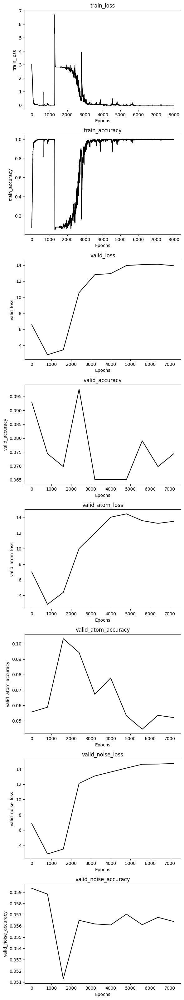

In [8]:
trainer.plot_training_metrics()

In [9]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▆██████▁▁▁▁▂▃▅▆█████████████████████████
train_loss,▃▁▁▁▁▁▁████▇▆▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▇▇▃▃▂▂██▁▁▁▁▁▁▄▄▂▂▃▃
valid_atom_accuracy,▁▂▄▃▂▃▃▃█▆▇█▆▆▆▄▅▂▃▄▅▅▄▅▂▃▃▁▁▂▁▁▃▂▁▂▂▂▂▃
valid_atom_loss,▄▄▃▃▁▁▁▁▂▂▂▂▅▅▅▆▆▆▆▆█████████▇██▇▇▇▇███▇
valid_loss,▃▃▁▁▁▁▆▆▇▇▇▇████████
valid_noise_accuracy,▅▇▄█▇▄▅▆▅▂▅▃▃▄▆▆▄▄▆▄▇▄▅▇▅▄▄▇▃▅█▆▅▁▇▇▅▅▇▆
valid_noise_loss,▃▃▃▃▁▁▁▁▁▁▁▁▆▇▆▆▇▇▇▇▇▇▇▇████████████████
epoch,8000


### 10K dataset

10711


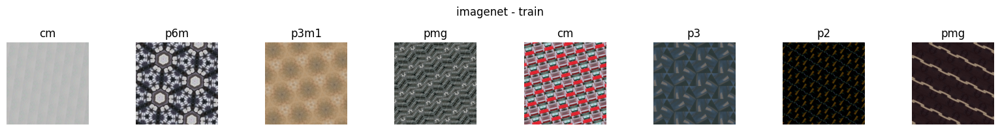

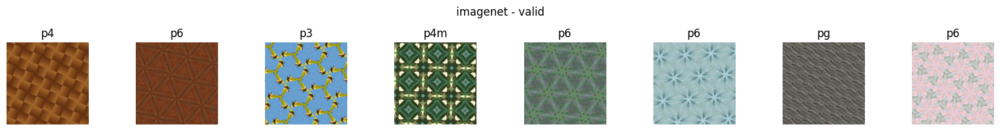

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.999, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[0,1,5,6,8,9])
device = torch.device('cuda:0')
# model

torch.Size([2, 17])


In [4]:
config = {'dataset': '10k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09232024-XCiT-dataset_v5_size-10k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config)
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [5]:
lr = 1e-3
per_epoch = 30
epoch_start = 0
epochs = 3000
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/3000


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]


train_loss: 2.8804, train_accuracy: 6.96%
Epoch 2/3000


100%|██████████| 10/10 [00:23<00:00,  2.39s/it]


train_loss: 2.8169, train_accuracy: 8.30%
Epoch 3/3000


100%|██████████| 10/10 [00:24<00:00,  2.41s/it]


train_loss: 2.7963, train_accuracy: 9.24%
Epoch 4/3000


100%|██████████| 10/10 [00:24<00:00,  2.41s/it]


train_loss: 2.7804, train_accuracy: 10.33%
Epoch 5/3000


100%|██████████| 10/10 [00:24<00:00,  2.41s/it]


train_loss: 2.7653, train_accuracy: 10.87%
Epoch 6/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.7439, train_accuracy: 11.76%
Epoch 7/3000


100%|██████████| 10/10 [00:24<00:00,  2.43s/it]


train_loss: 2.7199, train_accuracy: 12.92%
Epoch 8/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 2.6893, train_accuracy: 13.49%
Epoch 9/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.6511, train_accuracy: 15.43%
Epoch 10/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6024, train_accuracy: 16.69%
Epoch 11/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.5602, train_accuracy: 17.66%
Epoch 12/3000


100%|██████████| 10/10 [00:24<00:00,  2.43s/it]


train_loss: 2.5055, train_accuracy: 19.49%
Epoch 13/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.4576, train_accuracy: 21.02%
Epoch 14/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.4018, train_accuracy: 22.96%
Epoch 15/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.3364, train_accuracy: 25.16%
Epoch 16/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.2752, train_accuracy: 27.12%
Epoch 17/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.2081, train_accuracy: 29.75%
Epoch 18/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.1343, train_accuracy: 32.36%
Epoch 19/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.0478, train_accuracy: 36.23%
Epoch 20/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.9411, train_accuracy: 40.85%
Epoch 21/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.8437, train_accuracy: 44.76%
Epoch 22/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 1.7241, train_accuracy: 49.74%
Epoch 23/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.5861, train_accuracy: 55.46%
Epoch 24/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.4523, train_accuracy: 60.76%
Epoch 25/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.2917, train_accuracy: 66.85%
Epoch 26/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.1539, train_accuracy: 71.29%
Epoch 27/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.0290, train_accuracy: 74.73%
Epoch 28/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.8879, train_accuracy: 79.28%
Epoch 29/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.7785, train_accuracy: 82.24%
Epoch 30/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.6751, train_accuracy: 84.96%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 3.0747, valid_accuracy: 15.63%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 4.4896, valid_atom_accuracy: 4.26%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 4.1123, valid_noise_accuracy: 6.51%
Model saved at epoch 30
Epoch 31/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.5750, train_accuracy: 87.64%
Epoch 32/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.4984, train_accuracy: 89.52%
Epoch 33/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.4163, train_accuracy: 91.49%
Epoch 34/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 0.3650, train_accuracy: 92.54%
Epoch 35/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3235, train_accuracy: 93.51%
Epoch 36/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.2870, train_accuracy: 94.00%
Epoch 37/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.2672, train_accuracy: 94.43%
Epoch 38/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2344, train_accuracy: 95.09%
Epoch 39/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2177, train_accuracy: 95.21%
Epoch 40/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.1915, train_accuracy: 95.87%
Epoch 41/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1726, train_accuracy: 96.21%
Epoch 42/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1577, train_accuracy: 96.70%
Epoch 43/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1427, train_accuracy: 96.74%
Epoch 44/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1284, train_accuracy: 97.20%
Epoch 45/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1170, train_accuracy: 97.50%
Epoch 46/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1080, train_accuracy: 97.71%
Epoch 47/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1048, train_accuracy: 97.63%
Epoch 48/3000


100%|██████████| 10/10 [00:25<00:00,  2.55s/it]


train_loss: 0.0927, train_accuracy: 97.92%
Epoch 49/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0906, train_accuracy: 97.99%
Epoch 50/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0791, train_accuracy: 98.31%
Epoch 51/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0736, train_accuracy: 98.46%
Epoch 52/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0700, train_accuracy: 98.44%
Epoch 53/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0651, train_accuracy: 98.72%
Epoch 54/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0647, train_accuracy: 98.52%
Epoch 55/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0609, train_accuracy: 98.68%
Epoch 56/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0577, train_accuracy: 98.74%
Epoch 57/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0576, train_accuracy: 98.83%
Epoch 58/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0532, train_accuracy: 98.88%
Epoch 59/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0532, train_accuracy: 98.87%
Epoch 60/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0486, train_accuracy: 99.05%


100%|██████████| 3/3 [00:04<00:00,  1.52s/it]


valid_loss: 4.2512, valid_accuracy: 15.45%


100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


valid_atom_loss: 5.6882, valid_atom_accuracy: 5.18%


100%|██████████| 119/119 [01:43<00:00,  1.15it/s]


valid_noise_loss: 5.2260, valid_noise_accuracy: 6.17%
Model saved at epoch 60
Epoch 61/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0515, train_accuracy: 98.90%
Epoch 62/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0427, train_accuracy: 99.16%
Epoch 63/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0440, train_accuracy: 99.11%
Epoch 64/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0413, train_accuracy: 99.10%
Epoch 65/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0407, train_accuracy: 99.25%
Epoch 66/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0374, train_accuracy: 99.17%
Epoch 67/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0377, train_accuracy: 99.29%
Epoch 68/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0318, train_accuracy: 99.40%
Epoch 69/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0328, train_accuracy: 99.29%
Epoch 70/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0310, train_accuracy: 99.42%
Epoch 71/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0371, train_accuracy: 99.23%
Epoch 72/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0296, train_accuracy: 99.44%
Epoch 73/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0287, train_accuracy: 99.50%
Epoch 74/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0250, train_accuracy: 99.53%
Epoch 75/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0235, train_accuracy: 99.52%
Epoch 76/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0248, train_accuracy: 99.53%
Epoch 77/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0238, train_accuracy: 99.58%
Epoch 78/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0240, train_accuracy: 99.56%
Epoch 79/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0212, train_accuracy: 99.59%
Epoch 80/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0207, train_accuracy: 99.59%
Epoch 81/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0208, train_accuracy: 99.57%
Epoch 82/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0213, train_accuracy: 99.59%
Epoch 83/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0199, train_accuracy: 99.66%
Epoch 84/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0177, train_accuracy: 99.68%
Epoch 85/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0159, train_accuracy: 99.72%
Epoch 86/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0149, train_accuracy: 99.65%
Epoch 87/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0150, train_accuracy: 99.71%
Epoch 88/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0137, train_accuracy: 99.68%
Epoch 89/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0134, train_accuracy: 99.68%
Epoch 90/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0133, train_accuracy: 99.72%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 4.6882, valid_accuracy: 15.03%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.4233, valid_atom_accuracy: 4.91%


100%|██████████| 119/119 [01:41<00:00,  1.18it/s]


valid_noise_loss: 5.7182, valid_noise_accuracy: 6.16%
Model saved at epoch 90
Epoch 91/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0126, train_accuracy: 99.74%
Epoch 92/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0120, train_accuracy: 99.77%
Epoch 93/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0116, train_accuracy: 99.79%
Epoch 94/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0109, train_accuracy: 99.79%
Epoch 95/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0103, train_accuracy: 99.75%
Epoch 96/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0124, train_accuracy: 99.73%
Epoch 97/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0110, train_accuracy: 99.77%
Epoch 98/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0135, train_accuracy: 99.71%
Epoch 99/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0167, train_accuracy: 99.66%
Epoch 100/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0216, train_accuracy: 99.51%
Epoch 101/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0184, train_accuracy: 99.60%
Epoch 102/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0240, train_accuracy: 99.54%
Epoch 103/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0221, train_accuracy: 99.63%
Epoch 104/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0232, train_accuracy: 99.60%
Epoch 105/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0188, train_accuracy: 99.68%
Epoch 106/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0247, train_accuracy: 99.50%
Epoch 107/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0288, train_accuracy: 99.43%
Epoch 108/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0261, train_accuracy: 99.46%
Epoch 109/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0291, train_accuracy: 99.39%
Epoch 110/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0292, train_accuracy: 99.39%
Epoch 111/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0307, train_accuracy: 99.38%
Epoch 112/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0285, train_accuracy: 99.47%
Epoch 113/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0298, train_accuracy: 99.39%
Epoch 114/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0269, train_accuracy: 99.53%
Epoch 115/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0288, train_accuracy: 99.39%
Epoch 116/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0346, train_accuracy: 99.24%
Epoch 117/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0295, train_accuracy: 99.38%
Epoch 118/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0370, train_accuracy: 99.24%
Epoch 119/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0406, train_accuracy: 99.05%
Epoch 120/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0453, train_accuracy: 98.98%


100%|██████████| 3/3 [00:04<00:00,  1.44s/it]


valid_loss: 4.9590, valid_accuracy: 16.61%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 7.3459, valid_atom_accuracy: 5.34%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 5.8548, valid_noise_accuracy: 6.26%
Model saved at epoch 120
Epoch 121/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0405, train_accuracy: 99.14%
Epoch 122/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0422, train_accuracy: 98.96%
Epoch 123/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0347, train_accuracy: 99.18%
Epoch 124/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0341, train_accuracy: 99.18%
Epoch 125/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0312, train_accuracy: 99.33%
Epoch 126/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0332, train_accuracy: 99.15%
Epoch 127/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0274, train_accuracy: 99.40%
Epoch 128/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0278, train_accuracy: 99.30%
Epoch 129/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0280, train_accuracy: 99.33%
Epoch 130/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0220, train_accuracy: 99.54%
Epoch 131/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0192, train_accuracy: 99.70%
Epoch 132/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0214, train_accuracy: 99.49%
Epoch 133/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0198, train_accuracy: 99.61%
Epoch 134/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0194, train_accuracy: 99.54%
Epoch 135/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0192, train_accuracy: 99.57%
Epoch 136/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0209, train_accuracy: 99.50%
Epoch 137/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0211, train_accuracy: 99.58%
Epoch 138/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0226, train_accuracy: 99.52%
Epoch 139/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0212, train_accuracy: 99.56%
Epoch 140/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0173, train_accuracy: 99.68%
Epoch 141/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0160, train_accuracy: 99.68%
Epoch 142/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0131, train_accuracy: 99.68%
Epoch 143/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0137, train_accuracy: 99.68%
Epoch 144/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0100, train_accuracy: 99.82%
Epoch 145/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0099, train_accuracy: 99.77%
Epoch 146/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0109, train_accuracy: 99.78%
Epoch 147/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0148, train_accuracy: 99.70%
Epoch 148/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0184, train_accuracy: 99.53%
Epoch 149/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0200, train_accuracy: 99.51%
Epoch 150/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0210, train_accuracy: 99.46%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 5.4857, valid_accuracy: 16.57%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.8548, valid_atom_accuracy: 4.83%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.8326, valid_noise_accuracy: 6.17%
Model saved at epoch 150
Epoch 151/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0242, train_accuracy: 99.40%
Epoch 152/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0261, train_accuracy: 99.38%
Epoch 153/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0376, train_accuracy: 99.01%
Epoch 154/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0392, train_accuracy: 98.93%
Epoch 155/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0512, train_accuracy: 98.47%
Epoch 156/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0562, train_accuracy: 98.33%
Epoch 157/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0633, train_accuracy: 98.19%
Epoch 158/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0692, train_accuracy: 97.89%
Epoch 159/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0744, train_accuracy: 97.63%
Epoch 160/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0931, train_accuracy: 97.09%
Epoch 161/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1110, train_accuracy: 96.70%
Epoch 162/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1193, train_accuracy: 96.28%
Epoch 163/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1174, train_accuracy: 96.31%
Epoch 164/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1149, train_accuracy: 96.48%
Epoch 165/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1043, train_accuracy: 96.67%
Epoch 166/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0768, train_accuracy: 97.53%
Epoch 167/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0674, train_accuracy: 97.92%
Epoch 168/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0659, train_accuracy: 97.88%
Epoch 169/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0448, train_accuracy: 98.70%
Epoch 170/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0393, train_accuracy: 98.70%
Epoch 171/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0293, train_accuracy: 99.16%
Epoch 172/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0232, train_accuracy: 99.46%
Epoch 173/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0188, train_accuracy: 99.52%
Epoch 174/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0145, train_accuracy: 99.65%
Epoch 175/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0104, train_accuracy: 99.77%
Epoch 176/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0083, train_accuracy: 99.82%
Epoch 177/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0075, train_accuracy: 99.81%
Epoch 178/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0080, train_accuracy: 99.80%
Epoch 179/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0061, train_accuracy: 99.85%
Epoch 180/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0071, train_accuracy: 99.82%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 5.7484, valid_accuracy: 16.43%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 8.3071, valid_atom_accuracy: 6.18%


100%|██████████| 119/119 [01:43<00:00,  1.15it/s]


valid_noise_loss: 7.2647, valid_noise_accuracy: 6.36%
Model saved at epoch 180
Epoch 181/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0059, train_accuracy: 99.84%
Epoch 182/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0056, train_accuracy: 99.88%
Epoch 183/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0049, train_accuracy: 99.85%
Epoch 184/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0046, train_accuracy: 99.89%
Epoch 185/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0055, train_accuracy: 99.84%
Epoch 186/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.89%
Epoch 187/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 188/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0046, train_accuracy: 99.91%
Epoch 189/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0037, train_accuracy: 99.91%
Epoch 190/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.93%
Epoch 191/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.92%
Epoch 192/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.92%
Epoch 193/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 194/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0026, train_accuracy: 99.94%
Epoch 195/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0024, train_accuracy: 99.94%
Epoch 196/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 197/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 198/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 199/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 200/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 201/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 202/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 203/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 204/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 205/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 206/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 207/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.94%
Epoch 208/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 209/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 210/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.93%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 5.7566, valid_accuracy: 18.20%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 8.7644, valid_atom_accuracy: 5.79%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 7.3624, valid_noise_accuracy: 6.25%
Model saved at epoch 210
Epoch 211/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 212/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 213/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 214/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 215/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0146, train_accuracy: 99.57%
Epoch 216/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0229, train_accuracy: 99.42%
Epoch 217/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0310, train_accuracy: 99.12%
Epoch 218/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0392, train_accuracy: 98.80%
Epoch 219/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0526, train_accuracy: 98.35%
Epoch 220/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0801, train_accuracy: 97.58%
Epoch 221/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1344, train_accuracy: 95.58%
Epoch 222/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.2373, train_accuracy: 92.86%
Epoch 223/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.3582, train_accuracy: 89.13%
Epoch 224/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.3799, train_accuracy: 88.57%
Epoch 225/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.3402, train_accuracy: 89.50%
Epoch 226/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2935, train_accuracy: 90.51%
Epoch 227/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.2152, train_accuracy: 93.20%
Epoch 228/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1323, train_accuracy: 95.82%
Epoch 229/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0790, train_accuracy: 97.78%
Epoch 230/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0504, train_accuracy: 98.55%
Epoch 231/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0358, train_accuracy: 99.03%
Epoch 232/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0208, train_accuracy: 99.58%
Epoch 233/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0141, train_accuracy: 99.70%
Epoch 234/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0083, train_accuracy: 99.82%
Epoch 235/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0072, train_accuracy: 99.85%
Epoch 236/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0062, train_accuracy: 99.87%
Epoch 237/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0071, train_accuracy: 99.84%
Epoch 238/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0075, train_accuracy: 99.82%
Epoch 239/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0061, train_accuracy: 99.84%
Epoch 240/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.88%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 5.3517, valid_accuracy: 18.62%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 8.5937, valid_atom_accuracy: 7.04%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 7.0680, valid_noise_accuracy: 6.29%
Model saved at epoch 240
Epoch 241/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0039, train_accuracy: 99.91%
Epoch 242/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0030, train_accuracy: 99.92%
Epoch 243/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0025, train_accuracy: 99.94%
Epoch 244/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 245/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 246/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.95%
Epoch 247/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0036, train_accuracy: 99.91%
Epoch 248/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.89%
Epoch 249/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 250/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 251/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 252/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 253/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0021, train_accuracy: 99.95%
Epoch 254/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 255/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0020, train_accuracy: 99.95%
Epoch 256/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 257/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0028, train_accuracy: 99.93%
Epoch 258/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 259/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0035, train_accuracy: 99.87%
Epoch 260/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0026, train_accuracy: 99.92%
Epoch 261/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0026, train_accuracy: 99.92%
Epoch 262/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 263/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0035, train_accuracy: 99.89%
Epoch 264/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0026, train_accuracy: 99.92%
Epoch 265/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.95%
Epoch 266/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0020, train_accuracy: 99.95%
Epoch 267/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 268/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 269/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.92%
Epoch 270/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0018, train_accuracy: 99.92%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 5.4929, valid_accuracy: 18.43%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 8.8881, valid_atom_accuracy: 7.36%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 7.4218, valid_noise_accuracy: 6.33%
Model saved at epoch 270
Epoch 271/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0019, train_accuracy: 99.92%
Epoch 272/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0036, train_accuracy: 99.94%
Epoch 273/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 274/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 275/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 276/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 277/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 278/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0024, train_accuracy: 99.94%
Epoch 279/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0039, train_accuracy: 99.86%
Epoch 280/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0039, train_accuracy: 99.89%
Epoch 281/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0055, train_accuracy: 99.87%
Epoch 282/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0063, train_accuracy: 99.86%
Epoch 283/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.88%
Epoch 284/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0058, train_accuracy: 99.81%
Epoch 285/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0098, train_accuracy: 99.75%
Epoch 286/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0117, train_accuracy: 99.68%
Epoch 287/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0161, train_accuracy: 99.52%
Epoch 288/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0245, train_accuracy: 99.36%
Epoch 289/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0320, train_accuracy: 99.09%
Epoch 290/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0448, train_accuracy: 98.61%
Epoch 291/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0796, train_accuracy: 97.30%
Epoch 292/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1608, train_accuracy: 94.91%
Epoch 293/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2937, train_accuracy: 91.27%
Epoch 294/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.4190, train_accuracy: 87.87%
Epoch 295/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4421, train_accuracy: 86.71%
Epoch 296/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.3728, train_accuracy: 87.91%
Epoch 297/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2350, train_accuracy: 92.83%
Epoch 298/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1402, train_accuracy: 95.79%
Epoch 299/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0775, train_accuracy: 97.62%
Epoch 300/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0484, train_accuracy: 98.73%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 4.8458, valid_accuracy: 20.58%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 7.2946, valid_atom_accuracy: 11.03%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.4876, valid_noise_accuracy: 6.32%
Model saved at epoch 300
Epoch 301/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0253, train_accuracy: 99.35%
Epoch 302/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0167, train_accuracy: 99.65%
Epoch 303/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0102, train_accuracy: 99.86%
Epoch 304/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0072, train_accuracy: 99.82%
Epoch 305/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0075, train_accuracy: 99.81%
Epoch 306/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0042, train_accuracy: 99.93%
Epoch 307/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.89%
Epoch 308/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.94%
Epoch 309/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 310/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 311/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 312/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 313/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 314/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 315/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.94%
Epoch 316/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 317/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 318/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 319/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 320/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 321/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.96%
Epoch 322/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 323/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 324/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 325/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 326/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 327/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.8229e-04, train_accuracy: 99.96%
Epoch 328/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.9695e-04, train_accuracy: 99.96%
Epoch 329/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 330/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.6652e-04, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 5.3979, valid_accuracy: 21.47%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 8.3194, valid_atom_accuracy: 8.01%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 8.1154, valid_noise_accuracy: 6.17%
Model saved at epoch 330
Epoch 331/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.3150e-04, train_accuracy: 99.98%
Epoch 332/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 333/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.7966e-04, train_accuracy: 99.98%
Epoch 334/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 335/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.9680e-04, train_accuracy: 99.96%
Epoch 336/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.4138e-04, train_accuracy: 99.96%
Epoch 337/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.8021e-04, train_accuracy: 99.96%
Epoch 338/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.0293e-04, train_accuracy: 99.98%
Epoch 339/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.3664e-04, train_accuracy: 99.96%
Epoch 340/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.6005e-04, train_accuracy: 99.96%
Epoch 341/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.2560e-04, train_accuracy: 99.96%
Epoch 342/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.2196e-04, train_accuracy: 99.96%
Epoch 343/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.1939e-04, train_accuracy: 99.98%
Epoch 344/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.1435e-04, train_accuracy: 99.96%
Epoch 345/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 6.6594e-04, train_accuracy: 99.96%
Epoch 346/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.8141e-04, train_accuracy: 99.98%
Epoch 347/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.4433e-04, train_accuracy: 99.99%
Epoch 348/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.1482e-04, train_accuracy: 99.95%
Epoch 349/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 6.4942e-04, train_accuracy: 99.96%
Epoch 350/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 351/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0042, train_accuracy: 99.93%
Epoch 352/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.86%
Epoch 353/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 354/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.87%
Epoch 355/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0066, train_accuracy: 99.80%
Epoch 356/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0068, train_accuracy: 99.79%
Epoch 357/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0059, train_accuracy: 99.87%
Epoch 358/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0065, train_accuracy: 99.85%
Epoch 359/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0077, train_accuracy: 99.72%
Epoch 360/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0134, train_accuracy: 99.66%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 5.5655, valid_accuracy: 21.19%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 8.1424, valid_atom_accuracy: 7.88%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 8.0122, valid_noise_accuracy: 6.45%
Model saved at epoch 360
Epoch 361/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0201, train_accuracy: 99.39%
Epoch 362/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0302, train_accuracy: 99.02%
Epoch 363/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0827, train_accuracy: 97.42%
Epoch 364/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.2858, train_accuracy: 91.43%
Epoch 365/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.2519, train_accuracy: 70.17%
Epoch 366/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.2448, train_accuracy: 45.23%
Epoch 367/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.5077, train_accuracy: 52.38%
Epoch 368/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 0.8105, train_accuracy: 74.68%
Epoch 369/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3418, train_accuracy: 89.79%
Epoch 370/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1641, train_accuracy: 95.37%
Epoch 371/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0826, train_accuracy: 97.84%
Epoch 372/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0392, train_accuracy: 99.05%
Epoch 373/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0245, train_accuracy: 99.52%
Epoch 374/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0174, train_accuracy: 99.66%
Epoch 375/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0122, train_accuracy: 99.82%
Epoch 376/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0105, train_accuracy: 99.80%
Epoch 377/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0066, train_accuracy: 99.87%
Epoch 378/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0056, train_accuracy: 99.87%
Epoch 379/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0041, train_accuracy: 99.91%
Epoch 380/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0037, train_accuracy: 99.92%
Epoch 381/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 382/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.92%
Epoch 383/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.98%
Epoch 384/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0018, train_accuracy: 99.99%
Epoch 385/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.95%
Epoch 386/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 387/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 388/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.98%
Epoch 389/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 390/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 4.8394, valid_accuracy: 23.19%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.0626, valid_atom_accuracy: 10.31%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 7.3697, valid_noise_accuracy: 5.88%
Model saved at epoch 390
Epoch 391/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0015, train_accuracy: 99.98%
Epoch 392/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 393/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 394/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 395/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 396/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 397/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 398/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 399/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 400/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 401/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 402/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 403/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 404/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 405/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 406/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 407/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.9458e-04, train_accuracy: 99.98%
Epoch 408/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.4241e-04, train_accuracy: 99.96%
Epoch 409/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0012, train_accuracy: 99.98%
Epoch 410/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.0924e-04, train_accuracy: 99.98%
Epoch 411/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 412/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 413/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.6208e-04, train_accuracy: 99.96%
Epoch 414/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 415/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.2888e-04, train_accuracy: 99.99%
Epoch 416/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 417/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.0522e-04, train_accuracy: 99.99%
Epoch 418/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 419/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.5459e-04, train_accuracy: 99.98%
Epoch 420/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 9.1687e-04, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.49s/it]


valid_loss: 5.0417, valid_accuracy: 23.80%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.3623, valid_atom_accuracy: 9.96%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.7084, valid_noise_accuracy: 5.94%
Model saved at epoch 420
Epoch 421/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 9.3967e-04, train_accuracy: 99.98%
Epoch 422/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.1755e-04, train_accuracy: 99.98%
Epoch 423/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.0417e-04, train_accuracy: 99.98%
Epoch 424/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.8109e-04, train_accuracy: 99.98%
Epoch 425/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.7283e-04, train_accuracy: 99.98%
Epoch 426/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 8.1540e-04, train_accuracy: 99.98%
Epoch 427/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 9.1596e-04, train_accuracy: 99.98%
Epoch 428/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.7150e-04, train_accuracy: 99.95%
Epoch 429/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.0348e-04, train_accuracy: 99.98%
Epoch 430/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.2292e-04, train_accuracy: 99.98%
Epoch 431/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.3015e-04, train_accuracy: 99.96%
Epoch 432/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.1797e-04, train_accuracy: 99.98%
Epoch 433/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.0400e-04, train_accuracy: 99.98%
Epoch 434/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.0790e-04, train_accuracy: 99.98%
Epoch 435/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.6675e-04, train_accuracy: 99.96%
Epoch 436/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.1626e-04, train_accuracy: 99.96%
Epoch 437/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.0806e-04, train_accuracy: 99.95%
Epoch 438/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.6281e-04, train_accuracy: 99.96%
Epoch 439/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 8.8359e-04, train_accuracy: 99.96%
Epoch 440/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.1009e-04, train_accuracy: 99.98%
Epoch 441/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.7352e-04, train_accuracy: 99.96%
Epoch 442/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.5644e-04, train_accuracy: 99.98%
Epoch 443/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 6.8629e-04, train_accuracy: 99.98%
Epoch 444/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.1403e-04, train_accuracy: 99.98%
Epoch 445/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.9882e-04, train_accuracy: 99.98%
Epoch 446/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.6701e-04, train_accuracy: 99.95%
Epoch 447/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.8528e-04, train_accuracy: 99.96%
Epoch 448/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.3430e-04, train_accuracy: 99.95%
Epoch 449/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.0621e-04, train_accuracy: 99.98%
Epoch 450/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.2264e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.42s/it]


valid_loss: 5.1827, valid_accuracy: 23.19%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.6286, valid_atom_accuracy: 10.20%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 8.0183, valid_noise_accuracy: 5.93%
Model saved at epoch 450
Epoch 451/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.5927e-04, train_accuracy: 99.95%
Epoch 452/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.4563e-04, train_accuracy: 99.95%
Epoch 453/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3739e-04, train_accuracy: 99.98%
Epoch 454/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.4906e-04, train_accuracy: 99.96%
Epoch 455/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.1659e-04, train_accuracy: 99.96%
Epoch 456/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.0455e-04, train_accuracy: 99.96%
Epoch 457/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.1320e-04, train_accuracy: 99.98%
Epoch 458/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.7366e-04, train_accuracy: 99.96%
Epoch 459/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.1630e-04, train_accuracy: 99.95%
Epoch 460/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.7493e-04, train_accuracy: 99.98%
Epoch 461/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.9703e-04, train_accuracy: 99.96%
Epoch 462/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.2134e-04, train_accuracy: 99.98%
Epoch 463/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 6.3868e-04, train_accuracy: 99.96%
Epoch 464/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.6347e-04, train_accuracy: 99.98%
Epoch 465/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.6047e-04, train_accuracy: 99.96%
Epoch 466/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.6136e-04, train_accuracy: 99.98%
Epoch 467/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.5071e-04, train_accuracy: 99.98%
Epoch 468/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.1160e-04, train_accuracy: 99.98%
Epoch 469/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.5995e-04, train_accuracy: 99.96%
Epoch 470/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.6434e-04, train_accuracy: 99.98%
Epoch 471/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.4384e-04, train_accuracy: 99.96%
Epoch 472/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.3578e-04, train_accuracy: 99.96%
Epoch 473/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.4656e-04, train_accuracy: 99.98%
Epoch 474/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.6356e-04, train_accuracy: 99.96%
Epoch 475/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.5426e-04, train_accuracy: 99.98%
Epoch 476/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.9240e-04, train_accuracy: 99.98%
Epoch 477/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.0936e-04, train_accuracy: 99.98%
Epoch 478/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.9189e-04, train_accuracy: 99.98%
Epoch 479/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.3872e-04, train_accuracy: 99.96%
Epoch 480/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 6.5075e-04, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 5.2998, valid_accuracy: 23.33%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.8159, valid_atom_accuracy: 10.15%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 8.1978, valid_noise_accuracy: 5.95%
Model saved at epoch 480
Epoch 481/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.6062e-04, train_accuracy: 99.95%
Epoch 482/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.6037e-04, train_accuracy: 99.96%
Epoch 483/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 5.0348e-04, train_accuracy: 99.98%
Epoch 484/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.8791e-04, train_accuracy: 99.96%
Epoch 485/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8520e-04, train_accuracy: 99.96%
Epoch 486/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3065e-04, train_accuracy: 99.95%
Epoch 487/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.7272e-04, train_accuracy: 99.98%
Epoch 488/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.5418e-04, train_accuracy: 99.96%
Epoch 489/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.6551e-04, train_accuracy: 99.96%
Epoch 490/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.6308e-04, train_accuracy: 99.98%
Epoch 491/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.9383e-04, train_accuracy: 99.98%
Epoch 492/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.3780e-04, train_accuracy: 99.96%
Epoch 493/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.5225e-04, train_accuracy: 99.96%
Epoch 494/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2258e-04, train_accuracy: 99.96%
Epoch 495/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 496/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0065, train_accuracy: 99.82%
Epoch 497/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0293, train_accuracy: 99.23%
Epoch 498/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.3918, train_accuracy: 66.95%
Epoch 499/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1145, train_accuracy: 15.46%
Epoch 500/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9416, train_accuracy: 6.57%
Epoch 501/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8323, train_accuracy: 8.60%
Epoch 502/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8109, train_accuracy: 8.40%
Epoch 503/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6719, train_accuracy: 11.95%
Epoch 504/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5408, train_accuracy: 13.64%
Epoch 505/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.4839, train_accuracy: 14.99%
Epoch 506/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3610, train_accuracy: 17.83%
Epoch 507/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9650, train_accuracy: 9.28%
Epoch 508/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7755, train_accuracy: 9.90%
Epoch 509/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.6663, train_accuracy: 11.65%
Epoch 510/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.5931, train_accuracy: 12.61%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 2.5671, valid_accuracy: 12.93%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8132, valid_atom_accuracy: 6.42%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 3.1473, valid_noise_accuracy: 5.95%
Model saved at epoch 510
Epoch 511/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.5022, train_accuracy: 14.18%
Epoch 512/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.4406, train_accuracy: 15.43%
Epoch 513/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.3847, train_accuracy: 16.64%
Epoch 514/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3662, train_accuracy: 17.24%
Epoch 515/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3108, train_accuracy: 18.31%
Epoch 516/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.2162, train_accuracy: 21.31%
Epoch 517/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.1603, train_accuracy: 23.38%
Epoch 518/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.1349, train_accuracy: 23.90%
Epoch 519/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.0393, train_accuracy: 26.19%
Epoch 520/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.8866, train_accuracy: 29.08%
Epoch 521/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.8184, train_accuracy: 31.34%
Epoch 522/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.6826, train_accuracy: 36.02%
Epoch 523/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.6840, train_accuracy: 36.43%
Epoch 524/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.6341, train_accuracy: 37.69%
Epoch 525/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.5362, train_accuracy: 41.06%
Epoch 526/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.3898, train_accuracy: 47.61%
Epoch 527/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 1.2944, train_accuracy: 49.81%
Epoch 528/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1653, train_accuracy: 55.47%
Epoch 529/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.1543, train_accuracy: 55.37%
Epoch 530/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9784, train_accuracy: 62.36%
Epoch 531/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9784, train_accuracy: 62.32%
Epoch 532/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.8611, train_accuracy: 66.94%
Epoch 533/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.7186, train_accuracy: 73.11%
Epoch 534/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6491, train_accuracy: 75.89%
Epoch 535/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.6307, train_accuracy: 76.51%
Epoch 536/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.5741, train_accuracy: 78.51%
Epoch 537/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.5145, train_accuracy: 81.38%
Epoch 538/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4244, train_accuracy: 85.46%
Epoch 539/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.3460, train_accuracy: 88.22%
Epoch 540/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2755, train_accuracy: 90.71%


100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


valid_loss: 2.4891, valid_accuracy: 43.82%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.2731, valid_atom_accuracy: 24.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 8.4860, valid_noise_accuracy: 7.84%
Model saved at epoch 540
Epoch 541/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2521, train_accuracy: 91.56%
Epoch 542/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2557, train_accuracy: 91.55%
Epoch 543/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2370, train_accuracy: 92.16%
Epoch 544/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1739, train_accuracy: 94.79%
Epoch 545/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1563, train_accuracy: 95.10%
Epoch 546/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1252, train_accuracy: 96.04%
Epoch 547/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1070, train_accuracy: 96.70%
Epoch 548/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0958, train_accuracy: 97.00%
Epoch 549/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0761, train_accuracy: 97.75%
Epoch 550/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0644, train_accuracy: 98.21%
Epoch 551/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0550, train_accuracy: 98.52%
Epoch 552/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0493, train_accuracy: 98.55%
Epoch 553/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0389, train_accuracy: 98.93%
Epoch 554/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0487, train_accuracy: 98.74%
Epoch 555/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0422, train_accuracy: 98.76%
Epoch 556/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0411, train_accuracy: 98.87%
Epoch 557/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0363, train_accuracy: 99.04%
Epoch 558/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0420, train_accuracy: 98.61%
Epoch 559/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0745, train_accuracy: 97.89%
Epoch 560/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0831, train_accuracy: 97.35%
Epoch 561/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1013, train_accuracy: 96.85%
Epoch 562/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0961, train_accuracy: 96.79%
Epoch 563/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1195, train_accuracy: 96.17%
Epoch 564/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.1346, train_accuracy: 95.62%
Epoch 565/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1635, train_accuracy: 94.58%
Epoch 566/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.1516, train_accuracy: 94.98%
Epoch 567/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1319, train_accuracy: 95.69%
Epoch 568/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.1138, train_accuracy: 96.10%
Epoch 569/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0946, train_accuracy: 96.92%
Epoch 570/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1016, train_accuracy: 96.45%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 3.0062, valid_accuracy: 47.74%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 6.0044, valid_atom_accuracy: 27.99%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 9.2740, valid_noise_accuracy: 7.91%
Model saved at epoch 570
Epoch 571/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0841, train_accuracy: 97.23%
Epoch 572/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0612, train_accuracy: 98.10%
Epoch 573/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0470, train_accuracy: 98.48%
Epoch 574/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0358, train_accuracy: 98.93%
Epoch 575/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0258, train_accuracy: 99.36%
Epoch 576/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0182, train_accuracy: 99.49%
Epoch 577/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0136, train_accuracy: 99.71%
Epoch 578/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0095, train_accuracy: 99.79%
Epoch 579/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0089, train_accuracy: 99.81%
Epoch 580/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0074, train_accuracy: 99.80%
Epoch 581/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0063, train_accuracy: 99.85%
Epoch 582/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0036, train_accuracy: 99.93%
Epoch 583/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0045, train_accuracy: 99.89%
Epoch 584/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0034, train_accuracy: 99.92%
Epoch 585/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0034, train_accuracy: 99.93%
Epoch 586/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.94%
Epoch 587/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.92%
Epoch 588/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0025, train_accuracy: 99.94%
Epoch 589/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0019, train_accuracy: 99.96%
Epoch 590/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 591/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0022, train_accuracy: 99.94%
Epoch 592/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 593/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0019, train_accuracy: 99.95%
Epoch 594/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 595/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 596/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 597/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.98%
Epoch 598/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 599/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 600/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 3.0890, valid_accuracy: 51.80%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.9323, valid_atom_accuracy: 25.93%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 10.1377, valid_noise_accuracy: 8.33%
Model saved at epoch 600
Epoch 601/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 602/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 603/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 604/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 605/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 606/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 607/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.5917e-04, train_accuracy: 99.96%
Epoch 608/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 609/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.2672e-04, train_accuracy: 99.96%
Epoch 610/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 611/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.7535e-04, train_accuracy: 99.98%
Epoch 612/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.6442e-04, train_accuracy: 99.96%
Epoch 613/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.6832e-04, train_accuracy: 99.96%
Epoch 614/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 8.1845e-04, train_accuracy: 99.98%
Epoch 615/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.1910e-04, train_accuracy: 99.98%
Epoch 616/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.4371e-04, train_accuracy: 99.98%
Epoch 617/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.7569e-04, train_accuracy: 99.98%
Epoch 618/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.3262e-04, train_accuracy: 99.98%
Epoch 619/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.3820e-04, train_accuracy: 99.96%
Epoch 620/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.7968e-04, train_accuracy: 99.98%
Epoch 621/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.3606e-04, train_accuracy: 99.95%
Epoch 622/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.3193e-04, train_accuracy: 99.96%
Epoch 623/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 624/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.8894e-04, train_accuracy: 99.95%
Epoch 625/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.6743e-04, train_accuracy: 99.95%
Epoch 626/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.5639e-04, train_accuracy: 99.95%
Epoch 627/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.7011e-04, train_accuracy: 99.96%
Epoch 628/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.2996e-04, train_accuracy: 99.95%
Epoch 629/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8755e-04, train_accuracy: 99.98%
Epoch 630/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8124e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 3.2016, valid_accuracy: 52.68%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.0978, valid_atom_accuracy: 26.82%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 10.5081, valid_noise_accuracy: 8.14%
Model saved at epoch 630
Epoch 631/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 7.5686e-04, train_accuracy: 99.96%
Epoch 632/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.4266e-04, train_accuracy: 99.98%
Epoch 633/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.8246e-04, train_accuracy: 99.98%
Epoch 634/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.5219e-04, train_accuracy: 99.96%
Epoch 635/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.3110e-04, train_accuracy: 99.96%
Epoch 636/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3362e-04, train_accuracy: 99.96%
Epoch 637/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.2083e-04, train_accuracy: 99.98%
Epoch 638/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.7123e-04, train_accuracy: 99.96%
Epoch 639/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.7892e-04, train_accuracy: 99.98%
Epoch 640/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8019e-04, train_accuracy: 99.98%
Epoch 641/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 6.3316e-04, train_accuracy: 99.96%
Epoch 642/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8308e-04, train_accuracy: 99.96%
Epoch 643/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 6.6432e-04, train_accuracy: 99.98%
Epoch 644/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.1676e-04, train_accuracy: 99.96%
Epoch 645/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 6.3152e-04, train_accuracy: 99.96%
Epoch 646/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8999e-04, train_accuracy: 99.96%
Epoch 647/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.6033e-04, train_accuracy: 99.98%
Epoch 648/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.7244e-04, train_accuracy: 99.98%
Epoch 649/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.7501e-04, train_accuracy: 99.98%
Epoch 650/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.6456e-04, train_accuracy: 99.96%
Epoch 651/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.7146e-04, train_accuracy: 99.96%
Epoch 652/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3187e-04, train_accuracy: 99.96%
Epoch 653/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2051e-04, train_accuracy: 99.96%
Epoch 654/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.9278e-04, train_accuracy: 99.96%
Epoch 655/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.4569e-04, train_accuracy: 99.98%
Epoch 656/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.3914e-04, train_accuracy: 99.98%
Epoch 657/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.7356e-04, train_accuracy: 99.96%
Epoch 658/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.1894e-04, train_accuracy: 99.96%
Epoch 659/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 6.4192e-04, train_accuracy: 99.95%
Epoch 660/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.0292e-04, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.42s/it]


valid_loss: 3.2553, valid_accuracy: 51.70%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.1806, valid_atom_accuracy: 27.02%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 10.5988, valid_noise_accuracy: 8.20%
Model saved at epoch 660
Epoch 661/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.4068e-04, train_accuracy: 99.96%
Epoch 662/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.4800e-04, train_accuracy: 99.98%
Epoch 663/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.8771e-04, train_accuracy: 99.96%
Epoch 664/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.2205e-04, train_accuracy: 99.98%
Epoch 665/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.7540e-04, train_accuracy: 99.96%
Epoch 666/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.2629e-04, train_accuracy: 99.98%
Epoch 667/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2685e-04, train_accuracy: 99.99%
Epoch 668/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.1814e-04, train_accuracy: 99.98%
Epoch 669/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.8954e-04, train_accuracy: 99.96%
Epoch 670/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2476e-04, train_accuracy: 99.96%
Epoch 671/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.9766e-04, train_accuracy: 99.98%
Epoch 672/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.0489e-04, train_accuracy: 99.98%
Epoch 673/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.8907e-04, train_accuracy: 99.98%
Epoch 674/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.4549e-04, train_accuracy: 99.95%
Epoch 675/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.1440e-04, train_accuracy: 99.98%
Epoch 676/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.4370e-04, train_accuracy: 99.98%
Epoch 677/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.2629e-04, train_accuracy: 99.96%
Epoch 678/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.7077e-04, train_accuracy: 99.98%
Epoch 679/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.7290e-04, train_accuracy: 99.96%
Epoch 680/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.5561e-04, train_accuracy: 99.96%
Epoch 681/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.4254e-04, train_accuracy: 99.98%
Epoch 682/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8180e-04, train_accuracy: 99.98%
Epoch 683/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8959e-04, train_accuracy: 99.95%
Epoch 684/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2382e-04, train_accuracy: 99.95%
Epoch 685/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.8127e-04, train_accuracy: 99.96%
Epoch 686/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7958e-04, train_accuracy: 99.96%
Epoch 687/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8162e-04, train_accuracy: 99.98%
Epoch 688/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.5758e-04, train_accuracy: 99.95%
Epoch 689/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.6917e-04, train_accuracy: 99.98%
Epoch 690/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 8.1935e-04, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 3.3184, valid_accuracy: 51.89%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 7.2828, valid_atom_accuracy: 27.05%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 10.7175, valid_noise_accuracy: 8.04%
Model saved at epoch 690
Epoch 691/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.2663e-04, train_accuracy: 99.96%
Epoch 692/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.5785e-04, train_accuracy: 99.96%
Epoch 693/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.9064e-04, train_accuracy: 99.95%
Epoch 694/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2967e-04, train_accuracy: 99.96%
Epoch 695/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.9258e-04, train_accuracy: 99.98%
Epoch 696/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0478e-04, train_accuracy: 99.96%
Epoch 697/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.2817e-04, train_accuracy: 99.99%
Epoch 698/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.4167e-04, train_accuracy: 99.98%
Epoch 699/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.5701e-04, train_accuracy: 99.96%
Epoch 700/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8855e-04, train_accuracy: 99.98%
Epoch 701/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.6413e-04, train_accuracy: 99.96%
Epoch 702/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6773e-04, train_accuracy: 99.96%
Epoch 703/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.7346e-04, train_accuracy: 99.98%
Epoch 704/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7410e-04, train_accuracy: 99.98%
Epoch 705/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2750e-04, train_accuracy: 99.98%
Epoch 706/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.7602e-04, train_accuracy: 99.96%
Epoch 707/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.6535e-04, train_accuracy: 99.98%
Epoch 708/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7752e-04, train_accuracy: 99.98%
Epoch 709/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 4.4909e-04, train_accuracy: 99.98%
Epoch 710/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9696e-04, train_accuracy: 99.96%
Epoch 711/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7495e-04, train_accuracy: 99.98%
Epoch 712/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.6972e-04, train_accuracy: 99.96%
Epoch 713/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 714/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.91%
Epoch 715/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0259, train_accuracy: 99.22%
Epoch 716/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.8492, train_accuracy: 19.90%
Epoch 717/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.3414, train_accuracy: 6.31%
Epoch 718/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.9510, train_accuracy: 5.43%
Epoch 719/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8615, train_accuracy: 6.08%
Epoch 720/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8417, train_accuracy: 6.00%


100%|██████████| 3/3 [00:04<00:00,  1.48s/it]


valid_loss: 2.8341, valid_accuracy: 6.11%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8357, valid_atom_accuracy: 1.82%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8368, valid_noise_accuracy: 5.90%
Model saved at epoch 720
Epoch 721/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8401, train_accuracy: 5.63%
Epoch 722/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8395, train_accuracy: 5.79%
Epoch 723/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8412, train_accuracy: 5.88%
Epoch 724/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8377, train_accuracy: 5.61%
Epoch 725/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8392, train_accuracy: 6.56%
Epoch 726/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8379, train_accuracy: 6.43%
Epoch 727/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8367, train_accuracy: 6.10%
Epoch 728/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8353, train_accuracy: 5.91%
Epoch 729/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8359, train_accuracy: 6.10%
Epoch 730/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8372, train_accuracy: 6.14%
Epoch 731/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8385, train_accuracy: 5.93%
Epoch 732/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8349, train_accuracy: 6.33%
Epoch 733/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8360, train_accuracy: 5.86%
Epoch 734/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8377, train_accuracy: 6.58%
Epoch 735/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8362, train_accuracy: 6.24%
Epoch 736/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8351, train_accuracy: 6.38%
Epoch 737/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8356, train_accuracy: 6.49%
Epoch 738/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8351, train_accuracy: 6.83%
Epoch 739/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8357, train_accuracy: 7.13%
Epoch 740/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8292, train_accuracy: 7.33%
Epoch 741/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8292, train_accuracy: 6.94%
Epoch 742/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8246, train_accuracy: 8.56%
Epoch 743/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8231, train_accuracy: 7.40%
Epoch 744/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8307, train_accuracy: 7.20%
Epoch 745/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8377, train_accuracy: 7.00%
Epoch 746/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8374, train_accuracy: 6.03%
Epoch 747/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8358, train_accuracy: 6.02%
Epoch 748/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8343, train_accuracy: 6.28%
Epoch 749/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8380, train_accuracy: 6.56%
Epoch 750/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8394, train_accuracy: 6.78%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 2.8462, valid_accuracy: 5.83%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 2.8586, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8421, valid_noise_accuracy: 5.88%
Model saved at epoch 750
Epoch 751/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.8393, train_accuracy: 6.27%
Epoch 752/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8382, train_accuracy: 5.78%
Epoch 753/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8345, train_accuracy: 6.23%
Epoch 754/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8362, train_accuracy: 6.45%
Epoch 755/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8384, train_accuracy: 6.40%
Epoch 756/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8339, train_accuracy: 6.57%
Epoch 757/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8329, train_accuracy: 6.62%
Epoch 758/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8342, train_accuracy: 7.05%
Epoch 759/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8396, train_accuracy: 6.34%
Epoch 760/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8320, train_accuracy: 7.34%
Epoch 761/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8317, train_accuracy: 6.83%
Epoch 762/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8300, train_accuracy: 6.93%
Epoch 763/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8293, train_accuracy: 7.01%
Epoch 764/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8302, train_accuracy: 7.00%
Epoch 765/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8288, train_accuracy: 7.12%
Epoch 766/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8291, train_accuracy: 7.05%
Epoch 767/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8297, train_accuracy: 7.55%
Epoch 768/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8333, train_accuracy: 6.92%
Epoch 769/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8290, train_accuracy: 7.10%
Epoch 770/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8284, train_accuracy: 7.05%
Epoch 771/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8287, train_accuracy: 7.39%
Epoch 772/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8311, train_accuracy: 7.26%
Epoch 773/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8281, train_accuracy: 7.31%
Epoch 774/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8251, train_accuracy: 7.06%
Epoch 775/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8235, train_accuracy: 7.80%
Epoch 776/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8250, train_accuracy: 7.19%
Epoch 777/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8238, train_accuracy: 7.94%
Epoch 778/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8177, train_accuracy: 7.81%
Epoch 779/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8126, train_accuracy: 7.45%
Epoch 780/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8183, train_accuracy: 8.01%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 2.8207, valid_accuracy: 7.89%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8420, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 2.8528, valid_noise_accuracy: 5.88%
Model saved at epoch 780
Epoch 781/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8121, train_accuracy: 7.96%
Epoch 782/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.8049, train_accuracy: 7.97%
Epoch 783/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7988, train_accuracy: 8.64%
Epoch 784/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8091, train_accuracy: 7.84%
Epoch 785/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7952, train_accuracy: 8.96%
Epoch 786/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7908, train_accuracy: 8.22%
Epoch 787/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8128, train_accuracy: 8.03%
Epoch 788/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8255, train_accuracy: 6.82%
Epoch 789/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8008, train_accuracy: 8.15%
Epoch 790/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8410, train_accuracy: 7.40%
Epoch 791/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8418, train_accuracy: 6.37%
Epoch 792/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8377, train_accuracy: 6.00%
Epoch 793/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8330, train_accuracy: 6.68%
Epoch 794/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8298, train_accuracy: 7.21%
Epoch 795/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8234, train_accuracy: 8.22%
Epoch 796/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7977, train_accuracy: 8.75%
Epoch 797/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7720, train_accuracy: 8.50%
Epoch 798/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7573, train_accuracy: 8.89%
Epoch 799/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.6624, train_accuracy: 10.63%
Epoch 800/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.0291, train_accuracy: 6.26%
Epoch 801/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8515, train_accuracy: 6.47%
Epoch 802/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8416, train_accuracy: 6.00%
Epoch 803/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8380, train_accuracy: 5.52%
Epoch 804/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8383, train_accuracy: 6.08%
Epoch 805/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8370, train_accuracy: 5.66%
Epoch 806/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8379, train_accuracy: 5.96%
Epoch 807/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8409, train_accuracy: 6.05%
Epoch 808/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8379, train_accuracy: 5.99%
Epoch 809/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8378, train_accuracy: 5.75%
Epoch 810/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8372, train_accuracy: 6.20%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 2.8333, valid_accuracy: 6.58%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8358, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8358, valid_noise_accuracy: 5.88%
Model saved at epoch 810
Epoch 811/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8365, train_accuracy: 6.40%
Epoch 812/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8373, train_accuracy: 6.20%
Epoch 813/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8384, train_accuracy: 5.70%
Epoch 814/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8379, train_accuracy: 6.08%
Epoch 815/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8387, train_accuracy: 5.78%
Epoch 816/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8362, train_accuracy: 5.80%
Epoch 817/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8369, train_accuracy: 6.35%
Epoch 818/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8365, train_accuracy: 5.94%
Epoch 819/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8358, train_accuracy: 5.68%
Epoch 820/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8362, train_accuracy: 6.08%
Epoch 821/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8362, train_accuracy: 6.19%
Epoch 822/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8366, train_accuracy: 6.10%
Epoch 823/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8382, train_accuracy: 6.07%
Epoch 824/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8385, train_accuracy: 5.50%
Epoch 825/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8387, train_accuracy: 5.99%
Epoch 826/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8383, train_accuracy: 6.02%
Epoch 827/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8389, train_accuracy: 5.78%
Epoch 828/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8380, train_accuracy: 5.89%
Epoch 829/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8387, train_accuracy: 6.14%
Epoch 830/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8395, train_accuracy: 5.84%
Epoch 831/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8391, train_accuracy: 6.07%
Epoch 832/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 2.8364, train_accuracy: 5.87%
Epoch 833/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8373, train_accuracy: 5.54%
Epoch 834/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8393, train_accuracy: 6.10%
Epoch 835/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8377, train_accuracy: 5.56%
Epoch 836/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8351, train_accuracy: 6.58%
Epoch 837/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8357, train_accuracy: 6.27%
Epoch 838/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8369, train_accuracy: 6.29%
Epoch 839/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8371, train_accuracy: 6.57%
Epoch 840/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8360, train_accuracy: 5.72%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 2.8348, valid_accuracy: 6.58%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8393, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8395, valid_noise_accuracy: 5.88%
Model saved at epoch 840
Epoch 841/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 2.8373, train_accuracy: 6.16%
Epoch 842/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8373, train_accuracy: 5.87%
Epoch 843/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8347, train_accuracy: 6.61%
Epoch 844/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8377, train_accuracy: 6.29%
Epoch 845/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8376, train_accuracy: 6.24%
Epoch 846/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8368, train_accuracy: 5.87%
Epoch 847/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8357, train_accuracy: 6.24%
Epoch 848/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8372, train_accuracy: 5.89%
Epoch 849/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8370, train_accuracy: 6.31%
Epoch 850/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8375, train_accuracy: 6.42%
Epoch 851/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8381, train_accuracy: 5.71%
Epoch 852/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8358, train_accuracy: 6.44%
Epoch 853/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8371, train_accuracy: 5.75%
Epoch 854/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8408, train_accuracy: 5.77%
Epoch 855/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8392, train_accuracy: 5.93%
Epoch 856/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8380, train_accuracy: 5.98%
Epoch 857/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8347, train_accuracy: 6.12%
Epoch 858/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8339, train_accuracy: 6.59%
Epoch 859/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8353, train_accuracy: 5.99%
Epoch 860/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8364, train_accuracy: 6.61%
Epoch 861/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8349, train_accuracy: 6.59%
Epoch 862/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8348, train_accuracy: 6.02%
Epoch 863/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8360, train_accuracy: 6.23%
Epoch 864/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8337, train_accuracy: 6.56%
Epoch 865/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 2.8340, train_accuracy: 6.23%
Epoch 866/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8358, train_accuracy: 6.65%
Epoch 867/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8335, train_accuracy: 6.36%
Epoch 868/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8313, train_accuracy: 7.05%
Epoch 869/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8334, train_accuracy: 6.76%
Epoch 870/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8321, train_accuracy: 6.87%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 2.8326, valid_accuracy: 5.83%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8523, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8380, valid_noise_accuracy: 5.88%
Model saved at epoch 870
Epoch 871/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 2.8308, train_accuracy: 7.00%
Epoch 872/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8306, train_accuracy: 7.08%
Epoch 873/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8284, train_accuracy: 6.78%
Epoch 874/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8281, train_accuracy: 7.13%
Epoch 875/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8297, train_accuracy: 7.01%
Epoch 876/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8274, train_accuracy: 7.17%
Epoch 877/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8272, train_accuracy: 7.46%
Epoch 878/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8259, train_accuracy: 7.43%
Epoch 879/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8248, train_accuracy: 7.43%
Epoch 880/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8226, train_accuracy: 7.49%
Epoch 881/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8229, train_accuracy: 7.38%
Epoch 882/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8170, train_accuracy: 7.92%
Epoch 883/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8067, train_accuracy: 7.68%
Epoch 884/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8099, train_accuracy: 7.99%
Epoch 885/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8104, train_accuracy: 7.50%
Epoch 886/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7920, train_accuracy: 8.43%
Epoch 887/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8627, train_accuracy: 6.21%
Epoch 888/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8411, train_accuracy: 6.34%
Epoch 889/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8395, train_accuracy: 6.20%
Epoch 890/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8373, train_accuracy: 5.57%
Epoch 891/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8369, train_accuracy: 5.67%
Epoch 892/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8376, train_accuracy: 5.54%
Epoch 893/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8393, train_accuracy: 6.06%
Epoch 894/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8374, train_accuracy: 6.09%
Epoch 895/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8354, train_accuracy: 6.75%
Epoch 896/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8389, train_accuracy: 5.75%
Epoch 897/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8369, train_accuracy: 6.03%
Epoch 898/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8357, train_accuracy: 6.21%
Epoch 899/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8369, train_accuracy: 6.24%
Epoch 900/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8361, train_accuracy: 6.16%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 2.8340, valid_accuracy: 6.86%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8393, valid_atom_accuracy: 5.88%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8399, valid_noise_accuracy: 5.88%
Model saved at epoch 900
Epoch 901/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8382, train_accuracy: 6.00%
Epoch 902/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8367, train_accuracy: 6.40%
Epoch 903/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8368, train_accuracy: 5.94%
Epoch 904/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8369, train_accuracy: 6.05%
Epoch 905/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8370, train_accuracy: 5.80%
Epoch 906/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8385, train_accuracy: 5.61%
Epoch 907/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8393, train_accuracy: 5.85%
Epoch 908/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8376, train_accuracy: 5.71%
Epoch 909/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8373, train_accuracy: 5.80%
Epoch 910/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8372, train_accuracy: 6.00%
Epoch 911/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8375, train_accuracy: 5.53%
Epoch 912/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8380, train_accuracy: 5.63%
Epoch 913/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8367, train_accuracy: 5.59%
Epoch 914/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8372, train_accuracy: 5.93%
Epoch 915/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8378, train_accuracy: 6.13%
Epoch 916/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8367, train_accuracy: 6.20%
Epoch 917/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8379, train_accuracy: 6.45%
Epoch 918/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8383, train_accuracy: 6.14%
Epoch 919/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8380, train_accuracy: 6.21%
Epoch 920/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8385, train_accuracy: 5.72%
Epoch 921/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8357, train_accuracy: 6.28%
Epoch 922/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8364, train_accuracy: 5.72%
Epoch 923/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8352, train_accuracy: 6.23%
Epoch 924/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8349, train_accuracy: 6.50%
Epoch 925/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8358, train_accuracy: 6.03%
Epoch 926/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8351, train_accuracy: 6.31%
Epoch 927/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8356, train_accuracy: 6.54%
Epoch 928/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8361, train_accuracy: 6.12%
Epoch 929/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8355, train_accuracy: 6.72%
Epoch 930/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8360, train_accuracy: 6.22%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 2.8387, valid_accuracy: 7.19%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.8378, valid_atom_accuracy: 6.20%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8386, valid_noise_accuracy: 5.88%
Model saved at epoch 930
Epoch 931/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8351, train_accuracy: 6.23%
Epoch 932/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8356, train_accuracy: 6.43%
Epoch 933/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8370, train_accuracy: 6.29%
Epoch 934/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.8338, train_accuracy: 6.71%
Epoch 935/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8359, train_accuracy: 6.62%
Epoch 936/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8347, train_accuracy: 7.06%
Epoch 937/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8327, train_accuracy: 6.14%
Epoch 938/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.8290, train_accuracy: 7.40%
Epoch 939/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8255, train_accuracy: 6.89%
Epoch 940/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8230, train_accuracy: 7.21%
Epoch 941/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8296, train_accuracy: 7.11%
Epoch 942/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8236, train_accuracy: 7.62%
Epoch 943/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8123, train_accuracy: 8.09%
Epoch 944/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8148, train_accuracy: 7.76%
Epoch 945/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8056, train_accuracy: 7.99%
Epoch 946/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8049, train_accuracy: 8.40%
Epoch 947/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8050, train_accuracy: 8.13%
Epoch 948/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8003, train_accuracy: 8.32%
Epoch 949/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8000, train_accuracy: 8.68%
Epoch 950/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7992, train_accuracy: 8.25%
Epoch 951/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7971, train_accuracy: 8.39%
Epoch 952/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7868, train_accuracy: 8.72%
Epoch 953/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7912, train_accuracy: 8.64%
Epoch 954/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7714, train_accuracy: 8.99%
Epoch 955/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7536, train_accuracy: 9.45%
Epoch 956/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7486, train_accuracy: 9.61%
Epoch 957/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7116, train_accuracy: 10.18%
Epoch 958/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7662, train_accuracy: 9.71%
Epoch 959/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8176, train_accuracy: 7.43%
Epoch 960/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7859, train_accuracy: 8.75%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 2.7958, valid_accuracy: 9.33%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.6835, valid_atom_accuracy: 11.23%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 2.8897, valid_noise_accuracy: 5.88%
Model saved at epoch 960
Epoch 961/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7471, train_accuracy: 9.92%
Epoch 962/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7098, train_accuracy: 10.15%
Epoch 963/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6711, train_accuracy: 10.66%
Epoch 964/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 2.6679, train_accuracy: 10.80%
Epoch 965/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5883, train_accuracy: 12.42%
Epoch 966/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7497, train_accuracy: 10.68%
Epoch 967/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6987, train_accuracy: 10.11%
Epoch 968/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.5747, train_accuracy: 12.38%
Epoch 969/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.5848, train_accuracy: 12.59%
Epoch 970/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.4973, train_accuracy: 13.14%
Epoch 971/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4762, train_accuracy: 14.47%
Epoch 972/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4506, train_accuracy: 14.37%
Epoch 973/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3801, train_accuracy: 16.11%
Epoch 974/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 2.4465, train_accuracy: 15.01%
Epoch 975/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4237, train_accuracy: 14.53%
Epoch 976/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2511, train_accuracy: 17.73%
Epoch 977/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3161, train_accuracy: 17.23%
Epoch 978/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3378, train_accuracy: 17.75%
Epoch 979/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2389, train_accuracy: 19.42%
Epoch 980/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2444, train_accuracy: 19.29%
Epoch 981/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.2497, train_accuracy: 18.32%
Epoch 982/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.1349, train_accuracy: 21.25%
Epoch 983/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.4069, train_accuracy: 16.58%
Epoch 984/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.1458, train_accuracy: 21.65%
Epoch 985/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.0448, train_accuracy: 22.70%
Epoch 986/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3005, train_accuracy: 21.92%
Epoch 987/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4449, train_accuracy: 14.02%
Epoch 988/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2171, train_accuracy: 19.11%
Epoch 989/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.5349, train_accuracy: 14.15%
Epoch 990/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.3036, train_accuracy: 17.06%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 2.2517, valid_accuracy: 20.21%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.2393, valid_atom_accuracy: 18.32%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 2.8512, valid_noise_accuracy: 8.31%
Model saved at epoch 990
Epoch 991/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.1878, train_accuracy: 20.16%
Epoch 992/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.1485, train_accuracy: 21.06%
Epoch 993/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 1.9610, train_accuracy: 25.67%
Epoch 994/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.9480, train_accuracy: 25.74%
Epoch 995/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.8806, train_accuracy: 28.59%
Epoch 996/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.0036, train_accuracy: 24.70%
Epoch 997/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.9169, train_accuracy: 27.33%
Epoch 998/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.8275, train_accuracy: 28.76%
Epoch 999/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.9877, train_accuracy: 26.27%
Epoch 1000/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.9334, train_accuracy: 27.22%
Epoch 1001/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.9321, train_accuracy: 26.30%
Epoch 1002/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.8059, train_accuracy: 30.49%
Epoch 1003/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.7274, train_accuracy: 33.63%
Epoch 1004/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.7178, train_accuracy: 31.98%
Epoch 1005/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.8288, train_accuracy: 30.15%
Epoch 1006/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.8088, train_accuracy: 30.94%
Epoch 1007/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.8167, train_accuracy: 29.91%
Epoch 1008/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.6771, train_accuracy: 33.71%
Epoch 1009/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.6108, train_accuracy: 36.57%
Epoch 1010/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.6184, train_accuracy: 35.68%
Epoch 1011/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.8733, train_accuracy: 29.25%
Epoch 1012/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.6881, train_accuracy: 32.96%
Epoch 1013/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 1.6654, train_accuracy: 33.39%
Epoch 1014/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.5521, train_accuracy: 37.50%
Epoch 1015/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.4950, train_accuracy: 39.06%
Epoch 1016/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.4660, train_accuracy: 38.91%
Epoch 1017/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.5647, train_accuracy: 36.40%
Epoch 1018/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.4912, train_accuracy: 38.40%
Epoch 1019/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.4534, train_accuracy: 40.28%
Epoch 1020/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.4357, train_accuracy: 40.39%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.5732, valid_accuracy: 38.36%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.0795, valid_atom_accuracy: 30.47%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 5.4858, valid_noise_accuracy: 13.09%
Model saved at epoch 1020
Epoch 1021/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.3923, train_accuracy: 41.19%
Epoch 1022/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.3706, train_accuracy: 41.42%
Epoch 1023/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.4071, train_accuracy: 40.17%
Epoch 1024/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.3332, train_accuracy: 43.16%
Epoch 1025/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.3649, train_accuracy: 42.24%
Epoch 1026/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.6019, train_accuracy: 37.02%
Epoch 1027/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.6912, train_accuracy: 34.47%
Epoch 1028/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 1.5188, train_accuracy: 37.13%
Epoch 1029/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.3949, train_accuracy: 40.70%
Epoch 1030/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.3575, train_accuracy: 41.78%
Epoch 1031/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.2757, train_accuracy: 44.13%
Epoch 1032/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.2888, train_accuracy: 43.94%
Epoch 1033/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.3159, train_accuracy: 43.65%
Epoch 1034/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.2668, train_accuracy: 45.63%
Epoch 1035/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.2029, train_accuracy: 47.65%
Epoch 1036/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1941, train_accuracy: 48.31%
Epoch 1037/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1822, train_accuracy: 48.58%
Epoch 1038/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 1.1967, train_accuracy: 48.75%
Epoch 1039/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.2055, train_accuracy: 47.33%
Epoch 1040/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.1590, train_accuracy: 49.59%
Epoch 1041/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1306, train_accuracy: 50.32%
Epoch 1042/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1396, train_accuracy: 50.71%
Epoch 1043/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1419, train_accuracy: 49.92%
Epoch 1044/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 1.0980, train_accuracy: 52.11%
Epoch 1045/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1057, train_accuracy: 51.83%
Epoch 1046/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.1476, train_accuracy: 49.56%
Epoch 1047/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.1005, train_accuracy: 52.11%
Epoch 1048/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 1.0615, train_accuracy: 53.62%
Epoch 1049/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.0672, train_accuracy: 52.87%
Epoch 1050/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.0398, train_accuracy: 54.21%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 1.1558, valid_accuracy: 51.66%


100%|██████████| 238/238 [03:23<00:00,  1.17it/s]


valid_atom_loss: 1.6933, valid_atom_accuracy: 38.44%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 5.1739, valid_noise_accuracy: 16.07%
Model saved at epoch 1050
Epoch 1051/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 1.0335, train_accuracy: 54.75%
Epoch 1052/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9815, train_accuracy: 57.03%
Epoch 1053/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.9897, train_accuracy: 57.13%
Epoch 1054/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.0046, train_accuracy: 55.57%
Epoch 1055/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.9719, train_accuracy: 57.48%
Epoch 1056/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.9812, train_accuracy: 56.90%
Epoch 1057/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.9805, train_accuracy: 57.64%
Epoch 1058/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9239, train_accuracy: 59.40%
Epoch 1059/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 1.0316, train_accuracy: 55.47%
Epoch 1060/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.9597, train_accuracy: 58.59%
Epoch 1061/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.9421, train_accuracy: 59.38%
Epoch 1062/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8692, train_accuracy: 62.38%
Epoch 1063/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8669, train_accuracy: 62.22%
Epoch 1064/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.8936, train_accuracy: 61.64%
Epoch 1065/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9587, train_accuracy: 59.94%
Epoch 1066/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9513, train_accuracy: 59.57%
Epoch 1067/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8966, train_accuracy: 60.10%
Epoch 1068/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8863, train_accuracy: 62.13%
Epoch 1069/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8750, train_accuracy: 62.08%
Epoch 1070/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.9006, train_accuracy: 61.79%
Epoch 1071/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.9282, train_accuracy: 61.47%
Epoch 1072/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.8979, train_accuracy: 61.59%
Epoch 1073/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8683, train_accuracy: 63.43%
Epoch 1074/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.9504, train_accuracy: 60.82%
Epoch 1075/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.8641, train_accuracy: 63.70%
Epoch 1076/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.8430, train_accuracy: 64.52%
Epoch 1077/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.8603, train_accuracy: 64.15%
Epoch 1078/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.8031, train_accuracy: 66.20%
Epoch 1079/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.7840, train_accuracy: 66.91%
Epoch 1080/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.7440, train_accuracy: 68.56%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 0.9348, valid_accuracy: 61.36%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 1.7958, valid_atom_accuracy: 45.44%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 4.4818, valid_noise_accuracy: 24.47%
Model saved at epoch 1080
Epoch 1081/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.7283, train_accuracy: 69.42%
Epoch 1082/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.6955, train_accuracy: 71.14%
Epoch 1083/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.7282, train_accuracy: 70.37%
Epoch 1084/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.7202, train_accuracy: 70.23%
Epoch 1085/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.7055, train_accuracy: 71.17%
Epoch 1086/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6592, train_accuracy: 72.70%
Epoch 1087/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6201, train_accuracy: 73.93%
Epoch 1088/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6415, train_accuracy: 73.77%
Epoch 1089/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.6538, train_accuracy: 73.26%
Epoch 1090/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6189, train_accuracy: 74.54%
Epoch 1091/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.5622, train_accuracy: 77.37%
Epoch 1092/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.5632, train_accuracy: 77.14%
Epoch 1093/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.5580, train_accuracy: 77.71%
Epoch 1094/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.5349, train_accuracy: 78.45%
Epoch 1095/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.5656, train_accuracy: 77.59%
Epoch 1096/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.5190, train_accuracy: 79.13%
Epoch 1097/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4817, train_accuracy: 80.43%
Epoch 1098/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.4770, train_accuracy: 81.06%
Epoch 1099/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4863, train_accuracy: 80.84%
Epoch 1100/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4892, train_accuracy: 80.52%
Epoch 1101/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.6157, train_accuracy: 75.99%
Epoch 1102/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.6380, train_accuracy: 74.79%
Epoch 1103/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.5207, train_accuracy: 79.37%
Epoch 1104/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4760, train_accuracy: 81.16%
Epoch 1105/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4122, train_accuracy: 84.08%
Epoch 1106/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.3956, train_accuracy: 84.54%
Epoch 1107/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.4096, train_accuracy: 84.29%
Epoch 1108/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3682, train_accuracy: 86.06%
Epoch 1109/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.3667, train_accuracy: 85.94%
Epoch 1110/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.4355, train_accuracy: 83.58%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 0.9194, valid_accuracy: 67.85%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 2.6737, valid_atom_accuracy: 46.08%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 4.9228, valid_noise_accuracy: 26.03%
Model saved at epoch 1110
Epoch 1111/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.4558, train_accuracy: 82.29%
Epoch 1112/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.3808, train_accuracy: 85.19%
Epoch 1113/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.3176, train_accuracy: 87.63%
Epoch 1114/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.2990, train_accuracy: 88.80%
Epoch 1115/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2963, train_accuracy: 88.94%
Epoch 1116/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3200, train_accuracy: 87.94%
Epoch 1117/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3305, train_accuracy: 88.01%
Epoch 1118/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3157, train_accuracy: 88.19%
Epoch 1119/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2728, train_accuracy: 89.85%
Epoch 1120/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2289, train_accuracy: 91.97%
Epoch 1121/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2947, train_accuracy: 89.18%
Epoch 1122/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2862, train_accuracy: 89.74%
Epoch 1123/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3928, train_accuracy: 85.26%
Epoch 1124/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3518, train_accuracy: 86.89%
Epoch 1125/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2859, train_accuracy: 89.41%
Epoch 1126/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2061, train_accuracy: 92.87%
Epoch 1127/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1798, train_accuracy: 93.79%
Epoch 1128/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1727, train_accuracy: 94.09%
Epoch 1129/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.2627, train_accuracy: 90.80%
Epoch 1130/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2392, train_accuracy: 91.27%
Epoch 1131/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1748, train_accuracy: 93.70%
Epoch 1132/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1792, train_accuracy: 94.05%
Epoch 1133/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1780, train_accuracy: 93.83%
Epoch 1134/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1366, train_accuracy: 95.24%
Epoch 1135/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1204, train_accuracy: 95.83%
Epoch 1136/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1158, train_accuracy: 96.17%
Epoch 1137/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.1144, train_accuracy: 96.31%
Epoch 1138/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0965, train_accuracy: 96.87%
Epoch 1139/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0907, train_accuracy: 97.04%
Epoch 1140/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0937, train_accuracy: 96.84%


100%|██████████| 3/3 [00:04<00:00,  1.48s/it]


valid_loss: 1.1081, valid_accuracy: 74.85%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.1874, valid_atom_accuracy: 41.80%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.0597, valid_noise_accuracy: 29.57%
Model saved at epoch 1140
Epoch 1141/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0806, train_accuracy: 97.43%
Epoch 1142/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0939, train_accuracy: 96.92%
Epoch 1143/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1143, train_accuracy: 96.28%
Epoch 1144/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.1135, train_accuracy: 96.31%
Epoch 1145/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1172, train_accuracy: 96.06%
Epoch 1146/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.1433, train_accuracy: 95.09%
Epoch 1147/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1434, train_accuracy: 95.18%
Epoch 1148/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.1378, train_accuracy: 95.31%
Epoch 1149/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0866, train_accuracy: 97.27%
Epoch 1150/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0810, train_accuracy: 97.33%
Epoch 1151/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0679, train_accuracy: 97.88%
Epoch 1152/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0561, train_accuracy: 98.40%
Epoch 1153/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0497, train_accuracy: 98.40%
Epoch 1154/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0440, train_accuracy: 98.80%
Epoch 1155/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0552, train_accuracy: 98.41%
Epoch 1156/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0560, train_accuracy: 98.37%
Epoch 1157/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0550, train_accuracy: 98.32%
Epoch 1158/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0897, train_accuracy: 97.16%
Epoch 1159/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0848, train_accuracy: 97.33%
Epoch 1160/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0584, train_accuracy: 98.11%
Epoch 1161/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0588, train_accuracy: 98.12%
Epoch 1162/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0560, train_accuracy: 98.27%
Epoch 1163/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0495, train_accuracy: 98.58%
Epoch 1164/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0423, train_accuracy: 98.62%
Epoch 1165/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0415, train_accuracy: 98.72%
Epoch 1166/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0821, train_accuracy: 97.34%
Epoch 1167/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0720, train_accuracy: 97.48%
Epoch 1168/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0650, train_accuracy: 97.90%
Epoch 1169/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0615, train_accuracy: 97.97%
Epoch 1170/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0560, train_accuracy: 98.13%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.3055, valid_accuracy: 74.34%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.3022, valid_atom_accuracy: 45.65%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 7.4153, valid_noise_accuracy: 29.53%
Model saved at epoch 1170
Epoch 1171/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0567, train_accuracy: 98.23%
Epoch 1172/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0409, train_accuracy: 98.77%
Epoch 1173/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0473, train_accuracy: 98.67%
Epoch 1174/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0367, train_accuracy: 98.86%
Epoch 1175/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0391, train_accuracy: 98.88%
Epoch 1176/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0264, train_accuracy: 99.24%
Epoch 1177/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0218, train_accuracy: 99.39%
Epoch 1178/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0287, train_accuracy: 99.14%
Epoch 1179/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0294, train_accuracy: 99.16%
Epoch 1180/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0324, train_accuracy: 98.94%
Epoch 1181/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0319, train_accuracy: 99.09%
Epoch 1182/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0402, train_accuracy: 98.74%
Epoch 1183/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0538, train_accuracy: 98.42%
Epoch 1184/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0565, train_accuracy: 98.16%
Epoch 1185/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0561, train_accuracy: 98.16%
Epoch 1186/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0707, train_accuracy: 97.68%
Epoch 1187/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0636, train_accuracy: 97.81%
Epoch 1188/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0568, train_accuracy: 98.32%
Epoch 1189/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0693, train_accuracy: 97.84%
Epoch 1190/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0628, train_accuracy: 98.04%
Epoch 1191/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0513, train_accuracy: 98.41%
Epoch 1192/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0412, train_accuracy: 98.72%
Epoch 1193/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0546, train_accuracy: 98.16%
Epoch 1194/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0805, train_accuracy: 97.41%
Epoch 1195/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0644, train_accuracy: 97.82%
Epoch 1196/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0520, train_accuracy: 98.25%
Epoch 1197/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0510, train_accuracy: 98.31%
Epoch 1198/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0438, train_accuracy: 98.56%
Epoch 1199/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0433, train_accuracy: 98.51%
Epoch 1200/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0486, train_accuracy: 98.70%


100%|██████████| 3/3 [00:04<00:00,  1.43s/it]


valid_loss: 1.3945, valid_accuracy: 73.87%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.7608, valid_atom_accuracy: 43.61%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 7.5738, valid_noise_accuracy: 29.00%
Model saved at epoch 1200
Epoch 1201/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0431, train_accuracy: 98.67%
Epoch 1202/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0368, train_accuracy: 98.89%
Epoch 1203/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0426, train_accuracy: 98.48%
Epoch 1204/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0459, train_accuracy: 98.42%
Epoch 1205/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0346, train_accuracy: 98.91%
Epoch 1206/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0296, train_accuracy: 99.16%
Epoch 1207/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0327, train_accuracy: 98.93%
Epoch 1208/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0353, train_accuracy: 98.83%
Epoch 1209/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0349, train_accuracy: 98.82%
Epoch 1210/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0274, train_accuracy: 99.14%
Epoch 1211/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0311, train_accuracy: 98.90%
Epoch 1212/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0265, train_accuracy: 99.15%
Epoch 1213/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0379, train_accuracy: 98.81%
Epoch 1214/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0419, train_accuracy: 98.69%
Epoch 1215/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0421, train_accuracy: 98.68%
Epoch 1216/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0378, train_accuracy: 98.70%
Epoch 1217/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0266, train_accuracy: 99.29%
Epoch 1218/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0176, train_accuracy: 99.36%
Epoch 1219/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0323, train_accuracy: 98.96%
Epoch 1220/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0600, train_accuracy: 98.11%
Epoch 1221/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0475, train_accuracy: 98.31%
Epoch 1222/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0459, train_accuracy: 98.48%
Epoch 1223/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0521, train_accuracy: 98.25%
Epoch 1224/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0427, train_accuracy: 98.58%
Epoch 1225/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0331, train_accuracy: 99.07%
Epoch 1226/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0233, train_accuracy: 99.31%
Epoch 1227/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0212, train_accuracy: 99.38%
Epoch 1228/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0178, train_accuracy: 99.50%
Epoch 1229/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0149, train_accuracy: 99.53%
Epoch 1230/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0091, train_accuracy: 99.74%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 1.4015, valid_accuracy: 76.06%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.8867, valid_atom_accuracy: 44.93%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 7.3201, valid_noise_accuracy: 30.54%
Model saved at epoch 1230
Epoch 1231/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0096, train_accuracy: 99.71%
Epoch 1232/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0069, train_accuracy: 99.81%
Epoch 1233/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0078, train_accuracy: 99.75%
Epoch 1234/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0089, train_accuracy: 99.77%
Epoch 1235/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0071, train_accuracy: 99.84%
Epoch 1236/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.89%
Epoch 1237/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0060, train_accuracy: 99.86%
Epoch 1238/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0158, train_accuracy: 99.66%
Epoch 1239/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0133, train_accuracy: 99.67%
Epoch 1240/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0146, train_accuracy: 99.46%
Epoch 1241/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0139, train_accuracy: 99.60%
Epoch 1242/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0172, train_accuracy: 99.45%
Epoch 1243/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0325, train_accuracy: 98.94%
Epoch 1244/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0424, train_accuracy: 98.74%
Epoch 1245/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0596, train_accuracy: 98.07%
Epoch 1246/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0423, train_accuracy: 98.45%
Epoch 1247/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0407, train_accuracy: 98.75%
Epoch 1248/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0430, train_accuracy: 98.69%
Epoch 1249/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0727, train_accuracy: 97.84%
Epoch 1250/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0571, train_accuracy: 98.20%
Epoch 1251/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0436, train_accuracy: 98.52%
Epoch 1252/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0328, train_accuracy: 98.95%
Epoch 1253/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0255, train_accuracy: 99.18%
Epoch 1254/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0204, train_accuracy: 99.38%
Epoch 1255/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0282, train_accuracy: 99.22%
Epoch 1256/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0359, train_accuracy: 98.94%
Epoch 1257/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0252, train_accuracy: 99.11%
Epoch 1258/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0434, train_accuracy: 98.58%
Epoch 1259/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0776, train_accuracy: 97.53%
Epoch 1260/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0616, train_accuracy: 98.06%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.3697, valid_accuracy: 73.22%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.1923, valid_atom_accuracy: 42.84%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.9236, valid_noise_accuracy: 30.41%
Model saved at epoch 1260
Epoch 1261/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0456, train_accuracy: 98.35%
Epoch 1262/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0413, train_accuracy: 98.61%
Epoch 1263/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0348, train_accuracy: 98.90%
Epoch 1264/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0339, train_accuracy: 98.94%
Epoch 1265/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0307, train_accuracy: 99.07%
Epoch 1266/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0217, train_accuracy: 99.38%
Epoch 1267/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0231, train_accuracy: 99.26%
Epoch 1268/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0149, train_accuracy: 99.59%
Epoch 1269/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0783, train_accuracy: 97.50%
Epoch 1270/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0635, train_accuracy: 98.05%
Epoch 1271/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0374, train_accuracy: 98.90%
Epoch 1272/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0294, train_accuracy: 99.09%
Epoch 1273/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0202, train_accuracy: 99.36%
Epoch 1274/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0113, train_accuracy: 99.65%
Epoch 1275/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0113, train_accuracy: 99.63%
Epoch 1276/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0072, train_accuracy: 99.85%
Epoch 1277/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0096, train_accuracy: 99.72%
Epoch 1278/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0074, train_accuracy: 99.81%
Epoch 1279/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0111, train_accuracy: 99.70%
Epoch 1280/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0119, train_accuracy: 99.64%
Epoch 1281/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0106, train_accuracy: 99.74%
Epoch 1282/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0141, train_accuracy: 99.65%
Epoch 1283/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0101, train_accuracy: 99.67%
Epoch 1284/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0149, train_accuracy: 99.56%
Epoch 1285/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0077, train_accuracy: 99.79%
Epoch 1286/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0070, train_accuracy: 99.79%
Epoch 1287/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0111, train_accuracy: 99.73%
Epoch 1288/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0076, train_accuracy: 99.75%
Epoch 1289/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0070, train_accuracy: 99.78%
Epoch 1290/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0100, train_accuracy: 99.68%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 1.4346, valid_accuracy: 75.78%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.9730, valid_atom_accuracy: 46.86%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.2121, valid_noise_accuracy: 33.46%
Model saved at epoch 1290
Epoch 1291/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0064, train_accuracy: 99.82%
Epoch 1292/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0072, train_accuracy: 99.84%
Epoch 1293/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.84%
Epoch 1294/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.91%
Epoch 1295/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0046, train_accuracy: 99.85%
Epoch 1296/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0064, train_accuracy: 99.79%
Epoch 1297/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.89%
Epoch 1298/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0066, train_accuracy: 99.78%
Epoch 1299/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0055, train_accuracy: 99.84%
Epoch 1300/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0066, train_accuracy: 99.78%
Epoch 1301/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0073, train_accuracy: 99.78%
Epoch 1302/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0051, train_accuracy: 99.86%
Epoch 1303/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0063, train_accuracy: 99.79%
Epoch 1304/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0104, train_accuracy: 99.71%
Epoch 1305/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0133, train_accuracy: 99.56%
Epoch 1306/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0145, train_accuracy: 99.60%
Epoch 1307/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0077, train_accuracy: 99.77%
Epoch 1308/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0110, train_accuracy: 99.71%
Epoch 1309/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0084, train_accuracy: 99.73%
Epoch 1310/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0095, train_accuracy: 99.73%
Epoch 1311/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0257, train_accuracy: 99.21%
Epoch 1312/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0442, train_accuracy: 98.68%
Epoch 1313/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0391, train_accuracy: 98.75%
Epoch 1314/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0487, train_accuracy: 98.46%
Epoch 1315/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2061, train_accuracy: 94.27%
Epoch 1316/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1508, train_accuracy: 95.30%
Epoch 1317/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1170, train_accuracy: 96.14%
Epoch 1318/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0593, train_accuracy: 98.18%
Epoch 1319/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0406, train_accuracy: 98.66%
Epoch 1320/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0355, train_accuracy: 98.80%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.3410, valid_accuracy: 74.24%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.0787, valid_atom_accuracy: 40.88%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.4554, valid_noise_accuracy: 33.82%
Model saved at epoch 1320
Epoch 1321/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0267, train_accuracy: 99.19%
Epoch 1322/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0173, train_accuracy: 99.52%
Epoch 1323/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0141, train_accuracy: 99.64%
Epoch 1324/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0137, train_accuracy: 99.64%
Epoch 1325/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0104, train_accuracy: 99.72%
Epoch 1326/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0110, train_accuracy: 99.67%
Epoch 1327/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0107, train_accuracy: 99.67%
Epoch 1328/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0088, train_accuracy: 99.71%
Epoch 1329/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0106, train_accuracy: 99.63%
Epoch 1330/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0092, train_accuracy: 99.73%
Epoch 1331/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0071, train_accuracy: 99.78%
Epoch 1332/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0061, train_accuracy: 99.81%
Epoch 1333/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0060, train_accuracy: 99.81%
Epoch 1334/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 1335/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0046, train_accuracy: 99.84%
Epoch 1336/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0054, train_accuracy: 99.82%
Epoch 1337/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0076, train_accuracy: 99.81%
Epoch 1338/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0069, train_accuracy: 99.84%
Epoch 1339/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0073, train_accuracy: 99.81%
Epoch 1340/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0148, train_accuracy: 99.59%
Epoch 1341/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0797, train_accuracy: 97.58%
Epoch 1342/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0434, train_accuracy: 98.55%
Epoch 1343/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0399, train_accuracy: 98.72%
Epoch 1344/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0465, train_accuracy: 98.56%
Epoch 1345/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0337, train_accuracy: 99.00%
Epoch 1346/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0205, train_accuracy: 99.28%
Epoch 1347/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0129, train_accuracy: 99.56%
Epoch 1348/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0136, train_accuracy: 99.63%
Epoch 1349/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0136, train_accuracy: 99.54%
Epoch 1350/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0110, train_accuracy: 99.65%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.4331, valid_accuracy: 76.39%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.7429, valid_atom_accuracy: 43.57%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.8941, valid_noise_accuracy: 34.40%
Model saved at epoch 1350
Epoch 1351/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0085, train_accuracy: 99.68%
Epoch 1352/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0054, train_accuracy: 99.86%
Epoch 1353/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 1354/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0045, train_accuracy: 99.91%
Epoch 1355/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0088, train_accuracy: 99.77%
Epoch 1356/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0084, train_accuracy: 99.73%
Epoch 1357/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0078, train_accuracy: 99.75%
Epoch 1358/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0046, train_accuracy: 99.85%
Epoch 1359/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0050, train_accuracy: 99.84%
Epoch 1360/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0050, train_accuracy: 99.85%
Epoch 1361/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0041, train_accuracy: 99.88%
Epoch 1362/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0087, train_accuracy: 99.77%
Epoch 1363/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0049, train_accuracy: 99.87%
Epoch 1364/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0045, train_accuracy: 99.93%
Epoch 1365/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0075, train_accuracy: 99.84%
Epoch 1366/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0052, train_accuracy: 99.87%
Epoch 1367/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0069, train_accuracy: 99.79%
Epoch 1368/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0074, train_accuracy: 99.81%
Epoch 1369/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0062, train_accuracy: 99.82%
Epoch 1370/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0065, train_accuracy: 99.78%
Epoch 1371/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0044, train_accuracy: 99.87%
Epoch 1372/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.92%
Epoch 1373/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.91%
Epoch 1374/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0039, train_accuracy: 99.91%
Epoch 1375/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 1376/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.91%
Epoch 1377/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.88%
Epoch 1378/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 1379/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1380/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0050, train_accuracy: 99.89%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 1.4825, valid_accuracy: 76.62%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.8449, valid_atom_accuracy: 39.38%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.9404, valid_noise_accuracy: 35.60%
Model saved at epoch 1380
Epoch 1381/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0044, train_accuracy: 99.82%
Epoch 1382/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0048, train_accuracy: 99.87%
Epoch 1383/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0032, train_accuracy: 99.87%
Epoch 1384/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0051, train_accuracy: 99.80%
Epoch 1385/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 1386/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0051, train_accuracy: 99.87%
Epoch 1387/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.87%
Epoch 1388/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0032, train_accuracy: 99.89%
Epoch 1389/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0056, train_accuracy: 99.84%
Epoch 1390/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 1391/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 1392/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0039, train_accuracy: 99.85%
Epoch 1393/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 1394/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 1395/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 1396/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.88%
Epoch 1397/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0031, train_accuracy: 99.92%
Epoch 1398/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.87%
Epoch 1399/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0025, train_accuracy: 99.89%
Epoch 1400/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.89%
Epoch 1401/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 1402/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0044, train_accuracy: 99.85%
Epoch 1403/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0056, train_accuracy: 99.77%
Epoch 1404/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0323, train_accuracy: 99.17%
Epoch 1405/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.1021, train_accuracy: 71.48%
Epoch 1406/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 1.3557, train_accuracy: 58.87%
Epoch 1407/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.6518, train_accuracy: 77.15%
Epoch 1408/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.3707, train_accuracy: 87.32%
Epoch 1409/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.2166, train_accuracy: 93.13%
Epoch 1410/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.1210, train_accuracy: 96.48%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 0.8965, valid_accuracy: 75.17%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 2.6953, valid_atom_accuracy: 48.73%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 4.3739, valid_noise_accuracy: 34.82%
Model saved at epoch 1410
Epoch 1411/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0688, train_accuracy: 98.23%
Epoch 1412/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0470, train_accuracy: 98.89%
Epoch 1413/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0334, train_accuracy: 99.24%
Epoch 1414/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0269, train_accuracy: 99.36%
Epoch 1415/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0233, train_accuracy: 99.49%
Epoch 1416/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0240, train_accuracy: 99.49%
Epoch 1417/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0153, train_accuracy: 99.70%
Epoch 1418/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0106, train_accuracy: 99.85%
Epoch 1419/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0090, train_accuracy: 99.81%
Epoch 1420/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0127, train_accuracy: 99.72%
Epoch 1421/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0085, train_accuracy: 99.82%
Epoch 1422/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0076, train_accuracy: 99.81%
Epoch 1423/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0064, train_accuracy: 99.92%
Epoch 1424/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0073, train_accuracy: 99.80%
Epoch 1425/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0124, train_accuracy: 99.70%
Epoch 1426/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0092, train_accuracy: 99.78%
Epoch 1427/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0105, train_accuracy: 99.70%
Epoch 1428/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0088, train_accuracy: 99.80%
Epoch 1429/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0103, train_accuracy: 99.70%
Epoch 1430/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0137, train_accuracy: 99.57%
Epoch 1431/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0114, train_accuracy: 99.73%
Epoch 1432/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0208, train_accuracy: 99.32%
Epoch 1433/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0359, train_accuracy: 98.98%
Epoch 1434/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0362, train_accuracy: 99.01%
Epoch 1435/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0208, train_accuracy: 99.42%
Epoch 1436/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0174, train_accuracy: 99.56%
Epoch 1437/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0241, train_accuracy: 99.23%
Epoch 1438/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0172, train_accuracy: 99.53%
Epoch 1439/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0130, train_accuracy: 99.61%
Epoch 1440/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0086, train_accuracy: 99.71%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 1.3872, valid_accuracy: 76.06%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.1479, valid_atom_accuracy: 45.30%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 5.5737, valid_noise_accuracy: 36.43%
Model saved at epoch 1440
Epoch 1441/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0115, train_accuracy: 99.72%
Epoch 1442/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0156, train_accuracy: 99.60%
Epoch 1443/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0079, train_accuracy: 99.82%
Epoch 1444/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0155, train_accuracy: 99.65%
Epoch 1445/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0072, train_accuracy: 99.79%
Epoch 1446/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0070, train_accuracy: 99.86%
Epoch 1447/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0051, train_accuracy: 99.89%
Epoch 1448/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0058, train_accuracy: 99.84%
Epoch 1449/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0066, train_accuracy: 99.82%
Epoch 1450/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 1451/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0052, train_accuracy: 99.85%
Epoch 1452/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.94%
Epoch 1453/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1454/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.87%
Epoch 1455/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 1456/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0066, train_accuracy: 99.79%
Epoch 1457/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.85%
Epoch 1458/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0048, train_accuracy: 99.88%
Epoch 1459/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0091, train_accuracy: 99.79%
Epoch 1460/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0074, train_accuracy: 99.75%
Epoch 1461/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0078, train_accuracy: 99.84%
Epoch 1462/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0057, train_accuracy: 99.82%
Epoch 1463/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0044, train_accuracy: 99.86%
Epoch 1464/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0074, train_accuracy: 99.74%
Epoch 1465/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0072, train_accuracy: 99.79%
Epoch 1466/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0046, train_accuracy: 99.85%
Epoch 1467/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0052, train_accuracy: 99.85%
Epoch 1468/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.89%
Epoch 1469/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 1470/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.86%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.5179, valid_accuracy: 75.87%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.6007, valid_atom_accuracy: 39.18%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.7607, valid_noise_accuracy: 34.33%
Model saved at epoch 1470
Epoch 1471/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0070, train_accuracy: 99.78%
Epoch 1472/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0039, train_accuracy: 99.89%
Epoch 1473/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0060, train_accuracy: 99.84%
Epoch 1474/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0046, train_accuracy: 99.87%
Epoch 1475/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0101, train_accuracy: 99.74%
Epoch 1476/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0072, train_accuracy: 99.79%
Epoch 1477/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 1478/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0072, train_accuracy: 99.81%
Epoch 1479/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0080, train_accuracy: 99.84%
Epoch 1480/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0042, train_accuracy: 99.86%
Epoch 1481/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0057, train_accuracy: 99.82%
Epoch 1482/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0080, train_accuracy: 99.73%
Epoch 1483/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0041, train_accuracy: 99.87%
Epoch 1484/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0062, train_accuracy: 99.80%
Epoch 1485/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0059, train_accuracy: 99.80%
Epoch 1486/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0064, train_accuracy: 99.87%
Epoch 1487/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0081, train_accuracy: 99.73%
Epoch 1488/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0091, train_accuracy: 99.73%
Epoch 1489/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0052, train_accuracy: 99.82%
Epoch 1490/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0073, train_accuracy: 99.80%
Epoch 1491/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0069, train_accuracy: 99.78%
Epoch 1492/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0125, train_accuracy: 99.60%
Epoch 1493/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0100, train_accuracy: 99.63%
Epoch 1494/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0076, train_accuracy: 99.78%
Epoch 1495/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0067, train_accuracy: 99.81%
Epoch 1496/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 1497/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.86%
Epoch 1498/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0039, train_accuracy: 99.87%
Epoch 1499/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0057, train_accuracy: 99.82%
Epoch 1500/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0085, train_accuracy: 99.79%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.5261, valid_accuracy: 75.59%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.4503, valid_atom_accuracy: 43.01%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.6699, valid_noise_accuracy: 34.90%
Model saved at epoch 1500
Epoch 1501/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0123, train_accuracy: 99.65%
Epoch 1502/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0130, train_accuracy: 99.72%
Epoch 1503/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0191, train_accuracy: 99.45%
Epoch 1504/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0091, train_accuracy: 99.73%
Epoch 1505/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0091, train_accuracy: 99.77%
Epoch 1506/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0062, train_accuracy: 99.80%
Epoch 1507/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0052, train_accuracy: 99.82%
Epoch 1508/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0084, train_accuracy: 99.71%
Epoch 1509/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0051, train_accuracy: 99.87%
Epoch 1510/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0044, train_accuracy: 99.89%
Epoch 1511/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0026, train_accuracy: 99.93%
Epoch 1512/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 1513/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0017, train_accuracy: 99.93%
Epoch 1514/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1515/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 1516/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1517/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0035, train_accuracy: 99.91%
Epoch 1518/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.91%
Epoch 1519/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0043, train_accuracy: 99.84%
Epoch 1520/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0028, train_accuracy: 99.92%
Epoch 1521/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.91%
Epoch 1522/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 1523/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.94%
Epoch 1524/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0035, train_accuracy: 99.89%
Epoch 1525/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0058, train_accuracy: 99.82%
Epoch 1526/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1527/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0046, train_accuracy: 99.84%
Epoch 1528/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.87%
Epoch 1529/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 1530/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0092, train_accuracy: 99.70%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.6260, valid_accuracy: 75.87%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.7051, valid_atom_accuracy: 39.98%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.4213, valid_noise_accuracy: 37.55%
Model saved at epoch 1530
Epoch 1531/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0120, train_accuracy: 99.66%
Epoch 1532/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0144, train_accuracy: 99.52%
Epoch 1533/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0189, train_accuracy: 99.44%
Epoch 1534/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0185, train_accuracy: 99.45%
Epoch 1535/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0139, train_accuracy: 99.63%
Epoch 1536/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0169, train_accuracy: 99.45%
Epoch 1537/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0114, train_accuracy: 99.54%
Epoch 1538/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0136, train_accuracy: 99.57%
Epoch 1539/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0179, train_accuracy: 99.42%
Epoch 1540/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0158, train_accuracy: 99.45%
Epoch 1541/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0128, train_accuracy: 99.59%
Epoch 1542/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0103, train_accuracy: 99.66%
Epoch 1543/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0117, train_accuracy: 99.63%
Epoch 1544/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0100, train_accuracy: 99.70%
Epoch 1545/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0084, train_accuracy: 99.72%
Epoch 1546/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0100, train_accuracy: 99.72%
Epoch 1547/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0077, train_accuracy: 99.79%
Epoch 1548/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0085, train_accuracy: 99.70%
Epoch 1549/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 1550/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0069, train_accuracy: 99.75%
Epoch 1551/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 1552/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0038, train_accuracy: 99.91%
Epoch 1553/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0056, train_accuracy: 99.85%
Epoch 1554/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0042, train_accuracy: 99.87%
Epoch 1555/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.89%
Epoch 1556/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.89%
Epoch 1557/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.92%
Epoch 1558/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.91%
Epoch 1559/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.93%
Epoch 1560/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0041, train_accuracy: 99.86%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.4983, valid_accuracy: 76.01%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.0170, valid_atom_accuracy: 42.38%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.9739, valid_noise_accuracy: 35.99%
Model saved at epoch 1560
Epoch 1561/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.87%
Epoch 1562/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 1563/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 1564/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0066, train_accuracy: 99.79%
Epoch 1565/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0056, train_accuracy: 99.81%
Epoch 1566/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 0.0045, train_accuracy: 99.85%
Epoch 1567/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0037, train_accuracy: 99.87%
Epoch 1568/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 1569/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0031, train_accuracy: 99.88%
Epoch 1570/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0024, train_accuracy: 99.89%
Epoch 1571/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0035, train_accuracy: 99.91%
Epoch 1572/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0046, train_accuracy: 99.84%
Epoch 1573/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0057, train_accuracy: 99.86%
Epoch 1574/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 1575/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0067, train_accuracy: 99.79%
Epoch 1576/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0096, train_accuracy: 99.73%
Epoch 1577/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0064, train_accuracy: 99.82%
Epoch 1578/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0040, train_accuracy: 99.85%
Epoch 1579/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0070, train_accuracy: 99.80%
Epoch 1580/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0086, train_accuracy: 99.77%
Epoch 1581/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0090, train_accuracy: 99.85%
Epoch 1582/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0118, train_accuracy: 99.60%
Epoch 1583/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0068, train_accuracy: 99.79%
Epoch 1584/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0079, train_accuracy: 99.77%
Epoch 1585/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0081, train_accuracy: 99.80%
Epoch 1586/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0061, train_accuracy: 99.78%
Epoch 1587/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0057, train_accuracy: 99.82%
Epoch 1588/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0053, train_accuracy: 99.80%
Epoch 1589/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.81%
Epoch 1590/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0044, train_accuracy: 99.88%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.4587, valid_accuracy: 77.09%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.7731, valid_atom_accuracy: 41.91%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 7.0776, valid_noise_accuracy: 35.30%
Model saved at epoch 1590
Epoch 1591/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0032, train_accuracy: 99.93%
Epoch 1592/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 1593/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0068, train_accuracy: 99.85%
Epoch 1594/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0106, train_accuracy: 99.68%
Epoch 1595/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0077, train_accuracy: 99.73%
Epoch 1596/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0225, train_accuracy: 99.39%
Epoch 1597/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0160, train_accuracy: 99.45%
Epoch 1598/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0257, train_accuracy: 99.21%
Epoch 1599/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0305, train_accuracy: 99.00%
Epoch 1600/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0390, train_accuracy: 98.73%
Epoch 1601/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0289, train_accuracy: 99.09%
Epoch 1602/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0215, train_accuracy: 99.24%
Epoch 1603/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0249, train_accuracy: 99.12%
Epoch 1604/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0214, train_accuracy: 99.30%
Epoch 1605/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0184, train_accuracy: 99.42%
Epoch 1606/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0150, train_accuracy: 99.46%
Epoch 1607/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0172, train_accuracy: 99.38%
Epoch 1608/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0273, train_accuracy: 99.16%
Epoch 1609/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0254, train_accuracy: 99.21%
Epoch 1610/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0297, train_accuracy: 99.09%
Epoch 1611/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0273, train_accuracy: 99.10%
Epoch 1612/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0241, train_accuracy: 99.21%
Epoch 1613/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0186, train_accuracy: 99.46%
Epoch 1614/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0156, train_accuracy: 99.63%
Epoch 1615/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0242, train_accuracy: 99.21%
Epoch 1616/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0222, train_accuracy: 99.35%
Epoch 1617/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0240, train_accuracy: 99.29%
Epoch 1618/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0128, train_accuracy: 99.63%
Epoch 1619/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0122, train_accuracy: 99.57%
Epoch 1620/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0093, train_accuracy: 99.72%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.4336, valid_accuracy: 77.83%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.4574, valid_atom_accuracy: 42.25%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.3765, valid_noise_accuracy: 37.76%
Model saved at epoch 1620
Epoch 1621/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0040, train_accuracy: 99.86%
Epoch 1622/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0046, train_accuracy: 99.89%
Epoch 1623/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 1624/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.93%
Epoch 1625/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 1626/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.92%
Epoch 1627/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 1628/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.91%
Epoch 1629/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0034, train_accuracy: 99.89%
Epoch 1630/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1631/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0039, train_accuracy: 99.88%
Epoch 1632/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0046, train_accuracy: 99.87%
Epoch 1633/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.87%
Epoch 1634/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1635/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0028, train_accuracy: 99.92%
Epoch 1636/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.92%
Epoch 1637/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0036, train_accuracy: 99.89%
Epoch 1638/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 1639/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0017, train_accuracy: 99.92%
Epoch 1640/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1641/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.92%
Epoch 1642/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 1643/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0017, train_accuracy: 99.95%
Epoch 1644/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 1645/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 1646/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.3018e-04, train_accuracy: 99.95%
Epoch 1647/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 1648/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.7964e-04, train_accuracy: 99.94%
Epoch 1649/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0041, train_accuracy: 99.89%
Epoch 1650/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0034, train_accuracy: 99.89%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.4985, valid_accuracy: 77.18%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.3044, valid_atom_accuracy: 46.48%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.5399, valid_noise_accuracy: 38.11%
Model saved at epoch 1650
Epoch 1651/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1652/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.98%
Epoch 1653/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.7125e-04, train_accuracy: 99.96%
Epoch 1654/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1655/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.95%
Epoch 1656/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 1657/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0039, train_accuracy: 99.87%
Epoch 1658/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.94%
Epoch 1659/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 1660/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 1661/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0052, train_accuracy: 99.80%
Epoch 1662/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0079, train_accuracy: 99.78%
Epoch 1663/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0064, train_accuracy: 99.78%
Epoch 1664/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0037, train_accuracy: 99.89%
Epoch 1665/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 1666/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.96%
Epoch 1667/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0021, train_accuracy: 99.91%
Epoch 1668/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 1669/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.95%
Epoch 1670/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.92%
Epoch 1671/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0060, train_accuracy: 99.77%
Epoch 1672/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0080, train_accuracy: 99.81%
Epoch 1673/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0052, train_accuracy: 99.84%
Epoch 1674/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0114, train_accuracy: 99.64%
Epoch 1675/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0147, train_accuracy: 99.63%
Epoch 1676/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0314, train_accuracy: 99.14%
Epoch 1677/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0252, train_accuracy: 99.10%
Epoch 1678/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0204, train_accuracy: 99.39%
Epoch 1679/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0162, train_accuracy: 99.56%
Epoch 1680/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0194, train_accuracy: 99.40%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.4056, valid_accuracy: 76.85%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.6626, valid_atom_accuracy: 44.39%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.2435, valid_noise_accuracy: 35.69%
Model saved at epoch 1680
Epoch 1681/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0189, train_accuracy: 99.46%
Epoch 1682/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0172, train_accuracy: 99.46%
Epoch 1683/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0137, train_accuracy: 99.51%
Epoch 1684/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0178, train_accuracy: 99.49%
Epoch 1685/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0110, train_accuracy: 99.65%
Epoch 1686/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0068, train_accuracy: 99.72%
Epoch 1687/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0038, train_accuracy: 99.89%
Epoch 1688/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0031, train_accuracy: 99.87%
Epoch 1689/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 1690/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 1691/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0046, train_accuracy: 99.87%
Epoch 1692/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 1693/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 1694/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0036, train_accuracy: 99.89%
Epoch 1695/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.87%
Epoch 1696/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 1697/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0052, train_accuracy: 99.84%
Epoch 1698/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0053, train_accuracy: 99.86%
Epoch 1699/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 1700/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.89%
Epoch 1701/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 1702/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.82%
Epoch 1703/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0043, train_accuracy: 99.82%
Epoch 1704/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.91%
Epoch 1705/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.89%
Epoch 1706/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0037, train_accuracy: 99.93%
Epoch 1707/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.91%
Epoch 1708/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 1709/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.84%
Epoch 1710/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0036, train_accuracy: 99.86%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.5312, valid_accuracy: 77.09%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.0587, valid_atom_accuracy: 43.02%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.0648, valid_noise_accuracy: 39.61%
Model saved at epoch 1710
Epoch 1711/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0039, train_accuracy: 99.87%
Epoch 1712/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0084, train_accuracy: 99.80%
Epoch 1713/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0081, train_accuracy: 99.80%
Epoch 1714/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0049, train_accuracy: 99.85%
Epoch 1715/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0041, train_accuracy: 99.87%
Epoch 1716/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0063, train_accuracy: 99.80%
Epoch 1717/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0117, train_accuracy: 99.63%
Epoch 1718/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0074, train_accuracy: 99.75%
Epoch 1719/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0094, train_accuracy: 99.73%
Epoch 1720/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0085, train_accuracy: 99.73%
Epoch 1721/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0068, train_accuracy: 99.75%
Epoch 1722/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0070, train_accuracy: 99.80%
Epoch 1723/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0082, train_accuracy: 99.78%
Epoch 1724/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0068, train_accuracy: 99.73%
Epoch 1725/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.86%
Epoch 1726/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 0.0050, train_accuracy: 99.87%
Epoch 1727/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 1728/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 1729/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0032, train_accuracy: 99.86%
Epoch 1730/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 1731/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 1732/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.94%
Epoch 1733/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0026, train_accuracy: 99.87%
Epoch 1734/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 1735/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1736/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1737/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 9.6203e-04, train_accuracy: 99.95%
Epoch 1738/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.87%
Epoch 1739/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1740/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0031, train_accuracy: 99.87%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.5239, valid_accuracy: 76.71%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.8033, valid_atom_accuracy: 42.29%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.9463, valid_noise_accuracy: 37.65%
Model saved at epoch 1740
Epoch 1741/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1742/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0051, train_accuracy: 99.82%
Epoch 1743/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0079, train_accuracy: 99.80%
Epoch 1744/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0082, train_accuracy: 99.74%
Epoch 1745/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0088, train_accuracy: 99.71%
Epoch 1746/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0098, train_accuracy: 99.75%
Epoch 1747/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0128, train_accuracy: 99.65%
Epoch 1748/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0204, train_accuracy: 99.39%
Epoch 1749/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0138, train_accuracy: 99.54%
Epoch 1750/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0094, train_accuracy: 99.73%
Epoch 1751/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0074, train_accuracy: 99.74%
Epoch 1752/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0166, train_accuracy: 99.57%
Epoch 1753/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0123, train_accuracy: 99.61%
Epoch 1754/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0086, train_accuracy: 99.72%
Epoch 1755/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0067, train_accuracy: 99.81%
Epoch 1756/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0058, train_accuracy: 99.80%
Epoch 1757/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0047, train_accuracy: 99.80%
Epoch 1758/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 1759/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0038, train_accuracy: 99.89%
Epoch 1760/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0050, train_accuracy: 99.84%
Epoch 1761/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0032, train_accuracy: 99.91%
Epoch 1762/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.95%
Epoch 1763/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 1764/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.92%
Epoch 1765/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 9.6231e-04, train_accuracy: 99.96%
Epoch 1766/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1767/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.91%
Epoch 1768/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1769/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.91%
Epoch 1770/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0046, train_accuracy: 99.89%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.5098, valid_accuracy: 77.93%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 4.9910, valid_atom_accuracy: 45.59%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.8250, valid_noise_accuracy: 36.96%
Model saved at epoch 1770
Epoch 1771/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0042, train_accuracy: 99.86%
Epoch 1772/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 1773/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1774/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.88%
Epoch 1775/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 1776/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.93%
Epoch 1777/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1778/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0052, train_accuracy: 99.85%
Epoch 1779/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0029, train_accuracy: 99.91%
Epoch 1780/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0054, train_accuracy: 99.87%
Epoch 1781/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0067, train_accuracy: 99.77%
Epoch 1782/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0101, train_accuracy: 99.70%
Epoch 1783/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0095, train_accuracy: 99.77%
Epoch 1784/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0217, train_accuracy: 99.49%
Epoch 1785/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0551, train_accuracy: 98.47%
Epoch 1786/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0361, train_accuracy: 98.79%
Epoch 1787/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0219, train_accuracy: 99.29%
Epoch 1788/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0223, train_accuracy: 99.29%
Epoch 1789/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0385, train_accuracy: 98.89%
Epoch 1790/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0829, train_accuracy: 97.48%
Epoch 1791/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0425, train_accuracy: 98.58%
Epoch 1792/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0194, train_accuracy: 99.30%
Epoch 1793/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0118, train_accuracy: 99.65%
Epoch 1794/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0084, train_accuracy: 99.74%
Epoch 1795/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0059, train_accuracy: 99.84%
Epoch 1796/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0029, train_accuracy: 99.92%
Epoch 1797/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0034, train_accuracy: 99.87%
Epoch 1798/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.85%
Epoch 1799/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 1800/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0016, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.4234, valid_accuracy: 77.65%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 4.4271, valid_atom_accuracy: 46.20%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 5.1040, valid_noise_accuracy: 42.06%
Model saved at epoch 1800
Epoch 1801/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0016, train_accuracy: 99.96%
Epoch 1802/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 0.0013, train_accuracy: 99.96%
Epoch 1803/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1804/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 1805/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0017, train_accuracy: 99.93%
Epoch 1806/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0015, train_accuracy: 99.93%
Epoch 1807/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.3794e-04, train_accuracy: 99.98%
Epoch 1808/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1809/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0014, train_accuracy: 99.93%
Epoch 1810/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0011, train_accuracy: 99.93%
Epoch 1811/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1812/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.92%
Epoch 1813/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 1814/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 1815/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 1816/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 1817/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.92%
Epoch 1818/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.93%
Epoch 1819/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.2835e-04, train_accuracy: 99.96%
Epoch 1820/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.0695e-04, train_accuracy: 99.95%
Epoch 1821/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.3238e-04, train_accuracy: 99.95%
Epoch 1822/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1823/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.9756e-04, train_accuracy: 99.95%
Epoch 1824/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 1825/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.0582e-04, train_accuracy: 99.96%
Epoch 1826/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1827/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.94%
Epoch 1828/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.91%
Epoch 1829/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.93%
Epoch 1830/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.5531, valid_accuracy: 77.74%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.2956, valid_atom_accuracy: 45.88%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.4249, valid_noise_accuracy: 39.31%
Model saved at epoch 1830
Epoch 1831/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1832/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 1833/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.92%
Epoch 1834/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 1835/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1836/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1837/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0036, train_accuracy: 99.89%
Epoch 1838/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.89%
Epoch 1839/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0022, train_accuracy: 99.91%
Epoch 1840/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 1841/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 9.3391e-04, train_accuracy: 99.96%
Epoch 1842/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.6333e-04, train_accuracy: 99.96%
Epoch 1843/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.1411e-04, train_accuracy: 99.96%
Epoch 1844/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1845/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 1846/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.6376e-04, train_accuracy: 99.95%
Epoch 1847/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.0905e-04, train_accuracy: 99.98%
Epoch 1848/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 1849/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.5132e-04, train_accuracy: 99.96%
Epoch 1850/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.4657e-04, train_accuracy: 99.96%
Epoch 1851/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 1852/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 1853/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.86%
Epoch 1854/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0036, train_accuracy: 99.86%
Epoch 1855/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0050, train_accuracy: 99.85%
Epoch 1856/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0047, train_accuracy: 99.87%
Epoch 1857/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.85%
Epoch 1858/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0058, train_accuracy: 99.82%
Epoch 1859/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0071, train_accuracy: 99.80%
Epoch 1860/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0066, train_accuracy: 99.72%


100%|██████████| 3/3 [00:04<00:00,  1.44s/it]


valid_loss: 1.6184, valid_accuracy: 76.81%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.0608, valid_atom_accuracy: 42.06%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.0472, valid_noise_accuracy: 39.32%
Model saved at epoch 1860
Epoch 1861/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0085, train_accuracy: 99.67%
Epoch 1862/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0109, train_accuracy: 99.71%
Epoch 1863/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0102, train_accuracy: 99.72%
Epoch 1864/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0060, train_accuracy: 99.82%
Epoch 1865/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0068, train_accuracy: 99.88%
Epoch 1866/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0050, train_accuracy: 99.87%
Epoch 1867/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0044, train_accuracy: 99.85%
Epoch 1868/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0033, train_accuracy: 99.93%
Epoch 1869/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 1870/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 1871/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 1872/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 1873/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0025, train_accuracy: 99.92%
Epoch 1874/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.88%
Epoch 1875/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0037, train_accuracy: 99.89%
Epoch 1876/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 1877/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0067, train_accuracy: 99.79%
Epoch 1878/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0051, train_accuracy: 99.82%
Epoch 1879/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0137, train_accuracy: 99.63%
Epoch 1880/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0089, train_accuracy: 99.68%
Epoch 1881/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0077, train_accuracy: 99.75%
Epoch 1882/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0077, train_accuracy: 99.73%
Epoch 1883/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0048, train_accuracy: 99.84%
Epoch 1884/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0073, train_accuracy: 99.67%
Epoch 1885/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0157, train_accuracy: 99.56%
Epoch 1886/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0158, train_accuracy: 99.58%
Epoch 1887/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0082, train_accuracy: 99.65%
Epoch 1888/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0105, train_accuracy: 99.68%
Epoch 1889/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0092, train_accuracy: 99.72%
Epoch 1890/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0083, train_accuracy: 99.73%


100%|██████████| 3/3 [00:04<00:00,  1.41s/it]


valid_loss: 1.6125, valid_accuracy: 76.43%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.1230, valid_atom_accuracy: 45.96%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 8.0499, valid_noise_accuracy: 33.21%
Model saved at epoch 1890
Epoch 1891/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0067, train_accuracy: 99.82%
Epoch 1892/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0072, train_accuracy: 99.74%
Epoch 1893/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0084, train_accuracy: 99.74%
Epoch 1894/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0101, train_accuracy: 99.78%
Epoch 1895/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0047, train_accuracy: 99.88%
Epoch 1896/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0044, train_accuracy: 99.85%
Epoch 1897/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 1898/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0026, train_accuracy: 99.94%
Epoch 1899/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 1900/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.88%
Epoch 1901/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.89%
Epoch 1902/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 1903/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1904/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.3574e-04, train_accuracy: 99.96%
Epoch 1905/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 1906/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0012, train_accuracy: 99.93%
Epoch 1907/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 1908/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1909/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 1910/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 1911/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0033, train_accuracy: 99.94%
Epoch 1912/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0051, train_accuracy: 99.91%
Epoch 1913/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0020, train_accuracy: 99.94%
Epoch 1914/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0014, train_accuracy: 99.93%
Epoch 1915/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 1916/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.8641e-04, train_accuracy: 99.96%
Epoch 1917/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 1918/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 1919/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.86%
Epoch 1920/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.88%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.5644, valid_accuracy: 77.97%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.3239, valid_atom_accuracy: 44.76%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.4442, valid_noise_accuracy: 40.17%
Model saved at epoch 1920
Epoch 1921/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0034, train_accuracy: 99.91%
Epoch 1922/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 1923/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 1924/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 1925/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1926/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.3469e-04, train_accuracy: 99.96%
Epoch 1927/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 1928/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1929/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 1930/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0010, train_accuracy: 99.96%
Epoch 1931/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1932/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0035, train_accuracy: 99.87%
Epoch 1933/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0051, train_accuracy: 99.84%
Epoch 1934/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 1935/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.86%
Epoch 1936/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.95%
Epoch 1937/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 1938/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1939/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.94%
Epoch 1940/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 1941/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0026, train_accuracy: 99.94%
Epoch 1942/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.94%
Epoch 1943/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 1944/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.93%
Epoch 1945/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0017, train_accuracy: 99.93%
Epoch 1946/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0035, train_accuracy: 99.92%
Epoch 1947/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 1948/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 1949/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 1950/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0018, train_accuracy: 99.87%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.6594, valid_accuracy: 77.23%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.6870, valid_atom_accuracy: 41.53%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.6895, valid_noise_accuracy: 39.17%
Model saved at epoch 1950
Epoch 1951/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0044, train_accuracy: 99.86%
Epoch 1952/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0035, train_accuracy: 99.89%
Epoch 1953/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 1954/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0033, train_accuracy: 99.86%
Epoch 1955/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 1956/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1957/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.9921e-04, train_accuracy: 99.95%
Epoch 1958/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.1093e-04, train_accuracy: 99.96%
Epoch 1959/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 9.1284e-04, train_accuracy: 99.96%
Epoch 1960/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.4440e-04, train_accuracy: 99.96%
Epoch 1961/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.5449e-04, train_accuracy: 99.96%
Epoch 1962/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.8024e-04, train_accuracy: 99.96%
Epoch 1963/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 1964/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 1965/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1966/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 1967/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.0939e-04, train_accuracy: 99.96%
Epoch 1968/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.8728e-04, train_accuracy: 99.96%
Epoch 1969/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 1970/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 1971/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0017, train_accuracy: 99.95%
Epoch 1972/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 1973/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 1974/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 1975/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0050, train_accuracy: 99.88%
Epoch 1976/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0067, train_accuracy: 99.84%
Epoch 1977/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0039, train_accuracy: 99.82%
Epoch 1978/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0045, train_accuracy: 99.88%
Epoch 1979/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.93%
Epoch 1980/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 1.7763, valid_accuracy: 77.55%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.4113, valid_atom_accuracy: 42.53%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.0393, valid_noise_accuracy: 42.63%
Model saved at epoch 1980
Epoch 1981/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 1982/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 1983/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0028, train_accuracy: 99.89%
Epoch 1984/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0060, train_accuracy: 99.82%
Epoch 1985/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0045, train_accuracy: 99.84%
Epoch 1986/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 1987/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 1988/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0023, train_accuracy: 99.91%
Epoch 1989/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.4722e-04, train_accuracy: 99.95%
Epoch 1990/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 1991/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 1992/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 6.6032e-04, train_accuracy: 99.98%
Epoch 1993/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.5756e-04, train_accuracy: 99.98%
Epoch 1994/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3978e-04, train_accuracy: 99.96%
Epoch 1995/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 1996/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.92%
Epoch 1997/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.9141e-04, train_accuracy: 99.96%
Epoch 1998/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.93%
Epoch 1999/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.93%
Epoch 2000/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 2001/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0030, train_accuracy: 99.94%
Epoch 2002/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 2003/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 2004/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.94%
Epoch 2005/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.88%
Epoch 2006/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0016, train_accuracy: 99.93%
Epoch 2007/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 2008/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.94%
Epoch 2009/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.87%
Epoch 2010/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0036, train_accuracy: 99.88%


100%|██████████| 3/3 [00:04<00:00,  1.40s/it]


valid_loss: 1.7472, valid_accuracy: 77.13%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.5558, valid_atom_accuracy: 42.11%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.0740, valid_noise_accuracy: 38.65%
Model saved at epoch 2010
Epoch 2011/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 2012/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0024, train_accuracy: 99.89%
Epoch 2013/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0014, train_accuracy: 99.98%
Epoch 2014/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 2015/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0037, train_accuracy: 99.92%
Epoch 2016/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0037, train_accuracy: 99.89%
Epoch 2017/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0032, train_accuracy: 99.89%
Epoch 2018/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.88%
Epoch 2019/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0050, train_accuracy: 99.89%
Epoch 2020/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0024, train_accuracy: 99.93%
Epoch 2021/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.91%
Epoch 2022/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0061, train_accuracy: 99.77%
Epoch 2023/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0068, train_accuracy: 99.75%
Epoch 2024/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0084, train_accuracy: 99.75%
Epoch 2025/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 2026/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0045, train_accuracy: 99.84%
Epoch 2027/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0039, train_accuracy: 99.85%
Epoch 2028/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.86%
Epoch 2029/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0039, train_accuracy: 99.86%
Epoch 2030/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0038, train_accuracy: 99.82%
Epoch 2031/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.86%
Epoch 2032/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0044, train_accuracy: 99.91%
Epoch 2033/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0024, train_accuracy: 99.91%
Epoch 2034/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.85%
Epoch 2035/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0039, train_accuracy: 99.84%
Epoch 2036/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.91%
Epoch 2037/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0030, train_accuracy: 99.89%
Epoch 2038/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0041, train_accuracy: 99.86%
Epoch 2039/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0027, train_accuracy: 99.93%
Epoch 2040/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.6650, valid_accuracy: 76.71%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.4853, valid_atom_accuracy: 49.97%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.4976, valid_noise_accuracy: 36.41%
Model saved at epoch 2040
Epoch 2041/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0027, train_accuracy: 99.89%
Epoch 2042/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 2043/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0023, train_accuracy: 99.91%
Epoch 2044/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.91%
Epoch 2045/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0041, train_accuracy: 99.84%
Epoch 2046/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0033, train_accuracy: 99.87%
Epoch 2047/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0044, train_accuracy: 99.84%
Epoch 2048/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.89%
Epoch 2049/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 2050/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0023, train_accuracy: 99.89%
Epoch 2051/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 2052/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0029, train_accuracy: 99.93%
Epoch 2053/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 2054/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0022, train_accuracy: 99.91%
Epoch 2055/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 2056/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.86%
Epoch 2057/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.88%
Epoch 2058/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2059/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 2060/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.93%
Epoch 2061/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.2396e-04, train_accuracy: 99.96%
Epoch 2062/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 2063/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 2064/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.1535e-04, train_accuracy: 99.98%
Epoch 2065/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.0876e-04, train_accuracy: 99.96%
Epoch 2066/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0010, train_accuracy: 99.94%
Epoch 2067/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2068/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0014, train_accuracy: 99.95%
Epoch 2069/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2070/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0026, train_accuracy: 99.93%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.7437, valid_accuracy: 77.41%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.4083, valid_atom_accuracy: 49.76%


100%|██████████| 119/119 [01:43<00:00,  1.15it/s]


valid_noise_loss: 6.3643, valid_noise_accuracy: 41.08%
Model saved at epoch 2070
Epoch 2071/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 2072/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 2073/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 2074/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0051, train_accuracy: 99.84%
Epoch 2075/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0035, train_accuracy: 99.88%
Epoch 2076/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0028, train_accuracy: 99.89%
Epoch 2077/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0021, train_accuracy: 99.89%
Epoch 2078/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0031, train_accuracy: 99.93%
Epoch 2079/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 2080/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 2081/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.6782e-04, train_accuracy: 99.95%
Epoch 2082/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 2083/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.6126e-04, train_accuracy: 99.96%
Epoch 2084/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0016, train_accuracy: 99.93%
Epoch 2085/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0051, train_accuracy: 99.81%
Epoch 2086/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 0.0042, train_accuracy: 99.88%
Epoch 2087/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 2088/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 2089/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 2090/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0037, train_accuracy: 99.86%
Epoch 2091/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0045, train_accuracy: 99.87%
Epoch 2092/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0076, train_accuracy: 99.80%
Epoch 2093/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0089, train_accuracy: 99.74%
Epoch 2094/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0079, train_accuracy: 99.79%
Epoch 2095/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0066, train_accuracy: 99.79%
Epoch 2096/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0068, train_accuracy: 99.77%
Epoch 2097/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.87%
Epoch 2098/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0043, train_accuracy: 99.85%
Epoch 2099/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0045, train_accuracy: 99.91%
Epoch 2100/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0036, train_accuracy: 99.88%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.6906, valid_accuracy: 77.23%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 5.9010, valid_atom_accuracy: 45.13%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.4073, valid_noise_accuracy: 39.80%
Model saved at epoch 2100
Epoch 2101/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0047, train_accuracy: 99.86%
Epoch 2102/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0020, train_accuracy: 99.92%
Epoch 2103/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.92%
Epoch 2104/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.92%
Epoch 2105/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0017, train_accuracy: 99.92%
Epoch 2106/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 2107/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.0238e-04, train_accuracy: 99.95%
Epoch 2108/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 2109/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.5280e-04, train_accuracy: 99.95%
Epoch 2110/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.8117e-04, train_accuracy: 99.96%
Epoch 2111/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.1602e-04, train_accuracy: 99.96%
Epoch 2112/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.6742e-04, train_accuracy: 99.98%
Epoch 2113/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9556e-04, train_accuracy: 99.98%
Epoch 2114/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.3606e-04, train_accuracy: 99.95%
Epoch 2115/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.4111e-04, train_accuracy: 99.95%
Epoch 2116/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.7781e-04, train_accuracy: 99.98%
Epoch 2117/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.8477e-04, train_accuracy: 99.93%
Epoch 2118/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 7.1704e-04, train_accuracy: 99.98%
Epoch 2119/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.0284e-04, train_accuracy: 99.96%
Epoch 2120/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.6704e-04, train_accuracy: 99.98%
Epoch 2121/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.0449e-04, train_accuracy: 99.96%
Epoch 2122/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.5415e-04, train_accuracy: 99.98%
Epoch 2123/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6279e-04, train_accuracy: 99.98%
Epoch 2124/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.3148e-04, train_accuracy: 99.95%
Epoch 2125/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.8817e-04, train_accuracy: 99.95%
Epoch 2126/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.2726e-04, train_accuracy: 99.98%
Epoch 2127/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.4486e-04, train_accuracy: 99.98%
Epoch 2128/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9952e-04, train_accuracy: 99.95%
Epoch 2129/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.1725e-04, train_accuracy: 99.96%
Epoch 2130/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.7865e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.6969, valid_accuracy: 78.35%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.2717, valid_atom_accuracy: 44.24%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.4499, valid_noise_accuracy: 40.24%
Model saved at epoch 2130
Epoch 2131/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.1095e-04, train_accuracy: 99.96%
Epoch 2132/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.3153e-04, train_accuracy: 99.96%
Epoch 2133/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.5437e-04, train_accuracy: 99.96%
Epoch 2134/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.1552e-04, train_accuracy: 99.96%
Epoch 2135/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.0927e-04, train_accuracy: 99.98%
Epoch 2136/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.8376e-04, train_accuracy: 99.96%
Epoch 2137/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 4.3734e-04, train_accuracy: 99.96%
Epoch 2138/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.2084e-04, train_accuracy: 99.96%
Epoch 2139/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.5229e-04, train_accuracy: 99.96%
Epoch 2140/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.2077e-04, train_accuracy: 99.96%
Epoch 2141/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.6482e-04, train_accuracy: 99.95%
Epoch 2142/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 2143/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.3570e-04, train_accuracy: 99.96%
Epoch 2144/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.1401e-04, train_accuracy: 99.96%
Epoch 2145/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 7.4263e-04, train_accuracy: 99.96%
Epoch 2146/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.2430e-04, train_accuracy: 99.96%
Epoch 2147/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.93%
Epoch 2148/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.93%
Epoch 2149/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3534e-04, train_accuracy: 99.98%
Epoch 2150/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2151/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.9661e-04, train_accuracy: 99.96%
Epoch 2152/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 2153/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.4576e-04, train_accuracy: 99.96%
Epoch 2154/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.7608e-04, train_accuracy: 99.96%
Epoch 2155/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.4398e-04, train_accuracy: 99.98%
Epoch 2156/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.9485e-04, train_accuracy: 99.96%
Epoch 2157/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.7587e-04, train_accuracy: 99.96%
Epoch 2158/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.8082e-04, train_accuracy: 99.96%
Epoch 2159/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 6.0625e-04, train_accuracy: 99.96%
Epoch 2160/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 5.8737e-04, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.7380, valid_accuracy: 77.79%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 7.1154, valid_atom_accuracy: 42.91%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.6943, valid_noise_accuracy: 40.58%
Model saved at epoch 2160
Epoch 2161/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.2815e-04, train_accuracy: 99.96%
Epoch 2162/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.5359e-04, train_accuracy: 99.96%
Epoch 2163/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0442e-04, train_accuracy: 99.98%
Epoch 2164/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.4503e-04, train_accuracy: 99.98%
Epoch 2165/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 2166/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.9743e-04, train_accuracy: 99.96%
Epoch 2167/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.5216e-04, train_accuracy: 99.95%
Epoch 2168/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.5233e-04, train_accuracy: 99.95%
Epoch 2169/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 2170/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 7.5855e-04, train_accuracy: 99.96%
Epoch 2171/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.1209e-04, train_accuracy: 99.98%
Epoch 2172/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.93%
Epoch 2173/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2174/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.8836e-04, train_accuracy: 99.96%
Epoch 2175/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.8462e-04, train_accuracy: 99.95%
Epoch 2176/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.2960e-04, train_accuracy: 99.96%
Epoch 2177/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.95%
Epoch 2178/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.1263e-04, train_accuracy: 99.96%
Epoch 2179/3000


100%|██████████| 10/10 [00:25<00:00,  2.55s/it]


train_loss: 5.2651e-04, train_accuracy: 99.98%
Epoch 2180/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5167e-04, train_accuracy: 99.98%
Epoch 2181/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 2182/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 2183/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.6963e-04, train_accuracy: 99.96%
Epoch 2184/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0020, train_accuracy: 99.92%
Epoch 2185/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0031, train_accuracy: 99.89%
Epoch 2186/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 2187/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.93%
Epoch 2188/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 7.5067e-04, train_accuracy: 99.96%
Epoch 2189/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.1487e-04, train_accuracy: 99.95%
Epoch 2190/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.7701, valid_accuracy: 76.53%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.4588, valid_atom_accuracy: 44.51%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.9582, valid_noise_accuracy: 39.11%
Model saved at epoch 2190
Epoch 2191/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 6.6928e-04, train_accuracy: 99.96%
Epoch 2192/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 0.0017, train_accuracy: 99.91%
Epoch 2193/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0039, train_accuracy: 99.89%
Epoch 2194/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0040, train_accuracy: 99.89%
Epoch 2195/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0070, train_accuracy: 99.80%
Epoch 2196/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0045, train_accuracy: 99.84%
Epoch 2197/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0047, train_accuracy: 99.87%
Epoch 2198/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0084, train_accuracy: 99.78%
Epoch 2199/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0085, train_accuracy: 99.71%
Epoch 2200/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0074, train_accuracy: 99.79%
Epoch 2201/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0048, train_accuracy: 99.84%
Epoch 2202/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0057, train_accuracy: 99.81%
Epoch 2203/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0080, train_accuracy: 99.74%
Epoch 2204/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0054, train_accuracy: 99.78%
Epoch 2205/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0075, train_accuracy: 99.82%
Epoch 2206/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0070, train_accuracy: 99.80%
Epoch 2207/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0041, train_accuracy: 99.85%
Epoch 2208/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0032, train_accuracy: 99.92%
Epoch 2209/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0043, train_accuracy: 99.82%
Epoch 2210/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0051, train_accuracy: 99.88%
Epoch 2211/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.89%
Epoch 2212/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2213/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2214/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 2215/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.7026e-04, train_accuracy: 99.94%
Epoch 2216/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 9.2744e-04, train_accuracy: 99.94%
Epoch 2217/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 2218/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 2219/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 7.0116e-04, train_accuracy: 99.95%
Epoch 2220/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9911e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.47s/it]


valid_loss: 1.7496, valid_accuracy: 78.63%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.3487, valid_atom_accuracy: 47.39%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.0313, valid_noise_accuracy: 42.97%
Model saved at epoch 2220
Epoch 2221/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.2026e-04, train_accuracy: 99.98%
Epoch 2222/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.6250e-04, train_accuracy: 99.98%
Epoch 2223/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2224/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.3435e-04, train_accuracy: 99.98%
Epoch 2225/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 5.2487e-04, train_accuracy: 99.98%
Epoch 2226/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.3230e-04, train_accuracy: 99.95%
Epoch 2227/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.6923e-04, train_accuracy: 99.98%
Epoch 2228/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.2031e-04, train_accuracy: 99.95%
Epoch 2229/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.3544e-04, train_accuracy: 99.96%
Epoch 2230/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2231/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 2232/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.7092e-04, train_accuracy: 99.94%
Epoch 2233/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 2234/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.4363e-04, train_accuracy: 99.98%
Epoch 2235/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.2406e-04, train_accuracy: 99.94%
Epoch 2236/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2237/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.4269e-04, train_accuracy: 99.98%
Epoch 2238/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.94%
Epoch 2239/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.1807e-04, train_accuracy: 99.98%
Epoch 2240/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 7.6130e-04, train_accuracy: 99.96%
Epoch 2241/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.9333e-04, train_accuracy: 99.95%
Epoch 2242/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.5028e-04, train_accuracy: 99.96%
Epoch 2243/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.4579e-04, train_accuracy: 99.96%
Epoch 2244/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.6874e-04, train_accuracy: 99.98%
Epoch 2245/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2246/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.1825e-04, train_accuracy: 99.95%
Epoch 2247/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.3589e-04, train_accuracy: 99.95%
Epoch 2248/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 2249/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 0.0037, train_accuracy: 99.89%
Epoch 2250/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0020, train_accuracy: 99.87%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.8518, valid_accuracy: 76.39%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 5.5975, valid_atom_accuracy: 46.70%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.0596, valid_noise_accuracy: 43.97%
Model saved at epoch 2250
Epoch 2251/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 0.0038, train_accuracy: 99.91%
Epoch 2252/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.3804e-04, train_accuracy: 99.95%
Epoch 2253/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.93%
Epoch 2254/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.5924e-04, train_accuracy: 99.96%
Epoch 2255/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.4880e-04, train_accuracy: 99.98%
Epoch 2256/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7084e-04, train_accuracy: 99.98%
Epoch 2257/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.1031e-04, train_accuracy: 99.98%
Epoch 2258/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7712e-04, train_accuracy: 99.96%
Epoch 2259/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7125e-04, train_accuracy: 99.98%
Epoch 2260/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8561e-04, train_accuracy: 99.98%
Epoch 2261/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.3565e-04, train_accuracy: 99.95%
Epoch 2262/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.0568e-04, train_accuracy: 99.98%
Epoch 2263/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6802e-04, train_accuracy: 99.96%
Epoch 2264/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 6.3507e-04, train_accuracy: 99.96%
Epoch 2265/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.5274e-04, train_accuracy: 99.98%
Epoch 2266/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9858e-04, train_accuracy: 99.95%
Epoch 2267/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.6861e-04, train_accuracy: 99.98%
Epoch 2268/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.3335e-04, train_accuracy: 99.96%
Epoch 2269/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4120e-04, train_accuracy: 99.96%
Epoch 2270/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.3817e-04, train_accuracy: 99.96%
Epoch 2271/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.3118e-04, train_accuracy: 99.96%
Epoch 2272/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.4672e-04, train_accuracy: 99.96%
Epoch 2273/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 2274/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 4.9897e-04, train_accuracy: 99.98%
Epoch 2275/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.8512e-04, train_accuracy: 99.95%
Epoch 2276/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.5872e-04, train_accuracy: 99.98%
Epoch 2277/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2278/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0025, train_accuracy: 99.93%
Epoch 2279/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0688e-04, train_accuracy: 99.99%
Epoch 2280/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.0490e-04, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 1.7385, valid_accuracy: 77.04%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.1855, valid_atom_accuracy: 45.79%


100%|██████████| 119/119 [01:42<00:00,  1.17it/s]


valid_noise_loss: 6.4967, valid_noise_accuracy: 41.65%
Model saved at epoch 2280
Epoch 2281/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.4718e-04, train_accuracy: 99.99%
Epoch 2282/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7768e-04, train_accuracy: 99.96%
Epoch 2283/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 2284/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.9835e-04, train_accuracy: 99.98%
Epoch 2285/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.7585e-04, train_accuracy: 99.98%
Epoch 2286/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.1396e-04, train_accuracy: 99.98%
Epoch 2287/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.9242e-04, train_accuracy: 99.98%
Epoch 2288/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.8154e-04, train_accuracy: 99.98%
Epoch 2289/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2290/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8464e-04, train_accuracy: 99.98%
Epoch 2291/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.8256e-04, train_accuracy: 99.94%
Epoch 2292/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.4939e-04, train_accuracy: 99.98%
Epoch 2293/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.7756e-04, train_accuracy: 99.95%
Epoch 2294/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.7722e-04, train_accuracy: 99.96%
Epoch 2295/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4583e-04, train_accuracy: 99.96%
Epoch 2296/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.0309e-04, train_accuracy: 99.96%
Epoch 2297/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 2298/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0014, train_accuracy: 99.93%
Epoch 2299/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.0362e-04, train_accuracy: 99.96%
Epoch 2300/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.8360e-04, train_accuracy: 99.96%
Epoch 2301/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.0223e-04, train_accuracy: 99.96%
Epoch 2302/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.1392e-04, train_accuracy: 99.95%
Epoch 2303/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7617e-04, train_accuracy: 99.96%
Epoch 2304/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2687e-04, train_accuracy: 99.98%
Epoch 2305/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.4730e-04, train_accuracy: 99.96%
Epoch 2306/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.93%
Epoch 2307/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.92%
Epoch 2308/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.3939e-04, train_accuracy: 99.98%
Epoch 2309/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 2310/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.4319e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.8046, valid_accuracy: 76.67%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.6030, valid_atom_accuracy: 43.41%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.6149, valid_noise_accuracy: 41.28%
Model saved at epoch 2310
Epoch 2311/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2312/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 6.8423e-04, train_accuracy: 99.96%
Epoch 2313/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0010, train_accuracy: 99.94%
Epoch 2314/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 2315/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.6836e-04, train_accuracy: 99.96%
Epoch 2316/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.1600e-04, train_accuracy: 99.98%
Epoch 2317/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.6614e-04, train_accuracy: 99.98%
Epoch 2318/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.6627e-04, train_accuracy: 99.98%
Epoch 2319/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2781e-04, train_accuracy: 99.98%
Epoch 2320/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0507e-04, train_accuracy: 99.98%
Epoch 2321/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.0649e-04, train_accuracy: 99.96%
Epoch 2322/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.6517e-04, train_accuracy: 99.96%
Epoch 2323/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5230e-04, train_accuracy: 99.98%
Epoch 2324/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.1982e-04, train_accuracy: 99.98%
Epoch 2325/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.4614e-04, train_accuracy: 99.94%
Epoch 2326/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.6743e-04, train_accuracy: 99.96%
Epoch 2327/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.6950e-04, train_accuracy: 99.98%
Epoch 2328/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3184e-04, train_accuracy: 99.98%
Epoch 2329/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.4002e-04, train_accuracy: 99.98%
Epoch 2330/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.9748e-04, train_accuracy: 99.94%
Epoch 2331/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.1467e-04, train_accuracy: 99.96%
Epoch 2332/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.6920e-04, train_accuracy: 99.95%
Epoch 2333/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.3185e-04, train_accuracy: 99.95%
Epoch 2334/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0014, train_accuracy: 99.96%
Epoch 2335/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 2336/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 2337/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 6.0577e-04, train_accuracy: 99.96%
Epoch 2338/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.5481e-04, train_accuracy: 99.96%
Epoch 2339/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 5.7260e-04, train_accuracy: 99.98%
Epoch 2340/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.7779, valid_accuracy: 76.71%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 7.1112, valid_atom_accuracy: 41.70%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.5746, valid_noise_accuracy: 42.64%
Model saved at epoch 2340
Epoch 2341/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.0292e-04, train_accuracy: 99.99%
Epoch 2342/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 5.8598e-04, train_accuracy: 99.96%
Epoch 2343/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2344/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.96%
Epoch 2345/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.95%
Epoch 2346/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0011, train_accuracy: 99.95%
Epoch 2347/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.4775e-04, train_accuracy: 99.98%
Epoch 2348/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 2349/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.3956e-04, train_accuracy: 99.95%
Epoch 2350/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.0775e-04, train_accuracy: 99.96%
Epoch 2351/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.7179e-04, train_accuracy: 99.96%
Epoch 2352/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.2706e-04, train_accuracy: 99.98%
Epoch 2353/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.1873e-04, train_accuracy: 99.98%
Epoch 2354/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5784e-04, train_accuracy: 99.96%
Epoch 2355/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 7.5090e-04, train_accuracy: 99.95%
Epoch 2356/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0015, train_accuracy: 99.93%
Epoch 2357/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.7261e-04, train_accuracy: 99.96%
Epoch 2358/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.95%
Epoch 2359/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.4865e-04, train_accuracy: 99.95%
Epoch 2360/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.2958e-04, train_accuracy: 99.96%
Epoch 2361/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0906e-04, train_accuracy: 99.96%
Epoch 2362/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0013, train_accuracy: 99.95%
Epoch 2363/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5802e-04, train_accuracy: 99.98%
Epoch 2364/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.9214e-04, train_accuracy: 99.95%
Epoch 2365/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.5786e-04, train_accuracy: 99.96%
Epoch 2366/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.0769e-04, train_accuracy: 99.95%
Epoch 2367/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0742e-04, train_accuracy: 99.96%
Epoch 2368/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.4306e-04, train_accuracy: 99.98%
Epoch 2369/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9318e-04, train_accuracy: 99.98%
Epoch 2370/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 0.0012, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 1.8161, valid_accuracy: 76.90%


100%|██████████| 238/238 [03:21<00:00,  1.18it/s]


valid_atom_loss: 6.6299, valid_atom_accuracy: 42.45%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.6883, valid_noise_accuracy: 40.74%
Model saved at epoch 2370
Epoch 2371/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.1107e-04, train_accuracy: 99.96%
Epoch 2372/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.5860e-04, train_accuracy: 99.98%
Epoch 2373/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7237e-04, train_accuracy: 99.96%
Epoch 2374/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7782e-04, train_accuracy: 99.95%
Epoch 2375/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9200e-04, train_accuracy: 99.96%
Epoch 2376/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7049e-04, train_accuracy: 99.98%
Epoch 2377/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5593e-04, train_accuracy: 99.95%
Epoch 2378/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4718e-04, train_accuracy: 99.96%
Epoch 2379/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0781e-04, train_accuracy: 99.98%
Epoch 2380/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8041e-04, train_accuracy: 99.96%
Epoch 2381/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6945e-04, train_accuracy: 99.96%
Epoch 2382/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.5985e-04, train_accuracy: 99.98%
Epoch 2383/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 3.5986e-04, train_accuracy: 99.98%
Epoch 2384/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4507e-04, train_accuracy: 99.98%
Epoch 2385/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.9874e-04, train_accuracy: 99.98%
Epoch 2386/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.9608e-04, train_accuracy: 99.96%
Epoch 2387/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.5381e-04, train_accuracy: 99.96%
Epoch 2388/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.6605e-04, train_accuracy: 99.96%
Epoch 2389/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0165e-04, train_accuracy: 99.96%
Epoch 2390/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.6013e-04, train_accuracy: 99.98%
Epoch 2391/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7374e-04, train_accuracy: 99.98%
Epoch 2392/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.7597e-04, train_accuracy: 99.96%
Epoch 2393/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.2225e-04, train_accuracy: 99.95%
Epoch 2394/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.2193e-04, train_accuracy: 99.98%
Epoch 2395/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.9481e-04, train_accuracy: 99.98%
Epoch 2396/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.4935e-04, train_accuracy: 99.96%
Epoch 2397/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2398/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2399/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.2811e-04, train_accuracy: 99.98%
Epoch 2400/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.4103e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.8961, valid_accuracy: 77.18%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.9512, valid_atom_accuracy: 44.16%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.8837, valid_noise_accuracy: 40.45%
Model saved at epoch 2400
Epoch 2401/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.6183e-04, train_accuracy: 99.95%
Epoch 2402/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 6.1280e-04, train_accuracy: 99.98%
Epoch 2403/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.6934e-04, train_accuracy: 99.98%
Epoch 2404/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9762e-04, train_accuracy: 99.99%
Epoch 2405/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.1213e-04, train_accuracy: 99.98%
Epoch 2406/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8989e-04, train_accuracy: 99.96%
Epoch 2407/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.3359e-04, train_accuracy: 99.96%
Epoch 2408/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.2861e-04, train_accuracy: 99.96%
Epoch 2409/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.2979e-04, train_accuracy: 99.96%
Epoch 2410/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.6899e-04, train_accuracy: 99.98%
Epoch 2411/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8914e-04, train_accuracy: 99.98%
Epoch 2412/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3482e-04, train_accuracy: 99.96%
Epoch 2413/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.6732e-04, train_accuracy: 99.98%
Epoch 2414/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.7728e-04, train_accuracy: 99.98%
Epoch 2415/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8557e-04, train_accuracy: 99.98%
Epoch 2416/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.6115e-04, train_accuracy: 99.96%
Epoch 2417/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.5680e-04, train_accuracy: 99.98%
Epoch 2418/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.5003e-04, train_accuracy: 99.95%
Epoch 2419/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.7612e-04, train_accuracy: 99.95%
Epoch 2420/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.5375e-04, train_accuracy: 99.94%
Epoch 2421/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.6681e-04, train_accuracy: 99.96%
Epoch 2422/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.0350e-04, train_accuracy: 99.98%
Epoch 2423/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0344e-04, train_accuracy: 99.98%
Epoch 2424/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8026e-04, train_accuracy: 99.98%
Epoch 2425/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8139e-04, train_accuracy: 99.98%
Epoch 2426/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 9.0014e-04, train_accuracy: 99.96%
Epoch 2427/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 5.0537e-04, train_accuracy: 99.98%
Epoch 2428/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.5217e-04, train_accuracy: 99.96%
Epoch 2429/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 2430/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.7633e-04, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.44s/it]


valid_loss: 1.8610, valid_accuracy: 77.88%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.4253, valid_atom_accuracy: 43.93%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 7.2917, valid_noise_accuracy: 38.37%
Model saved at epoch 2430
Epoch 2431/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.2845e-04, train_accuracy: 99.96%
Epoch 2432/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.0318e-04, train_accuracy: 99.98%
Epoch 2433/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.2043e-04, train_accuracy: 99.96%
Epoch 2434/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.2773e-04, train_accuracy: 99.99%
Epoch 2435/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 2436/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.0329e-04, train_accuracy: 99.96%
Epoch 2437/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.8446e-04, train_accuracy: 99.96%
Epoch 2438/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.5785e-04, train_accuracy: 99.96%
Epoch 2439/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 8.6491e-04, train_accuracy: 99.96%
Epoch 2440/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0010, train_accuracy: 99.94%
Epoch 2441/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0018, train_accuracy: 99.95%
Epoch 2442/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 7.3126e-04, train_accuracy: 99.95%
Epoch 2443/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.95%
Epoch 2444/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.94%
Epoch 2445/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0040e-04, train_accuracy: 99.98%
Epoch 2446/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0037, train_accuracy: 99.91%
Epoch 2447/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 2448/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.8304e-04, train_accuracy: 99.96%
Epoch 2449/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9720e-04, train_accuracy: 99.98%
Epoch 2450/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.1598e-04, train_accuracy: 99.98%
Epoch 2451/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8749e-04, train_accuracy: 99.99%
Epoch 2452/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8857e-04, train_accuracy: 99.98%
Epoch 2453/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.6316e-04, train_accuracy: 99.98%
Epoch 2454/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7500e-04, train_accuracy: 99.96%
Epoch 2455/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4546e-04, train_accuracy: 99.96%
Epoch 2456/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1834e-04, train_accuracy: 99.96%
Epoch 2457/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.7471e-04, train_accuracy: 99.98%
Epoch 2458/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4920e-04, train_accuracy: 99.98%
Epoch 2459/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0066e-04, train_accuracy: 99.96%
Epoch 2460/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9521e-04, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.7691, valid_accuracy: 77.74%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.0884, valid_atom_accuracy: 45.70%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.5422, valid_noise_accuracy: 42.83%
Model saved at epoch 2460
Epoch 2461/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 8.3682e-04, train_accuracy: 99.96%
Epoch 2462/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.7746e-04, train_accuracy: 99.98%
Epoch 2463/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.2962e-04, train_accuracy: 99.98%
Epoch 2464/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.8709e-04, train_accuracy: 99.98%
Epoch 2465/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 3.8002e-04, train_accuracy: 99.96%
Epoch 2466/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 0.0011, train_accuracy: 99.98%
Epoch 2467/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9926e-04, train_accuracy: 99.98%
Epoch 2468/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0635e-04, train_accuracy: 99.98%
Epoch 2469/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 4.4756e-04, train_accuracy: 99.96%
Epoch 2470/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6366e-04, train_accuracy: 99.98%
Epoch 2471/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6429e-04, train_accuracy: 99.96%
Epoch 2472/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1503e-04, train_accuracy: 99.96%
Epoch 2473/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2802e-04, train_accuracy: 99.99%
Epoch 2474/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5214e-04, train_accuracy: 99.99%
Epoch 2475/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 4.1955e-04, train_accuracy: 99.96%
Epoch 2476/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8073e-04, train_accuracy: 99.96%
Epoch 2477/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0030, train_accuracy: 99.93%
Epoch 2478/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0016, train_accuracy: 99.93%
Epoch 2479/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 8.1134e-04, train_accuracy: 99.95%
Epoch 2480/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0011, train_accuracy: 99.96%
Epoch 2481/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0028, train_accuracy: 99.91%
Epoch 2482/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 0.0025, train_accuracy: 99.89%
Epoch 2483/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 7.9093e-04, train_accuracy: 99.96%
Epoch 2484/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.4825e-04, train_accuracy: 99.95%
Epoch 2485/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.2808e-04, train_accuracy: 99.96%
Epoch 2486/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.1266e-04, train_accuracy: 99.98%
Epoch 2487/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5437e-04, train_accuracy: 99.96%
Epoch 2488/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9390e-04, train_accuracy: 99.98%
Epoch 2489/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7174e-04, train_accuracy: 99.96%
Epoch 2490/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0014, train_accuracy: 99.96%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.8384, valid_accuracy: 78.02%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.2394, valid_atom_accuracy: 44.10%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.4252, valid_noise_accuracy: 42.93%
Model saved at epoch 2490
Epoch 2491/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.1010e-04, train_accuracy: 99.98%
Epoch 2492/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 0.0046, train_accuracy: 99.84%
Epoch 2493/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 7.0020e-04, train_accuracy: 99.98%
Epoch 2494/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0012, train_accuracy: 99.94%
Epoch 2495/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.4065e-04, train_accuracy: 99.96%
Epoch 2496/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.6428e-04, train_accuracy: 99.96%
Epoch 2497/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.3406e-04, train_accuracy: 99.96%
Epoch 2498/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.9286e-04, train_accuracy: 99.98%
Epoch 2499/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3711e-04, train_accuracy: 99.96%
Epoch 2500/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0716e-04, train_accuracy: 99.98%
Epoch 2501/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4419e-04, train_accuracy: 99.98%
Epoch 2502/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9254e-04, train_accuracy: 99.98%
Epoch 2503/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1805e-04, train_accuracy: 99.96%
Epoch 2504/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3219e-04, train_accuracy: 99.98%
Epoch 2505/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0414e-04, train_accuracy: 99.98%
Epoch 2506/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6320e-04, train_accuracy: 99.96%
Epoch 2507/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4777e-04, train_accuracy: 99.96%
Epoch 2508/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0055e-04, train_accuracy: 99.98%
Epoch 2509/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7069e-04, train_accuracy: 99.98%
Epoch 2510/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6855e-04, train_accuracy: 99.96%
Epoch 2511/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9334e-04, train_accuracy: 99.96%
Epoch 2512/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8329e-04, train_accuracy: 99.96%
Epoch 2513/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6605e-04, train_accuracy: 99.98%
Epoch 2514/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9825e-04, train_accuracy: 99.98%
Epoch 2515/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.5770e-04, train_accuracy: 99.98%
Epoch 2516/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.6212e-04, train_accuracy: 99.98%
Epoch 2517/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2024e-04, train_accuracy: 99.96%
Epoch 2518/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.8768e-04, train_accuracy: 99.96%
Epoch 2519/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5417e-04, train_accuracy: 99.96%
Epoch 2520/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.3048e-04, train_accuracy: 99.95%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.8298, valid_accuracy: 77.93%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.4106, valid_atom_accuracy: 41.99%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.9953, valid_noise_accuracy: 42.30%
Model saved at epoch 2520
Epoch 2521/3000


100%|██████████| 10/10 [00:24<00:00,  2.44s/it]


train_loss: 4.1732e-04, train_accuracy: 99.96%
Epoch 2522/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.3567e-04, train_accuracy: 99.98%
Epoch 2523/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.5273e-04, train_accuracy: 99.99%
Epoch 2524/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8972e-04, train_accuracy: 99.98%
Epoch 2525/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.9003e-04, train_accuracy: 99.98%
Epoch 2526/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4740e-04, train_accuracy: 99.98%
Epoch 2527/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4260e-04, train_accuracy: 99.96%
Epoch 2528/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5729e-04, train_accuracy: 99.98%
Epoch 2529/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.5571e-04, train_accuracy: 99.98%
Epoch 2530/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.9303e-04, train_accuracy: 99.96%
Epoch 2531/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3602e-04, train_accuracy: 99.99%
Epoch 2532/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4145e-04, train_accuracy: 99.98%
Epoch 2533/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.0744e-04, train_accuracy: 99.95%
Epoch 2534/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.0222e-04, train_accuracy: 99.98%
Epoch 2535/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.8330e-04, train_accuracy: 99.98%
Epoch 2536/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0369e-04, train_accuracy: 99.96%
Epoch 2537/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9432e-04, train_accuracy: 99.96%
Epoch 2538/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7075e-04, train_accuracy: 99.98%
Epoch 2539/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2147e-04, train_accuracy: 99.96%
Epoch 2540/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.5118e-04, train_accuracy: 99.98%
Epoch 2541/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.6560e-04, train_accuracy: 99.96%
Epoch 2542/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.2617e-04, train_accuracy: 99.98%
Epoch 2543/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2689e-04, train_accuracy: 99.96%
Epoch 2544/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3904e-04, train_accuracy: 99.98%
Epoch 2545/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9609e-04, train_accuracy: 99.99%
Epoch 2546/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4051e-04, train_accuracy: 99.99%
Epoch 2547/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.6286e-04, train_accuracy: 99.96%
Epoch 2548/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2227e-04, train_accuracy: 99.99%
Epoch 2549/3000


100%|██████████| 10/10 [00:25<00:00,  2.53s/it]


train_loss: 3.3717e-04, train_accuracy: 99.96%
Epoch 2550/3000


100%|██████████| 10/10 [00:26<00:00,  2.60s/it]


train_loss: 3.6288e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


valid_loss: 1.7965, valid_accuracy: 77.88%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 7.2167, valid_atom_accuracy: 43.18%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.9324, valid_noise_accuracy: 42.41%
Model saved at epoch 2550
Epoch 2551/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.0829e-04, train_accuracy: 99.99%
Epoch 2552/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.2717e-04, train_accuracy: 99.99%
Epoch 2553/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4865e-04, train_accuracy: 99.98%
Epoch 2554/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.6879e-04, train_accuracy: 99.98%
Epoch 2555/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6273e-04, train_accuracy: 99.96%
Epoch 2556/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4935e-04, train_accuracy: 99.96%
Epoch 2557/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4808e-04, train_accuracy: 99.98%
Epoch 2558/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8077e-04, train_accuracy: 99.96%
Epoch 2559/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3855e-04, train_accuracy: 99.98%
Epoch 2560/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2839e-04, train_accuracy: 99.99%
Epoch 2561/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 3.4594e-04, train_accuracy: 99.98%
Epoch 2562/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1214e-04, train_accuracy: 99.98%
Epoch 2563/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.1318e-04, train_accuracy: 99.99%
Epoch 2564/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8572e-04, train_accuracy: 99.96%
Epoch 2565/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4058e-04, train_accuracy: 99.96%
Epoch 2566/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3186e-04, train_accuracy: 99.98%
Epoch 2567/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6872e-04, train_accuracy: 99.99%
Epoch 2568/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7224e-04, train_accuracy: 99.98%
Epoch 2569/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5946e-04, train_accuracy: 99.95%
Epoch 2570/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3336e-04, train_accuracy: 99.99%
Epoch 2571/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3388e-04, train_accuracy: 99.99%
Epoch 2572/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4398e-04, train_accuracy: 99.99%
Epoch 2573/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4977e-04, train_accuracy: 99.98%
Epoch 2574/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 5.7765e-04, train_accuracy: 99.95%
Epoch 2575/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.7989e-04, train_accuracy: 99.96%
Epoch 2576/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9906e-04, train_accuracy: 99.96%
Epoch 2577/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.5841e-04, train_accuracy: 99.96%
Epoch 2578/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9666e-04, train_accuracy: 99.98%
Epoch 2579/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6907e-04, train_accuracy: 99.96%
Epoch 2580/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 7.2207e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.8093, valid_accuracy: 78.02%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.1330, valid_atom_accuracy: 42.24%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.4605, valid_noise_accuracy: 43.92%
Model saved at epoch 2580
Epoch 2581/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5639e-04, train_accuracy: 99.99%
Epoch 2582/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 0.0013, train_accuracy: 99.94%
Epoch 2583/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.0790e-04, train_accuracy: 99.95%
Epoch 2584/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.5377e-04, train_accuracy: 99.98%
Epoch 2585/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4857e-04, train_accuracy: 99.99%
Epoch 2586/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 4.3587e-04, train_accuracy: 99.98%
Epoch 2587/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.8802e-04, train_accuracy: 99.99%
Epoch 2588/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.3919e-04, train_accuracy: 99.98%
Epoch 2589/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 3.3060e-04, train_accuracy: 99.99%
Epoch 2590/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5340e-04, train_accuracy: 99.98%
Epoch 2591/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.1214e-04, train_accuracy: 99.96%
Epoch 2592/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1321e-04, train_accuracy: 99.98%
Epoch 2593/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1349e-04, train_accuracy: 99.99%
Epoch 2594/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.3853e-04, train_accuracy: 99.98%
Epoch 2595/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.6539e-04, train_accuracy: 99.98%
Epoch 2596/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6333e-04, train_accuracy: 99.98%
Epoch 2597/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4713e-04, train_accuracy: 99.98%
Epoch 2598/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.3139e-04, train_accuracy: 99.95%
Epoch 2599/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4803e-04, train_accuracy: 99.98%
Epoch 2600/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1754e-04, train_accuracy: 99.98%
Epoch 2601/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6905e-04, train_accuracy: 99.95%
Epoch 2602/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3876e-04, train_accuracy: 99.96%
Epoch 2603/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6118e-04, train_accuracy: 99.98%
Epoch 2604/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9369e-04, train_accuracy: 99.99%
Epoch 2605/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4897e-04, train_accuracy: 99.96%
Epoch 2606/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.9185e-04, train_accuracy: 99.96%
Epoch 2607/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0027, train_accuracy: 99.95%
Epoch 2608/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 4.7771e-04, train_accuracy: 99.98%
Epoch 2609/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 8.6666e-04, train_accuracy: 99.95%
Epoch 2610/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 4.0952e-04, train_accuracy: 99.99%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.9290, valid_accuracy: 77.18%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.8198, valid_atom_accuracy: 41.62%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.4705, valid_noise_accuracy: 44.08%
Model saved at epoch 2610
Epoch 2611/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.4979e-04, train_accuracy: 99.96%
Epoch 2612/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.1181e-04, train_accuracy: 99.98%
Epoch 2613/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.8020e-04, train_accuracy: 99.98%
Epoch 2614/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.0929e-04, train_accuracy: 99.99%
Epoch 2615/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.8114e-04, train_accuracy: 99.98%
Epoch 2616/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5436e-04, train_accuracy: 99.98%
Epoch 2617/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8503e-04, train_accuracy: 99.95%
Epoch 2618/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7546e-04, train_accuracy: 99.99%
Epoch 2619/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.5161e-04, train_accuracy: 99.98%
Epoch 2620/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0716e-04, train_accuracy: 99.99%
Epoch 2621/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.1575e-04, train_accuracy: 99.96%
Epoch 2622/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4555e-04, train_accuracy: 99.98%
Epoch 2623/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7330e-04, train_accuracy: 99.99%
Epoch 2624/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0012, train_accuracy: 99.96%
Epoch 2625/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.5586e-04, train_accuracy: 99.96%
Epoch 2626/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9177e-04, train_accuracy: 99.99%
Epoch 2627/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8533e-04, train_accuracy: 99.96%
Epoch 2628/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9158e-04, train_accuracy: 99.96%
Epoch 2629/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5883e-04, train_accuracy: 99.99%
Epoch 2630/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9976e-04, train_accuracy: 99.99%
Epoch 2631/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.5118e-04, train_accuracy: 99.96%
Epoch 2632/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5411e-04, train_accuracy: 99.96%
Epoch 2633/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8452e-04, train_accuracy: 99.99%
Epoch 2634/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9989e-04, train_accuracy: 99.95%
Epoch 2635/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.3302e-04, train_accuracy: 99.98%
Epoch 2636/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6619e-04, train_accuracy: 99.98%
Epoch 2637/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0144e-04, train_accuracy: 99.98%
Epoch 2638/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7726e-04, train_accuracy: 100.00%
Epoch 2639/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2316e-04, train_accuracy: 99.96%
Epoch 2640/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5079e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.8090, valid_accuracy: 78.53%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.6819, valid_atom_accuracy: 43.81%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.4200, valid_noise_accuracy: 44.24%
Model saved at epoch 2640
Epoch 2641/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7846e-04, train_accuracy: 99.98%
Epoch 2642/3000


100%|██████████| 10/10 [00:24<00:00,  2.45s/it]


train_loss: 3.2889e-04, train_accuracy: 99.98%
Epoch 2643/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2372e-04, train_accuracy: 99.98%
Epoch 2644/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.3467e-04, train_accuracy: 99.98%
Epoch 2645/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.4388e-04, train_accuracy: 99.96%
Epoch 2646/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.9858e-04, train_accuracy: 99.96%
Epoch 2647/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7597e-04, train_accuracy: 99.98%
Epoch 2648/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8282e-04, train_accuracy: 99.96%
Epoch 2649/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6821e-04, train_accuracy: 99.96%
Epoch 2650/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 2.7066e-04, train_accuracy: 99.99%
Epoch 2651/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3009e-04, train_accuracy: 99.98%
Epoch 2652/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7377e-04, train_accuracy: 99.98%
Epoch 2653/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.3357e-04, train_accuracy: 99.98%
Epoch 2654/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.5532e-04, train_accuracy: 99.98%
Epoch 2655/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2272e-04, train_accuracy: 99.98%
Epoch 2656/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.3158e-04, train_accuracy: 99.98%
Epoch 2657/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2541e-04, train_accuracy: 99.98%
Epoch 2658/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 9.7637e-04, train_accuracy: 99.95%
Epoch 2659/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 5.0287e-04, train_accuracy: 99.98%
Epoch 2660/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 6.6437e-04, train_accuracy: 99.96%
Epoch 2661/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3499e-04, train_accuracy: 99.96%
Epoch 2662/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.1997e-04, train_accuracy: 99.99%
Epoch 2663/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 9.7108e-04, train_accuracy: 99.96%
Epoch 2664/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.3617e-04, train_accuracy: 99.96%
Epoch 2665/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7868e-04, train_accuracy: 99.98%
Epoch 2666/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.3330e-04, train_accuracy: 99.96%
Epoch 2667/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7033e-04, train_accuracy: 99.95%
Epoch 2668/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4698e-04, train_accuracy: 99.99%
Epoch 2669/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2699e-04, train_accuracy: 99.99%
Epoch 2670/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4548e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.8663, valid_accuracy: 78.53%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.6322, valid_atom_accuracy: 46.14%


100%|██████████| 119/119 [01:41<00:00,  1.17it/s]


valid_noise_loss: 6.3569, valid_noise_accuracy: 44.52%
Model saved at epoch 2670
Epoch 2671/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.8226e-04, train_accuracy: 99.99%
Epoch 2672/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.1037e-04, train_accuracy: 99.98%
Epoch 2673/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.8887e-04, train_accuracy: 99.99%
Epoch 2674/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5525e-04, train_accuracy: 99.98%
Epoch 2675/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6931e-04, train_accuracy: 99.99%
Epoch 2676/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0908e-04, train_accuracy: 99.99%
Epoch 2677/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7645e-04, train_accuracy: 99.99%
Epoch 2678/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9934e-04, train_accuracy: 99.98%
Epoch 2679/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3601e-04, train_accuracy: 99.96%
Epoch 2680/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9499e-04, train_accuracy: 99.98%
Epoch 2681/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9429e-04, train_accuracy: 99.99%
Epoch 2682/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4400e-04, train_accuracy: 99.98%
Epoch 2683/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7485e-04, train_accuracy: 99.99%
Epoch 2684/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.5156e-04, train_accuracy: 99.99%
Epoch 2685/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 7.6461e-04, train_accuracy: 99.96%
Epoch 2686/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2470e-04, train_accuracy: 99.98%
Epoch 2687/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1139e-04, train_accuracy: 99.96%
Epoch 2688/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.7115e-04, train_accuracy: 99.96%
Epoch 2689/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2568e-04, train_accuracy: 99.98%
Epoch 2690/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9605e-04, train_accuracy: 99.98%
Epoch 2691/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2366e-04, train_accuracy: 99.98%
Epoch 2692/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.1472e-04, train_accuracy: 99.98%
Epoch 2693/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.8985e-04, train_accuracy: 99.98%
Epoch 2694/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4126e-04, train_accuracy: 99.98%
Epoch 2695/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 2.4143e-04, train_accuracy: 99.99%
Epoch 2696/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.7299e-04, train_accuracy: 99.95%
Epoch 2697/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.0881e-04, train_accuracy: 99.95%
Epoch 2698/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.0456e-04, train_accuracy: 99.96%
Epoch 2699/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.3899e-04, train_accuracy: 99.98%
Epoch 2700/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.3026e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.8595, valid_accuracy: 78.49%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.7249, valid_atom_accuracy: 44.99%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.1830, valid_noise_accuracy: 41.63%
Model saved at epoch 2700
Epoch 2701/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9319e-04, train_accuracy: 99.99%
Epoch 2702/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.4282e-04, train_accuracy: 99.96%
Epoch 2703/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9833e-04, train_accuracy: 99.98%
Epoch 2704/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8628e-04, train_accuracy: 99.99%
Epoch 2705/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2206e-04, train_accuracy: 99.96%
Epoch 2706/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.3117e-04, train_accuracy: 99.98%
Epoch 2707/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6977e-04, train_accuracy: 99.98%
Epoch 2708/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7149e-04, train_accuracy: 99.98%
Epoch 2709/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8431e-04, train_accuracy: 100.00%
Epoch 2710/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.9184e-04, train_accuracy: 99.95%
Epoch 2711/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.1269e-04, train_accuracy: 99.96%
Epoch 2712/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7073e-04, train_accuracy: 99.99%
Epoch 2713/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7635e-04, train_accuracy: 99.99%
Epoch 2714/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4520e-04, train_accuracy: 99.98%
Epoch 2715/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.7521e-04, train_accuracy: 99.98%
Epoch 2716/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2918e-04, train_accuracy: 99.98%
Epoch 2717/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4837e-04, train_accuracy: 99.99%
Epoch 2718/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.0756e-04, train_accuracy: 99.98%
Epoch 2719/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9378e-04, train_accuracy: 99.99%
Epoch 2720/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6082e-04, train_accuracy: 100.00%
Epoch 2721/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1367e-04, train_accuracy: 99.96%
Epoch 2722/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.1391e-04, train_accuracy: 99.96%
Epoch 2723/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7123e-04, train_accuracy: 99.98%
Epoch 2724/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5121e-04, train_accuracy: 99.95%
Epoch 2725/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.9478e-04, train_accuracy: 99.99%
Epoch 2726/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2203e-04, train_accuracy: 99.98%
Epoch 2727/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4887e-04, train_accuracy: 99.98%
Epoch 2728/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1849e-04, train_accuracy: 99.98%
Epoch 2729/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.4005e-04, train_accuracy: 99.98%
Epoch 2730/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4643e-04, train_accuracy: 99.99%


100%|██████████| 3/3 [00:04<00:00,  1.38s/it]


valid_loss: 1.8530, valid_accuracy: 78.72%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 6.6889, valid_atom_accuracy: 45.88%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.1563, valid_noise_accuracy: 41.41%
Model saved at epoch 2730
Epoch 2731/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9043e-04, train_accuracy: 99.99%
Epoch 2732/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.2753e-04, train_accuracy: 99.99%
Epoch 2733/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6743e-04, train_accuracy: 99.99%
Epoch 2734/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 6.2803e-04, train_accuracy: 99.98%
Epoch 2735/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7276e-04, train_accuracy: 99.99%
Epoch 2736/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7471e-04, train_accuracy: 99.99%
Epoch 2737/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8732e-04, train_accuracy: 99.99%
Epoch 2738/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7334e-04, train_accuracy: 99.99%
Epoch 2739/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4083e-04, train_accuracy: 99.96%
Epoch 2740/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4181e-04, train_accuracy: 99.96%
Epoch 2741/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2414e-04, train_accuracy: 99.98%
Epoch 2742/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.9002e-04, train_accuracy: 99.98%
Epoch 2743/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5784e-04, train_accuracy: 99.98%
Epoch 2744/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6677e-04, train_accuracy: 99.96%
Epoch 2745/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7639e-04, train_accuracy: 99.98%
Epoch 2746/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.0002e-04, train_accuracy: 99.99%
Epoch 2747/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4444e-04, train_accuracy: 99.98%
Epoch 2748/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.0597e-04, train_accuracy: 99.95%
Epoch 2749/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.8706e-04, train_accuracy: 99.98%
Epoch 2750/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7886e-04, train_accuracy: 99.96%
Epoch 2751/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 2.8896e-04, train_accuracy: 100.00%
Epoch 2752/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6912e-04, train_accuracy: 99.99%
Epoch 2753/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.3343e-04, train_accuracy: 99.96%
Epoch 2754/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.8124e-04, train_accuracy: 99.98%
Epoch 2755/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8497e-04, train_accuracy: 100.00%
Epoch 2756/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9194e-04, train_accuracy: 99.96%
Epoch 2757/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5648e-04, train_accuracy: 99.98%
Epoch 2758/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5173e-04, train_accuracy: 99.98%
Epoch 2759/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6723e-04, train_accuracy: 99.98%
Epoch 2760/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6023e-04, train_accuracy: 99.99%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.8499, valid_accuracy: 78.81%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 6.8038, valid_atom_accuracy: 45.02%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.9064, valid_noise_accuracy: 42.16%
Model saved at epoch 2760
Epoch 2761/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6074e-04, train_accuracy: 99.99%
Epoch 2762/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.9634e-04, train_accuracy: 99.98%
Epoch 2763/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4407e-04, train_accuracy: 99.96%
Epoch 2764/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5275e-04, train_accuracy: 99.98%
Epoch 2765/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2954e-04, train_accuracy: 99.99%
Epoch 2766/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 4.3873e-04, train_accuracy: 99.95%
Epoch 2767/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0525e-04, train_accuracy: 99.96%
Epoch 2768/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.9866e-04, train_accuracy: 99.98%
Epoch 2769/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.8740e-04, train_accuracy: 99.96%
Epoch 2770/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7278e-04, train_accuracy: 99.98%
Epoch 2771/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1977e-04, train_accuracy: 99.96%
Epoch 2772/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 5.0322e-04, train_accuracy: 99.95%
Epoch 2773/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.1477e-04, train_accuracy: 99.98%
Epoch 2774/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1223e-04, train_accuracy: 99.98%
Epoch 2775/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5925e-04, train_accuracy: 100.00%
Epoch 2776/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6392e-04, train_accuracy: 99.96%
Epoch 2777/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.9949e-04, train_accuracy: 99.98%
Epoch 2778/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9089e-04, train_accuracy: 99.98%
Epoch 2779/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7439e-04, train_accuracy: 99.99%
Epoch 2780/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6123e-04, train_accuracy: 100.00%
Epoch 2781/3000


100%|██████████| 10/10 [00:25<00:00,  2.55s/it]


train_loss: 3.1115e-04, train_accuracy: 99.98%
Epoch 2782/3000


100%|██████████| 10/10 [00:26<00:00,  2.65s/it]


train_loss: 2.7761e-04, train_accuracy: 99.99%
Epoch 2783/3000


100%|██████████| 10/10 [00:25<00:00,  2.58s/it]


train_loss: 3.9834e-04, train_accuracy: 99.96%
Epoch 2784/3000


100%|██████████| 10/10 [00:26<00:00,  2.68s/it]


train_loss: 2.3941e-04, train_accuracy: 99.99%
Epoch 2785/3000


100%|██████████| 10/10 [00:26<00:00,  2.67s/it]


train_loss: 3.6647e-04, train_accuracy: 99.96%
Epoch 2786/3000


100%|██████████| 10/10 [00:25<00:00,  2.53s/it]


train_loss: 3.0693e-04, train_accuracy: 99.98%
Epoch 2787/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3795e-04, train_accuracy: 99.98%
Epoch 2788/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7805e-04, train_accuracy: 99.96%
Epoch 2789/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5477e-04, train_accuracy: 99.98%
Epoch 2790/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 2.7499e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.8417, valid_accuracy: 78.67%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 6.7445, valid_atom_accuracy: 45.46%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.7040, valid_noise_accuracy: 43.29%
Model saved at epoch 2790
Epoch 2791/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.7740e-04, train_accuracy: 99.99%
Epoch 2792/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8560e-04, train_accuracy: 99.99%
Epoch 2793/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8937e-04, train_accuracy: 99.99%
Epoch 2794/3000


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


train_loss: 2.9974e-04, train_accuracy: 99.99%
Epoch 2795/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9045e-04, train_accuracy: 99.98%
Epoch 2796/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4235e-04, train_accuracy: 99.98%
Epoch 2797/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.7212e-04, train_accuracy: 99.98%
Epoch 2798/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.4637e-04, train_accuracy: 99.98%
Epoch 2799/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0841e-04, train_accuracy: 99.98%
Epoch 2800/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.6314e-04, train_accuracy: 99.96%
Epoch 2801/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2283e-04, train_accuracy: 99.98%
Epoch 2802/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6512e-04, train_accuracy: 99.99%
Epoch 2803/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9021e-04, train_accuracy: 99.99%
Epoch 2804/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7450e-04, train_accuracy: 99.98%
Epoch 2805/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.5631e-04, train_accuracy: 99.98%
Epoch 2806/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5088e-04, train_accuracy: 100.00%
Epoch 2807/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.6455e-04, train_accuracy: 100.00%
Epoch 2808/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2273e-04, train_accuracy: 99.98%
Epoch 2809/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9324e-04, train_accuracy: 99.98%
Epoch 2810/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8559e-04, train_accuracy: 99.98%
Epoch 2811/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4644e-04, train_accuracy: 99.96%
Epoch 2812/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.0024e-04, train_accuracy: 99.96%
Epoch 2813/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.4171e-04, train_accuracy: 99.99%
Epoch 2814/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5516e-04, train_accuracy: 99.99%
Epoch 2815/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4420e-04, train_accuracy: 99.98%
Epoch 2816/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.4309e-04, train_accuracy: 99.96%
Epoch 2817/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.1198e-04, train_accuracy: 99.99%
Epoch 2818/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2000e-04, train_accuracy: 99.98%
Epoch 2819/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9161e-04, train_accuracy: 99.99%
Epoch 2820/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7011e-04, train_accuracy: 99.99%


100%|██████████| 3/3 [00:04<00:00,  1.39s/it]


valid_loss: 1.8466, valid_accuracy: 78.77%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.8208, valid_atom_accuracy: 45.03%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.9643, valid_noise_accuracy: 42.14%
Model saved at epoch 2820
Epoch 2821/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0759e-04, train_accuracy: 99.98%
Epoch 2822/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.6398e-04, train_accuracy: 99.99%
Epoch 2823/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 4.0881e-04, train_accuracy: 99.96%
Epoch 2824/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.2937e-04, train_accuracy: 99.99%
Epoch 2825/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9535e-04, train_accuracy: 99.98%
Epoch 2826/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6008e-04, train_accuracy: 99.99%
Epoch 2827/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8111e-04, train_accuracy: 99.96%
Epoch 2828/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.7243e-04, train_accuracy: 99.99%
Epoch 2829/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3442e-04, train_accuracy: 99.99%
Epoch 2830/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.4048e-04, train_accuracy: 99.98%
Epoch 2831/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8981e-04, train_accuracy: 99.99%
Epoch 2832/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9956e-04, train_accuracy: 99.96%
Epoch 2833/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1363e-04, train_accuracy: 99.96%
Epoch 2834/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.0181e-04, train_accuracy: 99.98%
Epoch 2835/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3410e-04, train_accuracy: 99.99%
Epoch 2836/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.3384e-04, train_accuracy: 100.00%
Epoch 2837/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.4789e-04, train_accuracy: 99.98%
Epoch 2838/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 4.3618e-04, train_accuracy: 99.98%
Epoch 2839/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.8418e-04, train_accuracy: 99.96%
Epoch 2840/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.2339e-04, train_accuracy: 99.99%
Epoch 2841/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9921e-04, train_accuracy: 99.99%
Epoch 2842/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5382e-04, train_accuracy: 99.99%
Epoch 2843/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.6371e-04, train_accuracy: 99.99%
Epoch 2844/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7541e-04, train_accuracy: 99.96%
Epoch 2845/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 5.4496e-04, train_accuracy: 99.95%
Epoch 2846/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7423e-04, train_accuracy: 99.98%
Epoch 2847/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.8657e-04, train_accuracy: 99.96%
Epoch 2848/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.4980e-04, train_accuracy: 99.98%
Epoch 2849/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9014e-04, train_accuracy: 99.98%
Epoch 2850/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9363e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.46s/it]


valid_loss: 1.8453, valid_accuracy: 78.63%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.8075, valid_atom_accuracy: 45.05%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.8967, valid_noise_accuracy: 42.53%
Model saved at epoch 2850
Epoch 2851/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.6920e-04, train_accuracy: 99.99%
Epoch 2852/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5059e-04, train_accuracy: 99.98%
Epoch 2853/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0572e-04, train_accuracy: 99.96%
Epoch 2854/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5913e-04, train_accuracy: 99.98%
Epoch 2855/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.9236e-04, train_accuracy: 99.96%
Epoch 2856/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.5591e-04, train_accuracy: 99.96%
Epoch 2857/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6877e-04, train_accuracy: 99.98%
Epoch 2858/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.4309e-04, train_accuracy: 99.98%
Epoch 2859/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.1256e-04, train_accuracy: 100.00%
Epoch 2860/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.5307e-04, train_accuracy: 99.99%
Epoch 2861/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1803e-04, train_accuracy: 99.95%
Epoch 2862/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.8555e-04, train_accuracy: 99.95%
Epoch 2863/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.6147e-04, train_accuracy: 99.99%
Epoch 2864/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.7368e-04, train_accuracy: 99.99%
Epoch 2865/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 6.7335e-04, train_accuracy: 99.95%
Epoch 2866/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 3.4410e-04, train_accuracy: 99.98%
Epoch 2867/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1187e-04, train_accuracy: 99.98%
Epoch 2868/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6978e-04, train_accuracy: 99.99%
Epoch 2869/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1464e-04, train_accuracy: 99.98%
Epoch 2870/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.3425e-04, train_accuracy: 99.98%
Epoch 2871/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1171e-04, train_accuracy: 99.98%
Epoch 2872/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.2083e-04, train_accuracy: 99.98%
Epoch 2873/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.0239e-04, train_accuracy: 99.99%
Epoch 2874/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9001e-04, train_accuracy: 99.98%
Epoch 2875/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1191e-04, train_accuracy: 99.99%
Epoch 2876/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1502e-04, train_accuracy: 99.98%
Epoch 2877/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8135e-04, train_accuracy: 100.00%
Epoch 2878/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6913e-04, train_accuracy: 99.99%
Epoch 2879/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.7842e-04, train_accuracy: 99.98%
Epoch 2880/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.7944e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.8345, valid_accuracy: 78.53%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.7893, valid_atom_accuracy: 45.31%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.8359, valid_noise_accuracy: 42.74%
Model saved at epoch 2880
Epoch 2881/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8816e-04, train_accuracy: 99.99%
Epoch 2882/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.5678e-04, train_accuracy: 99.99%
Epoch 2883/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.5405e-04, train_accuracy: 99.99%
Epoch 2884/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5613e-04, train_accuracy: 99.95%
Epoch 2885/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9671e-04, train_accuracy: 99.98%
Epoch 2886/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 4.4870e-04, train_accuracy: 99.99%
Epoch 2887/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8911e-04, train_accuracy: 99.98%
Epoch 2888/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4494e-04, train_accuracy: 99.99%
Epoch 2889/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.2527e-04, train_accuracy: 99.98%
Epoch 2890/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1425e-04, train_accuracy: 99.98%
Epoch 2891/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.4030e-04, train_accuracy: 99.99%
Epoch 2892/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7319e-04, train_accuracy: 100.00%
Epoch 2893/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.4111e-04, train_accuracy: 99.98%
Epoch 2894/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.1559e-04, train_accuracy: 99.99%
Epoch 2895/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3573e-04, train_accuracy: 100.00%
Epoch 2896/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.4459e-04, train_accuracy: 99.99%
Epoch 2897/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.5593e-04, train_accuracy: 99.99%
Epoch 2898/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.5813e-04, train_accuracy: 99.96%
Epoch 2899/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 5.4053e-04, train_accuracy: 99.94%
Epoch 2900/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1824e-04, train_accuracy: 99.98%
Epoch 2901/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.1319e-04, train_accuracy: 99.99%
Epoch 2902/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6126e-04, train_accuracy: 100.00%
Epoch 2903/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3893e-04, train_accuracy: 99.99%
Epoch 2904/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.3169e-04, train_accuracy: 99.99%
Epoch 2905/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.3607e-04, train_accuracy: 99.98%
Epoch 2906/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6239e-04, train_accuracy: 99.99%
Epoch 2907/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.0862e-04, train_accuracy: 99.99%
Epoch 2908/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.5653e-04, train_accuracy: 99.99%
Epoch 2909/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1303e-04, train_accuracy: 99.99%
Epoch 2910/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.8285e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.42s/it]


valid_loss: 1.8392, valid_accuracy: 78.91%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.8027, valid_atom_accuracy: 45.38%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 6.9481, valid_noise_accuracy: 42.34%
Model saved at epoch 2910
Epoch 2911/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.7927e-04, train_accuracy: 99.96%
Epoch 2912/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 2.6970e-04, train_accuracy: 99.99%
Epoch 2913/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.7872e-04, train_accuracy: 99.98%
Epoch 2914/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.4869e-04, train_accuracy: 99.99%
Epoch 2915/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.1555e-04, train_accuracy: 99.99%
Epoch 2916/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.2349e-04, train_accuracy: 99.98%
Epoch 2917/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9188e-04, train_accuracy: 99.96%
Epoch 2918/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 2.8546e-04, train_accuracy: 99.96%
Epoch 2919/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.6700e-04, train_accuracy: 100.00%
Epoch 2920/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3392e-04, train_accuracy: 100.00%
Epoch 2921/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3966e-04, train_accuracy: 99.99%
Epoch 2922/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.4643e-04, train_accuracy: 99.98%
Epoch 2923/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1650e-04, train_accuracy: 99.99%
Epoch 2924/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9871e-04, train_accuracy: 99.98%
Epoch 2925/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5036e-04, train_accuracy: 100.00%
Epoch 2926/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.3135e-04, train_accuracy: 99.98%
Epoch 2927/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.3248e-04, train_accuracy: 100.00%
Epoch 2928/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.4793e-04, train_accuracy: 99.98%
Epoch 2929/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.9772e-04, train_accuracy: 99.99%
Epoch 2930/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.0514e-04, train_accuracy: 99.96%
Epoch 2931/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.9978e-04, train_accuracy: 99.96%
Epoch 2932/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2726e-04, train_accuracy: 99.98%
Epoch 2933/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.5375e-04, train_accuracy: 99.98%
Epoch 2934/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.5523e-04, train_accuracy: 99.98%
Epoch 2935/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.4562e-04, train_accuracy: 99.99%
Epoch 2936/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.3864e-04, train_accuracy: 99.99%
Epoch 2937/3000


100%|██████████| 10/10 [00:25<00:00,  2.54s/it]


train_loss: 2.5053e-04, train_accuracy: 99.99%
Epoch 2938/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.1071e-04, train_accuracy: 99.98%
Epoch 2939/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7663e-04, train_accuracy: 99.99%
Epoch 2940/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7155e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.45s/it]


valid_loss: 1.8352, valid_accuracy: 78.72%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 7.0988, valid_atom_accuracy: 43.37%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.2120, valid_noise_accuracy: 41.17%
Model saved at epoch 2940
Epoch 2941/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.4343e-04, train_accuracy: 99.99%
Epoch 2942/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 2943/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.5114e-04, train_accuracy: 99.98%
Epoch 2944/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.7829e-04, train_accuracy: 99.98%
Epoch 2945/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3564e-04, train_accuracy: 99.98%
Epoch 2946/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.0785e-04, train_accuracy: 99.99%
Epoch 2947/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0735e-04, train_accuracy: 99.99%
Epoch 2948/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9763e-04, train_accuracy: 99.99%
Epoch 2949/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.6259e-04, train_accuracy: 99.98%
Epoch 2950/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1419e-04, train_accuracy: 99.98%
Epoch 2951/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9812e-04, train_accuracy: 99.96%
Epoch 2952/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3212e-04, train_accuracy: 100.00%
Epoch 2953/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.3902e-04, train_accuracy: 99.99%
Epoch 2954/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.6577e-04, train_accuracy: 99.98%
Epoch 2955/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2123e-04, train_accuracy: 99.96%
Epoch 2956/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.8547e-04, train_accuracy: 99.96%
Epoch 2957/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7166e-04, train_accuracy: 99.96%
Epoch 2958/3000


100%|██████████| 10/10 [00:25<00:00,  2.50s/it]


train_loss: 3.6528e-04, train_accuracy: 99.96%
Epoch 2959/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.9564e-04, train_accuracy: 99.95%
Epoch 2960/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.4098e-04, train_accuracy: 99.98%
Epoch 2961/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.9817e-04, train_accuracy: 99.99%
Epoch 2962/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.3346e-04, train_accuracy: 99.99%
Epoch 2963/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.1532e-04, train_accuracy: 99.96%
Epoch 2964/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9246e-04, train_accuracy: 99.95%
Epoch 2965/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0802e-04, train_accuracy: 99.99%
Epoch 2966/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.2334e-04, train_accuracy: 99.98%
Epoch 2967/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2321e-04, train_accuracy: 99.98%
Epoch 2968/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0018e-04, train_accuracy: 99.99%
Epoch 2969/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.1564e-04, train_accuracy: 99.98%
Epoch 2970/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 3.4677e-04, train_accuracy: 99.98%


100%|██████████| 3/3 [00:04<00:00,  1.42s/it]


valid_loss: 1.8418, valid_accuracy: 78.49%


100%|██████████| 238/238 [03:22<00:00,  1.17it/s]


valid_atom_loss: 6.9405, valid_atom_accuracy: 44.47%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.1214, valid_noise_accuracy: 41.56%
Model saved at epoch 2970
Epoch 2971/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.3948e-04, train_accuracy: 99.98%
Epoch 2972/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 2.5101e-04, train_accuracy: 100.00%
Epoch 2973/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3272e-04, train_accuracy: 100.00%
Epoch 2974/3000


100%|██████████| 10/10 [00:24<00:00,  2.47s/it]


train_loss: 3.6755e-04, train_accuracy: 99.96%
Epoch 2975/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 2.6140e-04, train_accuracy: 99.98%
Epoch 2976/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.4025e-04, train_accuracy: 99.99%
Epoch 2977/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0451e-04, train_accuracy: 99.96%
Epoch 2978/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9892e-04, train_accuracy: 99.96%
Epoch 2979/3000


100%|██████████| 10/10 [00:24<00:00,  2.50s/it]


train_loss: 4.7511e-04, train_accuracy: 99.95%
Epoch 2980/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0940e-04, train_accuracy: 99.98%
Epoch 2981/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.2143e-04, train_accuracy: 99.98%
Epoch 2982/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.7748e-04, train_accuracy: 99.99%
Epoch 2983/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.1593e-04, train_accuracy: 99.99%
Epoch 2984/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.3452e-04, train_accuracy: 99.99%
Epoch 2985/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.7997e-04, train_accuracy: 99.96%
Epoch 2986/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 4.2410e-04, train_accuracy: 99.95%
Epoch 2987/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8060e-04, train_accuracy: 99.95%
Epoch 2988/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.9960e-04, train_accuracy: 99.98%
Epoch 2989/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.5661e-04, train_accuracy: 99.98%
Epoch 2990/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.0452e-04, train_accuracy: 100.00%
Epoch 2991/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.9479e-04, train_accuracy: 99.99%
Epoch 2992/3000


100%|██████████| 10/10 [00:24<00:00,  2.46s/it]


train_loss: 3.2808e-04, train_accuracy: 99.96%
Epoch 2993/3000


100%|██████████| 10/10 [00:25<00:00,  2.51s/it]


train_loss: 2.4363e-04, train_accuracy: 99.99%
Epoch 2994/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 3.3642e-04, train_accuracy: 99.98%
Epoch 2995/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2975e-04, train_accuracy: 99.99%
Epoch 2996/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 4.0114e-04, train_accuracy: 99.99%
Epoch 2997/3000


100%|██████████| 10/10 [00:24<00:00,  2.49s/it]


train_loss: 2.8277e-04, train_accuracy: 99.99%
Epoch 2998/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.8707e-04, train_accuracy: 99.96%
Epoch 2999/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 3.4651e-04, train_accuracy: 99.98%
Epoch 3000/3000


100%|██████████| 10/10 [00:24<00:00,  2.48s/it]


train_loss: 2.2607e-04, train_accuracy: 99.99%


100%|██████████| 3/3 [00:04<00:00,  1.37s/it]


valid_loss: 1.8330, valid_accuracy: 79.00%


100%|██████████| 238/238 [03:22<00:00,  1.18it/s]


valid_atom_loss: 6.9549, valid_atom_accuracy: 43.98%


100%|██████████| 119/119 [01:42<00:00,  1.16it/s]


valid_noise_loss: 7.1157, valid_noise_accuracy: 41.45%
Model saved at epoch 3000


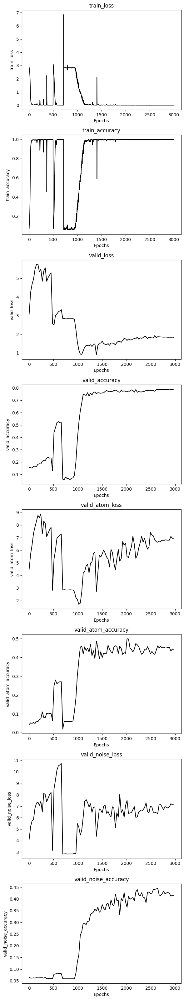

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,██████████▁▁▁▄▅█████████████████████████
train_loss,▁▁▁▁▁▁▁▁▁▁███▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▂▂▂▂▂▃▃▅▅▅▁▁▁▄▆█████████████████████████
valid_atom_accuracy,▁▂▂▂▂▃▂▅▅▁▁▂▂▅▇██▆█▇▇▇▇▇▇▇▇█▇▇▇▇█▇▇█▇██▇
valid_atom_loss,▅▆▇█▇▆▂▅▆▂▂▂▂▁▂▃▃▄▂▄▅▄▃▄▅▄▅▅▇▅▆▇▅▆▅▅▆▅▅▆
valid_loss,▄▆█▇▇▇▇▃▄▄▄▄▄▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂
valid_noise_accuracy,▁▁▁▁▁▁▁▂▂▁▁▁▁▂▅▅▅▆▆▆▆▇▇▆▇▆▇████▇▇▇██▇▇██
valid_noise_loss,▃▄▅▅▆▅▆▇█▁▁▁▁▄▃▅▅▄▅▄▄▄▄▅▄▆▅▄▄▄▄▅▅▄▄▄▅▅▅▅
epoch,3000


### 100K dataset

107101


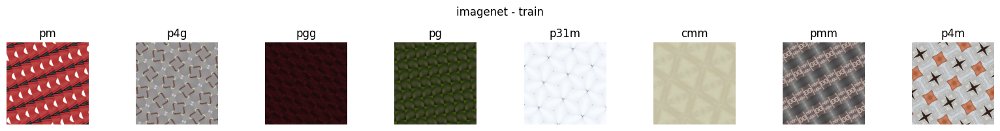

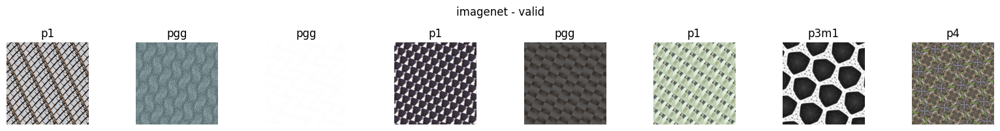

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.99, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [4]:
config = {'dataset': '100k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-100k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config)
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [5]:
lr = 1e-3
per_epoch = 3
epoch_start = 0
epochs = 300
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 2.8034, train_accuracy: 8.76%
Epoch 2/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 2.5297, train_accuracy: 15.85%
Epoch 3/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 2.1084, train_accuracy: 28.44%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 1.8539, valid_accuracy: 36.45%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.1436, valid_atom_accuracy: 8.39%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.7763, valid_noise_accuracy: 6.15%
Model saved at epoch 3
Epoch 4/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 1.6092, train_accuracy: 44.12%
Epoch 5/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 1.2138, train_accuracy: 57.57%
Epoch 6/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.9256, train_accuracy: 67.25%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.9308, valid_accuracy: 66.61%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9848, valid_atom_accuracy: 20.35%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.0616, valid_noise_accuracy: 9.24%
Model saved at epoch 6
Epoch 7/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.7364, train_accuracy: 74.10%
Epoch 8/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.6064, train_accuracy: 78.54%
Epoch 9/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.4953, train_accuracy: 82.64%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.6990, valid_accuracy: 75.14%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9675, valid_atom_accuracy: 26.33%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.2032, valid_noise_accuracy: 11.59%
Model saved at epoch 9
Epoch 10/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.4154, train_accuracy: 85.53%
Epoch 11/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.3481, train_accuracy: 87.92%
Epoch 12/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.2904, train_accuracy: 89.98%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.7042, valid_accuracy: 76.91%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.6612, valid_atom_accuracy: 28.86%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.6491, valid_noise_accuracy: 11.32%
Model saved at epoch 12
Epoch 13/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.2601, train_accuracy: 91.14%
Epoch 14/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.2117, train_accuracy: 92.98%
Epoch 15/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1964, train_accuracy: 93.41%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.7558, valid_accuracy: 77.17%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.9260, valid_atom_accuracy: 30.23%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 5.3818, valid_noise_accuracy: 11.18%
Model saved at epoch 15
Epoch 16/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.1826, train_accuracy: 93.77%
Epoch 17/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.1695, train_accuracy: 94.22%
Epoch 18/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.1618, train_accuracy: 94.47%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.7996, valid_accuracy: 77.40%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 4.5532, valid_atom_accuracy: 27.15%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.7613, valid_noise_accuracy: 14.46%
Model saved at epoch 18
Epoch 19/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.1555, train_accuracy: 94.65%
Epoch 20/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1475, train_accuracy: 94.91%
Epoch 21/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.1391, train_accuracy: 95.20%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.7977, valid_accuracy: 78.34%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.8221, valid_atom_accuracy: 31.78%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.7559, valid_noise_accuracy: 16.35%
Model saved at epoch 21
Epoch 22/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.1351, train_accuracy: 95.29%
Epoch 23/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1167, train_accuracy: 96.00%
Epoch 24/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1419, train_accuracy: 95.12%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.7495, valid_accuracy: 79.10%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5817, valid_atom_accuracy: 37.98%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.5049, valid_noise_accuracy: 17.50%
Model saved at epoch 24
Epoch 25/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.1277, train_accuracy: 95.55%
Epoch 26/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1048, train_accuracy: 96.38%
Epoch 27/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1231, train_accuracy: 95.75%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.7118, valid_accuracy: 81.18%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.8874, valid_atom_accuracy: 40.74%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.7426, valid_noise_accuracy: 18.55%
Model saved at epoch 27
Epoch 28/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.1101, train_accuracy: 96.21%
Epoch 29/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.1168, train_accuracy: 96.01%
Epoch 30/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.1155, train_accuracy: 95.99%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.6798, valid_accuracy: 81.93%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 4.0833, valid_atom_accuracy: 35.65%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 5.0342, valid_noise_accuracy: 18.03%
Model saved at epoch 30
Epoch 31/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0959, train_accuracy: 96.67%
Epoch 32/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0906, train_accuracy: 96.93%
Epoch 33/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0998, train_accuracy: 96.49%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.6674, valid_accuracy: 82.55%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5134, valid_atom_accuracy: 40.87%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 4.2862, valid_noise_accuracy: 18.33%
Model saved at epoch 33
Epoch 34/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.1388, train_accuracy: 95.21%
Epoch 35/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0851, train_accuracy: 97.07%
Epoch 36/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0921, train_accuracy: 96.83%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.6225, valid_accuracy: 83.48%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5951, valid_atom_accuracy: 41.46%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 4.3237, valid_noise_accuracy: 18.62%
Model saved at epoch 36
Epoch 37/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0905, train_accuracy: 96.85%
Epoch 38/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0811, train_accuracy: 97.15%
Epoch 39/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.1027, train_accuracy: 96.42%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.5729, valid_accuracy: 84.25%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.2867, valid_atom_accuracy: 43.06%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.3365, valid_noise_accuracy: 24.29%
Model saved at epoch 39
Epoch 40/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0780, train_accuracy: 97.33%
Epoch 41/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0790, train_accuracy: 97.23%
Epoch 42/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0968, train_accuracy: 96.74%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.5781, valid_accuracy: 84.33%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9185, valid_atom_accuracy: 46.63%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.7748, valid_noise_accuracy: 23.80%
Model saved at epoch 42
Epoch 43/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0857, train_accuracy: 96.98%
Epoch 44/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0870, train_accuracy: 97.00%
Epoch 45/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0798, train_accuracy: 97.23%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.5983, valid_accuracy: 84.95%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5160, valid_atom_accuracy: 42.85%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 3.3385, valid_noise_accuracy: 27.75%
Model saved at epoch 45
Epoch 46/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0741, train_accuracy: 97.46%
Epoch 47/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0707, train_accuracy: 97.57%
Epoch 48/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0676, train_accuracy: 97.66%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.5319, valid_accuracy: 86.23%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.4800, valid_atom_accuracy: 43.32%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 2.9867, valid_noise_accuracy: 29.78%
Model saved at epoch 48
Epoch 49/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0755, train_accuracy: 97.43%
Epoch 50/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0901, train_accuracy: 96.94%
Epoch 51/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.1064, train_accuracy: 96.48%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.4983, valid_accuracy: 86.88%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 3.3041, valid_atom_accuracy: 46.55%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.0198, valid_noise_accuracy: 30.06%
Model saved at epoch 51
Epoch 52/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0663, train_accuracy: 97.72%
Epoch 53/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0639, train_accuracy: 97.81%
Epoch 54/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0702, train_accuracy: 97.61%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.4888, valid_accuracy: 87.44%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.1021, valid_atom_accuracy: 50.12%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.2080, valid_noise_accuracy: 29.08%
Model saved at epoch 54
Epoch 55/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0612, train_accuracy: 97.89%
Epoch 56/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0606, train_accuracy: 97.92%
Epoch 57/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0718, train_accuracy: 97.52%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.4548, valid_accuracy: 88.54%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.0728, valid_atom_accuracy: 49.95%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.7864, valid_noise_accuracy: 34.83%
Model saved at epoch 57
Epoch 58/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0679, train_accuracy: 97.67%
Epoch 59/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0670, train_accuracy: 97.74%
Epoch 60/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0658, train_accuracy: 97.78%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.4495, valid_accuracy: 88.55%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.7249, valid_atom_accuracy: 53.95%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.9820, valid_noise_accuracy: 36.51%
Model saved at epoch 60
Epoch 61/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0567, train_accuracy: 98.04%
Epoch 62/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0698, train_accuracy: 97.62%
Epoch 63/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0602, train_accuracy: 97.95%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.4046, valid_accuracy: 89.15%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9584, valid_atom_accuracy: 51.78%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.1056, valid_noise_accuracy: 34.37%
Model saved at epoch 63
Epoch 64/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0685, train_accuracy: 97.71%
Epoch 65/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0534, train_accuracy: 98.15%
Epoch 66/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0529, train_accuracy: 98.18%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3690, valid_accuracy: 90.18%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.8601, valid_atom_accuracy: 54.23%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.8798, valid_noise_accuracy: 34.41%
Model saved at epoch 66
Epoch 67/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0534, train_accuracy: 98.12%
Epoch 68/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0540, train_accuracy: 98.17%
Epoch 69/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0487, train_accuracy: 98.36%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3532, valid_accuracy: 90.71%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.1090, valid_atom_accuracy: 53.33%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 3.0836, valid_noise_accuracy: 35.66%
Model saved at epoch 69
Epoch 70/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0748, train_accuracy: 97.50%
Epoch 71/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0512, train_accuracy: 98.25%
Epoch 72/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0447, train_accuracy: 98.54%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3265, valid_accuracy: 91.44%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.3629, valid_atom_accuracy: 58.75%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.3880, valid_noise_accuracy: 43.29%
Model saved at epoch 72
Epoch 73/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0468, train_accuracy: 98.41%
Epoch 74/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0526, train_accuracy: 98.25%
Epoch 75/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0429, train_accuracy: 98.58%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.3513, valid_accuracy: 91.20%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.8661, valid_atom_accuracy: 55.42%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.6394, valid_noise_accuracy: 44.98%
Model saved at epoch 75
Epoch 76/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0447, train_accuracy: 98.48%
Epoch 77/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0431, train_accuracy: 98.59%
Epoch 78/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0460, train_accuracy: 98.48%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.3345, valid_accuracy: 91.44%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.8604, valid_atom_accuracy: 54.41%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.5630, valid_noise_accuracy: 43.49%
Model saved at epoch 78
Epoch 79/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0434, train_accuracy: 98.58%
Epoch 80/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0463, train_accuracy: 98.46%
Epoch 81/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0383, train_accuracy: 98.70%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.3135, valid_accuracy: 92.28%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.0572, valid_atom_accuracy: 55.77%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1818, valid_noise_accuracy: 49.41%
Model saved at epoch 81
Epoch 82/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0320, train_accuracy: 98.93%
Epoch 83/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0320, train_accuracy: 98.93%
Epoch 84/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0412, train_accuracy: 98.65%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3565, valid_accuracy: 91.13%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6952, valid_atom_accuracy: 57.73%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.5960, valid_noise_accuracy: 46.48%
Model saved at epoch 84
Epoch 85/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0275, train_accuracy: 99.06%
Epoch 86/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0416, train_accuracy: 98.64%
Epoch 87/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0352, train_accuracy: 98.84%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3605, valid_accuracy: 91.57%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 2.6278, valid_atom_accuracy: 56.49%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.7859, valid_noise_accuracy: 48.64%
Model saved at epoch 87
Epoch 88/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0304, train_accuracy: 98.97%
Epoch 89/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0302, train_accuracy: 99.05%
Epoch 90/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0326, train_accuracy: 98.91%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.3020, valid_accuracy: 93.05%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.3869, valid_atom_accuracy: 60.39%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.9037, valid_noise_accuracy: 55.48%
Model saved at epoch 90
Epoch 91/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0283, train_accuracy: 99.02%
Epoch 92/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0375, train_accuracy: 98.75%
Epoch 93/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0303, train_accuracy: 98.99%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.3048, valid_accuracy: 93.06%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6910, valid_atom_accuracy: 56.41%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.2191, valid_noise_accuracy: 54.42%
Model saved at epoch 93
Epoch 94/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0267, train_accuracy: 99.09%
Epoch 95/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0264, train_accuracy: 99.11%
Epoch 96/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0251, train_accuracy: 99.19%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2424, valid_accuracy: 93.63%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.1450, valid_atom_accuracy: 60.70%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0998, valid_noise_accuracy: 53.06%
Model saved at epoch 96
Epoch 97/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0268, train_accuracy: 99.11%
Epoch 98/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0225, train_accuracy: 99.22%
Epoch 99/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0191, train_accuracy: 99.38%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2792, valid_accuracy: 93.82%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.5214, valid_atom_accuracy: 60.92%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0749, valid_noise_accuracy: 56.35%
Model saved at epoch 99
Epoch 100/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0244, train_accuracy: 99.23%
Epoch 101/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0200, train_accuracy: 99.32%
Epoch 102/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0289, train_accuracy: 99.05%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2427, valid_accuracy: 93.86%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.1273, valid_atom_accuracy: 63.50%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9032, valid_noise_accuracy: 57.23%
Model saved at epoch 102
Epoch 103/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0238, train_accuracy: 99.23%
Epoch 104/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0199, train_accuracy: 99.37%
Epoch 105/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0240, train_accuracy: 99.20%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.3192, valid_accuracy: 93.27%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.3947, valid_atom_accuracy: 61.34%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0533, valid_noise_accuracy: 57.66%
Model saved at epoch 105
Epoch 106/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0221, train_accuracy: 99.26%
Epoch 107/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0186, train_accuracy: 99.41%
Epoch 108/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0189, train_accuracy: 99.41%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2475, valid_accuracy: 94.31%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.1665, valid_atom_accuracy: 63.98%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9552, valid_noise_accuracy: 59.81%
Model saved at epoch 108
Epoch 109/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0176, train_accuracy: 99.44%
Epoch 110/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0170, train_accuracy: 99.44%
Epoch 111/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0160, train_accuracy: 99.49%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.3219, valid_accuracy: 92.99%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.1868, valid_atom_accuracy: 55.41%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1515, valid_noise_accuracy: 59.82%
Model saved at epoch 111
Epoch 112/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0230, train_accuracy: 99.26%
Epoch 113/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0165, train_accuracy: 99.45%
Epoch 114/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0136, train_accuracy: 99.57%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2915, valid_accuracy: 93.74%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6763, valid_atom_accuracy: 59.05%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.6285, valid_noise_accuracy: 53.03%
Model saved at epoch 114
Epoch 115/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0183, train_accuracy: 99.40%
Epoch 116/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0205, train_accuracy: 99.35%
Epoch 117/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0159, train_accuracy: 99.46%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2720, valid_accuracy: 94.02%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.4674, valid_atom_accuracy: 61.49%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 2.1600, valid_noise_accuracy: 57.75%
Model saved at epoch 117
Epoch 118/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0180, train_accuracy: 99.43%
Epoch 119/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0202, train_accuracy: 99.36%
Epoch 120/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0181, train_accuracy: 99.41%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2473, valid_accuracy: 94.42%


100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


valid_atom_loss: 2.3762, valid_atom_accuracy: 62.06%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0434, valid_noise_accuracy: 61.90%
Model saved at epoch 120
Epoch 121/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0162, train_accuracy: 99.47%
Epoch 122/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0104, train_accuracy: 99.66%
Epoch 123/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0173, train_accuracy: 99.40%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2467, valid_accuracy: 94.62%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6057, valid_atom_accuracy: 59.59%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.7909, valid_noise_accuracy: 62.67%
Model saved at epoch 123
Epoch 124/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0141, train_accuracy: 99.55%
Epoch 125/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0127, train_accuracy: 99.58%
Epoch 126/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0154, train_accuracy: 99.49%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2663, valid_accuracy: 94.11%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6462, valid_atom_accuracy: 61.86%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.9006, valid_noise_accuracy: 62.58%
Model saved at epoch 126
Epoch 127/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0148, train_accuracy: 99.54%
Epoch 128/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0154, train_accuracy: 99.50%
Epoch 129/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0151, train_accuracy: 99.51%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2285, valid_accuracy: 94.84%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.1470, valid_atom_accuracy: 68.19%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1340, valid_noise_accuracy: 59.90%
Model saved at epoch 129
Epoch 130/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0130, train_accuracy: 99.59%
Epoch 131/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0136, train_accuracy: 99.58%
Epoch 132/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0140, train_accuracy: 99.56%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2255, valid_accuracy: 95.14%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.1520, valid_atom_accuracy: 64.73%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.7922, valid_noise_accuracy: 64.34%
Model saved at epoch 132
Epoch 133/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0111, train_accuracy: 99.63%
Epoch 134/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0111, train_accuracy: 99.63%
Epoch 135/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0119, train_accuracy: 99.61%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2520, valid_accuracy: 95.05%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.7150, valid_atom_accuracy: 63.44%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1043, valid_noise_accuracy: 62.88%
Model saved at epoch 135
Epoch 136/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0125, train_accuracy: 99.56%
Epoch 137/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0114, train_accuracy: 99.63%
Epoch 138/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0094, train_accuracy: 99.70%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2344, valid_accuracy: 95.23%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.2560, valid_atom_accuracy: 66.32%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0280, valid_noise_accuracy: 63.28%
Model saved at epoch 138
Epoch 139/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0109, train_accuracy: 99.65%
Epoch 140/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0150, train_accuracy: 99.51%
Epoch 141/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0135, train_accuracy: 99.56%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2200, valid_accuracy: 95.03%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 1.4771, valid_atom_accuracy: 70.09%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.5552, valid_noise_accuracy: 67.10%
Model saved at epoch 141
Epoch 142/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0111, train_accuracy: 99.64%
Epoch 143/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0066, train_accuracy: 99.77%
Epoch 144/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0056, train_accuracy: 99.82%


100%|██████████| 25/25 [00:26<00:00,  1.06s/it]


valid_loss: 0.2668, valid_accuracy: 95.07%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.2867, valid_atom_accuracy: 69.00%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9951, valid_noise_accuracy: 64.70%
Model saved at epoch 144
Epoch 145/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0097, train_accuracy: 99.72%
Epoch 146/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0116, train_accuracy: 99.63%
Epoch 147/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0128, train_accuracy: 99.56%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2205, valid_accuracy: 95.23%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 1.9924, valid_atom_accuracy: 68.17%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.7266, valid_noise_accuracy: 66.27%
Model saved at epoch 147
Epoch 148/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0071, train_accuracy: 99.77%
Epoch 149/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0069, train_accuracy: 99.77%
Epoch 150/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0089, train_accuracy: 99.70%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2328, valid_accuracy: 95.36%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.5862, valid_atom_accuracy: 66.49%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.5685, valid_noise_accuracy: 70.10%
Model saved at epoch 150
Epoch 151/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0106, train_accuracy: 99.64%
Epoch 152/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0116, train_accuracy: 99.62%
Epoch 153/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0067, train_accuracy: 99.78%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2351, valid_accuracy: 95.45%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.7123, valid_atom_accuracy: 63.25%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.6289, valid_noise_accuracy: 57.52%
Model saved at epoch 153
Epoch 154/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0078, train_accuracy: 99.75%
Epoch 155/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0072, train_accuracy: 99.77%
Epoch 156/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0051, train_accuracy: 99.84%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2361, valid_accuracy: 95.79%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.5734, valid_atom_accuracy: 67.11%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0411, valid_noise_accuracy: 66.64%
Model saved at epoch 156
Epoch 157/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0052, train_accuracy: 99.82%
Epoch 158/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0098, train_accuracy: 99.70%
Epoch 159/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0101, train_accuracy: 99.66%


100%|██████████| 25/25 [00:25<00:00,  1.02s/it]


valid_loss: 0.2374, valid_accuracy: 95.40%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6129, valid_atom_accuracy: 63.16%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.3306, valid_noise_accuracy: 59.83%
Model saved at epoch 159
Epoch 160/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0106, train_accuracy: 99.66%
Epoch 161/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0072, train_accuracy: 99.78%
Epoch 162/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0087, train_accuracy: 99.72%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2375, valid_accuracy: 95.32%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 1.9467, valid_atom_accuracy: 68.74%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9616, valid_noise_accuracy: 65.83%
Model saved at epoch 162
Epoch 163/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0085, train_accuracy: 99.74%
Epoch 164/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0066, train_accuracy: 99.78%
Epoch 165/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0054, train_accuracy: 99.82%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2551, valid_accuracy: 95.36%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.7107, valid_atom_accuracy: 64.37%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 3.1158, valid_noise_accuracy: 52.54%
Model saved at epoch 165
Epoch 166/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0063, train_accuracy: 99.79%
Epoch 167/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0064, train_accuracy: 99.79%
Epoch 168/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0067, train_accuracy: 99.80%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2668, valid_accuracy: 94.96%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.3096, valid_atom_accuracy: 66.72%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.9209, valid_noise_accuracy: 65.51%
Model saved at epoch 168
Epoch 169/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0087, train_accuracy: 99.72%
Epoch 170/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0070, train_accuracy: 99.77%
Epoch 171/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0054, train_accuracy: 99.83%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2289, valid_accuracy: 95.91%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 2.6606, valid_atom_accuracy: 63.41%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.2195, valid_noise_accuracy: 65.16%
Model saved at epoch 171
Epoch 172/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0054, train_accuracy: 99.83%
Epoch 173/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0065, train_accuracy: 99.80%
Epoch 174/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0056, train_accuracy: 99.82%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2698, valid_accuracy: 95.39%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 2.4431, valid_atom_accuracy: 65.80%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.6355, valid_noise_accuracy: 70.59%
Model saved at epoch 174
Epoch 175/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0053, train_accuracy: 99.82%
Epoch 176/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0046, train_accuracy: 99.85%
Epoch 177/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0057, train_accuracy: 99.80%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2429, valid_accuracy: 95.66%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.2015, valid_atom_accuracy: 68.21%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.5538, valid_noise_accuracy: 70.43%
Model saved at epoch 177
Epoch 178/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0066, train_accuracy: 99.79%
Epoch 179/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0063, train_accuracy: 99.79%
Epoch 180/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0068, train_accuracy: 99.79%


100%|██████████| 25/25 [00:25<00:00,  1.04s/it]


valid_loss: 0.2423, valid_accuracy: 95.45%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6080, valid_atom_accuracy: 63.96%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.7965, valid_noise_accuracy: 66.71%
Model saved at epoch 180
Epoch 181/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0062, train_accuracy: 99.79%
Epoch 182/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0061, train_accuracy: 99.81%
Epoch 183/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0048, train_accuracy: 99.85%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2443, valid_accuracy: 95.79%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6351, valid_atom_accuracy: 64.92%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.8050, valid_noise_accuracy: 71.05%
Model saved at epoch 183
Epoch 184/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0054, train_accuracy: 99.83%
Epoch 185/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0054, train_accuracy: 99.83%
Epoch 186/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0050, train_accuracy: 99.84%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2379, valid_accuracy: 95.93%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9242, valid_atom_accuracy: 63.94%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.6345, valid_noise_accuracy: 73.39%
Model saved at epoch 186
Epoch 187/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 188/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0053, train_accuracy: 99.84%
Epoch 189/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0050, train_accuracy: 99.84%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2404, valid_accuracy: 95.67%


100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


valid_atom_loss: 2.6367, valid_atom_accuracy: 62.88%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 1.7899, valid_noise_accuracy: 69.76%
Model saved at epoch 189
Epoch 190/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0050, train_accuracy: 99.83%
Epoch 191/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0052, train_accuracy: 99.83%
Epoch 192/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0040, train_accuracy: 99.87%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2517, valid_accuracy: 95.81%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6475, valid_atom_accuracy: 65.41%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.7027, valid_noise_accuracy: 71.80%
Model saved at epoch 192
Epoch 193/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0039, train_accuracy: 99.87%
Epoch 194/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 195/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0029, train_accuracy: 99.90%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2527, valid_accuracy: 96.03%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 2.6472, valid_atom_accuracy: 67.73%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.5346, valid_noise_accuracy: 64.31%
Model saved at epoch 195
Epoch 196/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 197/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0044, train_accuracy: 99.86%
Epoch 198/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0074, train_accuracy: 99.78%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2011, valid_accuracy: 96.17%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6662, valid_atom_accuracy: 64.59%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.9103, valid_noise_accuracy: 68.77%
Model saved at epoch 198
Epoch 199/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0048, train_accuracy: 99.84%
Epoch 200/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0043, train_accuracy: 99.86%
Epoch 201/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0046, train_accuracy: 99.84%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2805, valid_accuracy: 95.29%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.1334, valid_atom_accuracy: 60.44%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0658, valid_noise_accuracy: 66.25%
Model saved at epoch 201
Epoch 202/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0037, train_accuracy: 99.88%
Epoch 203/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0035, train_accuracy: 99.89%
Epoch 204/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2383, valid_accuracy: 96.16%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9101, valid_atom_accuracy: 66.82%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.2115, valid_noise_accuracy: 66.23%
Model saved at epoch 204
Epoch 205/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0028, train_accuracy: 99.90%
Epoch 206/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 207/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0023, train_accuracy: 99.92%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2455, valid_accuracy: 96.32%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.0550, valid_atom_accuracy: 67.15%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.2326, valid_noise_accuracy: 67.21%
Model saved at epoch 207
Epoch 208/300


100%|██████████| 100/100 [03:52<00:00,  2.33s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 209/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 210/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2531, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.2332, valid_atom_accuracy: 66.44%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.3134, valid_noise_accuracy: 67.07%
Model saved at epoch 210
Epoch 211/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 212/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 213/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.03s/it]


valid_loss: 0.2553, valid_accuracy: 96.24%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.1677, valid_atom_accuracy: 66.92%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.3822, valid_noise_accuracy: 66.65%
Model saved at epoch 213
Epoch 214/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 215/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 216/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2614, valid_accuracy: 96.23%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3143, valid_atom_accuracy: 66.35%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 2.2483, valid_noise_accuracy: 68.25%
Model saved at epoch 216
Epoch 217/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0022, train_accuracy: 99.93%
Epoch 218/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0023, train_accuracy: 99.92%
Epoch 219/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2608, valid_accuracy: 96.28%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3562, valid_atom_accuracy: 66.46%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.3705, valid_noise_accuracy: 67.39%
Model saved at epoch 219
Epoch 220/300


100%|██████████| 100/100 [03:52<00:00,  2.33s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 221/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 222/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2623, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3189, valid_atom_accuracy: 66.59%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.3206, valid_noise_accuracy: 68.05%
Model saved at epoch 222
Epoch 223/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0023, train_accuracy: 99.93%
Epoch 224/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0030, train_accuracy: 99.90%
Epoch 225/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0094, train_accuracy: 99.68%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2121, valid_accuracy: 95.60%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6923, valid_atom_accuracy: 63.46%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.5422, valid_noise_accuracy: 70.57%
Model saved at epoch 225
Epoch 226/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0047, train_accuracy: 99.84%
Epoch 227/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0024, train_accuracy: 99.92%
Epoch 228/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0022, train_accuracy: 99.92%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2404, valid_accuracy: 96.16%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.6471, valid_atom_accuracy: 66.66%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.7840, valid_noise_accuracy: 71.10%
Model saved at epoch 228
Epoch 229/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 230/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 231/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.93%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2336, valid_accuracy: 96.31%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.8217, valid_atom_accuracy: 67.51%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.7956, valid_noise_accuracy: 71.67%
Model saved at epoch 231
Epoch 232/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 233/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 234/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0020, train_accuracy: 99.93%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2435, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 2.9790, valid_atom_accuracy: 66.60%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.8767, valid_noise_accuracy: 71.15%
Model saved at epoch 234
Epoch 235/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0022, train_accuracy: 99.92%
Epoch 236/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 237/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0020, train_accuracy: 99.92%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2438, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 2.9624, valid_atom_accuracy: 66.98%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9124, valid_noise_accuracy: 71.15%
Model saved at epoch 237
Epoch 238/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 239/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.92%
Epoch 240/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.92%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2471, valid_accuracy: 96.27%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.0514, valid_atom_accuracy: 66.87%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9361, valid_noise_accuracy: 71.05%
Model saved at epoch 240
Epoch 241/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 242/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 243/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0020, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2507, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.1276, valid_atom_accuracy: 66.77%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9074, valid_noise_accuracy: 71.60%
Model saved at epoch 243
Epoch 244/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 245/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 246/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0020, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2553, valid_accuracy: 96.31%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.1030, valid_atom_accuracy: 66.70%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 1.9982, valid_noise_accuracy: 70.91%
Model saved at epoch 246
Epoch 247/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 248/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0021, train_accuracy: 99.93%
Epoch 249/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2542, valid_accuracy: 96.26%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.3600, valid_atom_accuracy: 66.15%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.8633, valid_noise_accuracy: 72.54%
Model saved at epoch 249
Epoch 250/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0020, train_accuracy: 99.93%
Epoch 251/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 252/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2565, valid_accuracy: 96.29%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3001, valid_atom_accuracy: 66.47%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.8429, valid_noise_accuracy: 73.07%
Model saved at epoch 252
Epoch 253/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 254/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 255/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2594, valid_accuracy: 96.30%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.4453, valid_atom_accuracy: 65.71%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.9782, valid_noise_accuracy: 71.88%
Model saved at epoch 255
Epoch 256/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 257/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.94%
Epoch 258/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0020, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2595, valid_accuracy: 96.38%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3765, valid_atom_accuracy: 66.05%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.9709, valid_noise_accuracy: 71.93%
Model saved at epoch 258
Epoch 259/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 260/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 261/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2592, valid_accuracy: 96.42%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.3836, valid_atom_accuracy: 66.53%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 1.8884, valid_noise_accuracy: 73.16%
Model saved at epoch 261
Epoch 262/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 263/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%
Epoch 264/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0019, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2607, valid_accuracy: 96.32%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.4831, valid_atom_accuracy: 65.86%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 1.9009, valid_noise_accuracy: 73.12%
Model saved at epoch 264
Epoch 265/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 266/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 267/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0018, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2644, valid_accuracy: 96.34%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.4613, valid_atom_accuracy: 65.91%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 1.9755, valid_noise_accuracy: 72.46%
Model saved at epoch 267
Epoch 268/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 269/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0017, train_accuracy: 99.93%
Epoch 270/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0017, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2693, valid_accuracy: 96.31%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5248, valid_atom_accuracy: 65.64%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0686, valid_noise_accuracy: 71.69%
Model saved at epoch 270
Epoch 271/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0018, train_accuracy: 99.94%
Epoch 272/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 273/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.02s/it]


valid_loss: 0.2599, valid_accuracy: 96.38%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5392, valid_atom_accuracy: 65.57%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0113, valid_noise_accuracy: 72.63%
Model saved at epoch 273
Epoch 274/300


100%|██████████| 100/100 [03:54<00:00,  2.35s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 275/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 276/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2623, valid_accuracy: 96.33%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.6087, valid_atom_accuracy: 65.33%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.0806, valid_noise_accuracy: 71.88%
Model saved at epoch 276
Epoch 277/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0018, train_accuracy: 99.93%
Epoch 278/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 279/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.93%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2659, valid_accuracy: 96.30%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5791, valid_atom_accuracy: 65.26%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0634, valid_noise_accuracy: 72.12%
Model saved at epoch 279
Epoch 280/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 281/300


100%|██████████| 100/100 [03:56<00:00,  2.37s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 282/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2650, valid_accuracy: 96.34%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5334, valid_atom_accuracy: 65.64%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1149, valid_noise_accuracy: 71.56%
Model saved at epoch 282
Epoch 283/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 284/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 285/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2661, valid_accuracy: 96.39%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5200, valid_atom_accuracy: 65.99%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.0147, valid_noise_accuracy: 72.68%
Model saved at epoch 285
Epoch 286/300


100%|██████████| 100/100 [03:54<00:00,  2.34s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 287/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0017, train_accuracy: 99.94%
Epoch 288/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2656, valid_accuracy: 96.34%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5078, valid_atom_accuracy: 66.13%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.1093, valid_noise_accuracy: 71.65%
Model saved at epoch 288
Epoch 289/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 290/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0015, train_accuracy: 99.94%
Epoch 291/300


100%|██████████| 100/100 [03:56<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.01s/it]


valid_loss: 0.2639, valid_accuracy: 96.37%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.4825, valid_atom_accuracy: 66.30%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 2.0193, valid_noise_accuracy: 72.64%
Model saved at epoch 291
Epoch 292/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 293/300


100%|██████████| 100/100 [03:55<00:00,  2.35s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 294/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0015, train_accuracy: 99.94%


100%|██████████| 25/25 [00:24<00:00,  1.00it/s]


valid_loss: 0.2666, valid_accuracy: 96.35%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 3.5106, valid_atom_accuracy: 66.20%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0379, valid_noise_accuracy: 72.53%
Model saved at epoch 294
Epoch 295/300


100%|██████████| 100/100 [03:53<00:00,  2.33s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 296/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 297/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 25/25 [00:25<00:00,  1.00s/it]


valid_loss: 0.2643, valid_accuracy: 96.41%


100%|██████████| 238/238 [03:35<00:00,  1.11it/s]


valid_atom_loss: 3.5090, valid_atom_accuracy: 66.15%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0190, valid_noise_accuracy: 72.82%
Model saved at epoch 297
Epoch 298/300


100%|██████████| 100/100 [03:53<00:00,  2.34s/it]


train_loss: 0.0016, train_accuracy: 99.94%
Epoch 299/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.95%
Epoch 300/300


100%|██████████| 100/100 [03:55<00:00,  2.36s/it]


train_loss: 0.0016, train_accuracy: 99.94%


100%|██████████| 25/25 [00:24<00:00,  1.01it/s]


valid_loss: 0.2678, valid_accuracy: 96.37%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 3.5227, valid_atom_accuracy: 65.97%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 2.0948, valid_noise_accuracy: 71.85%
Model saved at epoch 300


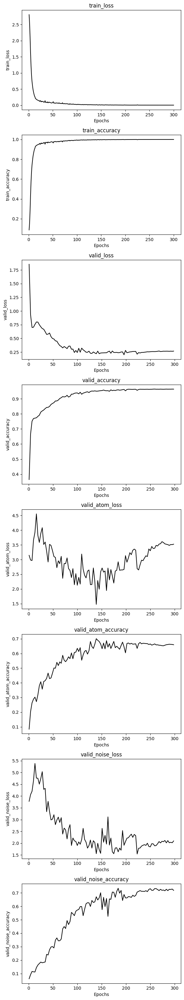

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_accuracy,▁▇██████████████████████████████████████
train_loss,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▄▃▄▅▅▆▆▇▇▇▇▇▇▇▇▇█▇▇█▇██████████████████
valid_atom_accuracy,▁▂▂▄▄▄▅▅▆▆▆▆▆▇▆▇▆▇██████▇▇▇█▇▇█▇▇▇██▇▇█▇
valid_atom_loss,▅▇█▇▅▆▅▅▄▃▄▄▃▃▅▄▄▃▁▂▃▂▃▃▅▄▄▄▇▆▄▆▅▅▅▅▆▆▆▆
valid_loss,█▅▇▆▄▅▄▄▂▁▂▃▂▂▂▂▂▁▁▂▂▂▂▁▁▂▁▂▁▁▂▁▁▂▂▁▁▂▂▂
valid_noise_accuracy,▁▁▂▂▂▃▃▄▄▅▅▅▆▆▇▆▇▇▇▇▇▇▇███▇██▇██████████
valid_noise_loss,▆▇██▇▅▄▄▄▃▃▃▂▂▂▂▂▁▂▂▂▂▂▁▁▂▂▂▂▃▁▂▂▂▂▂▂▂▂▂
epoch,300


### 500K dataset

524792


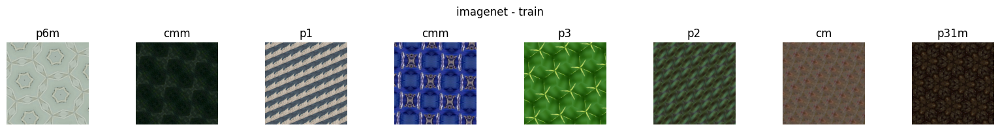

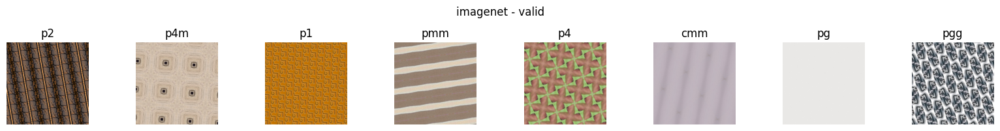

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.951, seed=42) # model can't process single image batch
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [4]:
config = {'dataset': '500k datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-500k'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [5]:
lr = 1e-3
per_epoch = 3
epoch_start = 0
epochs = 150
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/150


100%|██████████| 489/489 [24:37<00:00,  3.02s/it]


train_loss: 2.1087, train_accuracy: 28.80%
Epoch 2/150


100%|██████████| 489/489 [19:43<00:00,  2.42s/it]


train_loss: 0.7477, train_accuracy: 73.21%
Epoch 3/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.4541, train_accuracy: 83.65%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.4181, valid_accuracy: 84.96%


100%|██████████| 238/238 [03:44<00:00,  1.06it/s]


valid_atom_loss: 1.6925, valid_atom_accuracy: 48.58%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 2.3426, valid_noise_accuracy: 33.75%
Model saved at epoch 3
Epoch 4/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.3442, train_accuracy: 87.65%
Epoch 5/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.2812, train_accuracy: 90.06%
Epoch 6/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.2388, train_accuracy: 91.61%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.2545, valid_accuracy: 91.09%


100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


valid_atom_loss: 1.8112, valid_atom_accuracy: 51.91%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 1.9791, valid_noise_accuracy: 44.40%
Model saved at epoch 6
Epoch 7/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.1991, train_accuracy: 93.05%
Epoch 8/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.1720, train_accuracy: 94.04%
Epoch 9/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.1554, train_accuracy: 94.64%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.1903, valid_accuracy: 93.64%


100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


valid_atom_loss: 1.2900, valid_atom_accuracy: 63.42%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 1.5863, valid_noise_accuracy: 51.60%
Model saved at epoch 9
Epoch 10/150


100%|██████████| 489/489 [19:06<00:00,  2.35s/it]


train_loss: 0.1343, train_accuracy: 95.39%
Epoch 11/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.1229, train_accuracy: 95.75%
Epoch 12/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.1109, train_accuracy: 96.21%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.1688, valid_accuracy: 94.58%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 1.6441, valid_atom_accuracy: 60.79%


100%|██████████| 119/119 [01:53<00:00,  1.05it/s]


valid_noise_loss: 1.6429, valid_noise_accuracy: 54.84%
Model saved at epoch 12
Epoch 13/150


100%|██████████| 489/489 [19:16<00:00,  2.36s/it]


train_loss: 0.1019, train_accuracy: 96.56%
Epoch 14/150


100%|██████████| 489/489 [19:18<00:00,  2.37s/it]


train_loss: 0.0944, train_accuracy: 96.79%
Epoch 15/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0833, train_accuracy: 97.17%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.1240, valid_accuracy: 95.98%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.1797, valid_atom_accuracy: 68.41%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 1.1776, valid_noise_accuracy: 64.38%
Model saved at epoch 15
Epoch 16/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0801, train_accuracy: 97.29%
Epoch 17/150


100%|██████████| 489/489 [18:59<00:00,  2.33s/it]


train_loss: 0.0735, train_accuracy: 97.52%
Epoch 18/150


100%|██████████| 489/489 [19:00<00:00,  2.33s/it]


train_loss: 0.0706, train_accuracy: 97.66%


100%|██████████| 123/123 [01:56<00:00,  1.05it/s]


valid_loss: 0.1050, valid_accuracy: 96.72%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 1.0961, valid_atom_accuracy: 71.50%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 1.0611, valid_noise_accuracy: 68.38%
Model saved at epoch 18
Epoch 19/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0650, train_accuracy: 97.85%
Epoch 20/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0604, train_accuracy: 98.00%
Epoch 21/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0590, train_accuracy: 98.04%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.0841, valid_accuracy: 97.30%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 1.2273, valid_atom_accuracy: 71.19%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.9755, valid_noise_accuracy: 72.45%
Model saved at epoch 21
Epoch 22/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0564, train_accuracy: 98.15%
Epoch 23/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0544, train_accuracy: 98.23%
Epoch 24/150


100%|██████████| 489/489 [19:06<00:00,  2.35s/it]


train_loss: 0.0513, train_accuracy: 98.33%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0759, valid_accuracy: 97.67%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 1.0984, valid_atom_accuracy: 77.82%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.5394, valid_noise_accuracy: 81.75%
Model saved at epoch 24
Epoch 25/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0500, train_accuracy: 98.39%
Epoch 26/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0468, train_accuracy: 98.50%
Epoch 27/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0431, train_accuracy: 98.62%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.0885, valid_accuracy: 97.32%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 1.1701, valid_atom_accuracy: 71.78%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.6476, valid_noise_accuracy: 80.92%
Model saved at epoch 27
Epoch 28/150


100%|██████████| 489/489 [19:03<00:00,  2.34s/it]


train_loss: 0.0429, train_accuracy: 98.61%
Epoch 29/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0413, train_accuracy: 98.66%
Epoch 30/150


100%|██████████| 489/489 [19:06<00:00,  2.35s/it]


train_loss: 0.0442, train_accuracy: 98.61%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.0599, valid_accuracy: 98.20%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 0.9133, valid_atom_accuracy: 76.72%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.4512, valid_noise_accuracy: 85.44%
Model saved at epoch 30
Epoch 31/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0340, train_accuracy: 98.91%
Epoch 32/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0360, train_accuracy: 98.86%
Epoch 33/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0348, train_accuracy: 98.90%


100%|██████████| 123/123 [01:52<00:00,  1.09it/s]


valid_loss: 0.0533, valid_accuracy: 98.39%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 0.9218, valid_atom_accuracy: 79.26%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.4470, valid_noise_accuracy: 85.76%
Model saved at epoch 33
Epoch 34/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0335, train_accuracy: 98.93%
Epoch 35/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0326, train_accuracy: 98.99%
Epoch 36/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0294, train_accuracy: 99.07%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0520, valid_accuracy: 98.46%


100%|██████████| 238/238 [03:37<00:00,  1.10it/s]


valid_atom_loss: 0.9679, valid_atom_accuracy: 79.85%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.4752, valid_noise_accuracy: 85.98%
Model saved at epoch 36
Epoch 37/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0284, train_accuracy: 99.09%
Epoch 38/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.0262, train_accuracy: 99.18%
Epoch 39/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0266, train_accuracy: 99.17%


100%|██████████| 123/123 [01:53<00:00,  1.09it/s]


valid_loss: 0.0531, valid_accuracy: 98.44%


100%|██████████| 238/238 [03:36<00:00,  1.10it/s]


valid_atom_loss: 0.9053, valid_atom_accuracy: 79.72%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3185, valid_noise_accuracy: 89.87%
Model saved at epoch 39
Epoch 40/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.0251, train_accuracy: 99.20%
Epoch 41/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0236, train_accuracy: 99.24%
Epoch 42/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0273, train_accuracy: 99.14%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0547, valid_accuracy: 98.57%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 0.9848, valid_atom_accuracy: 80.24%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3572, valid_noise_accuracy: 89.07%
Model saved at epoch 42
Epoch 43/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0220, train_accuracy: 99.29%
Epoch 44/150


100%|██████████| 489/489 [19:13<00:00,  2.36s/it]


train_loss: 0.0191, train_accuracy: 99.38%
Epoch 45/150


100%|██████████| 489/489 [19:15<00:00,  2.36s/it]


train_loss: 0.0185, train_accuracy: 99.38%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0454, valid_accuracy: 98.85%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.3686, valid_atom_accuracy: 78.16%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.4620, valid_noise_accuracy: 87.51%
Model saved at epoch 45
Epoch 46/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0186, train_accuracy: 99.37%
Epoch 47/150


100%|██████████| 489/489 [19:13<00:00,  2.36s/it]


train_loss: 0.0172, train_accuracy: 99.41%
Epoch 48/150


100%|██████████| 489/489 [19:11<00:00,  2.36s/it]


train_loss: 0.0161, train_accuracy: 99.44%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0465, valid_accuracy: 98.78%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.3410, valid_atom_accuracy: 79.58%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3702, valid_noise_accuracy: 90.04%
Model saved at epoch 48
Epoch 49/150


100%|██████████| 489/489 [19:19<00:00,  2.37s/it]


train_loss: 0.0143, train_accuracy: 99.49%
Epoch 50/150


100%|██████████| 489/489 [19:01<00:00,  2.34s/it]


train_loss: 0.0141, train_accuracy: 99.50%
Epoch 51/150


100%|██████████| 489/489 [19:03<00:00,  2.34s/it]


train_loss: 0.0151, train_accuracy: 99.46%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0438, valid_accuracy: 98.84%


100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


valid_atom_loss: 0.8854, valid_atom_accuracy: 82.41%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.3447, valid_noise_accuracy: 90.36%
Model saved at epoch 51
Epoch 52/150


100%|██████████| 489/489 [19:01<00:00,  2.33s/it]


train_loss: 0.0133, train_accuracy: 99.52%
Epoch 53/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.0113, train_accuracy: 99.59%
Epoch 54/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.0125, train_accuracy: 99.56%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0485, valid_accuracy: 98.82%


100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


valid_atom_loss: 1.6238, valid_atom_accuracy: 75.11%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3282, valid_noise_accuracy: 91.40%
Model saved at epoch 54
Epoch 55/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.0111, train_accuracy: 99.60%
Epoch 56/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.0112, train_accuracy: 99.58%
Epoch 57/150


100%|██████████| 489/489 [18:59<00:00,  2.33s/it]


train_loss: 0.0101, train_accuracy: 99.64%


100%|██████████| 123/123 [01:52<00:00,  1.10it/s]


valid_loss: 0.0404, valid_accuracy: 99.08%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 1.0590, valid_atom_accuracy: 84.08%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.3892, valid_noise_accuracy: 90.19%
Model saved at epoch 57
Epoch 58/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0114, train_accuracy: 99.58%
Epoch 59/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0096, train_accuracy: 99.65%
Epoch 60/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0092, train_accuracy: 99.66%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0441, valid_accuracy: 99.04%


100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


valid_atom_loss: 1.3900, valid_atom_accuracy: 81.59%


100%|██████████| 119/119 [01:47<00:00,  1.10it/s]


valid_noise_loss: 0.2325, valid_noise_accuracy: 93.72%
Model saved at epoch 60
Epoch 61/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0092, train_accuracy: 99.66%
Epoch 62/150


100%|██████████| 489/489 [19:00<00:00,  2.33s/it]


train_loss: 0.0092, train_accuracy: 99.66%
Epoch 63/150


100%|██████████| 489/489 [19:00<00:00,  2.33s/it]


train_loss: 0.0095, train_accuracy: 99.66%


100%|██████████| 123/123 [01:50<00:00,  1.12it/s]


valid_loss: 0.0433, valid_accuracy: 99.07%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.4248, valid_atom_accuracy: 79.77%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 0.2552, valid_noise_accuracy: 93.31%
Model saved at epoch 63
Epoch 64/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0077, train_accuracy: 99.71%
Epoch 65/150


100%|██████████| 489/489 [19:00<00:00,  2.33s/it]


train_loss: 0.0081, train_accuracy: 99.70%
Epoch 66/150


100%|██████████| 489/489 [19:02<00:00,  2.34s/it]


train_loss: 0.0086, train_accuracy: 99.69%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0441, valid_accuracy: 98.99%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.2948, valid_atom_accuracy: 81.22%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 0.3028, valid_noise_accuracy: 91.87%
Model saved at epoch 66
Epoch 67/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0076, train_accuracy: 99.73%
Epoch 68/150


100%|██████████| 489/489 [19:00<00:00,  2.33s/it]


train_loss: 0.0075, train_accuracy: 99.73%
Epoch 69/150


100%|██████████| 489/489 [18:59<00:00,  2.33s/it]


train_loss: 0.0076, train_accuracy: 99.72%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0404, valid_accuracy: 99.07%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 1.1833, valid_atom_accuracy: 84.50%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3035, valid_noise_accuracy: 92.73%
Model saved at epoch 69
Epoch 70/150


100%|██████████| 489/489 [18:55<00:00,  2.32s/it]


train_loss: 0.0078, train_accuracy: 99.72%
Epoch 71/150


100%|██████████| 489/489 [18:56<00:00,  2.32s/it]


train_loss: 0.0067, train_accuracy: 99.76%
Epoch 72/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0072, train_accuracy: 99.74%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0429, valid_accuracy: 99.01%


100%|██████████| 238/238 [03:43<00:00,  1.07it/s]


valid_atom_loss: 1.9607, valid_atom_accuracy: 75.62%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 0.3488, valid_noise_accuracy: 91.67%
Model saved at epoch 72
Epoch 73/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0063, train_accuracy: 99.77%
Epoch 74/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0060, train_accuracy: 99.78%
Epoch 75/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0067, train_accuracy: 99.76%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0440, valid_accuracy: 99.13%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 1.2921, valid_atom_accuracy: 84.73%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.3670, valid_noise_accuracy: 92.24%
Model saved at epoch 75
Epoch 76/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0067, train_accuracy: 99.76%
Epoch 77/150


100%|██████████| 489/489 [18:57<00:00,  2.33s/it]


train_loss: 0.0065, train_accuracy: 99.77%
Epoch 78/150


100%|██████████| 489/489 [18:56<00:00,  2.32s/it]


train_loss: 0.0058, train_accuracy: 99.79%


100%|██████████| 123/123 [01:55<00:00,  1.06it/s]


valid_loss: 0.0405, valid_accuracy: 99.17%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 1.2362, valid_atom_accuracy: 83.95%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.2314, valid_noise_accuracy: 94.06%
Model saved at epoch 78
Epoch 79/150


100%|██████████| 489/489 [18:53<00:00,  2.32s/it]


train_loss: 0.0051, train_accuracy: 99.81%
Epoch 80/150


100%|██████████| 489/489 [18:55<00:00,  2.32s/it]


train_loss: 0.0061, train_accuracy: 99.78%
Epoch 81/150


100%|██████████| 489/489 [18:55<00:00,  2.32s/it]


train_loss: 0.0062, train_accuracy: 99.78%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0436, valid_accuracy: 99.14%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.4192, valid_atom_accuracy: 83.45%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2635, valid_noise_accuracy: 93.86%
Model saved at epoch 81
Epoch 82/150


100%|██████████| 489/489 [18:56<00:00,  2.32s/it]


train_loss: 0.0053, train_accuracy: 99.81%
Epoch 83/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0053, train_accuracy: 99.81%
Epoch 84/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0044, train_accuracy: 99.84%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0471, valid_accuracy: 99.12%


100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


valid_atom_loss: 1.7016, valid_atom_accuracy: 83.84%


100%|██████████| 119/119 [01:47<00:00,  1.10it/s]


valid_noise_loss: 0.4638, valid_noise_accuracy: 90.86%
Model saved at epoch 84
Epoch 85/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0053, train_accuracy: 99.81%
Epoch 86/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0048, train_accuracy: 99.82%
Epoch 87/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0049, train_accuracy: 99.82%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0457, valid_accuracy: 99.10%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.4262, valid_atom_accuracy: 79.94%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3130, valid_noise_accuracy: 92.61%
Model saved at epoch 87
Epoch 88/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0043, train_accuracy: 99.85%
Epoch 89/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0044, train_accuracy: 99.85%
Epoch 90/150


100%|██████████| 489/489 [18:55<00:00,  2.32s/it]


train_loss: 0.0048, train_accuracy: 99.83%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0437, valid_accuracy: 99.20%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 1.7798, valid_atom_accuracy: 78.42%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2719, valid_noise_accuracy: 93.69%
Model saved at epoch 90
Epoch 91/150


100%|██████████| 489/489 [18:53<00:00,  2.32s/it]


train_loss: 0.0040, train_accuracy: 99.86%
Epoch 92/150


100%|██████████| 489/489 [18:58<00:00,  2.33s/it]


train_loss: 0.0041, train_accuracy: 99.86%
Epoch 93/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0038, train_accuracy: 99.86%


100%|██████████| 123/123 [01:51<00:00,  1.11it/s]


valid_loss: 0.0470, valid_accuracy: 99.19%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 1.3890, valid_atom_accuracy: 84.74%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3150, valid_noise_accuracy: 93.46%
Model saved at epoch 93
Epoch 94/150


100%|██████████| 489/489 [18:56<00:00,  2.32s/it]


train_loss: 0.0038, train_accuracy: 99.87%
Epoch 95/150


100%|██████████| 489/489 [18:53<00:00,  2.32s/it]


train_loss: 0.0043, train_accuracy: 99.85%
Epoch 96/150


100%|██████████| 489/489 [18:54<00:00,  2.32s/it]


train_loss: 0.0034, train_accuracy: 99.88%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0467, valid_accuracy: 99.25%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.6240, valid_atom_accuracy: 86.41%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.2860, valid_noise_accuracy: 93.93%
Model saved at epoch 96
Epoch 97/150


100%|██████████| 489/489 [18:52<00:00,  2.32s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 98/150


100%|██████████| 489/489 [18:53<00:00,  2.32s/it]


train_loss: 0.0039, train_accuracy: 99.87%
Epoch 99/150


100%|██████████| 489/489 [18:53<00:00,  2.32s/it]


train_loss: 0.0036, train_accuracy: 99.87%


100%|██████████| 123/123 [01:50<00:00,  1.11it/s]


valid_loss: 0.0554, valid_accuracy: 99.16%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.9427, valid_atom_accuracy: 82.37%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.2711, valid_noise_accuracy: 94.52%
Model saved at epoch 99
Epoch 100/150


100%|██████████| 489/489 [18:52<00:00,  2.32s/it]


train_loss: 0.0033, train_accuracy: 99.89%
Epoch 101/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0031, train_accuracy: 99.90%
Epoch 102/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0033, train_accuracy: 99.89%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0468, valid_accuracy: 99.21%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.5297, valid_atom_accuracy: 84.24%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3373, valid_noise_accuracy: 93.35%
Model saved at epoch 102
Epoch 103/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0032, train_accuracy: 99.89%
Epoch 104/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0036, train_accuracy: 99.88%
Epoch 105/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0031, train_accuracy: 99.89%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0458, valid_accuracy: 99.26%


100%|██████████| 238/238 [03:45<00:00,  1.06it/s]


valid_atom_loss: 1.5525, valid_atom_accuracy: 85.21%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.3190, valid_noise_accuracy: 94.06%
Model saved at epoch 105
Epoch 106/150


100%|██████████| 489/489 [19:04<00:00,  2.34s/it]


train_loss: 0.0032, train_accuracy: 99.89%
Epoch 107/150


100%|██████████| 489/489 [19:06<00:00,  2.35s/it]


train_loss: 0.0030, train_accuracy: 99.90%
Epoch 108/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0027, train_accuracy: 99.90%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0541, valid_accuracy: 99.26%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.7005, valid_atom_accuracy: 85.29%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3648, valid_noise_accuracy: 93.89%
Model saved at epoch 108
Epoch 109/150


100%|██████████| 489/489 [19:05<00:00,  2.34s/it]


train_loss: 0.0028, train_accuracy: 99.90%
Epoch 110/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.0031, train_accuracy: 99.89%
Epoch 111/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0029, train_accuracy: 99.90%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0514, valid_accuracy: 99.24%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.5327, valid_atom_accuracy: 85.36%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.4020, valid_noise_accuracy: 93.65%
Model saved at epoch 111
Epoch 112/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0032, train_accuracy: 99.89%
Epoch 113/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0029, train_accuracy: 99.90%
Epoch 114/150


100%|██████████| 489/489 [19:11<00:00,  2.36s/it]


train_loss: 0.0028, train_accuracy: 99.90%


100%|██████████| 123/123 [01:55<00:00,  1.06it/s]


valid_loss: 0.0501, valid_accuracy: 99.28%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.4769, valid_atom_accuracy: 87.12%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3127, valid_noise_accuracy: 94.53%
Model saved at epoch 114
Epoch 115/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 116/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 117/150


100%|██████████| 489/489 [19:12<00:00,  2.36s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0518, valid_accuracy: 99.29%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.3555, valid_atom_accuracy: 88.20%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3392, valid_noise_accuracy: 94.40%
Model saved at epoch 117
Epoch 118/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0029, train_accuracy: 99.90%
Epoch 119/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0028, train_accuracy: 99.90%
Epoch 120/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0027, train_accuracy: 99.91%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0569, valid_accuracy: 99.24%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.7755, valid_atom_accuracy: 84.70%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3639, valid_noise_accuracy: 94.03%
Model saved at epoch 120
Epoch 121/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.0028, train_accuracy: 99.90%
Epoch 122/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 123/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0542, valid_accuracy: 99.27%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.7427, valid_atom_accuracy: 85.80%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.2918, valid_noise_accuracy: 94.53%
Model saved at epoch 123
Epoch 124/150


100%|██████████| 489/489 [19:06<00:00,  2.34s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 125/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 126/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0557, valid_accuracy: 99.29%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.7789, valid_atom_accuracy: 85.69%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.3427, valid_noise_accuracy: 94.19%
Model saved at epoch 126
Epoch 127/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 128/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 129/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0559, valid_accuracy: 99.30%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 1.7402, valid_atom_accuracy: 86.35%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.3368, valid_noise_accuracy: 94.32%
Model saved at epoch 129
Epoch 130/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 131/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 132/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.07it/s]


valid_loss: 0.0576, valid_accuracy: 99.30%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.7857, valid_atom_accuracy: 86.44%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3678, valid_noise_accuracy: 94.15%
Model saved at epoch 132
Epoch 133/150


100%|██████████| 489/489 [19:08<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 134/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 135/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0591, valid_accuracy: 99.30%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.8061, valid_atom_accuracy: 86.35%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3574, valid_noise_accuracy: 94.35%
Model saved at epoch 135
Epoch 136/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 137/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 138/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0596, valid_accuracy: 99.30%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.8225, valid_atom_accuracy: 86.34%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3755, valid_noise_accuracy: 94.23%
Model saved at epoch 138
Epoch 139/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 140/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 141/150


100%|██████████| 489/489 [19:12<00:00,  2.36s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0603, valid_accuracy: 99.31%


100%|██████████| 238/238 [03:37<00:00,  1.09it/s]


valid_atom_loss: 1.7767, valid_atom_accuracy: 86.67%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3797, valid_noise_accuracy: 94.23%
Model saved at epoch 141
Epoch 142/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 143/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 144/150


100%|██████████| 489/489 [19:12<00:00,  2.36s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:53<00:00,  1.08it/s]


valid_loss: 0.0609, valid_accuracy: 99.29%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.8372, valid_atom_accuracy: 86.14%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3707, valid_noise_accuracy: 94.30%
Model saved at epoch 144
Epoch 145/150


100%|██████████| 489/489 [19:09<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 146/150


100%|██████████| 489/489 [19:11<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 147/150


100%|██████████| 489/489 [19:11<00:00,  2.36s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0602, valid_accuracy: 99.30%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.7710, valid_atom_accuracy: 86.62%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.3684, valid_noise_accuracy: 94.32%
Model saved at epoch 147
Epoch 148/150


100%|██████████| 489/489 [19:07<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 149/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%
Epoch 150/150


100%|██████████| 489/489 [19:10<00:00,  2.35s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 123/123 [01:54<00:00,  1.08it/s]


valid_loss: 0.0608, valid_accuracy: 99.31%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 1.7747, valid_atom_accuracy: 86.78%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.3614, valid_noise_accuracy: 94.42%
Model saved at epoch 150


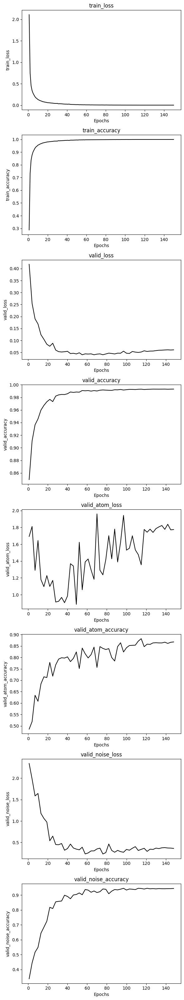

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning_root/notebooks/various_dataset_size/wandb/run-20241002_033631-09302024-XCiT-dataset_v5_size-500k/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▁▄▆▇▇▇▇▇█▇██████████████████████████████
train_loss,█▅▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▃▅▆▇▇▇██▇▇█████████████████████████████
valid_atom_accuracy,▁▂▄▄▆▅▅▆▆▇▆▇▇▇▇▇▇▇▆▇▇▇▇▆█████████▇█▇████
valid_atom_loss,▇▇▄▄▁▃▂▁▁▁▁▁▄▂▃▄▄▂█▄▃▄▅▇▄▆▄▅▆▄▄▄▇▇▆█▆▇▆█
valid_loss,█▅▄▃▂▂▂▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▂▁▁▁▁▁▂▁▁▃▂▁
valid_noise_accuracy,▁▂▃▅▅▅▆▇▇▇▇▇▇▇▇███████▇█████████████████
valid_noise_loss,█▇▅▄▄▄▂▂▂▂▁▂▂▁▂▁▁▁▁▁▁▁▂▁▁▁▂▁▂▂▁▁▁▁▁▂▂▁▁▁
epoch,150


### 1 million dataset

1070897


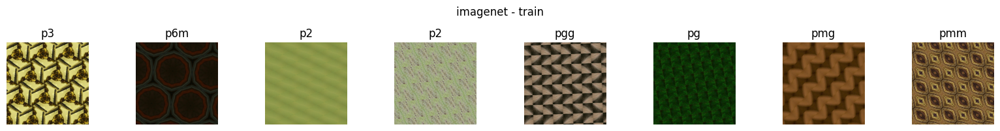

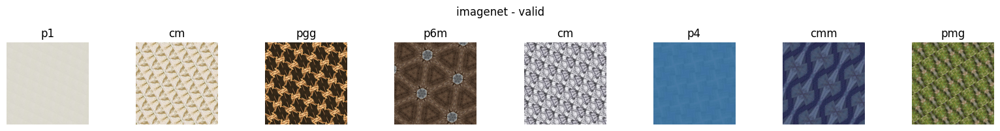

In [2]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.90001, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [3]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [4]:
config = {'dataset': '1m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-1m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')  
config = wandb.config

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: yig319. Use `wandb login --relogin` to force relogin


In [11]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 100
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/100


100%|██████████| 997/997 [38:57<00:00,  2.34s/it]


train_loss: 1.4113, train_accuracy: 51.67%
Epoch 2/100


100%|██████████| 997/997 [38:42<00:00,  2.33s/it]


train_loss: 0.4126, train_accuracy: 85.22%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.3434, valid_accuracy: 87.99%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 1.7679, valid_atom_accuracy: 48.61%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 1.9564, valid_noise_accuracy: 42.47%
Model saved at epoch 2
Epoch 3/100


100%|██████████| 997/997 [38:29<00:00,  2.32s/it]


train_loss: 0.2774, train_accuracy: 90.25%
Epoch 4/100


100%|██████████| 997/997 [38:30<00:00,  2.32s/it]


train_loss: 0.2083, train_accuracy: 92.80%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.1999, valid_accuracy: 93.06%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.2203, valid_atom_accuracy: 63.52%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 1.4036, valid_noise_accuracy: 56.31%
Model saved at epoch 4
Epoch 5/100


100%|██████████| 997/997 [38:27<00:00,  2.31s/it]


train_loss: 0.1609, train_accuracy: 94.54%
Epoch 6/100


100%|██████████| 997/997 [38:29<00:00,  2.32s/it]


train_loss: 0.1325, train_accuracy: 95.54%


100%|██████████| 250/250 [03:40<00:00,  1.14it/s]


valid_loss: 0.1339, valid_accuracy: 95.53%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.9663, valid_atom_accuracy: 71.23%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 1.0761, valid_noise_accuracy: 64.58%
Model saved at epoch 6
Epoch 7/100


100%|██████████| 997/997 [38:31<00:00,  2.32s/it]


train_loss: 0.1099, train_accuracy: 96.36%
Epoch 8/100


100%|██████████| 997/997 [38:37<00:00,  2.32s/it]


train_loss: 0.0933, train_accuracy: 96.92%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0981, valid_accuracy: 96.82%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.9566, valid_atom_accuracy: 75.72%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.9017, valid_noise_accuracy: 71.38%
Model saved at epoch 8
Epoch 9/100


100%|██████████| 997/997 [38:34<00:00,  2.32s/it]


train_loss: 0.0808, train_accuracy: 97.34%
Epoch 10/100


100%|██████████| 997/997 [38:32<00:00,  2.32s/it]


train_loss: 0.0711, train_accuracy: 97.70%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0808, valid_accuracy: 97.46%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.9981, valid_atom_accuracy: 75.38%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.5777, valid_noise_accuracy: 80.27%
Model saved at epoch 10
Epoch 11/100


100%|██████████| 997/997 [38:29<00:00,  2.32s/it]


train_loss: 0.0623, train_accuracy: 97.98%
Epoch 12/100


100%|██████████| 997/997 [38:31<00:00,  2.32s/it]


train_loss: 0.0575, train_accuracy: 98.14%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0673, valid_accuracy: 97.92%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 1.0854, valid_atom_accuracy: 69.69%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.4752, valid_noise_accuracy: 84.49%
Model saved at epoch 12
Epoch 13/100


100%|██████████| 997/997 [38:30<00:00,  2.32s/it]


train_loss: 0.0523, train_accuracy: 98.33%
Epoch 14/100


100%|██████████| 997/997 [38:32<00:00,  2.32s/it]


train_loss: 0.0497, train_accuracy: 98.42%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.0583, valid_accuracy: 98.18%


100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


valid_atom_loss: 0.9006, valid_atom_accuracy: 75.79%


100%|██████████| 119/119 [01:48<00:00,  1.09it/s]


valid_noise_loss: 0.4334, valid_noise_accuracy: 85.86%
Model saved at epoch 14
Epoch 15/100


100%|██████████| 997/997 [38:32<00:00,  2.32s/it]


train_loss: 0.0456, train_accuracy: 98.57%
Epoch 16/100


100%|██████████| 997/997 [38:30<00:00,  2.32s/it]


train_loss: 0.0433, train_accuracy: 98.64%


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


valid_loss: 0.0581, valid_accuracy: 98.20%


100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


valid_atom_loss: 0.6550, valid_atom_accuracy: 81.96%


100%|██████████| 119/119 [01:44<00:00,  1.14it/s]


valid_noise_loss: 0.5401, valid_noise_accuracy: 83.14%
Model saved at epoch 16
Epoch 17/100


100%|██████████| 997/997 [38:26<00:00,  2.31s/it]


train_loss: 0.0413, train_accuracy: 98.70%
Epoch 18/100


100%|██████████| 997/997 [38:33<00:00,  2.32s/it]


train_loss: 0.0388, train_accuracy: 98.79%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0509, valid_accuracy: 98.57%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.8081, valid_atom_accuracy: 80.83%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.4082, valid_noise_accuracy: 86.64%
Model saved at epoch 18
Epoch 19/100


100%|██████████| 997/997 [38:26<00:00,  2.31s/it]


train_loss: 0.0360, train_accuracy: 98.88%
Epoch 20/100


100%|██████████| 997/997 [38:29<00:00,  2.32s/it]


train_loss: 0.0335, train_accuracy: 98.96%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0434, valid_accuracy: 98.73%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.8272, valid_atom_accuracy: 82.03%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.2570, valid_noise_accuracy: 91.44%
Model saved at epoch 20
Epoch 21/100


100%|██████████| 997/997 [38:26<00:00,  2.31s/it]


train_loss: 0.0326, train_accuracy: 99.00%
Epoch 22/100


100%|██████████| 997/997 [38:28<00:00,  2.32s/it]


train_loss: 0.0307, train_accuracy: 99.07%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0366, valid_accuracy: 98.92%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.0818, valid_atom_accuracy: 80.83%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.2862, valid_noise_accuracy: 90.56%
Model saved at epoch 22
Epoch 23/100


100%|██████████| 997/997 [38:24<00:00,  2.31s/it]


train_loss: 0.0279, train_accuracy: 99.15%
Epoch 24/100


100%|██████████| 997/997 [38:27<00:00,  2.31s/it]


train_loss: 0.0276, train_accuracy: 99.17%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0419, valid_accuracy: 98.76%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.8987, valid_atom_accuracy: 81.46%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.3151, valid_noise_accuracy: 90.64%
Model saved at epoch 24
Epoch 25/100


100%|██████████| 997/997 [38:25<00:00,  2.31s/it]


train_loss: 0.0259, train_accuracy: 99.22%
Epoch 26/100


100%|██████████| 997/997 [38:33<00:00,  2.32s/it]


train_loss: 0.0245, train_accuracy: 99.26%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0320, valid_accuracy: 99.08%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7264, valid_atom_accuracy: 83.64%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.2061, valid_noise_accuracy: 93.22%
Model saved at epoch 26
Epoch 27/100


100%|██████████| 997/997 [38:24<00:00,  2.31s/it]


train_loss: 0.0225, train_accuracy: 99.32%
Epoch 28/100


100%|██████████| 997/997 [38:25<00:00,  2.31s/it]


train_loss: 0.0221, train_accuracy: 99.34%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0318, valid_accuracy: 99.09%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.8967, valid_atom_accuracy: 84.33%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.2067, valid_noise_accuracy: 93.35%
Model saved at epoch 28
Epoch 29/100


100%|██████████| 997/997 [38:22<00:00,  2.31s/it]


train_loss: 0.0208, train_accuracy: 99.37%
Epoch 30/100


  6%|▌         | 58/997 [02:19<37:32,  2.40s/it] 


RuntimeError: cuDNN error: CUDNN_STATUS_EXECUTION_FAILED

In [5]:
lr = 1e-3
per_epoch = 2
epoch_start = 30
epochs = 70
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 31/100


100%|██████████| 997/997 [38:39<00:00,  2.33s/it]


train_loss: 1.4322, train_accuracy: 50.94%
Epoch 32/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.4235, train_accuracy: 84.73%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.3323, valid_accuracy: 88.05%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 1.5795, valid_atom_accuracy: 50.25%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 1.8593, valid_noise_accuracy: 43.23%
Model saved at epoch 32
Epoch 33/100


100%|██████████| 997/997 [38:39<00:00,  2.33s/it]


train_loss: 0.2724, train_accuracy: 90.47%
Epoch 34/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.1996, train_accuracy: 93.17%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.1919, valid_accuracy: 93.57%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 0.8360, valid_atom_accuracy: 74.21%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 1.3739, valid_noise_accuracy: 60.19%
Model saved at epoch 34
Epoch 35/100


100%|██████████| 997/997 [38:36<00:00,  2.32s/it]


train_loss: 0.1516, train_accuracy: 94.89%
Epoch 36/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.1196, train_accuracy: 96.03%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.1162, valid_accuracy: 96.17%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 0.7788, valid_atom_accuracy: 76.02%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 1.0867, valid_noise_accuracy: 66.43%
Model saved at epoch 36
Epoch 37/100


100%|██████████| 997/997 [38:37<00:00,  2.32s/it]


train_loss: 0.0970, train_accuracy: 96.81%
Epoch 38/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.0824, train_accuracy: 97.32%


100%|██████████| 250/250 [03:47<00:00,  1.10it/s]


valid_loss: 0.0945, valid_accuracy: 96.90%


100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


valid_atom_loss: 0.9263, valid_atom_accuracy: 71.81%


100%|██████████| 119/119 [01:44<00:00,  1.14it/s]


valid_noise_loss: 0.9202, valid_noise_accuracy: 72.36%
Model saved at epoch 38
Epoch 39/100


100%|██████████| 997/997 [38:17<00:00,  2.30s/it]


train_loss: 0.0719, train_accuracy: 97.68%
Epoch 40/100


100%|██████████| 997/997 [38:24<00:00,  2.31s/it]


train_loss: 0.0629, train_accuracy: 97.98%


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


valid_loss: 0.0676, valid_accuracy: 97.89%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 0.6145, valid_atom_accuracy: 83.09%


100%|██████████| 119/119 [01:49<00:00,  1.08it/s]


valid_noise_loss: 0.6168, valid_noise_accuracy: 79.15%
Model saved at epoch 40
Epoch 41/100


100%|██████████| 997/997 [38:24<00:00,  2.31s/it]


train_loss: 0.0585, train_accuracy: 98.14%
Epoch 42/100


100%|██████████| 997/997 [38:18<00:00,  2.31s/it]


train_loss: 0.0534, train_accuracy: 98.31%


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


valid_loss: 0.0625, valid_accuracy: 98.06%


100%|██████████| 238/238 [03:27<00:00,  1.15it/s]


valid_atom_loss: 0.8529, valid_atom_accuracy: 80.28%


100%|██████████| 119/119 [01:44<00:00,  1.14it/s]


valid_noise_loss: 0.4573, valid_noise_accuracy: 84.91%
Model saved at epoch 42
Epoch 43/100


100%|██████████| 997/997 [38:15<00:00,  2.30s/it]


train_loss: 0.0502, train_accuracy: 98.43%
Epoch 44/100


100%|██████████| 997/997 [38:20<00:00,  2.31s/it]


train_loss: 0.0457, train_accuracy: 98.57%


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


valid_loss: 0.0499, valid_accuracy: 98.48%


100%|██████████| 238/238 [03:34<00:00,  1.11it/s]


valid_atom_loss: 0.5839, valid_atom_accuracy: 86.67%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.4876, valid_noise_accuracy: 84.48%
Model saved at epoch 44
Epoch 45/100


100%|██████████| 997/997 [38:28<00:00,  2.32s/it]


train_loss: 0.0435, train_accuracy: 98.64%
Epoch 46/100


100%|██████████| 997/997 [38:26<00:00,  2.31s/it]


train_loss: 0.0401, train_accuracy: 98.77%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0499, valid_accuracy: 98.49%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7013, valid_atom_accuracy: 82.02%


100%|██████████| 119/119 [01:49<00:00,  1.09it/s]


valid_noise_loss: 0.6088, valid_noise_accuracy: 82.11%
Model saved at epoch 46
Epoch 47/100


100%|██████████| 997/997 [38:07<00:00,  2.29s/it]


train_loss: 0.0368, train_accuracy: 98.88%
Epoch 48/100


100%|██████████| 997/997 [38:07<00:00,  2.29s/it]


train_loss: 0.0349, train_accuracy: 98.95%


100%|██████████| 250/250 [03:38<00:00,  1.15it/s]


valid_loss: 0.0483, valid_accuracy: 98.54%


100%|██████████| 238/238 [03:35<00:00,  1.10it/s]


valid_atom_loss: 1.0080, valid_atom_accuracy: 79.44%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.3220, valid_noise_accuracy: 89.55%
Model saved at epoch 48
Epoch 49/100


100%|██████████| 997/997 [38:16<00:00,  2.30s/it]


train_loss: 0.0309, train_accuracy: 99.05%
Epoch 50/100


100%|██████████| 997/997 [38:18<00:00,  2.31s/it]


train_loss: 0.0306, train_accuracy: 99.07%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0393, valid_accuracy: 98.87%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7582, valid_atom_accuracy: 85.49%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2645, valid_noise_accuracy: 91.30%
Model saved at epoch 50
Epoch 51/100


100%|██████████| 997/997 [38:13<00:00,  2.30s/it]


train_loss: 0.0278, train_accuracy: 99.16%
Epoch 52/100


100%|██████████| 997/997 [38:17<00:00,  2.30s/it]


train_loss: 0.0248, train_accuracy: 99.26%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0327, valid_accuracy: 99.06%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.9028, valid_atom_accuracy: 84.31%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2318, valid_noise_accuracy: 93.00%
Model saved at epoch 52
Epoch 53/100


100%|██████████| 997/997 [38:18<00:00,  2.31s/it]


train_loss: 0.0239, train_accuracy: 99.28%
Epoch 54/100


100%|██████████| 997/997 [38:15<00:00,  2.30s/it]


train_loss: 0.0222, train_accuracy: 99.34%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.0318, valid_accuracy: 99.09%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7629, valid_atom_accuracy: 85.16%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2332, valid_noise_accuracy: 92.39%
Model saved at epoch 54
Epoch 55/100


100%|██████████| 997/997 [38:16<00:00,  2.30s/it]


train_loss: 0.0205, train_accuracy: 99.38%
Epoch 56/100


100%|██████████| 997/997 [38:16<00:00,  2.30s/it]


train_loss: 0.0203, train_accuracy: 99.39%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0275, valid_accuracy: 99.21%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.5472, valid_atom_accuracy: 86.91%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2903, valid_noise_accuracy: 91.73%
Model saved at epoch 56
Epoch 57/100


100%|██████████| 997/997 [38:13<00:00,  2.30s/it]


train_loss: 0.0180, train_accuracy: 99.46%
Epoch 58/100


100%|██████████| 997/997 [38:14<00:00,  2.30s/it]


train_loss: 0.0181, train_accuracy: 99.46%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0280, valid_accuracy: 99.21%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 1.0198, valid_atom_accuracy: 83.32%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1862, valid_noise_accuracy: 94.05%
Model saved at epoch 58
Epoch 59/100


100%|██████████| 997/997 [38:12<00:00,  2.30s/it]


train_loss: 0.0167, train_accuracy: 99.50%
Epoch 60/100


100%|██████████| 997/997 [38:14<00:00,  2.30s/it]


train_loss: 0.0162, train_accuracy: 99.52%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0270, valid_accuracy: 99.28%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.5834, valid_atom_accuracy: 89.68%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1973, valid_noise_accuracy: 94.35%
Model saved at epoch 60
Epoch 61/100


100%|██████████| 997/997 [38:13<00:00,  2.30s/it]


train_loss: 0.0155, train_accuracy: 99.54%
Epoch 62/100


100%|██████████| 997/997 [38:16<00:00,  2.30s/it]


train_loss: 0.0146, train_accuracy: 99.56%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0258, valid_accuracy: 99.33%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.5080, valid_atom_accuracy: 91.16%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2197, valid_noise_accuracy: 93.70%
Model saved at epoch 62
Epoch 63/100


100%|██████████| 997/997 [38:15<00:00,  2.30s/it]


train_loss: 0.0137, train_accuracy: 99.58%
Epoch 64/100


100%|██████████| 997/997 [38:12<00:00,  2.30s/it]


train_loss: 0.0137, train_accuracy: 99.59%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0255, valid_accuracy: 99.34%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.3522, valid_atom_accuracy: 83.36%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1836, valid_noise_accuracy: 94.92%
Model saved at epoch 64
Epoch 65/100


100%|██████████| 997/997 [38:15<00:00,  2.30s/it]


train_loss: 0.0124, train_accuracy: 99.62%
Epoch 66/100


100%|██████████| 997/997 [38:19<00:00,  2.31s/it]


train_loss: 0.0113, train_accuracy: 99.64%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0245, valid_accuracy: 99.38%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7130, valid_atom_accuracy: 89.93%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1980, valid_noise_accuracy: 94.62%
Model saved at epoch 66
Epoch 67/100


100%|██████████| 997/997 [38:17<00:00,  2.30s/it]


train_loss: 0.0102, train_accuracy: 99.67%
Epoch 68/100


100%|██████████| 997/997 [38:22<00:00,  2.31s/it]


train_loss: 0.0100, train_accuracy: 99.66%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0284, valid_accuracy: 99.34%


100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


valid_atom_loss: 0.7093, valid_atom_accuracy: 89.47%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.1767, valid_noise_accuracy: 95.31%
Model saved at epoch 68
Epoch 69/100


100%|██████████| 997/997 [38:31<00:00,  2.32s/it]


train_loss: 0.0086, train_accuracy: 99.70%
Epoch 70/100


100%|██████████| 997/997 [38:45<00:00,  2.33s/it]


train_loss: 0.0080, train_accuracy: 99.70%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0265, valid_accuracy: 99.36%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7526, valid_atom_accuracy: 89.01%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.2329, valid_noise_accuracy: 94.42%
Model saved at epoch 70
Epoch 71/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.0073, train_accuracy: 99.72%
Epoch 72/100


100%|██████████| 997/997 [38:50<00:00,  2.34s/it]


train_loss: 0.0065, train_accuracy: 99.74%


100%|██████████| 250/250 [03:45<00:00,  1.11it/s]


valid_loss: 0.0273, valid_accuracy: 99.42%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.6844, valid_atom_accuracy: 91.02%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1952, valid_noise_accuracy: 95.36%
Model saved at epoch 72
Epoch 73/100


100%|██████████| 997/997 [38:42<00:00,  2.33s/it]


train_loss: 0.0062, train_accuracy: 99.76%
Epoch 74/100


100%|██████████| 997/997 [38:50<00:00,  2.34s/it]


train_loss: 0.0057, train_accuracy: 99.77%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0299, valid_accuracy: 99.38%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.9819, valid_atom_accuracy: 88.64%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2145, valid_noise_accuracy: 95.29%
Model saved at epoch 74
Epoch 75/100


100%|██████████| 997/997 [38:42<00:00,  2.33s/it]


train_loss: 0.0055, train_accuracy: 99.78%
Epoch 76/100


100%|██████████| 997/997 [38:44<00:00,  2.33s/it]


train_loss: 0.0053, train_accuracy: 99.78%


100%|██████████| 250/250 [03:42<00:00,  1.12it/s]


valid_loss: 0.0314, valid_accuracy: 99.35%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.9586, valid_atom_accuracy: 87.09%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.3886, valid_noise_accuracy: 93.49%
Model saved at epoch 76
Epoch 77/100


100%|██████████| 997/997 [38:43<00:00,  2.33s/it]


train_loss: 0.0048, train_accuracy: 99.80%
Epoch 78/100


100%|██████████| 997/997 [38:46<00:00,  2.33s/it]


train_loss: 0.0048, train_accuracy: 99.80%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0315, valid_accuracy: 99.35%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 1.0196, valid_atom_accuracy: 85.55%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.2317, valid_noise_accuracy: 94.77%
Model saved at epoch 78
Epoch 79/100


100%|██████████| 997/997 [38:43<00:00,  2.33s/it]


train_loss: 0.0046, train_accuracy: 99.81%
Epoch 80/100


100%|██████████| 997/997 [38:44<00:00,  2.33s/it]


train_loss: 0.0043, train_accuracy: 99.82%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0334, valid_accuracy: 99.35%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.9982, valid_atom_accuracy: 88.64%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2601, valid_noise_accuracy: 94.62%
Model saved at epoch 80
Epoch 81/100


100%|██████████| 997/997 [38:41<00:00,  2.33s/it]


train_loss: 0.0045, train_accuracy: 99.82%
Epoch 82/100


100%|██████████| 997/997 [38:42<00:00,  2.33s/it]


train_loss: 0.0042, train_accuracy: 99.84%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0320, valid_accuracy: 99.42%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.0759, valid_atom_accuracy: 88.13%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.3300, valid_noise_accuracy: 94.38%
Model saved at epoch 82
Epoch 83/100


100%|██████████| 997/997 [38:41<00:00,  2.33s/it]


train_loss: 0.0039, train_accuracy: 99.85%
Epoch 84/100


100%|██████████| 997/997 [38:43<00:00,  2.33s/it]


train_loss: 0.0038, train_accuracy: 99.85%


100%|██████████| 250/250 [03:41<00:00,  1.13it/s]


valid_loss: 0.0329, valid_accuracy: 99.46%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.9999, valid_atom_accuracy: 90.10%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.3739, valid_noise_accuracy: 94.39%
Model saved at epoch 84
Epoch 85/100


100%|██████████| 997/997 [38:41<00:00,  2.33s/it]


train_loss: 0.0038, train_accuracy: 99.86%
Epoch 86/100


100%|██████████| 997/997 [38:44<00:00,  2.33s/it]


train_loss: 0.0036, train_accuracy: 99.86%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0346, valid_accuracy: 99.44%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 1.1322, valid_atom_accuracy: 89.22%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.4273, valid_noise_accuracy: 94.04%
Model saved at epoch 86
Epoch 87/100


100%|██████████| 997/997 [38:40<00:00,  2.33s/it]


train_loss: 0.0035, train_accuracy: 99.87%
Epoch 88/100


100%|██████████| 997/997 [38:43<00:00,  2.33s/it]


train_loss: 0.0032, train_accuracy: 99.88%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0376, valid_accuracy: 99.44%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.1329, valid_atom_accuracy: 89.15%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.3049, valid_noise_accuracy: 95.36%
Model saved at epoch 88
Epoch 89/100


100%|██████████| 997/997 [38:38<00:00,  2.33s/it]


train_loss: 0.0031, train_accuracy: 99.89%
Epoch 90/100


100%|██████████| 997/997 [38:39<00:00,  2.33s/it]


train_loss: 0.0029, train_accuracy: 99.89%


100%|██████████| 250/250 [03:40<00:00,  1.14it/s]


valid_loss: 0.0408, valid_accuracy: 99.44%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.2344, valid_atom_accuracy: 89.16%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.3230, valid_noise_accuracy: 95.39%
Model saved at epoch 90
Epoch 91/100


100%|██████████| 997/997 [38:32<00:00,  2.32s/it]


train_loss: 0.0029, train_accuracy: 99.90%
Epoch 92/100


100%|██████████| 997/997 [38:33<00:00,  2.32s/it]


train_loss: 0.0028, train_accuracy: 99.90%


100%|██████████| 250/250 [03:40<00:00,  1.13it/s]


valid_loss: 0.0423, valid_accuracy: 99.43%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 1.3200, valid_atom_accuracy: 88.92%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.3318, valid_noise_accuracy: 95.19%
Model saved at epoch 92
Epoch 93/100


100%|██████████| 997/997 [38:30<00:00,  2.32s/it]


train_loss: 0.0027, train_accuracy: 99.91%
Epoch 94/100


100%|██████████| 997/997 [38:28<00:00,  2.32s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 250/250 [03:40<00:00,  1.14it/s]


valid_loss: 0.0445, valid_accuracy: 99.45%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.4257, valid_atom_accuracy: 88.47%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.3322, valid_noise_accuracy: 95.35%
Model saved at epoch 94
Epoch 95/100


100%|██████████| 997/997 [38:24<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 96/100


100%|██████████| 997/997 [38:23<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0455, valid_accuracy: 99.45%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.4669, valid_atom_accuracy: 88.33%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.3276, valid_noise_accuracy: 95.43%
Model saved at epoch 96
Epoch 97/100


100%|██████████| 997/997 [38:20<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 98/100


100%|██████████| 997/997 [38:23<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0452, valid_accuracy: 99.45%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 1.4443, valid_atom_accuracy: 88.52%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.3509, valid_noise_accuracy: 95.22%
Model saved at epoch 98
Epoch 99/100


100%|██████████| 997/997 [38:21<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%
Epoch 100/100


100%|██████████| 997/997 [38:23<00:00,  2.31s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 250/250 [03:39<00:00,  1.14it/s]


valid_loss: 0.0457, valid_accuracy: 99.45%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 1.4526, valid_atom_accuracy: 88.63%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.3314, valid_noise_accuracy: 95.42%
Model saved at epoch 100


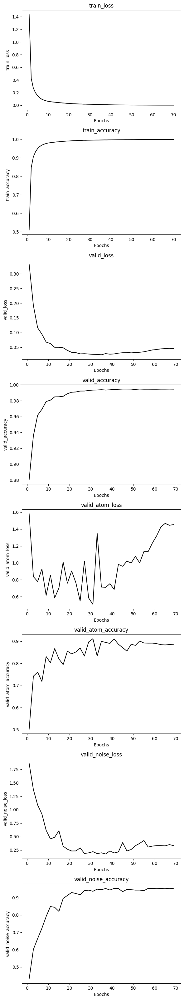

In [6]:
trainer.plot_training_metrics()

In [7]:
wandb.finish()

wandb: WARNING Ensure read and write access to run files dir: /scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning_root/notebooks/various_dataset_size/wandb/run-20241005_164608-09302024-XCiT-dataset_v5_size-1m/files, control this via the WANDB_DIR env var. See https://docs.wandb.ai/guides/track/environment-variables


epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▁▅▆▇▇▇█▇█▇█▇████████████████████████████
train_loss,█▅▄▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▅▆▆▆▇▇▇▇█▇▇▇█████▇█████████████████████
valid_atom_accuracy,▁▅▆▆▅▇▆█▇▆▇▇▇▇▇▇██▇██▇██▇█▇▇█████▇█▇██▇█
valid_atom_loss,█▄▂▃▄▂▃▁▂▃▃▄▂▃▁▅▂▁▅▂▂▂▃▂▄▃▄▅▅▄▄▆▅▆▄▇▇▅▇█
valid_loss,█▅▃▃▃▂▃▂▂▁▂▂▁▁▁▁▁▂▂▁▂▂▂▁▁▂▂▁▂▁▂▁▁▁▂▂▂▁▂▂
valid_noise_accuracy,▁▃▄▄▅▆▇▆▆▆▇▇█▇█▇███▇████████████████████
valid_noise_loss,█▆▅▅▄▃▂▂▃▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▁▁▂▂▂▁▂▂▁▂▂▂▂
epoch,100


### 2 million dataset

2142007


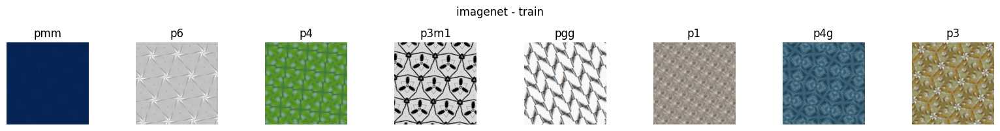

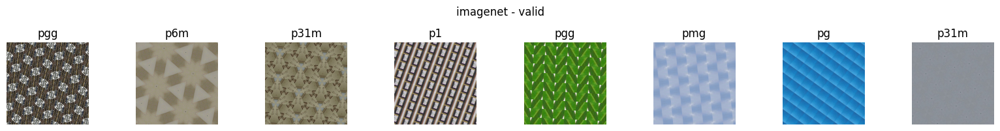

In [8]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [9]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [10]:
config = {'dataset': '2m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-2m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')
config = wandb.config

In [11]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 50
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/50


100%|██████████| 1993/1993 [1:17:17<00:00,  2.33s/it]


train_loss: 0.9351, train_accuracy: 67.78%


100%|██████████| 499/499 [07:23<00:00,  1.12it/s]


valid_loss: 0.3377, valid_accuracy: 88.09%


100%|██████████| 238/238 [03:31<00:00,  1.13it/s]


valid_atom_loss: 1.4620, valid_atom_accuracy: 53.86%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 1.6648, valid_noise_accuracy: 47.45%
Model saved at epoch 1
Epoch 2/50


100%|██████████| 1993/1993 [1:17:23<00:00,  2.33s/it]


train_loss: 0.2457, train_accuracy: 91.53%


100%|██████████| 499/499 [07:22<00:00,  1.13it/s]


valid_loss: 0.2035, valid_accuracy: 93.02%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.1819, valid_atom_accuracy: 62.80%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 1.1345, valid_noise_accuracy: 63.37%
Model saved at epoch 2
Epoch 3/50


100%|██████████| 1993/1993 [1:17:19<00:00,  2.33s/it]


train_loss: 0.1478, train_accuracy: 95.08%


100%|██████████| 499/499 [07:24<00:00,  1.12it/s]


valid_loss: 0.1365, valid_accuracy: 95.51%


100%|██████████| 238/238 [03:31<00:00,  1.13it/s]


valid_atom_loss: 0.6805, valid_atom_accuracy: 77.79%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.9408, valid_noise_accuracy: 70.70%
Model saved at epoch 3
Epoch 4/50


100%|██████████| 1993/1993 [1:16:59<00:00,  2.32s/it]


train_loss: 0.1028, train_accuracy: 96.65%


100%|██████████| 499/499 [07:19<00:00,  1.13it/s]


valid_loss: 0.0843, valid_accuracy: 97.31%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.8585, valid_atom_accuracy: 76.01%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.6217, valid_noise_accuracy: 79.77%
Model saved at epoch 4
Epoch 5/50


100%|██████████| 1993/1993 [1:16:45<00:00,  2.31s/it]


train_loss: 0.0748, train_accuracy: 97.60%


100%|██████████| 499/499 [07:23<00:00,  1.13it/s]


valid_loss: 0.0634, valid_accuracy: 98.02%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.6699, valid_atom_accuracy: 79.02%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.4596, valid_noise_accuracy: 83.75%
Model saved at epoch 5
Epoch 6/50


100%|██████████| 1993/1993 [1:16:37<00:00,  2.31s/it]


train_loss: 0.0601, train_accuracy: 98.10%


100%|██████████| 499/499 [07:19<00:00,  1.14it/s]


valid_loss: 0.0615, valid_accuracy: 98.10%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.8512, valid_atom_accuracy: 78.62%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.4199, valid_noise_accuracy: 85.23%
Model saved at epoch 6
Epoch 7/50


100%|██████████| 1993/1993 [1:16:46<00:00,  2.31s/it]


train_loss: 0.0518, train_accuracy: 98.38%


100%|██████████| 499/499 [07:19<00:00,  1.14it/s]


valid_loss: 0.0631, valid_accuracy: 98.01%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 1.0727, valid_atom_accuracy: 75.83%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.3380, valid_noise_accuracy: 87.95%
Model saved at epoch 7
Epoch 8/50


100%|██████████| 1993/1993 [1:16:55<00:00,  2.32s/it]


train_loss: 0.0457, train_accuracy: 98.59%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0465, valid_accuracy: 98.56%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.6869, valid_atom_accuracy: 82.97%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.4119, valid_noise_accuracy: 86.01%
Model saved at epoch 8
Epoch 9/50


100%|██████████| 1993/1993 [1:16:52<00:00,  2.31s/it]


train_loss: 0.0415, train_accuracy: 98.74%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0364, valid_accuracy: 98.91%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 0.4999, valid_atom_accuracy: 86.30%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.3413, valid_noise_accuracy: 88.35%
Model saved at epoch 9
Epoch 10/50


100%|██████████| 1993/1993 [1:16:52<00:00,  2.31s/it]


train_loss: 0.0368, train_accuracy: 98.87%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0360, valid_accuracy: 98.94%


100%|██████████| 238/238 [03:31<00:00,  1.13it/s]


valid_atom_loss: 0.6249, valid_atom_accuracy: 84.92%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.1958, valid_noise_accuracy: 93.18%
Model saved at epoch 10
Epoch 11/50


100%|██████████| 1993/1993 [1:16:39<00:00,  2.31s/it]


train_loss: 0.0323, train_accuracy: 99.03%


100%|██████████| 499/499 [07:20<00:00,  1.13it/s]


valid_loss: 0.0376, valid_accuracy: 98.87%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 1.0302, valid_atom_accuracy: 80.67%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2821, valid_noise_accuracy: 90.39%
Model saved at epoch 11
Epoch 12/50


100%|██████████| 1993/1993 [1:16:38<00:00,  2.31s/it]


train_loss: 0.0293, train_accuracy: 99.12%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0327, valid_accuracy: 99.05%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 0.8000, valid_atom_accuracy: 83.08%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2327, valid_noise_accuracy: 92.37%
Model saved at epoch 12
Epoch 13/50


100%|██████████| 1993/1993 [1:16:36<00:00,  2.31s/it]


train_loss: 0.0265, train_accuracy: 99.21%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0262, valid_accuracy: 99.22%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.4266, valid_atom_accuracy: 89.37%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2433, valid_noise_accuracy: 92.11%
Model saved at epoch 13
Epoch 14/50


100%|██████████| 1993/1993 [1:17:10<00:00,  2.32s/it]


train_loss: 0.0245, train_accuracy: 99.27%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0277, valid_accuracy: 99.18%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 1.0019, valid_atom_accuracy: 81.24%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2091, valid_noise_accuracy: 92.74%
Model saved at epoch 14
Epoch 15/50


100%|██████████| 1993/1993 [1:17:21<00:00,  2.33s/it]


train_loss: 0.0225, train_accuracy: 99.33%


100%|██████████| 499/499 [07:20<00:00,  1.13it/s]


valid_loss: 0.0280, valid_accuracy: 99.20%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.6531, valid_atom_accuracy: 86.98%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1796, valid_noise_accuracy: 94.09%
Model saved at epoch 15
Epoch 16/50


100%|██████████| 1993/1993 [1:17:13<00:00,  2.32s/it]


train_loss: 0.0205, train_accuracy: 99.40%


100%|██████████| 499/499 [07:20<00:00,  1.13it/s]


valid_loss: 0.0238, valid_accuracy: 99.31%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.5206, valid_atom_accuracy: 88.77%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1979, valid_noise_accuracy: 93.10%
Model saved at epoch 16
Epoch 17/50


100%|██████████| 1993/1993 [1:17:14<00:00,  2.33s/it]


train_loss: 0.0192, train_accuracy: 99.43%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0253, valid_accuracy: 99.26%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.7290, valid_atom_accuracy: 84.30%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1712, valid_noise_accuracy: 94.34%
Model saved at epoch 17
Epoch 18/50


100%|██████████| 1993/1993 [1:17:07<00:00,  2.32s/it]


train_loss: 0.0178, train_accuracy: 99.47%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0238, valid_accuracy: 99.32%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.7064, valid_atom_accuracy: 87.85%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.1709, valid_noise_accuracy: 94.05%
Model saved at epoch 18
Epoch 19/50


100%|██████████| 1993/1993 [1:17:06<00:00,  2.32s/it]


train_loss: 0.0169, train_accuracy: 99.50%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0227, valid_accuracy: 99.35%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.4449, valid_atom_accuracy: 90.75%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.2303, valid_noise_accuracy: 92.92%
Model saved at epoch 19
Epoch 20/50


100%|██████████| 1993/1993 [1:17:11<00:00,  2.32s/it]


train_loss: 0.0159, train_accuracy: 99.54%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0215, valid_accuracy: 99.37%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.5020, valid_atom_accuracy: 90.14%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.1887, valid_noise_accuracy: 94.22%
Model saved at epoch 20
Epoch 21/50


100%|██████████| 1993/1993 [1:16:56<00:00,  2.32s/it]


train_loss: 0.0151, train_accuracy: 99.56%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0196, valid_accuracy: 99.44%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.4553, valid_atom_accuracy: 91.39%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1654, valid_noise_accuracy: 94.33%
Model saved at epoch 21
Epoch 22/50


100%|██████████| 1993/1993 [1:16:56<00:00,  2.32s/it]


train_loss: 0.0145, train_accuracy: 99.58%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0196, valid_accuracy: 99.46%


100%|██████████| 238/238 [03:30<00:00,  1.13it/s]


valid_atom_loss: 0.3874, valid_atom_accuracy: 92.35%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1395, valid_noise_accuracy: 95.44%
Model saved at epoch 22
Epoch 23/50


100%|██████████| 1993/1993 [1:16:55<00:00,  2.32s/it]


train_loss: 0.0137, train_accuracy: 99.60%


100%|██████████| 499/499 [07:15<00:00,  1.14it/s]


valid_loss: 0.0200, valid_accuracy: 99.45%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.6873, valid_atom_accuracy: 89.43%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1654, valid_noise_accuracy: 95.19%
Model saved at epoch 23
Epoch 24/50


100%|██████████| 1993/1993 [1:16:45<00:00,  2.31s/it]


train_loss: 0.0132, train_accuracy: 99.62%


100%|██████████| 499/499 [07:15<00:00,  1.15it/s]


valid_loss: 0.0199, valid_accuracy: 99.43%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.4994, valid_atom_accuracy: 91.53%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1828, valid_noise_accuracy: 94.95%
Model saved at epoch 24
Epoch 25/50


100%|██████████| 1993/1993 [1:16:44<00:00,  2.31s/it]


train_loss: 0.0126, train_accuracy: 99.63%


100%|██████████| 499/499 [07:15<00:00,  1.15it/s]


valid_loss: 0.0206, valid_accuracy: 99.46%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.7343, valid_atom_accuracy: 89.20%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1195, valid_noise_accuracy: 96.60%
Model saved at epoch 25
Epoch 26/50


100%|██████████| 1993/1993 [1:16:37<00:00,  2.31s/it]


train_loss: 0.0119, train_accuracy: 99.65%


100%|██████████| 499/499 [07:14<00:00,  1.15it/s]


valid_loss: 0.0190, valid_accuracy: 99.51%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.6426, valid_atom_accuracy: 89.65%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1510, valid_noise_accuracy: 95.84%
Model saved at epoch 26
Epoch 27/50


100%|██████████| 1993/1993 [1:16:32<00:00,  2.30s/it]


train_loss: 0.0115, train_accuracy: 99.66%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0198, valid_accuracy: 99.48%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.6340, valid_atom_accuracy: 90.59%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.1547, valid_noise_accuracy: 95.97%
Model saved at epoch 27
Epoch 28/50


100%|██████████| 1993/1993 [1:16:36<00:00,  2.31s/it]


train_loss: 0.0106, train_accuracy: 99.68%


100%|██████████| 499/499 [07:14<00:00,  1.15it/s]


valid_loss: 0.0199, valid_accuracy: 99.49%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.4531, valid_atom_accuracy: 92.43%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1769, valid_noise_accuracy: 95.61%
Model saved at epoch 28
Epoch 29/50


100%|██████████| 1993/1993 [1:16:33<00:00,  2.30s/it]


train_loss: 0.0098, train_accuracy: 99.69%


100%|██████████| 499/499 [07:14<00:00,  1.15it/s]


valid_loss: 0.0194, valid_accuracy: 99.50%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.6263, valid_atom_accuracy: 90.77%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1380, valid_noise_accuracy: 96.23%
Model saved at epoch 29
Epoch 30/50


100%|██████████| 1993/1993 [1:16:50<00:00,  2.31s/it]


train_loss: 0.0087, train_accuracy: 99.72%


100%|██████████| 499/499 [07:15<00:00,  1.15it/s]


valid_loss: 0.0202, valid_accuracy: 99.51%


100%|██████████| 238/238 [03:28<00:00,  1.14it/s]


valid_atom_loss: 0.6695, valid_atom_accuracy: 90.21%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1248, valid_noise_accuracy: 96.55%
Model saved at epoch 30
Epoch 31/50


100%|██████████| 1993/1993 [1:17:19<00:00,  2.33s/it]


train_loss: 0.0076, train_accuracy: 99.74%


100%|██████████| 499/499 [07:17<00:00,  1.14it/s]


valid_loss: 0.0219, valid_accuracy: 99.49%


100%|██████████| 238/238 [03:29<00:00,  1.13it/s]


valid_atom_loss: 0.7526, valid_atom_accuracy: 90.04%


100%|██████████| 119/119 [01:46<00:00,  1.12it/s]


valid_noise_loss: 0.1658, valid_noise_accuracy: 96.12%
Model saved at epoch 31
Epoch 32/50


100%|██████████| 1993/1993 [1:17:21<00:00,  2.33s/it]


train_loss: 0.0066, train_accuracy: 99.76%


100%|██████████| 499/499 [07:18<00:00,  1.14it/s]


valid_loss: 0.0228, valid_accuracy: 99.50%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.7633, valid_atom_accuracy: 90.55%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.1464, valid_noise_accuracy: 96.52%
Model saved at epoch 32
Epoch 33/50


100%|██████████| 1993/1993 [1:17:26<00:00,  2.33s/it]


train_loss: 0.0056, train_accuracy: 99.78%


100%|██████████| 499/499 [07:20<00:00,  1.13it/s]


valid_loss: 0.0243, valid_accuracy: 99.50%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.5271, valid_atom_accuracy: 92.39%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.2069, valid_noise_accuracy: 95.72%
Model saved at epoch 33
Epoch 34/50


100%|██████████| 1993/1993 [1:17:23<00:00,  2.33s/it]


train_loss: 0.0052, train_accuracy: 99.79%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0250, valid_accuracy: 99.50%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.6492, valid_atom_accuracy: 91.70%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.1863, valid_noise_accuracy: 96.02%
Model saved at epoch 34
Epoch 35/50


100%|██████████| 1993/1993 [1:17:11<00:00,  2.32s/it]


train_loss: 0.0047, train_accuracy: 99.81%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0257, valid_accuracy: 99.51%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.7833, valid_atom_accuracy: 91.14%


100%|██████████| 119/119 [01:45<00:00,  1.12it/s]


valid_noise_loss: 0.2458, valid_noise_accuracy: 95.57%
Model saved at epoch 35
Epoch 36/50


100%|██████████| 1993/1993 [1:16:57<00:00,  2.32s/it]


train_loss: 0.0045, train_accuracy: 99.81%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0266, valid_accuracy: 99.52%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.7860, valid_atom_accuracy: 91.70%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1522, valid_noise_accuracy: 96.76%
Model saved at epoch 36
Epoch 37/50


100%|██████████| 1993/1993 [1:16:58<00:00,  2.32s/it]


train_loss: 0.0042, train_accuracy: 99.82%


100%|██████████| 499/499 [07:16<00:00,  1.14it/s]


valid_loss: 0.0273, valid_accuracy: 99.52%


100%|██████████| 238/238 [03:29<00:00,  1.14it/s]


valid_atom_loss: 0.8677, valid_atom_accuracy: 90.70%


100%|██████████| 119/119 [01:45<00:00,  1.13it/s]


valid_noise_loss: 0.1796, valid_noise_accuracy: 96.30%
Model saved at epoch 37
Epoch 38/50


100%|██████████| 1993/1993 [1:16:59<00:00,  2.32s/it]


train_loss: 0.0041, train_accuracy: 99.83%


100%|██████████| 499/499 [07:22<00:00,  1.13it/s]


valid_loss: 0.0260, valid_accuracy: 99.54%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 0.7921, valid_atom_accuracy: 91.48%


100%|██████████| 119/119 [01:46<00:00,  1.11it/s]


valid_noise_loss: 0.1925, valid_noise_accuracy: 96.09%
Model saved at epoch 38
Epoch 39/50


100%|██████████| 1993/1993 [1:17:31<00:00,  2.33s/it]


train_loss: 0.0039, train_accuracy: 99.84%


100%|██████████| 499/499 [07:26<00:00,  1.12it/s]


valid_loss: 0.0285, valid_accuracy: 99.53%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 0.8592, valid_atom_accuracy: 91.61%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.2101, valid_noise_accuracy: 96.15%
Model saved at epoch 39
Epoch 40/50


100%|██████████| 1993/1993 [1:17:31<00:00,  2.33s/it]


train_loss: 0.0038, train_accuracy: 99.84%


100%|██████████| 499/499 [07:26<00:00,  1.12it/s]


valid_loss: 0.0290, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


valid_atom_loss: 0.8529, valid_atom_accuracy: 91.32%


100%|██████████| 119/119 [01:47<00:00,  1.10it/s]


valid_noise_loss: 0.1945, valid_noise_accuracy: 96.40%
Model saved at epoch 40
Epoch 41/50


100%|██████████| 1993/1993 [1:17:20<00:00,  2.33s/it]


train_loss: 0.0036, train_accuracy: 99.85%


100%|██████████| 499/499 [07:22<00:00,  1.13it/s]


valid_loss: 0.0287, valid_accuracy: 99.54%


100%|██████████| 238/238 [03:31<00:00,  1.13it/s]


valid_atom_loss: 0.8748, valid_atom_accuracy: 91.59%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.1715, valid_noise_accuracy: 96.72%
Model saved at epoch 41
Epoch 42/50


100%|██████████| 1993/1993 [1:17:21<00:00,  2.33s/it]


train_loss: 0.0036, train_accuracy: 99.86%


100%|██████████| 499/499 [07:26<00:00,  1.12it/s]


valid_loss: 0.0283, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:33<00:00,  1.11it/s]


valid_atom_loss: 0.8535, valid_atom_accuracy: 92.20%


100%|██████████| 119/119 [01:48<00:00,  1.10it/s]


valid_noise_loss: 0.1694, valid_noise_accuracy: 96.92%
Model saved at epoch 42
Epoch 43/50


100%|██████████| 1993/1993 [1:17:29<00:00,  2.33s/it]


train_loss: 0.0034, train_accuracy: 99.86%


100%|██████████| 499/499 [07:27<00:00,  1.12it/s]


valid_loss: 0.0305, valid_accuracy: 99.54%


100%|██████████| 238/238 [03:33<00:00,  1.12it/s]


valid_atom_loss: 0.9438, valid_atom_accuracy: 91.63%


100%|██████████| 119/119 [01:47<00:00,  1.10it/s]


valid_noise_loss: 0.1928, valid_noise_accuracy: 96.71%
Model saved at epoch 43
Epoch 44/50


100%|██████████| 1993/1993 [1:17:26<00:00,  2.33s/it]


train_loss: 0.0033, train_accuracy: 99.87%


100%|██████████| 499/499 [07:25<00:00,  1.12it/s]


valid_loss: 0.0305, valid_accuracy: 99.56%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 0.9492, valid_atom_accuracy: 91.81%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2364, valid_noise_accuracy: 96.21%
Model saved at epoch 44
Epoch 45/50


100%|██████████| 1993/1993 [1:17:14<00:00,  2.33s/it]


train_loss: 0.0031, train_accuracy: 99.88%


100%|██████████| 499/499 [07:24<00:00,  1.12it/s]


valid_loss: 0.0324, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 0.9866, valid_atom_accuracy: 91.94%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2577, valid_noise_accuracy: 96.14%
Model saved at epoch 45
Epoch 46/50


100%|██████████| 1993/1993 [1:17:01<00:00,  2.32s/it]


train_loss: 0.0029, train_accuracy: 99.89%


100%|██████████| 499/499 [07:22<00:00,  1.13it/s]


valid_loss: 0.0332, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.0180, valid_atom_accuracy: 91.82%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2350, valid_noise_accuracy: 96.45%
Model saved at epoch 46
Epoch 47/50


100%|██████████| 1993/1993 [1:16:58<00:00,  2.32s/it]


train_loss: 0.0027, train_accuracy: 99.90%


100%|██████████| 499/499 [07:22<00:00,  1.13it/s]


valid_loss: 0.0349, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.0266, valid_atom_accuracy: 91.85%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2494, valid_noise_accuracy: 96.34%
Model saved at epoch 47
Epoch 48/50


100%|██████████| 1993/1993 [1:17:09<00:00,  2.32s/it]


train_loss: 0.0026, train_accuracy: 99.91%


100%|██████████| 499/499 [07:21<00:00,  1.13it/s]


valid_loss: 0.0362, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:31<00:00,  1.12it/s]


valid_atom_loss: 1.0445, valid_atom_accuracy: 91.78%


100%|██████████| 119/119 [01:47<00:00,  1.10it/s]


valid_noise_loss: 0.2441, valid_noise_accuracy: 96.42%
Model saved at epoch 48
Epoch 49/50


100%|██████████| 1993/1993 [1:17:11<00:00,  2.32s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 499/499 [07:21<00:00,  1.13it/s]


valid_loss: 0.0363, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:31<00:00,  1.13it/s]


valid_atom_loss: 1.0295, valid_atom_accuracy: 91.93%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2464, valid_noise_accuracy: 96.40%
Model saved at epoch 49
Epoch 50/50


100%|██████████| 1993/1993 [1:17:27<00:00,  2.33s/it]


train_loss: 0.0025, train_accuracy: 99.91%


100%|██████████| 499/499 [07:29<00:00,  1.11it/s]


valid_loss: 0.0367, valid_accuracy: 99.55%


100%|██████████| 238/238 [03:32<00:00,  1.12it/s]


valid_atom_loss: 1.0434, valid_atom_accuracy: 91.81%


100%|██████████| 119/119 [01:47<00:00,  1.11it/s]


valid_noise_loss: 0.2449, valid_noise_accuracy: 96.43%
Model saved at epoch 50


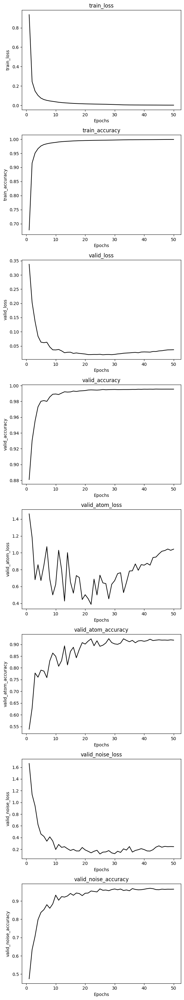

In [12]:
trainer.plot_training_metrics()

In [13]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
train_accuracy,▁▆▆▇▇███████████████████████████████████
train_loss,█▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▃▅▇▇▇▇█▇▇█▇████████████████▇███████████
valid_atom_accuracy,▁▃▅▆▅▅▇▆▆▆▇▆▇▆▇████▇█▇█▇▇▇████▇█████████
valid_atom_loss,█▆▃▃▄▅▂▃▅▄▁▅▂▄▂▂▂▁▂▄▂▃▁▃▃▄▃▃▄▄▅▃▄▄▅▅▅▆▄▆
valid_loss,█▆▄▂▂▂▂▁▂▂▁▂▁▁▁▁▁▁▂▁▁▁▁▂▂▁▂▂▂▂▃▁▁▂▂▂▁▂▂▁
valid_noise_accuracy,▁▃▄▆▆▆▆▇▇▇▇▇▇█▇█████████████████████████
valid_noise_loss,█▆▅▂▂▂▂▁▂▁▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▂▂▂▂
epoch,50


### 5 million dataset

5355017


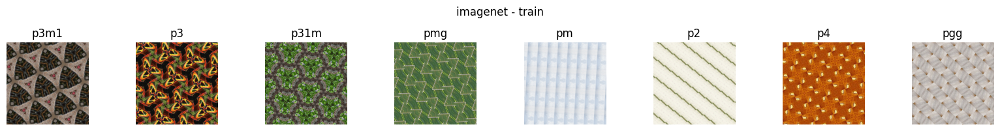

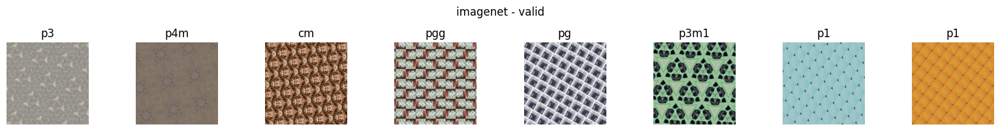

In [14]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
_, imagenet_ds = split_train_valid(imagenet_ds, 0.5, seed=42)
print(len(imagenet_ds))
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.80001, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [15]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [16]:
config = {'dataset': '5m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-5m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')
config = wandb.config

In [17]:
lr = 1e-3
per_epoch = 2
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/20


100%|██████████| 4982/4982 [3:15:40<00:00,  2.36s/it]  


train_loss: 0.4814, train_accuracy: 83.38%
Epoch 2/20


100%|██████████| 4982/4982 [3:16:42<00:00,  2.37s/it]  


train_loss: 0.0937, train_accuracy: 96.96%


100%|██████████| 1246/1246 [19:24<00:00,  1.07it/s]


valid_loss: 0.0595, valid_accuracy: 98.13%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.7554, valid_atom_accuracy: 77.70%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.6348, valid_noise_accuracy: 78.31%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 4982/4982 [3:16:25<00:00,  2.37s/it]  


train_loss: 0.0561, train_accuracy: 98.25%
Epoch 4/20


100%|██████████| 4982/4982 [3:14:23<00:00,  2.34s/it]  


train_loss: 0.0410, train_accuracy: 98.76%


100%|██████████| 1246/1246 [19:24<00:00,  1.07it/s]


valid_loss: 0.0336, valid_accuracy: 98.99%


100%|██████████| 238/238 [03:41<00:00,  1.08it/s]


valid_atom_loss: 1.0239, valid_atom_accuracy: 82.30%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.2474, valid_noise_accuracy: 91.43%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 4982/4982 [3:16:28<00:00,  2.37s/it]  


train_loss: 0.0308, train_accuracy: 99.08%
Epoch 6/20


100%|██████████| 4982/4982 [3:15:35<00:00,  2.36s/it]  


train_loss: 0.0240, train_accuracy: 99.29%


100%|██████████| 1246/1246 [19:07<00:00,  1.09it/s]


valid_loss: 0.0227, valid_accuracy: 99.34%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.6585, valid_atom_accuracy: 85.03%


100%|██████████| 119/119 [01:51<00:00,  1.06it/s]


valid_noise_loss: 0.1800, valid_noise_accuracy: 93.67%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 4982/4982 [3:15:50<00:00,  2.36s/it]  


train_loss: 0.0198, train_accuracy: 99.42%
Epoch 8/20


100%|██████████| 4982/4982 [3:17:30<00:00,  2.38s/it]  


train_loss: 0.0175, train_accuracy: 99.49%


100%|██████████| 1246/1246 [19:03<00:00,  1.09it/s]


valid_loss: 0.0172, valid_accuracy: 99.52%


100%|██████████| 238/238 [03:43<00:00,  1.07it/s]


valid_atom_loss: 0.5566, valid_atom_accuracy: 89.07%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.1403, valid_noise_accuracy: 94.98%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 4982/4982 [3:16:08<00:00,  2.36s/it]  


train_loss: 0.0157, train_accuracy: 99.55%
Epoch 10/20


100%|██████████| 4982/4982 [3:16:27<00:00,  2.37s/it]  


train_loss: 0.0146, train_accuracy: 99.58%


100%|██████████| 1246/1246 [19:13<00:00,  1.08it/s]


valid_loss: 0.0149, valid_accuracy: 99.57%


100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


valid_atom_loss: 0.7086, valid_atom_accuracy: 85.86%


100%|██████████| 119/119 [01:51<00:00,  1.06it/s]


valid_noise_loss: 0.1617, valid_noise_accuracy: 94.50%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 4982/4982 [3:16:38<00:00,  2.37s/it]  


train_loss: 0.0163, train_accuracy: 99.53%
Epoch 12/20


100%|██████████| 4982/4982 [3:15:33<00:00,  2.36s/it]  


train_loss: 0.0126, train_accuracy: 99.64%


100%|██████████| 1246/1246 [19:11<00:00,  1.08it/s]


valid_loss: 0.0142, valid_accuracy: 99.59%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 0.5110, valid_atom_accuracy: 90.48%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.1370, valid_noise_accuracy: 95.82%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 4982/4982 [3:15:39<00:00,  2.36s/it]  


train_loss: 0.0119, train_accuracy: 99.66%
Epoch 14/20


100%|██████████| 4982/4982 [3:15:43<00:00,  2.36s/it]  


train_loss: 0.0112, train_accuracy: 99.68%


100%|██████████| 1246/1246 [19:32<00:00,  1.06it/s]


valid_loss: 0.0130, valid_accuracy: 99.64%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.5872, valid_atom_accuracy: 89.45%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.1165, valid_noise_accuracy: 96.61%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 4982/4982 [3:16:45<00:00,  2.37s/it]  


train_loss: 0.0105, train_accuracy: 99.71%
Epoch 16/20


100%|██████████| 4982/4982 [3:16:23<00:00,  2.37s/it]  


train_loss: 0.0097, train_accuracy: 99.73%


100%|██████████| 1246/1246 [19:10<00:00,  1.08it/s]


valid_loss: 0.0130, valid_accuracy: 99.65%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 0.6085, valid_atom_accuracy: 92.15%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.1522, valid_noise_accuracy: 96.54%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 4982/4982 [3:16:07<00:00,  2.36s/it]  


train_loss: 0.0088, train_accuracy: 99.75%
Epoch 18/20


100%|██████████| 4982/4982 [3:16:19<00:00,  2.36s/it]  


train_loss: 0.0075, train_accuracy: 99.77%


100%|██████████| 1246/1246 [19:06<00:00,  1.09it/s]


valid_loss: 0.0146, valid_accuracy: 99.65%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.8870, valid_atom_accuracy: 91.35%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.2238, valid_noise_accuracy: 96.22%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 4982/4982 [3:16:22<00:00,  2.36s/it]  


train_loss: 0.0063, train_accuracy: 99.79%
Epoch 20/20


100%|██████████| 4982/4982 [3:17:52<00:00,  2.38s/it]  


train_loss: 0.0056, train_accuracy: 99.81%


100%|██████████| 1246/1246 [19:17<00:00,  1.08it/s]


valid_loss: 0.0158, valid_accuracy: 99.65%


100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


valid_atom_loss: 0.9461, valid_atom_accuracy: 90.98%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.2495, valid_noise_accuracy: 96.05%
Model saved at epoch 20


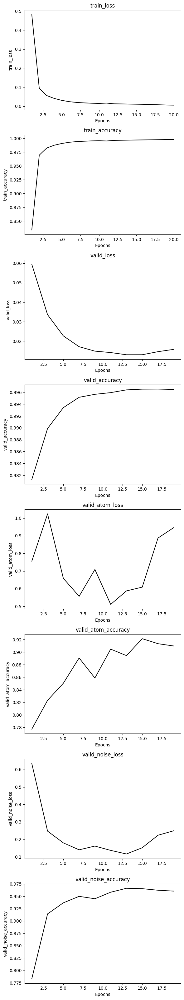

In [18]:
trainer.plot_training_metrics()

In [19]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▆▇▇▇▇████
train_accuracy,▁▅▆█▇▇▇█████████████████████████████████
train_loss,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▁▂▃▅▅▄▅▅▅█▆▇▇▇▆▇▇▇▇█▇▇█▇▇▆▇▇▇▇▇▆█▇▇█▇█▇
valid_atom_accuracy,▃▂▁▂▄▄▄▂▅▅▄▅▇▇▆▇▆▅▅▅▇▇▇▇▆▇▇▆▇██▇▇▇▇▇▇▇▇▆
valid_atom_loss,▄▄▅▄▆▆▆█▃▃▄▄▂▁▃▃▂▄▄▄▂▂▂▂▄▂▂▃▄▂▂▄▅▆▅▄▅▆▆█
valid_loss,▇▆█▆▄▄▅▃▄▅▂▃▂▂▂▃▂▂▁▁▁▃▂▁▁▂▂▂▃▂▂▂▃▂▁▄▁▄▁▂
valid_noise_accuracy,▂▃▁▂▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████████████▇▇██
valid_noise_loss,▇▆█▇▂▃▂▃▂▂▁▂▁▁▁▁▂▂▂▁▂▂▁▁▁▁▁▁▂▂▁▂▂▃▂▃▃▂▃▃
epoch,20


### full size dataset - 10 million

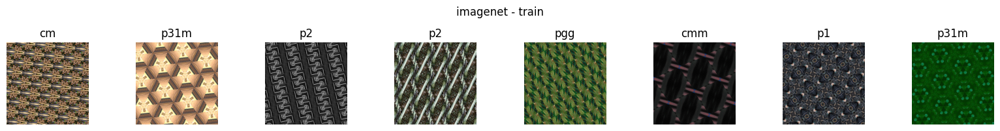

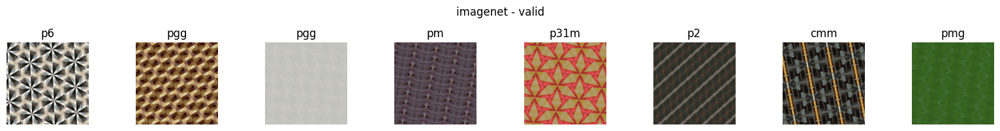

In [20]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

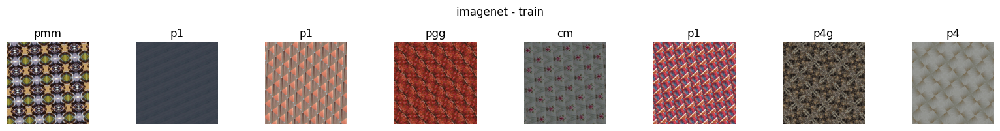

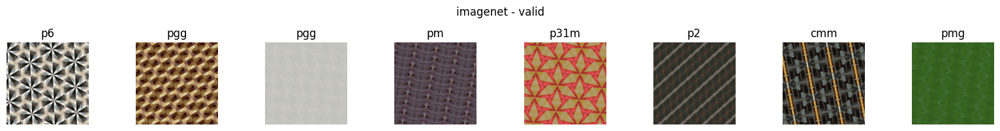

In [21]:
# imagenet
imagenet_ds = hdf5_dataset('../../datasets/imagenet_v5_rot_10m.h5', folder='train', transform=transforms.ToTensor())
train_ds, valid_ds = split_train_valid(imagenet_ds, 0.8, seed=42)
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=n_cpus)
viz_dataloader(train_dl, label_converter=label_converter, title='imagenet - train')
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=n_cpus)
viz_dataloader(valid_dl, label_converter=label_converter, title='imagenet - valid')

In [22]:
model = xcit_small(3, 17)
outputs = model(torch.randn(2,3,256,256))
print(outputs.shape)
model = torch.nn.DataParallel(model, device_ids=[3,4,5,6,8,9])
device = torch.device('cuda:3')
# model

torch.Size([2, 17])


In [23]:
config = {'dataset': '10m datasets',
          'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
NAME = '09302024-XCiT-dataset_v5_size-10m'
wandb.login()
proj_name = 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning'
wandb.init(project=proj_name, entity='yig319', name=NAME, id=NAME, group='dataset_v5_size_vs_records-XCiT', save_code=True, config=config, resume='allow')
config = wandb.config

In [24]:
lr = 1e-3
per_epoch = 1
epoch_start = 0
epochs = 20
loss_func = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))
metrics = [accuracy]  # You can add more metrics if needed
trainer = Trainer(model=model, loss_func=loss_func, optimizer=optimizer, metrics=metrics, scheduler=scheduler, 
                  device=device, save_per_epochs=per_epoch, model_path=f'../../saved_models/{NAME}/', early_stopping_patience=None)

history = trainer.train(train_dl=train_dl, epochs=epochs, epoch_start=epoch_start, valid_per_epochs=per_epoch,
                        valid_dl_list=[valid_dl, atom_dl, noise_dl], valid_dl_names=['', 'atom', 'noise'], tracking=True)

Epoch 1/20


100%|██████████| 9963/9963 [6:35:38<00:00,  2.38s/it]  


train_loss: 0.3088, train_accuracy: 89.43%


100%|██████████| 2491/2491 [38:49<00:00,  1.07it/s]


valid_loss: 0.0721, valid_accuracy: 97.68%


100%|██████████| 238/238 [03:43<00:00,  1.07it/s]


valid_atom_loss: 0.7007, valid_atom_accuracy: 80.26%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.7517, valid_noise_accuracy: 74.54%
Model saved at epoch 1
Epoch 2/20


100%|██████████| 9963/9963 [6:33:18<00:00,  2.37s/it]


train_loss: 0.0546, train_accuracy: 98.29%


100%|██████████| 2491/2491 [38:44<00:00,  1.07it/s]


valid_loss: 0.0403, valid_accuracy: 98.79%


100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


valid_atom_loss: 0.6863, valid_atom_accuracy: 81.21%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.3772, valid_noise_accuracy: 87.45%
Model saved at epoch 2
Epoch 3/20


100%|██████████| 9963/9963 [6:36:27<00:00,  2.39s/it]  


train_loss: 0.0345, train_accuracy: 98.95%


100%|██████████| 2491/2491 [38:25<00:00,  1.08it/s]


valid_loss: 0.0282, valid_accuracy: 99.16%


100%|██████████| 238/238 [03:42<00:00,  1.07it/s]


valid_atom_loss: 0.7861, valid_atom_accuracy: 83.07%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.2381, valid_noise_accuracy: 91.60%
Model saved at epoch 3
Epoch 4/20


100%|██████████| 9963/9963 [6:31:10<00:00,  2.36s/it]  


train_loss: 0.0254, train_accuracy: 99.24%


100%|██████████| 2491/2491 [38:32<00:00,  1.08it/s]


valid_loss: 0.0202, valid_accuracy: 99.41%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 0.7656, valid_atom_accuracy: 84.57%


100%|██████████| 119/119 [01:53<00:00,  1.05it/s]


valid_noise_loss: 0.1799, valid_noise_accuracy: 93.63%
Model saved at epoch 4
Epoch 5/20


100%|██████████| 9963/9963 [6:33:54<00:00,  2.37s/it]  


train_loss: 0.0200, train_accuracy: 99.41%


100%|██████████| 2491/2491 [38:24<00:00,  1.08it/s]


valid_loss: 0.0188, valid_accuracy: 99.46%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.5228, valid_atom_accuracy: 89.02%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.1361, valid_noise_accuracy: 94.61%
Model saved at epoch 5
Epoch 6/20


100%|██████████| 9963/9963 [6:30:58<00:00,  2.35s/it]  


train_loss: 0.0170, train_accuracy: 99.50%


100%|██████████| 2491/2491 [38:31<00:00,  1.08it/s]


valid_loss: 0.0170, valid_accuracy: 99.49%


100%|██████████| 238/238 [03:41<00:00,  1.08it/s]


valid_atom_loss: 0.7887, valid_atom_accuracy: 82.96%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.0979, valid_noise_accuracy: 96.51%
Model saved at epoch 6
Epoch 7/20


100%|██████████| 9963/9963 [6:33:35<00:00,  2.37s/it]  


train_loss: 0.0151, train_accuracy: 99.56%


100%|██████████| 2491/2491 [38:43<00:00,  1.07it/s]


valid_loss: 0.0148, valid_accuracy: 99.57%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 0.6030, valid_atom_accuracy: 87.14%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.1085, valid_noise_accuracy: 96.08%
Model saved at epoch 7
Epoch 8/20


100%|██████████| 9963/9963 [6:32:33<00:00,  2.36s/it]  


train_loss: 0.0139, train_accuracy: 99.60%


100%|██████████| 2491/2491 [38:14<00:00,  1.09it/s]


valid_loss: 0.0146, valid_accuracy: 99.57%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 0.4399, valid_atom_accuracy: 91.31%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.0973, valid_noise_accuracy: 96.34%
Model saved at epoch 8
Epoch 9/20


100%|██████████| 9963/9963 [6:33:15<00:00,  2.37s/it]  


train_loss: 0.0131, train_accuracy: 99.62%


100%|██████████| 2491/2491 [38:20<00:00,  1.08it/s]


valid_loss: 0.0135, valid_accuracy: 99.61%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.6911, valid_atom_accuracy: 87.43%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.0983, valid_noise_accuracy: 96.35%
Model saved at epoch 9
Epoch 10/20


100%|██████████| 9963/9963 [6:33:47<00:00,  2.37s/it]  


train_loss: 0.0125, train_accuracy: 99.64%


100%|██████████| 2491/2491 [38:29<00:00,  1.08it/s]


valid_loss: 0.0128, valid_accuracy: 99.63%


100%|██████████| 238/238 [03:41<00:00,  1.07it/s]


valid_atom_loss: 0.6159, valid_atom_accuracy: 88.20%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.0931, valid_noise_accuracy: 96.69%
Model saved at epoch 10
Epoch 11/20


100%|██████████| 9963/9963 [6:34:20<00:00,  2.37s/it]  


train_loss: 0.0118, train_accuracy: 99.66%


100%|██████████| 2491/2491 [38:23<00:00,  1.08it/s]


valid_loss: 0.0125, valid_accuracy: 99.65%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 0.6464, valid_atom_accuracy: 88.34%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.1169, valid_noise_accuracy: 96.34%
Model saved at epoch 11
Epoch 12/20


100%|██████████| 9963/9963 [6:32:14<00:00,  2.36s/it]  


train_loss: 0.0113, train_accuracy: 99.68%


100%|██████████| 2491/2491 [38:17<00:00,  1.08it/s]


valid_loss: 0.0122, valid_accuracy: 99.65%


100%|██████████| 238/238 [03:41<00:00,  1.08it/s]


valid_atom_loss: 0.5881, valid_atom_accuracy: 91.13%


100%|██████████| 119/119 [01:52<00:00,  1.06it/s]


valid_noise_loss: 0.0661, valid_noise_accuracy: 97.76%
Model saved at epoch 12
Epoch 13/20


100%|██████████| 9963/9963 [6:31:50<00:00,  2.36s/it]  


train_loss: 0.0108, train_accuracy: 99.69%


100%|██████████| 2491/2491 [38:26<00:00,  1.08it/s]


valid_loss: 0.0120, valid_accuracy: 99.66%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.5787, valid_atom_accuracy: 91.46%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.0487, valid_noise_accuracy: 98.40%
Model saved at epoch 13
Epoch 14/20


100%|██████████| 9963/9963 [6:32:46<00:00,  2.37s/it]  


train_loss: 0.0105, train_accuracy: 99.71%


100%|██████████| 2491/2491 [38:25<00:00,  1.08it/s]


valid_loss: 0.0119, valid_accuracy: 99.67%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 0.7535, valid_atom_accuracy: 89.51%


100%|██████████| 119/119 [01:51<00:00,  1.07it/s]


valid_noise_loss: 0.1371, valid_noise_accuracy: 96.51%
Model saved at epoch 14
Epoch 15/20


100%|██████████| 9963/9963 [6:32:11<00:00,  2.36s/it]  


train_loss: 0.0100, train_accuracy: 99.72%


100%|██████████| 2491/2491 [38:20<00:00,  1.08it/s]


valid_loss: 0.0119, valid_accuracy: 99.67%


100%|██████████| 238/238 [03:39<00:00,  1.09it/s]


valid_atom_loss: 0.5044, valid_atom_accuracy: 92.18%


100%|██████████| 119/119 [01:50<00:00,  1.08it/s]


valid_noise_loss: 0.0828, valid_noise_accuracy: 97.82%
Model saved at epoch 15
Epoch 16/20


100%|██████████| 9963/9963 [6:32:24<00:00,  2.36s/it]  


train_loss: 0.0096, train_accuracy: 99.73%


100%|██████████| 2491/2491 [38:36<00:00,  1.08it/s]


valid_loss: 0.0119, valid_accuracy: 99.68%


100%|██████████| 238/238 [03:38<00:00,  1.09it/s]


valid_atom_loss: 0.6612, valid_atom_accuracy: 91.91%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.1000, valid_noise_accuracy: 97.58%
Model saved at epoch 16
Epoch 17/20


100%|██████████| 9963/9963 [6:32:37<00:00,  2.36s/it]  


train_loss: 0.0091, train_accuracy: 99.75%


100%|██████████| 2491/2491 [38:17<00:00,  1.08it/s]


valid_loss: 0.0124, valid_accuracy: 99.68%


100%|██████████| 238/238 [03:39<00:00,  1.09it/s]


valid_atom_loss: 0.6527, valid_atom_accuracy: 92.31%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.1136, valid_noise_accuracy: 97.61%
Model saved at epoch 17
Epoch 18/20


100%|██████████| 9963/9963 [6:31:27<00:00,  2.36s/it]  


train_loss: 0.0084, train_accuracy: 99.76%


100%|██████████| 2491/2491 [38:22<00:00,  1.08it/s]


valid_loss: 0.0130, valid_accuracy: 99.68%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 0.7341, valid_atom_accuracy: 91.75%


100%|██████████| 119/119 [01:50<00:00,  1.07it/s]


valid_noise_loss: 0.1206, valid_noise_accuracy: 97.62%
Model saved at epoch 18
Epoch 19/20


100%|██████████| 9963/9963 [6:32:37<00:00,  2.36s/it]  


train_loss: 0.0076, train_accuracy: 99.77%


100%|██████████| 2491/2491 [38:43<00:00,  1.07it/s]


valid_loss: 0.0136, valid_accuracy: 99.68%


100%|██████████| 238/238 [03:39<00:00,  1.08it/s]


valid_atom_loss: 0.7623, valid_atom_accuracy: 91.91%


100%|██████████| 119/119 [01:53<00:00,  1.05it/s]


valid_noise_loss: 0.1350, valid_noise_accuracy: 97.38%
Model saved at epoch 19
Epoch 20/20


100%|██████████| 9963/9963 [6:32:50<00:00,  2.37s/it]  


train_loss: 0.0071, train_accuracy: 99.78%


100%|██████████| 2491/2491 [38:40<00:00,  1.07it/s]


valid_loss: 0.0138, valid_accuracy: 99.68%


100%|██████████| 238/238 [03:40<00:00,  1.08it/s]


valid_atom_loss: 0.7778, valid_atom_accuracy: 91.86%


100%|██████████| 119/119 [01:53<00:00,  1.05it/s]


valid_noise_loss: 0.1301, valid_noise_accuracy: 97.46%
Model saved at epoch 20


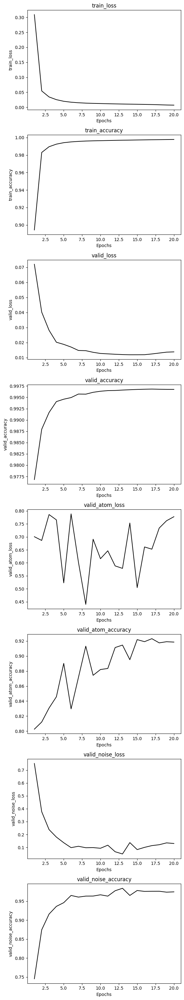

In [25]:
trainer.plot_training_metrics()

In [26]:
wandb.finish()

wandb: WARNING Source type is set to 'repo' but some required information is missing from the environment. A job will not be created from this run. See https://docs.wandb.ai/guides/launch/create-job


epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
records,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▆▇▇▇▇████
train_accuracy,▁▆▆▇▇▇▇██████████▇██████████████████████
train_loss,█▃▃▂▂▂▂▁▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▄▁▅▄▆▇▇▆▆█▆▇▇▇▆▆▇▇▅▆▇▇▇▇▇▇██▇▇████▇▇▇▇▇█
valid_atom_accuracy,▂▁▂▂▄▄▃▄▆▆▄▃▅▅█▆▅▆▆▆▆▇▇▆▇▇▆▆▇█▆▇█▇▇▇▇▇██
valid_atom_loss,▄▅▄▄▅▄▆▅▁▂▄▅▄▂▁▃▄▄▄▄▄▂▃▄▃▃▆▆▃▂▆▄▃▅▅▅█▆▄▅
valid_loss,▅█▅▅▃▂▂▂▂▁▂▂▂▂▃▂▂▁▃▂▁▂▂▃▁▂▁▁▃▂▁▁▁▁▁▃▁▂▂▁
valid_noise_accuracy,▂▁▅▅▆▇▇▇▇▇██▇▇███▇▇█▇▇████▇█████████████
valid_noise_loss,▇█▄▄▂▂▂▂▂▂▁▁▁▂▁▁▁▁▂▁▁▂▁▁▁▁▂▂▁▁▂▁▁▁▂▁▂▂▂▂
epoch,20
